<hr style="border-width:2px;border-color:#75DFC1">
<h1 style = "text-align:center">Mame Diarra DABO, Kaouther Malika DECHICHA, Houda OUADAH </h1> 
<hr style="border-width:2px;border-color:#75DFC1">

## Objectif du Projet

L'objectif principal est d'Étudier les facteurs influençant la gravité des accidents corporels en fonction des caractéristiques du lieu, du véhicule, du conducteur et des conditions d’accident.

## Méthodologie

1. **Traitement des Données :** Nettoyage, gestion des anomalies, et préparation des données pour l'analyse.
2. **Analyse Exploratoire :** Analyse descriptive et visuelle pour comprendre les données à notre disposition.
3. **Modélisation :** Application de techniques de machine learning et d'économétrie pour extraire des modèles et des prédictions à partir des données.
4. **Interprétation :** Évaluation des modèles et analyse des résultats pour dégager des insights et des recommandations

# 1. Les packages

In [1]:
#!pip install missingno

In [2]:
# importer les packages qu'on aura besoin 
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Modèle
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from scipy.cluster.hierarchy import dendrogram, linkage

# metrics
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.feature_selection import RFE

import warnings
warnings.filterwarnings('ignore')

# 2. Importation des données

## 2.1 Gestion du repertoire

In [3]:
# Afficher le repertoire de travail
esp_env = os.getcwd()
print(esp_env)

C:\Users\diarr\Downloads\Projet tutorés


* Nous sommes dans le bon repertoire.
* Maintenant nous allons charger puis afficher les bases de données

## 2.2 Chargement et lecture des données

In [4]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/Bank Marketing")

# Lecture des données
data_bank = pd.read_csv("bank-additional-full.csv", sep = ";", decimal = ".")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_bank.shape)
data_bank.head(5)

(41188, 21)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


* Nous avons 41188 lignes qui représentent chacune à un contact du télémarketing bancaire avec ses différentes caractéristiques qui sont les colonnes au nombre de 21.

In [5]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/BDD Accidents de la circulation")

# Lecture des données
data_usagers = pd.read_csv("usagers-2021.csv", sep = ",")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_usagers.shape)
data_usagers.head(5)

(129189, 15)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
0,202100021165,163Â 830,A01,9,2,4,1,1948.0,0,1,-1,-1,0,0,-1
1,202100020281,165Â 383,A01,1,1,1,2,1965.0,1,1,8,-1,-1,-1,-1
2,202100047336,117Â 153,A01,1,1,4,2,1972.0,0,2,0,-1,-1,-1,-1
3,202100008918,185Â 779,B01,1,1,4,1,1985.0,9,8,0,-1,-1,-1,-1
4,202100009175,185Â 315,A01,1,1,3,1,1960.0,5,1,-1,-1,0,0,-1


* Nous avons 129189 lignes qui correspondent chacune à un accident corporel implique un certain nombre d’usagers avec ses caractéristiques (15 colonnes) comme l'identifiant du véhicule, le sexe, le trajet et autres.

In [6]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/BDD Accidents de la circulation")

# Lecture des données
data_vehicules = pd.read_csv("vehicules-2021.csv", sep = ";", encoding= "latin1")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_vehicules.shape)
data_vehicules.head(5)

(97365, 10)


,id_vehicule,num_veh,senc,catv,obs,obsm,choc,manv,motor,occutc
0,129åÊ983,A01,1,33,0,2,3,1,1,NaN
1,192åÊ850,B01,1,10,0,2,4,2,1,NaN
2,152åÊ776,A01,1,33,0,2,1,3,3,NaN
3,193åÊ398,A01,1,7,0,1,2,1,1,NaN
4,178åÊ605,A01,2,7,0,1,2,1,1,NaN


* Nous avons 97365 véhicules c'est à dire chaque ligne représente un véhicule immatriculé impliqué dans les accidents corporels de la circulation routière avec ses différentes caractéristiques (10 colonnes).

In [7]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/BDD Accidents de la circulation")

# Lecture des données
data_lieux = pd.read_excel("lieux-2021.xls")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_lieux.shape)
data_lieux.head(5)

(56525, 19)


,Num_Acc,dep,catr,voie,v1,v2,circ,nbv,vosp,prof,pr,pr1,plan,lartpc,larrout,surf,infra,situ,vma
0,202100022009,40,1,A63,0,A,3,3,0,1,141,600,1,NaN,-1.0,1,0,1,130
1,202100023746,94,4,VLADIMIR ILLITCH LENINE (AV),0,NaN,-1,2,0,1,0,0,1,NaN,-1.0,1,0,1,50
2,202100019549,2A,2,20,0,T,2,2,0,1,-1,-1,2,NaN,-1.0,1,0,3,80
3,202100022748,75,4,AVENUE SIMON BOLIVAR,0,NaN,2,2,0,2,-1,-1,1,NaN,-1.0,1,0,1,50
4,202100051993,971,3,BOLOGNE (ROUTE DE),0,NaN,2,2,0,1,-1,-1,1,NaN,-1.0,1,0,1,50


* Nous avons 56525 lignes qui correspondent chacune à un lieu principal de l'accident avec ses caractéristiques (19 colonnes) comme l'identifiant de l'accident, la voie, le département et autres.

In [8]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/BDD Accidents de la circulation")

# Lecture des données
data_carac = pd.read_csv("caracteristiques-2021.txt", sep="\t", encoding = "latin1")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_carac.shape)
data_carac.head(5)

(56530, 14)


,Num_Acc,jour,mois,an,hrmn,lum,com,agg,int,atm,col,adr,lat,long
0,202100037733,28,5,2021,14:15,1,CC_97407,2,2,1,3,JEAN MOULIN (RUE) - RIV. DES GALETS,"-20,95888","55,31743"
1,202100049382,2,3,2021,10:59,1,CC_63113,2,1,1,2,SAINT ROBERT (RUE),"45,79137","3,1162"
2,202100038891,20,5,2021,16:50,1,CC_88160,2,2,1,1,POISSOMPRE (FG DE),"48,18261","6,47218"
3,202100028616,14,7,2021,19:45,1,CC_80021,2,1,1,3,CAGNARD (RUE),"49,90355","2,2872"
4,202100033509,17,6,2021,23:40,3,CC_13214,2,1,1,1,A7-Sens Lyon vers Marseille,"43,34031","5,37689"


* Nous avons 56530 lignes qui décrit chacune les circonstances générales de l’accident avec ses caractéristiques (14 colonnes) comme le jour, le mois, l'heure, la latitude, la longitude et autres.

**En Résumé**
* Ces quatre bases de données représentent les données des accidents corporels de la circulation d'une année donnée, est répartie 
en 4 rubriques:  
    * La rubrique CARACTERISTIQUES qui décrit les circonstances générales de l’accident 
    * La rubrique LIEUX qui décrit le lieu principal de l’accident même si celui-ci s’est déroulé à une intersection 
    * La rubrique VEHICULES impliqués 
    * La rubrique USAGERS impliqués 

In [9]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/fremotorclaim de CASDataset")

# Lecture des données
data_freq = pd.read_csv("db_freq.csv", sep = ";")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_freq.shape)
data_freq.head(5)

(62377, 8)


,IDpol,Year,Damage,Fire,Other,Theft,TPL,Windscreen
0,90141098.101a,2003,0,0,0,0,0,0
1,90133410.100a,2003,0,0,0,0,0,0
2,90151918.101b,2003,0,0,0,0,0,0
3,90190826.100b,2003,1,0,0,0,0,0
4,90165899.100a,2004,0,0,0,0,0,0


* IDpol Année Dommages Incendie Autre Vol TPL Pare-brise
* Nous avons 62377 lignes qui correspondent chacune à un type de sinistre avec ses caractéristiques (8 colonnes) comme l'identifiant unique de la police d'assurance, l'année, le type de sinitre.

In [10]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/fremotorclaim de CASDataset")

# Lecture des données
data_prem = pd.read_csv("db_prem.csv", sep = ";")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_prem.shape)
data_prem.head(5)

(53456, 30)


,IDpol,Year,DrivAge,DrivGender,MaritalStatus,BonusMalus,LicenceNb,PayFreq,JobCode,VehAge,VehClass,VehPower,VehGas,VehUsage,Garage,Area,Region,Channel,Marketing,PremWindscreen,PremDamAll,PremFire,PremAcc1,PremAcc2,PremLegal,PremTPLM,PremTPLV,PremServ,PremTheft,PremTot
0,90182572.101a,2004,32,M,NaN,80.0,2,Annual,NaN,NaN,Cheap,P12,Regular,Private+trip to office,Street,A7,Headquarters,B,M4,58,0,13,0,56,13,"260,2",14,57,130,"601,2"
1,90104346.102b,2003,37,M,Single,50.0,2,Annual,Private employee,12.0,Cheapest,P11,Regular,Private+trip to office,Closed zbox,A9,Headquarters,A,M1,13,0,0,0,0,8,"96,1",5,49,0,"171,1"
2,90134055.100b,2004,36,F,NaN,88.0,2,Half-yearly,NaN,8.0,Expensive,P16,Diesel,Private+trip to office,Opened collective parking,A2,Center,L,M2,164,0,0,0,48,16,"355,6",19,49,0,"651,6"
3,90144845.100a,2004,45,M,NaN,50.0,1,Monthly,NaN,7.0,Cheapest,P11,Regular,Private+trip to office,Street,A7,South West,A,M4,16,0,4,0,58,11,"141,3",8,60,51,"349,3"
4,90132238.100a,2003,51,M,NaN,50.0,3,Half-yearly,NaN,5.0,Cheap,P13,Diesel,Private+trip to office,Closed zbox,A5,Center,A,M1,31,161,5,0,53,12,"143,7",8,53,53,"519,7"


* Nous avons 53456 lignes qui représente chacune un assuré automobile avec le type de sinistre ainsi ses caractéristiques (30 colonnes) sur la l'identifiant unique de la police d'assurance, les caractéristiques de l'assuré et du véhicule.

In [11]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/fremotorclaim de CASDataset")

# Lecture des données
data_sev = pd.read_csv("db_sev-copie.csv", sep = ";")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_sev.shape)
data_sev.head(5)

(13609, 5)


,IDpol,OccurDate,Payment,IDclaim,Guarantee
0,90256234.101d,13/08/2003,598,203395,Windscreen
1,90107141.101a,09/11/2003,231,207040,Windscreen
2,90149724.101a,06/06/2004,367,1202234,TPL
3,90185828.101a,21/07/2003,236,201766,TPL
4,90126140.101b,24/09/2003,440,205318,Theft


In [12]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/fremotorclaim de CASDataset")

# Lecture des données
data_sev = pd.read_csv("db_sev-copie.csv", sep = ";")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_sev.shape)
data_sev.head(5)

(13609, 5)


,IDpol,OccurDate,Payment,IDclaim,Guarantee
0,90256234.101d,13/08/2003,598,203395,Windscreen
1,90107141.101a,09/11/2003,231,207040,Windscreen
2,90149724.101a,06/06/2004,367,1202234,TPL
3,90185828.101a,21/07/2003,236,201766,TPL
4,90126140.101b,24/09/2003,440,205318,Theft


* Date d'occurrence de l'IDpol Paiement Garantie IDclaim
* Nous avons 13609 lignes qui correspondent chacune à un sinistre c'est à dire l’historique des paiements de sinistres effectués par l’assureur avec ses caractéristiques (5 colonnes) comme l'identifiant du sinistre, la garantie etc....

**En Résumé**
* Ces trois bases de données représentent les données sur:  
    * Les différents type de sinistre avec leur fréquence
    * Les assurés automobiles
    * L'identifiant du sinistre avec les garanties

In [13]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/Telematics")

# Lecture des données
data_cnt = pd.read_excel("DB_CNT.xlsx", sheet_name = "DB_CNT")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_cnt.shape)
data_cnt.head(5)

(100399, 13)


,Id_pol,Duration,Insured.age,Insured.sex,Car.age,Marital,Car.use,Credit.score,Region,Annual.miles.drive,Years.noclaims,Territory,age-YNC
0,121744,365,59,Female,5,Single,Private,491.0,Urban,12427.42,40,77,19.0
1,123584,182,32,F,10,Married,Private,730.0,Rural,6213.71,4,89,28.0
2,133223,365,59,F,9,Single,Commute,689.0,Rural,12427.42,41,85,18.0
3,124356,237,54,Male,8,Married,Commute,794.0,Urban,6213.71,37,70,17.0
4,192713,365,40,Female,0,Married,Commute,880.0,Urban,12427.42,8,76,32.0


* Nous avons 100399 polices d'assurances automobiles (base de souscription assurés auto) avec des informations (13 colonnes) sur l'identifiant unique, l'exposition, l'âge du véhicule, le type d'usage etc...

In [14]:
# Changer de repertoire
os.chdir("C:/Users/diarr/Downloads/Projet tutorés/Telematics")

# Lecture des données
data_sin = pd.read_csv("DB_SIN.txt", sep = "\t")
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
print(data_sin.shape)
data_sin.head(5)

(4337, 3)


,Id_pol,NB_Claim,AMT_Claim
0,212433,1,"1137,079102"
1,124370,1,"3170,102051"
2,208357,1,"3753,909668"
3,141403,1,"16,03637695"
4,173366,1,"41774,71289"


* Il s'agit de la base des sinistres avec 4337 lignes qui représentent chacune un sinistre avec leur identifiaant, le nombre de sinistre et le montant du sinistre.

**Nous avons réussi à afficher toutes nos différentes bases de données;**

**Maintenant passons à l'analyse exploiratoire des données.**

# 3. Analyse exploratoire des données

## 3.1. Analyse structurelle: Description et nettoyage des données

**Nous allons définir quelques fonctions pour évaluer la qualité des données**

In [15]:
# Afficher les informations sur les colonnes
def info(Data):
    return Data.info()
    
# Afficher le nombre de ligne
def nombre_ligne(Data):
    return len(Data)

# Afficher le nombre de colonnes
def nombre_columns(Data):
    return len(Data.columns)

# Afficher les valeurs manquants
def valeurs_manquants(Data):
    return Data.isna().sum().sum()

# Affichage du type de variables
def type_variable(Data):
    return Data.dtypes.value_counts()

# Mesurer le pourcentage de valeurs manquants
def pourcentage_valeurs_manquants(Data):
    return (Data.isna().sum()/Data.shape[0]).sort_values(ascending=True)

# Eliminer les variables supérieurs à 80% de valeurs manquants
def nouvel_data(Data):
    return Data[Data.columns[Data.isna().sum()/Data.shape[0] < 0.8]]

# Le nombre de lignes dupliquées
def nombre_lignes_duplicate(Data):
    return len(Data)-len(Data.drop_duplicates())

#Statistiques descriptives
def stats(Data):
    return Data.describe(include = "all")

* Aprés avoir définie quelques fonctions pour évaluer la qualités des données, nous faire appelle à ces fonctions en les appliquant sur chacune de nos bases de données

### 3.1.a) Base télémarketing bancaire

In [16]:
# Faire une copie de la base pour garder la base d'origine
df_mark = data_bank.copy()
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 30)
# Affichage aprés copie
df_mark.head(5)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


### Qualité des données

In [17]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_mark))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_mark))
print("=============================================")
print("Information sur les colonnes:", df_mark.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_mark))
print("=============================================")
print("Types de variables:", type_variable(df_mark))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_mark))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_mark))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_mark))

Nombre de lignes: 41188
Nombre de colonnes: 21
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-nul

* Nous n'avons pas de valeurs manquantes dans la base de données
* Toutes les variables sont au bon format.
* Présence de doublons purs
* Passons à la gestion des doublons afin de les traiter

### Gestion des doublons

In [18]:
# Nombre de doublons purs/parfaits sans la clé primaire
sum(df_mark.duplicated())

12

In [19]:
# Nombre de doublons purs/parfaits avec la clé primaire
sum(df_mark.duplicated(["duration"]))

39644

In [20]:
# Nombre de doublons purs/parfaits avec la clé primaire
# Obtenir le nombre de doublons
len(df_mark)-df_mark["duration"].nunique()

39644

* Sur les 41188 lignes, nous n'avons que 12 doublons purs et les autres s'agissent des doublons impurs
* Vérifions de quelles colonnes (variables) se distinguent-ils les doublons purs.

In [21]:
# Afficher les doublons
# Avec le keep = false on aura les deux lignes pour choisir la bonne
doublons_mark = df_mark[df_mark.duplicated(keep = False)].sort_values("duration")
pd.set_option('display.max_columns', 30)
# Afficher les 12 premières lignes
print(doublons_mark.shape)
doublons_mark.head(12)

(24, 21)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
20216,55,services,married,high.school,unknown,no,no,cellular,aug,mon,33,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
20072,55,services,married,high.school,unknown,no,no,cellular,aug,mon,33,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
12260,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
28477,24,services,single,high.school,no,yes,no,cellular,apr,tue,114,1,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,no
28476,24,services,single,high.school,no,yes,no,cellular,apr,tue,114,1,999,0,nonexistent,-1.8,93.075,-47.1,1.423,5099.1,no
38255,71,retired,single,university.degree,no,no,no,telephone,oct,tue,120,1,999,0,nonexistent,-3.4,92.431,-26.9,0.742,5017.5,no
38281,71,retired,single,university.degree,no,no,no,telephone,oct,tue,120,1,999,0,nonexistent,-3.4,92.431,-26.9,0.742,5017.5,no


* Celà confirme que nous avons des doublons purs , donc nous allons va les supprimer afin de garder une ligne de chacune de chacune de ces lignes.

In [22]:
# Suppression des doublons
# keep = firt pour dire que la 1ère ligne est la bonne
doublons_mark = df_mark.drop_duplicates(keep = "first").reset_index(drop=True)
print("Le nombre de lignes restantes aprés suppression des doublons est de: ", doublons_mark.shape)

Le nombre de lignes restantes aprés suppression des doublons est de:  (41176, 21)


* Maintenant que nous avons supprimer toutes les doublons, passons à la gestion des données manquantes.

### Gestion des données manquantes

* Pour une meilleure affichage de nos données manquantes dans chacune de nos variables, nous allons faire la visualisation afin de voir le nombre maximal de valeurs manquantes

<AxesSubplot: >

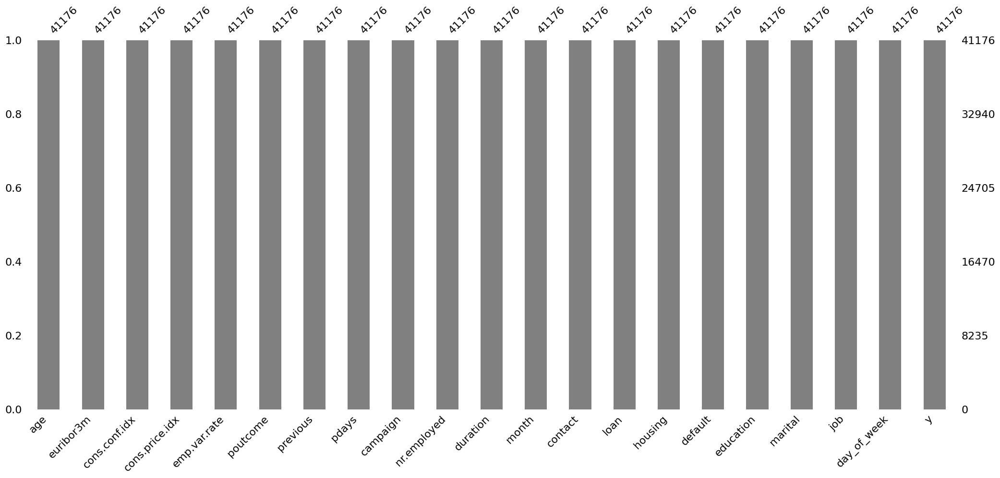

In [23]:
# Faire une copie
df_mark = doublons_mark.copy()

# Visualisation de tout notre dataset
msno.bar(df_mark, sort= "ascending", color= "grey")

* Nous n'avons pas de valeurs manquantes.

### Gestion des données incohérentes

In [24]:
# Typage des données
df_mark.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41176 entries, 0 to 41175
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41176 non-null  int64  
 1   job             41176 non-null  object 
 2   marital         41176 non-null  object 
 3   education       41176 non-null  object 
 4   default         41176 non-null  object 
 5   housing         41176 non-null  object 
 6   loan            41176 non-null  object 
 7   contact         41176 non-null  object 
 8   month           41176 non-null  object 
 9   day_of_week     41176 non-null  object 
 10  duration        41176 non-null  int64  
 11  campaign        41176 non-null  int64  
 12  pdays           41176 non-null  int64  
 13  previous        41176 non-null  int64  
 14  poutcome        41176 non-null  object 
 15  emp.var.rate    41176 non-null  float64
 16  cons.price.idx  41176 non-null  float64
 17  cons.conf.idx   41176 non-null 

#### Variable quantitative

In [25]:
# Statistique descriptive des variables quantitatives uniquement
df_mark.describe(include = [np.number]).T

,count,mean,std,min,25%,50%,75%,max
age,41176.0,40.023800,10.420680,17.000,32.000,38.000,47.000,98.000
duration,41176.0,258.315815,259.305321,0.000,102.000,180.000,319.000,4918.000
campaign,41176.0,2.567879,2.770318,1.000,1.000,2.000,3.000,56.000
pdays,41176.0,962.464810,186.937102,0.000,999.000,999.000,999.000,999.000
previous,41176.0,0.173013,0.494964,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41176.0,0.081922,1.570883,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41176.0,93.575720,0.578839,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41176.0,-40.502863,4.627860,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41176.0,3.621293,1.734437,0.634,1.344,4.857,4.961,5.045
nr.employed,41176.0,5167.034870,72.251364,4963.600,5099.100,5191.000,5228.100,5228.100


* D'aprés la description statistique des variables, nous avons des valeurs négatives **emp.var.rate (Taux de variation de l'emploi)** et dans **cons.conf.idx (Indice de confiance des consommateurs)** qui ne sont pas des anomalies:
    * Cette variable **emp.var.rate** représente le changement du taux d'emploi (en pourcentage). Un chiffre négatif signifie une baisse de l'emploi — ce qui est économiquement cohérent, surtout en période de crise.
    * Cet indice **cons.conf.idx** est souvent exprimé en valeurs négatives, car il mesure le pessimisme/optimisme des consommateurs (en particulier en Europe). Une valeur comme -50 indique un très grand pessimisme.

**Les variables avec des valeurs négatives (emp.var.rate et cons.conf.idx) sont parfaitement normales dans le contexte économique.**

In [26]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_mark.select_dtypes("number").columns:
    print("=========================================")
    print(df_mark[i].value_counts(dropna=False), "\n", df_mark[i].value_counts(dropna=False, normalize = True))

age
31    1947
32    1845
33    1833
36    1779
35    1758
      ... 
89       2
91       2
94       1
87       1
95       1
Name: count, Length: 78, dtype: int64 
 age
31    0.047285
32    0.044808
33    0.044516
36    0.043205
35    0.042695
        ...   
89    0.000049
91    0.000049
94    0.000024
87    0.000024
95    0.000024
Name: proportion, Length: 78, dtype: float64
duration
90      170
85      170
136     168
73      167
124     163
       ... 
1569      1
1053      1
1263      1
1169      1
1868      1
Name: count, Length: 1544, dtype: int64 
 duration
90      0.004129
85      0.004129
136     0.004080
73      0.004056
124     0.003959
          ...   
1569    0.000024
1053    0.000024
1263    0.000024
1169    0.000024
1868    0.000024
Name: proportion, Length: 1544, dtype: float64
campaign
1     17634
2     10568
3      5340
4      2650
5      1599
6       979
7       629
8       400
9       283
10      225
11      177
12      125
13       92
14       69
17       58
16    

**Gestion de la variable âge**

* On remarque l'âge minimum est de 17ans et l'âge maximum est de 98ans,
* Faisons un filtre afin d'identifier le nombre de lignes concernées.

In [27]:
# Affichons le minimum et le maximum 
print("L'âge minimum est" , df_mark["age"].min())
print("L'âge maximum est" , df_mark["age"].max())

L'âge minimum est 17
L'âge maximum est 98


In [28]:
# filtre en isolant les anomalies
df_anomalie_age = df_mark[(df_mark["age"] < 18) | (df_mark["age"] >= 98)]
print(df_anomalie_age.shape)
df_anomalie_age

(7, 21)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
37129,17,student,single,unknown,no,yes,no,cellular,aug,wed,432,3,4,2,success,-2.9,92.201,-31.4,0.884,5076.2,no
37528,17,student,single,basic.9y,no,yes,no,cellular,aug,fri,182,2,999,2,failure,-2.9,92.201,-31.4,0.869,5076.2,no
37547,17,student,single,basic.9y,no,yes,no,cellular,aug,fri,92,3,4,2,success,-2.9,92.201,-31.4,0.869,5076.2,no
37568,17,student,single,basic.9y,no,unknown,unknown,cellular,aug,fri,498,2,999,1,failure,-2.9,92.201,-31.4,0.869,5076.2,yes
38263,17,student,single,unknown,no,no,yes,cellular,oct,tue,896,1,2,2,success,-3.4,92.431,-26.9,0.742,5017.5,yes
38440,98,retired,married,basic.4y,unknown,yes,no,cellular,oct,fri,476,1,2,2,success,-3.4,92.431,-26.9,0.730,5017.5,yes
38443,98,retired,married,basic.4y,unknown,yes,no,cellular,oct,fri,272,2,999,0,nonexistent,-3.4,92.431,-26.9,0.730,5017.5,yes


* Nous n'avons que 7 lignes qui sont des contacts mineurs et pour faire de la souscription l'âge minimum est de 18, alors nous allons considérer ces contact comme des valeurs incohérentes afin de les remplacer par l'âge median des valeurs valides.

In [29]:
# Calcul de la médiane des valeurs normales
med_duration_age = df_mark[df_mark["age"] >= 18]["age"].median()
print(f"Médiane (valeurs normales) = {med_duration_age}")

Médiane (valeurs normales) = 38.0


In [30]:
# remplacer les valeurs < 18 par la médiane
df_mark.loc[df_mark["age"] < 18, "age"] = med_duration_age

In [31]:
# Convertir au bon format
df_mark["age"] = df_mark["age"].astype(int)

In [32]:
# Statistique descriptive des variables quantitatives uniquement
df_mark.describe(include = [np.number]).T

,count,mean,std,min,25%,50%,75%,max
age,41176.0,40.026350,10.417614,18.000,32.000,38.000,47.000,98.000
duration,41176.0,258.315815,259.305321,0.000,102.000,180.000,319.000,4918.000
campaign,41176.0,2.567879,2.770318,1.000,1.000,2.000,3.000,56.000
pdays,41176.0,962.464810,186.937102,0.000,999.000,999.000,999.000,999.000
previous,41176.0,0.173013,0.494964,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41176.0,0.081922,1.570883,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41176.0,93.575720,0.578839,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41176.0,-40.502863,4.627860,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41176.0,3.621293,1.734437,0.634,1.344,4.857,4.961,5.045
nr.employed,41176.0,5167.034870,72.251364,4963.600,5099.100,5191.000,5228.100,5228.100


**Remarque sur la variable **pdays****

In [33]:
# Affichage des lignes avec 0
df_mark_day0 = df_mark.loc[df_mark['pdays'] == 0]
print(df_mark_day0.shape)

(15, 21)


In [34]:
# Affichage des lignes avec 999
df_mark_day999 = df_mark.loc[df_mark['pdays'] == 999]
print(df_mark_day999.shape)

(39661, 21)


* Toutes nos variables quantitatives nous semblent cohérentes, passons aux variables qualitatives.

#### Variable qualitative

In [35]:
# Statistique descriptive des variables qualitatives uniquement
df_mark.describe(exclude = [np.number]).T

,count,unique,top,freq
job,41176,12,admin.,10419
marital,41176,4,married,24921
education,41176,8,university.degree,12164
default,41176,3,no,32577
housing,41176,3,yes,21571
loan,41176,3,no,33938
contact,41176,2,cellular,26135
month,41176,10,may,13767
day_of_week,41176,5,thu,8618
poutcome,41176,3,nonexistent,35551


In [36]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_mark.select_dtypes("object").columns:
    print("=========================================")
    print(df_mark[i].value_counts(dropna=False), "\n", df_mark[i].value_counts(dropna=False, normalize = True))

job
admin.           10419
blue-collar       9253
technician        6739
services          3967
management        2924
retired           1718
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64 
 job
admin.           0.253036
blue-collar      0.224718
technician       0.163663
services         0.096343
management       0.071012
retired          0.041723
entrepreneur     0.035360
self-employed    0.034510
housemaid        0.025743
unemployed       0.024626
student          0.021250
unknown          0.008014
Name: proportion, dtype: float64
marital
married     24921
single      11564
divorced     4611
unknown        80
Name: count, dtype: int64 
 marital
married     0.605231
single      0.280843
divorced    0.111983
unknown     0.001943
Name: proportion, dtype: float64
education
university.degree      12164
high.school             9512
basic.9y                6045
professional.

* Nous constatons qu'il y'a plusieurs valeurs manquantes sont présentes dans certains attributs catégoriels, toutes codées avec l'étiquette « unknown ».
* Supprimer ces valeurs manquantes peuvent nous faire perdre beaucoup d'informations, pour celà nous allons les traiter par des techniques d'imputation.
    * **L'imputation des colonnes de moins de valeurs manquantes:** On peut faire directement une imputation avec le mode() de la variable.
    * **L'imputation des colonnes avec plusieurs valeurs manquantes et/ou y'a plus de deux modalités:** Pour celà nous essayer de faire une imputation en réalisant un tirage aléatoire des différentes modalités afin de remplacer ces valeurs manquantes.

**Les colonnes avec moins de valeurs manquantes**

* Pour cette imputation le mode est majoritaire.

In [37]:
# le type de la colonne 
type(df_mark.job[30])

str

In [38]:
# Accedér à la modalité avec [0]
df_mark.job.mode()[0]

'admin.'

In [39]:
# Imputation avec les variables à une VM
df_mark.loc[df_mark["marital"] == "unknown", "marital"] = df_mark["marital"].mode()[0]
df_mark.loc[df_mark["default"] == "unknown", "default"] = df_mark["default"].mode()[0]
df_mark.loc[df_mark["housing"] == "unknown", "housing"] = df_mark["housing"].mode()[0]
df_mark.loc[df_mark["loan"] == "unknown", "loan"] = df_mark["loan"].mode()[0]

**Les colonnes avec plusieurs valeurs manquantes et/ou y'a plus de deux modalités**

* Pour ces variables nous ne pouvons pas faire une imputation avec le mode() car il n'est pas majoritaire;
* Pour celà nous essayer de faire une imputation en réalisant un tirage aléatoire des différentes modalités afin de remplacer ces valeurs manquantes.

In [40]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_job = df_mark['job'].value_counts(normalize = True)
Mod_education = df_mark['education'].value_counts(normalize = True)

In [41]:
# Appliquons une fonction à la variable avec la fonction lambda
df_mark['job'] = df_mark['job'].apply(lambda x: 
                   np.random.choice(Mod_job.index, size = 1, 
                                    p = Mod_job.values)[0] if x == "unknown" else x)

In [42]:
# Appliquons une fonction à la variable avec la fonction lambda
df_mark['education'] = df_mark['education'].apply(lambda x: 
                   np.random.choice(Mod_education.index, size = 1, 
                                    p = Mod_education.values)[0] if x == "unknown" else x)

In [43]:
# Tableau de contingence aprés l'application de la fonction lambda
print(df_mark['job'].value_counts(dropna = False, normalize = True))
print("=============================================")
print(df_mark['education'].value_counts(dropna = False, normalize = True))

job
admin.           0.254833
blue-collar      0.226418
technician       0.165169
services         0.097290
management       0.071644
retired          0.042185
entrepreneur     0.035482
self-employed    0.034802
housemaid        0.025913
unemployed       0.024723
student          0.021517
unknown          0.000024
Name: proportion, dtype: float64
education
university.degree      0.308116
high.school            0.240358
basic.9y               0.152807
professional.course    0.133014
basic.4y               0.105498
basic.6y               0.058189
unknown                0.001579
illiterate             0.000437
Name: proportion, dtype: float64


In [44]:
# Vérification statistique descriptive aprés imputation
df_mark.describe(exclude = [np.number]).T

,count,unique,top,freq
job,41176,12,admin.,10493
marital,41176,3,married,25001
education,41176,8,university.degree,12687
default,41176,2,no,41173
housing,41176,2,yes,22561
loan,41176,2,no,34928
contact,41176,2,cellular,26135
month,41176,10,may,13767
day_of_week,41176,5,thu,8618
poutcome,41176,3,nonexistent,35551


**Remarque sur la variable "month"**

* On remarque l'bsence du mois de Janvier et Février, celà peut être s'expliquer que la campagne a commencé à parir du mois de Mars jusqu'au mois de Décembre. 

In [45]:
# Statistique descriptive aprés traitement de valeurs abberrantes
df_mark.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41176.0,40.026350,10.417614,18.000,32.000,38.000,47.000,98.000
duration,41176.0,258.315815,259.305321,0.000,102.000,180.000,319.000,4918.000
campaign,41176.0,2.567879,2.770318,1.000,1.000,2.000,3.000,56.000
pdays,41176.0,962.464810,186.937102,0.000,999.000,999.000,999.000,999.000
previous,41176.0,0.173013,0.494964,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41176.0,0.081922,1.570883,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41176.0,93.575720,0.578839,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41176.0,-40.502863,4.627860,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41176.0,3.621293,1.734437,0.634,1.344,4.857,4.961,5.045
nr.employed,41176.0,5167.034870,72.251364,4963.600,5099.100,5191.000,5228.100,5228.100


In [46]:
# Typage des données
df_mark.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41176 entries, 0 to 41175
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41176 non-null  int32  
 1   job             41176 non-null  object 
 2   marital         41176 non-null  object 
 3   education       41176 non-null  object 
 4   default         41176 non-null  object 
 5   housing         41176 non-null  object 
 6   loan            41176 non-null  object 
 7   contact         41176 non-null  object 
 8   month           41176 non-null  object 
 9   day_of_week     41176 non-null  object 
 10  duration        41176 non-null  int64  
 11  campaign        41176 non-null  int64  
 12  pdays           41176 non-null  int64  
 13  previous        41176 non-null  int64  
 14  poutcome        41176 non-null  object 
 15  emp.var.rate    41176 non-null  float64
 16  cons.price.idx  41176 non-null  float64
 17  cons.conf.idx   41176 non-null 

### 3.1.b) Base de données des accidents corporels de la circulation

In [47]:
# faire une copie pour garder la base d'origine
df_acc = data_usagers.copy()
df_acc.head(5)

,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
0,202100021165,163Â 830,A01,9,2,4,1,1948.0,0,1,-1,-1,0,0,-1
1,202100020281,165Â 383,A01,1,1,1,2,1965.0,1,1,8,-1,-1,-1,-1
2,202100047336,117Â 153,A01,1,1,4,2,1972.0,0,2,0,-1,-1,-1,-1
3,202100008918,185Â 779,B01,1,1,4,1,1985.0,9,8,0,-1,-1,-1,-1
4,202100009175,185Â 315,A01,1,1,3,1,1960.0,5,1,-1,-1,0,0,-1


### Qualité des données

In [48]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_acc))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_acc))
print("=============================================")
print("Information sur les colonnes:", df_acc.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_acc))
print("=============================================")
print("Types de variables:", type_variable(df_acc))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_acc))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_acc))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_acc))

Nombre de lignes: 129189
Nombre de colonnes: 15
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129189 entries, 0 to 129188
Data columns (total 15 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Num_Acc      129189 non-null  int64  
 1   id_vehicule  129189 non-null  object 
 2   num_veh      129189 non-null  object 
 3   place        129189 non-null  int64  
 4   catu         129189 non-null  int64  
 5   grav         129189 non-null  int64  
 6   sexe         129189 non-null  int64  
 7   an_nais      126122 non-null  float64
 8   trajet       129189 non-null  int64  
 9   secu1        129189 non-null  int64  
 10  secu2        129189 non-null  int64  
 11  secu3        129189 non-null  int64  
 12  locp         129189 non-null  int64  
 13  actp         129189 non-null  object 
 14  etatp        129189 non-null  int64  
dtypes: float64(1), int64(11), object(3)
memory usage: 14.8+ MB
Information sur les colonnes: None
Total des v

* Nous avons seulement une variable avec des valeurs manquantes et qui correspond à l'année de naissance de l'usager.
* Il y'a aussi cette même variable **an_nais** qui n'est pas au bon format car elle doit être au format numérique au lieu du format float (valeurs avec des virgurle.
* Nous le mettrons au bon format aprés avoir traiter ces valeurs manquantes de la colonne.

### Gestion des doublons

In [49]:
# Nombre de doublons purs/parfaits sans la clé primaire
sum(df_acc.duplicated())

33

In [50]:
# Nombre de doublons purs/parfaits avec la clé primaire
sum(df_acc.duplicated("Num_Acc"))

72668

In [51]:
# Nombre de doublons purs/parfaits avec la clé primaire
sum(df_acc.duplicated("id_vehicule"))

31880

In [52]:
# Nombre de doublons purs/parfaits avec la clé primaire
sum(df_acc.duplicated("num_veh"))

129136

* Sur les 129189 lignes, nous n'avons que 33 doublons purs
* les autres doublons s'agissent des doublons impurs par exemple sur 129189 lignes nous avons 72668 doublons impurs qui correspondent à l'Identifiant de l’accident, 31880 lignes qui correspondent à l''dentifiant unique du véhicule etc...
* Vérifions de quelles colonnes (variables) se distinguent-ils les doublons purs.

In [53]:
# Afficher les doublons
doublons_acc = df_acc[df_acc.duplicated(keep = False)].sort_values("Num_Acc")
# Afficher les 6 première lignes
print(doublons_acc.shape)
doublons_acc.head(33)

(66, 15)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
72758,202100001471,199Â 156,B01,1,1,1,1,1995.0,9,1,0,-1,-1,-1,-1
55476,202100001471,199Â 156,B01,1,1,1,1,1995.0,9,1,0,-1,-1,-1,-1
28399,202100003260,195Â 936,A01,10,3,4,2,2002.0,5,0,-1,-1,3,3,2
108756,202100003260,195Â 936,A01,10,3,4,2,2002.0,5,0,-1,-1,3,3,2
77041,202100006907,189Â 424,A01,2,2,4,1,1998.0,5,1,0,-1,-1,-1,-1
22784,202100006907,189Â 424,A01,2,2,4,1,1998.0,5,1,0,-1,-1,-1,-1
99394,202100007210,188Â 867,A01,10,3,4,1,1982.0,0,0,-1,-1,4,3,1
68841,202100007210,188Â 867,A01,10,3,4,1,1982.0,0,0,-1,-1,4,3,1
77058,202100011570,181Â 042,A01,3,2,4,1,2004.0,0,1,-1,-1,-1,-1,-1
61772,202100011570,181Â 042,A01,3,2,4,1,2004.0,0,1,-1,-1,-1,-1,-1


* On voit bien qu'il s'agit des doublons purs, nous allons garder la première occurence comme étant bonne puis supprimer la deuxième.

In [54]:
# Afficher les doublons
doublons_acc = df_acc[df_acc.duplicated(["Num_Acc", "id_vehicule", "num_veh"] , keep = False)].sort_values("Num_Acc")
# Afficher les 15 première lignes
print(doublons_acc.shape)
doublons_acc.head(15)

(55864, 15)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
88804,202100000003,201Â 761,A01,10,3,3,2,1959.0,4,0,-1,-1,3,3,1
23858,202100000003,201Â 761,A01,1,1,1,1,1995.0,1,1,0,-1,0,0,-1
19196,202100000007,201Â 750,B01,1,1,1,1,2001.0,5,1,5,-1,-1,-1,-1
104754,202100000007,201Â 750,B01,4,2,4,2,2002.0,0,1,0,-1,-1,-1,-1
59028,202100000008,201Â 748,B01,2,2,4,2,1984.0,5,8,-1,-1,0,0,-1
55016,202100000008,201Â 748,B01,1,1,3,1,1972.0,5,2,-1,-1,0,0,-1
96937,202100000009,201Â 747,B01,1,1,1,1,1935.0,5,1,0,-1,-1,-1,-1
2826,202100000009,201Â 747,B01,2,2,4,2,1936.0,5,1,0,-1,-1,-1,-1
106242,202100000010,201Â 745,B01,8,2,4,2,1960.0,5,8,8,-1,-1,-1,-1
22345,202100000010,201Â 745,B01,1,1,4,2,1994.0,4,1,8,-1,-1,-1,-1


* Les doublons impurs se différencient de toutes les variables à l'exception:
    * **Num_Acc** : Identifiant de l’accident identique , 
    * **id_vehicule** : Identifiant unique du véhicule,
    * **num_veh** : Identifiant du véhicule.
* Ceux ci nous semble normale ces doublons car lors d'un accident il peuvent avoir plusieurs usagers aux lieux, ils vont avoir les mêmes identifiant d'accident et même identifiant véhicule et ceux qui les différencient s'agissent:
  * la place occupée dans le véhicule par l'usager au moment de l'accident,
  * Catégorie d'usager ,
  * Gravité de blessure de l'usager
  * Sexe de l'usager
  * Année de naissance de l'usager etc...
* Dans ce cas nous n'allons pas supprimer les doublons impurs mais plutôt les garder car en regardant les numéros d'identification. On peut les considérer comme des fausses doublons. Pour celà nous allons supprimer les doublons purs.

In [55]:
# Suppression des doublons
# keep = firt pour dire que la 1ère ligne est la bonne
doublons_acc = df_acc.drop_duplicates(keep = "first").reset_index(drop=True)
print("Le nombre de lignes restantes aprés suppression des doublons est de: ", doublons_acc.shape)

Le nombre de lignes restantes aprés suppression des doublons est de:  (129156, 15)


In [56]:
#faire une copie
df_acc = doublons_acc.copy()

### Gestion des données manquantes

* Nous allons faire une affichage afin de mieux visualiser les valeurs manquantes dans chacune des colonnes.

<AxesSubplot: >

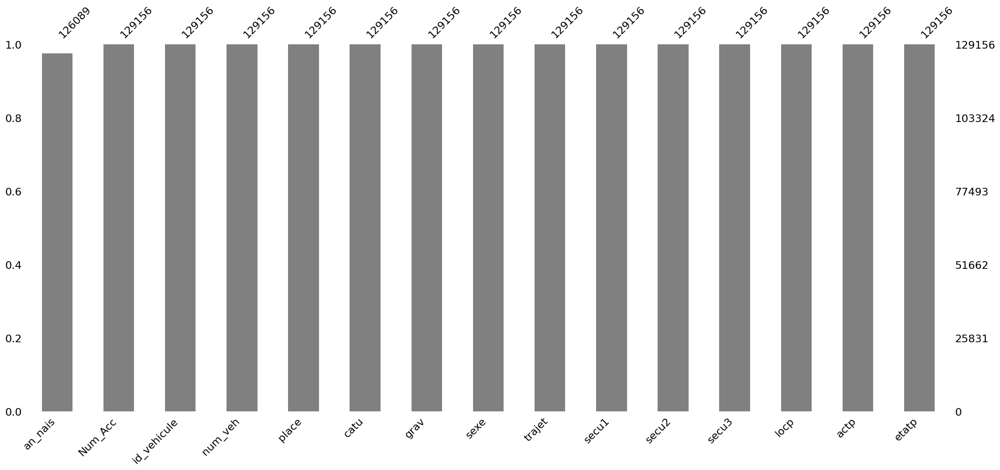

In [57]:
# Visualisation de tout notre dataset
msno.bar(df_acc, sort= "ascending", color= "grey")

**REMARQUES**

* D'aprés le dictionnaire des données nous avons plusieurs champs présentant des valeurs manquantes.
* En particulier, la valeur -1 ou 0 est utilisée dans de nombreuses colonnes pour désigner une absence d'information ou une donnée non renseignée.
* Ces codes ont été considérés comme des données manquantes et vont être convertis en NaN afin d’harmoniser le traitement.

In [58]:
# Remplacer les valeurs non renseignées
df_acc.replace([-1, 0], np.nan, inplace=True)
df_acc["actp"] = df_acc["actp"].replace(["-1", "0", 0, -1], np.nan)

* Aprés conversion des valeurs, nous allons afficher à nouveau les valeurs manquantes.

<AxesSubplot: >

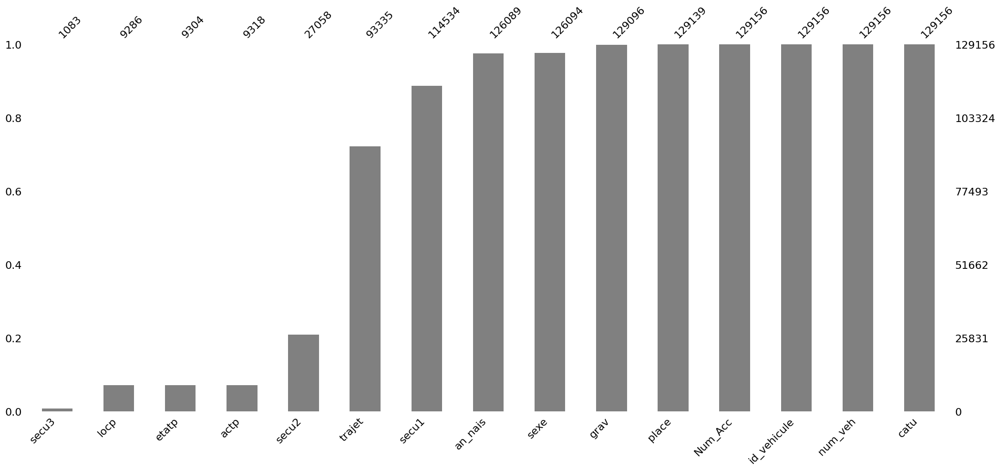

In [59]:
# Visualisation de tout notre dataset
msno.bar(df_acc, sort= "ascending", color= "grey")

In [60]:
# Pourcentage de valeurs manquantes
pourcentage_valeurs_manquants(df_acc)

Num_Acc        0.000000
id_vehicule    0.000000
num_veh        0.000000
catu           0.000000
place          0.000132
grav           0.000465
sexe           0.023708
an_nais        0.023746
secu1          0.113212
trajet         0.277347
secu2          0.790501
actp           0.927855
etatp          0.927963
locp           0.928102
secu3          0.991615
dtype: float64

In [61]:
# Isoler les valeurs manquantes
print(df_acc[df_acc.isna().any(axis = 1)].shape)
df_acc[df_acc.isna().any(axis = 1)].head(6)

(129153, 15)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
0,202100021165,163Â 830,A01,9.0,2,4.0,1.0,1948.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1,202100020281,165Â 383,A01,1.0,1,1.0,2.0,1965.0,1.0,1.0,8.0,NaN,NaN,NaN,NaN
2,202100047336,117Â 153,A01,1.0,1,4.0,2.0,1972.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN
3,202100008918,185Â 779,B01,1.0,1,4.0,1.0,1985.0,9.0,8.0,NaN,NaN,NaN,NaN,NaN
4,202100009175,185Â 315,A01,1.0,1,3.0,1.0,1960.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN
5,202100050277,111Â 849,B01,1.0,1,4.0,1.0,1972.0,3.0,1.0,9.0,NaN,NaN,NaN,NaN


* Nous avons des variable avec plus de 70% de valeurs manquantes (**secu2**,**etatp**,**locp**, **secu3** et **actp**);
* Une variables avec moins de 30% de valeurs manquantes **an_nais** ce qui est faible par rapport au nombre total de lignes (129189).
* Pour le reste des autres colonnes nous avons quasiment de trés faibles pourcentage de valeurs manquantes, 
* Nous n'allons pas supprimer ces colonnes avec moins de valeurs manquantes car celà va nous faire perdre beaucoup d'informations;
* Pour celà nous allons faire une imputation en remplaçant ces valeurs par la mediane(variables quantitatives) et le mode(variables qualitatives).
* Les colonnes avec plus de 70% de VM nous allons les supprimer.

#### Suppression des colonnes avec beaucoup de valeurs manquantes

In [62]:
# Suppression des colonnes
df_acc = df_acc.drop(columns = ["secu2", "secu3", "locp", "etatp", "actp"], axis = 1)

#### Imputation des valeurs manquantes avec les variables quantitatives

* Pour les variables quantitatives nous allons faire une imputation par la mediane.

In [63]:
# Imputation de variable quantitative 
df_acc['an_nais'] = df_acc['an_nais'].fillna(df_acc['an_nais'].median()).astype(int)

#### Imputation des valeurs manquantes avec les variables qualitatives

* Avant de faire une imputation par le mode, vérifions dabord à l'aide d'un tableau de contigence si le mode est majoritaire ou pas:
    * Mode majoritaire : faire une imputation par le mode
    * Mode non majoritaire faire une imputation aléatoire

In [64]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_acc.select_dtypes("number").columns:
    print("=========================================")
    print(df_acc[i].value_counts(dropna=False), "\n", (df_acc[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Num_Acc
202100003154    24
202100050118    21
202100047872    21
202100023738    18
202100016415    17
                ..
202100003776     1
202100051478     1
202100047438     1
202100030624     1
202100056521     1
Name: count, Length: 56521, dtype: int64 
 Num_Acc
202100003154    0.02
202100050118    0.02
202100047872    0.02
202100023738    0.01
202100016415    0.01
                ... 
202100003776    0.00
202100051478    0.00
202100047438    0.00
202100030624    0.00
202100056521    0.00
Name: proportion, Length: 56521, dtype: float64
place
1.0     97028
2.0     14452
10.0     9474
3.0      2474
4.0      2228
9.0      1188
7.0      1101
5.0       610
8.0       437
6.0       147
NaN        17
Name: count, dtype: int64 
 place
1.0     75.12
2.0     11.19
10.0     7.34
3.0      1.92
4.0      1.73
9.0      0.92
7.0      0.85
5.0      0.47
8.0      0.34
6.0      0.11
NaN      0.01
Name: proportion, dtype: float64
catu
1    97278
2    22404
3     9474
Name: count, dtype: int64 
 catu
1

In [65]:
# Imputation avec le mode
df_acc['place'] = df_acc['place'].fillna(df_acc['place'].mode()[0]).astype(int)
df_acc['sexe'] = df_acc['sexe'].fillna(df_acc['sexe'].mode()[0]).astype(int)
df_acc['secu1'] = df_acc['secu1'].fillna(df_acc['secu1'].mode()[0]).astype(int)

#### Imputation aléatoire

* Nous allons faire une imputation en réalisant un tirage aléatoire des différentes modalités.

In [66]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_grav = df_acc['grav'].value_counts(normalize = True)

In [67]:
# Appliquons une fonction à la variable avec la fonction lambda
df_acc['grav'] = df_acc['grav'].apply(lambda x: 
                   np.random.choice(Mod_grav.index, size = 1, 
                                    p = Mod_grav.values)[0] if pd.isna(x) else x)

In [68]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_trajet = df_acc['trajet'].value_counts(normalize = True)

In [69]:
# Appliquons une fonction à la variable avec la fonction lambda
df_acc['trajet'] = df_acc['trajet'].apply(lambda x: 
                   np.random.choice(Mod_trajet.index, size = 1, 
                                    p = Mod_trajet.values)[0] if pd.isna(x) else x)

In [70]:
# Afficher le pourcentage de valeurs manquantes aprés imputation
pourcentage_valeurs_manquants(df_acc)

Num_Acc        0.0
id_vehicule    0.0
num_veh        0.0
place          0.0
catu           0.0
grav           0.0
sexe           0.0
an_nais        0.0
trajet         0.0
secu1          0.0
dtype: float64

In [71]:
# Convertir au bon format
df_acc['grav'] = df_acc['grav'].astype(int)
df_acc['trajet'] = df_acc['trajet'].astype(int)

<AxesSubplot: >

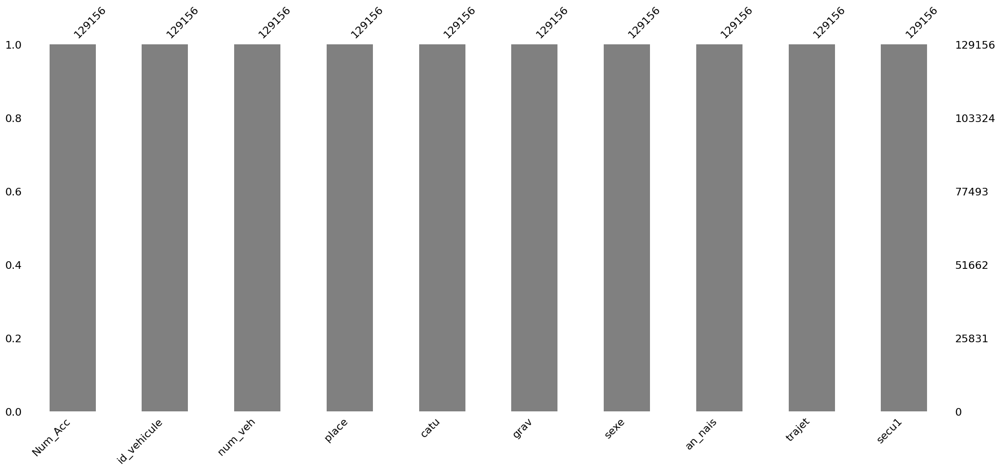

In [72]:
# Visualisation de tout notre dataset
msno.bar(df_acc, sort= "ascending", color= "grey")

In [73]:
# le typage des données
df_acc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129156 entries, 0 to 129155
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Num_Acc      129156 non-null  int64 
 1   id_vehicule  129156 non-null  object
 2   num_veh      129156 non-null  object
 3   place        129156 non-null  int32 
 4   catu         129156 non-null  int64 
 5   grav         129156 non-null  int32 
 6   sexe         129156 non-null  int32 
 7   an_nais      129156 non-null  int32 
 8   trajet       129156 non-null  int32 
 9   secu1        129156 non-null  int32 
dtypes: int32(6), int64(2), object(2)
memory usage: 6.9+ MB


* Nous n'avons plus de valeurs manquantes dans la base et toutes nos variables sont au bon format.

### Gestion des données incohérentes

#### Variables quantitatives

In [74]:
# Désactiver la notation scientifique globale
pd.set_option('display.float_format', lambda x: '%.0f' % x)

# Statistique descriptive des variables quantitatives uniquement
df_acc.describe(include=["number"]).T

,count,mean,std,min,25%,50%,75%,max
Num_Acc,129156,202100028104,16287,202100000001,202100014033,202100028024,202100042084,202100056521
place,129156,2,3,1,1,1,1,10
catu,129156,1,1,1,1,1,1,3
grav,129156,3,1,1,1,3,4,4
sexe,129156,1,0,1,1,1,2,3
an_nais,129156,1983,19,1789,1971,1987,1998,2025
trajet,129156,4,2,1,3,5,5,9
secu1,129156,2,2,1,1,1,2,9


* La description statistique des variables quantitatives, nous montre avec la variable **sexe** qui varie de 1 à 3 ce qui est anormale.
* La variable **an_nais** avec un minimum de 1789 et un maximum à 2025.
* Nous pouvons les considérer comme des anomalies et nous allons les corriger.
* Faisons un tableau de contingence pour identifier les anomalies ainsi que créer des filtres avec des listes de base pour les variables afin de connaitre le nombre de lignes concernées.

In [75]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_acc.select_dtypes("number").columns:
    print("=========================================")
    print(df_acc[i].value_counts(dropna=False), "\n", (df_acc[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Num_Acc
202100003154    24
202100050118    21
202100047872    21
202100023738    18
202100016415    17
                ..
202100003776     1
202100051478     1
202100047438     1
202100030624     1
202100056521     1
Name: count, Length: 56521, dtype: int64 
 Num_Acc
202100003154   0 
202100050118   0 
202100047872   0 
202100023738   0 
202100016415   0 
               ..
202100003776   0 
202100051478   0 
202100047438   0 
202100030624   0 
202100056521   0 
Name: proportion, Length: 56521, dtype: float64
place
1     97045
2     14452
10     9474
3      2474
4      2228
9      1188
7      1101
5       610
8       437
6       147
Name: count, dtype: int64 
 place
1    75
2    11
10    7
3     2
4     2
9     1
7     1
5     0
8     0
6     0
Name: proportion, dtype: float64
catu
1    97278
2    22404
3     9474
Name: count, dtype: int64 
 catu
1   75
2   17
3    7
Name: proportion, dtype: float64
grav
1    55139
4    51704
3    19092
2     3221
Name: count, dtype: int64 
 grav
1   43

* **On constate qu'il y'a une modalité égale **3** qui est présente dans la variable **sexe** et n'y devrait pas y être**
* **Nous allons le remplacer par le mode qui est majoritaire.**

#### Identifier les anomalies de la variable "sexe" et le nombre de lignes concernées

* Sexe de l'usager :  
    * 1 – Masculin   
    * 2 – Féminin
* Les valeurs doivent varier de 1 à 2 au lieu de 1 à 3. Essayons de les détecter.

In [76]:
# Liste de référence
ma_liste_sexe = [1,2]

# Garder les lignes où la valeur est dans la liste
df_valide_sexe = df_acc[df_acc["sexe"].isin(ma_liste_sexe)]

# Extraire les lignes exclues
df_exclu_sexe = df_acc[~df_acc["sexe"].isin(ma_liste_sexe)]

# Affichage
print("Valeurs gardées dans sexe:")
print(df_valide_sexe)
print("====================================================")
print("\n Valeurs exclues dans sexe :")
print(df_exclu_sexe)

Valeurs gardées dans sexe:
             Num_Acc id_vehicule num_veh  place  catu  grav  sexe  an_nais  \
0       202100021165    163Â 830     A01      9     2     4     1     1948   
1       202100020281    165Â 383     A01      1     1     1     2     1965   
2       202100047336    117Â 153     A01      1     1     4     2     1972   
3       202100008918    185Â 779     B01      1     1     4     1     1985   
4       202100009175    185Â 315     A01      1     1     3     1     1960   
...              ...         ...     ...    ...   ...   ...   ...      ...   
129151  202100018230    169Â 018     D01      1     1     1     2     1982   
129152  202100050268    111Â 866     B01      2     2     4     2     1942   
129153  202100056519    163Â 830     A01      9     2     4     1     1948   
129154  202100056520    165Â 383     A01      1     1     1     2     1965   
129155  202100056521    117Â 153     A01      1     1     4     2     1972   

        trajet  secu1  
0           

* La suppression de toutes ces lignes avec les anomalies nous fera perdre beaucoup d'information, 
* Pour éviter cette perte d'information nous allons faire une imputation par le mode.

#### Imputation par le mode

In [77]:
# Calcul du mode des valeurs autorisées
mode_sexe = df_acc[df_acc["sexe"].isin(ma_liste_sexe)]["sexe"].mode()[0]
# Remplacement des lignes exclues par le mode
df_acc.loc[~df_acc["sexe"].isin(ma_liste_sexe), "sexe"] = mode_sexe

In [78]:
# Statistique descriptive des variables quantitatives uniquement
df_acc.describe(include=["number"]).T

,count,mean,std,min,25%,50%,75%,max
Num_Acc,129156,202100028104,16287,202100000001,202100014033,202100028024,202100042084,202100056521
place,129156,2,3,1,1,1,1,10
catu,129156,1,1,1,1,1,1,3
grav,129156,3,1,1,1,3,4,4
sexe,129156,1,0,1,1,1,2,2
an_nais,129156,1983,19,1789,1971,1987,1998,2025
trajet,129156,4,2,1,3,5,5,9
secu1,129156,2,2,1,1,1,2,9


#### Identifier les anomalies de la variable "an_nais" et le nombre de lignes concernées

* an_nais qui correspond à l'année de naissance de l'usager :  
    * Nous avons un minimum égale 1789 at un maximum égale à 2025, il s'agit probablement des valeurs aberrantes à nettoyer
    * Le jeu de données concerne des accidents récents (de 2005 à 2021).
    * Il est impossible qu’un conducteur soit né en 2025 ou après, car on ne peut pas conduire avant d’être né.
    * Pour celà nous allons fixer des bornes afin de nettoyer ces incohérentes (ex : >2021 ou <1920).

In [79]:
# Définir les bornes acceptables
# Les plus vieux conducteurs ou usagers (2021-1920 = 101 ans)
min_an_nais = 1920
# Les plus jeunes usagers plausibles peuvent être des bébés transportés ou piétons (bébées 0 an)
max_an_nais = 2021 

# Filtrer les valeurs aberrantes
df_clean = df_acc[(df_acc['an_nais'] >= min_an_nais) & (df_acc['an_nais'] <= max_an_nais)]
print(df_clean.shape)
df_clean

(129153, 10)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1
0,202100021165,163Â 830,A01,9,2,4,1,1948,5,1
1,202100020281,165Â 383,A01,1,1,1,2,1965,1,1
2,202100047336,117Â 153,A01,1,1,4,2,1972,1,2
3,202100008918,185Â 779,B01,1,1,4,1,1985,9,8
4,202100009175,185Â 315,A01,1,1,3,1,1960,5,1
...,...,...,...,...,...,...,...,...,...,...
129151,202100018230,169Â 018,D01,1,1,1,2,1982,5,1
129152,202100050268,111Â 866,B01,2,2,4,2,1942,1,1
129153,202100056519,163Â 830,A01,9,2,4,1,1948,5,1
129154,202100056520,165Â 383,A01,1,1,1,2,1965,1,1


In [80]:
# Vérifier combien de lignes ont été supprimées
ligne_suppr = len(df_acc) - len(df_clean)
print(f"{ligne_suppr} lignes supprimées pour année de naissance aberrante.")

3 lignes supprimées pour année de naissance aberrante.


In [81]:
# Faire une copie de la base aprés suppression de ces anomolies
df_acc = df_clean.copy()

* Nous avons deux lignes qui sont concernés et qu'on a supprimée avec ces année de naissance incohérentes.
* Nous avons terminé de corriger toutes les valeurs incohérentes dans les variables quantitatives.

#### Variables qualitatives

In [82]:
# Statistique descriptive des variables qualitatives uniquement
df_acc.describe(exclude=["number"]).T

,count,unique,top,freq
id_vehicule,129153,97308,196Â 125,21
num_veh,129153,53,A01,76942


In [83]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_acc.select_dtypes("object").columns:
    print("=========================================")
    print(df_acc[i].value_counts(dropna=False), "\n", (df_acc[i].value_counts(dropna=False, normalize = True) * 100).round(2))

id_vehicule
196Â 125    21
172Â 295    17
169Â 915    16
155Â 083    14
131Â 903    14
            ..
144Â 380     1
164Â 499     1
195Â 687     1
128Â 785     1
169Â 018     1
Name: count, Length: 97308, dtype: int64 
 id_vehicule
196Â 125   0 
172Â 295   0 
169Â 915   0 
155Â 083   0 
131Â 903   0 
           ..
144Â 380   0 
164Â 499   0 
195Â 687   0 
128Â 785   0 
169Â 018   0 
Name: proportion, Length: 97308, dtype: float64
num_veh
A01     76942
B01     43471
C01      4981
Z01      1942
D01      1092
E01       346
F01        90
Y01        81
G01        40
T01        27
H01        20
X01        11
I01        11
J01         9
K01         7
FA01        6
TA01        6
SA01        5
M01         5
L01         5
P01         4
[01         4
V01         4
BA01        3
RA01        3
AA01        3
CA01        3
LA01        2
DA01        2
MB01        2
ZZ01        2
KA01        2
VB01        2
]01         1
NA01        1
IA01        1
U01         1
SB01        1
N01         1
GB01        

<AxesSubplot: >

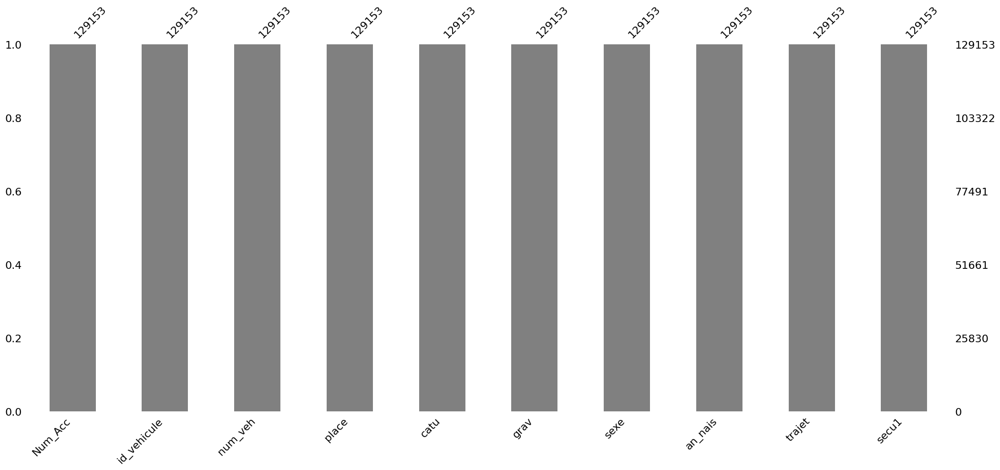

In [84]:
# Visualisation de tout notre dataset aprés imputation des VM
msno.bar(df_acc, sort= "ascending", color= "grey")

* Les deux varibles qualitatives correspondent à l'Identifiant unique du véhicule.
* Toutes les valeurs incohérentes sont corrigées.

In [85]:
#le type des données
df_acc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 129153 entries, 0 to 129155
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Num_Acc      129153 non-null  int64 
 1   id_vehicule  129153 non-null  object
 2   num_veh      129153 non-null  object
 3   place        129153 non-null  int32 
 4   catu         129153 non-null  int64 
 5   grav         129153 non-null  int32 
 6   sexe         129153 non-null  int32 
 7   an_nais      129153 non-null  int32 
 8   trajet       129153 non-null  int32 
 9   secu1        129153 non-null  int32 
dtypes: int32(6), int64(2), object(2)
memory usage: 7.9+ MB


### 3.1.c) Base des Véhicules

In [86]:
# Faisons une copie pour garder la base d'origine
df_veh = data_vehicules.copy()
# Afficher les 5 premières lignes de notre base
df_veh.head(5)

,id_vehicule,num_veh,senc,catv,obs,obsm,choc,manv,motor,occutc
0,129åÊ983,A01,1,33,0,2,3,1,1,NaN
1,192åÊ850,B01,1,10,0,2,4,2,1,NaN
2,152åÊ776,A01,1,33,0,2,1,3,3,NaN
3,193åÊ398,A01,1,7,0,1,2,1,1,NaN
4,178åÊ605,A01,2,7,0,1,2,1,1,NaN


### Qualité des données

In [87]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_veh))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_veh))
print("=============================================")
print("Information sur les colonnes:", df_veh.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_veh))
print("=============================================")
print("Types de variables:", type_variable(df_veh))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_veh))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_veh))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_veh))

Nombre de lignes: 97365
Nombre de colonnes: 10
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97365 entries, 0 to 97364
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id_vehicule  97365 non-null  object 
 1   num_veh      97365 non-null  object 
 2   senc         97365 non-null  int64  
 3   catv         97365 non-null  int64  
 4   obs          97365 non-null  int64  
 5   obsm         97365 non-null  int64  
 6   choc         97365 non-null  int64  
 7   manv         97365 non-null  int64  
 8   motor        97365 non-null  int64  
 9   occutc       744 non-null    float64
dtypes: float64(1), int64(7), object(2)
memory usage: 7.4+ MB
Information sur les colonnes: None
Total des valeurs manquantes: 96621
Types de variables: int64      7
object     2
float64    1
Name: count, dtype: int64
Pourcentage de valeurs manquantes: id_vehicule   0
num_veh       0
senc          0
catv          0
obs           0
obsm   

* Nous avons une base avec plus de 97000 véhicules impliqués dans un accident corporel avec ces différentes caractériques;
* Présence de plusieurs (**100%**) valeurs manquantes dans une seule colonnes (**occutc: Nombre d’occupants dans le transport en commun.** ;
* Toutes nos variables sont au bon format;
* Nous n'avons pas de doublons purs.
* Avant de continuer notre analyse, nous allons supprimer la colonne avec 100% de valeurs manquantes.

In [88]:
# Suppression de la colonne "occutc"
df_veh = df_veh.drop(columns = ["occutc"], axis = 1)

### Gestion des doublons

In [89]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_veh.duplicated().sum()

0

In [90]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_veh.duplicated(["id_vehicule"]).sum()

0

In [91]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_veh.duplicated(["num_veh"]).sum()

97312

* Sur les 97365 véhicules, nous n'avons pas de doublons purs (0 doublon) dans la base ni de doublons impurs avec "id_véhicule" identifiant unique.

### Gestion des données manquantes

* Nous allons faire une visualisation afin d'afficher les valeurs manquantes sur un graphique

<AxesSubplot: >

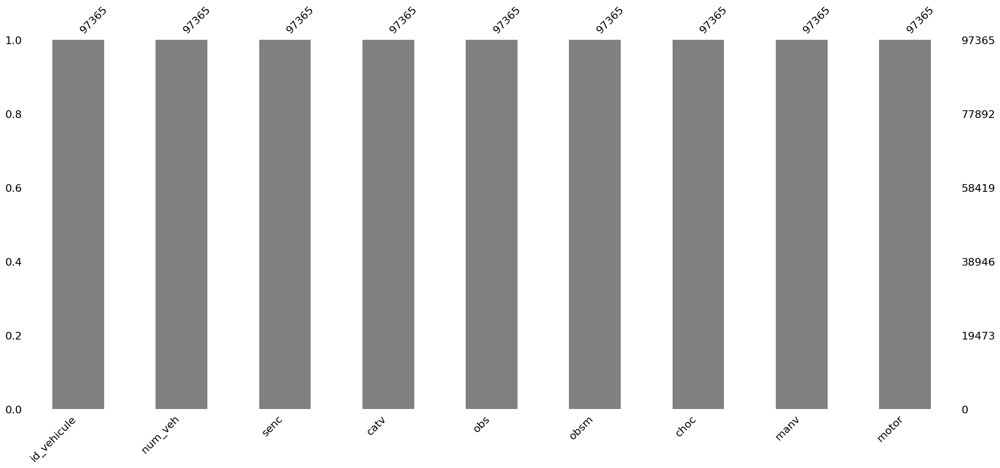

In [92]:
# Visualisation de tout notre dataset
msno.bar(df_veh, sort= "ascending", color= "grey")

**REMARQUE**

* Certaines colonnes utilisaient des codes spécifiques pour désigner l’absence d’information, notamment les valeurs -1 et 0.
* Ces codes ont été considérés comme des données manquantes et vont être convertis en NaN afin d’harmoniser le traitement.

In [93]:
# Remplacer les valeurs non renseignées
df_veh.replace([-1, 0], np.nan, inplace=True)

* Visualisation à nouveau des données manquantes aprés remplacement des -1 et 0.

<AxesSubplot: >

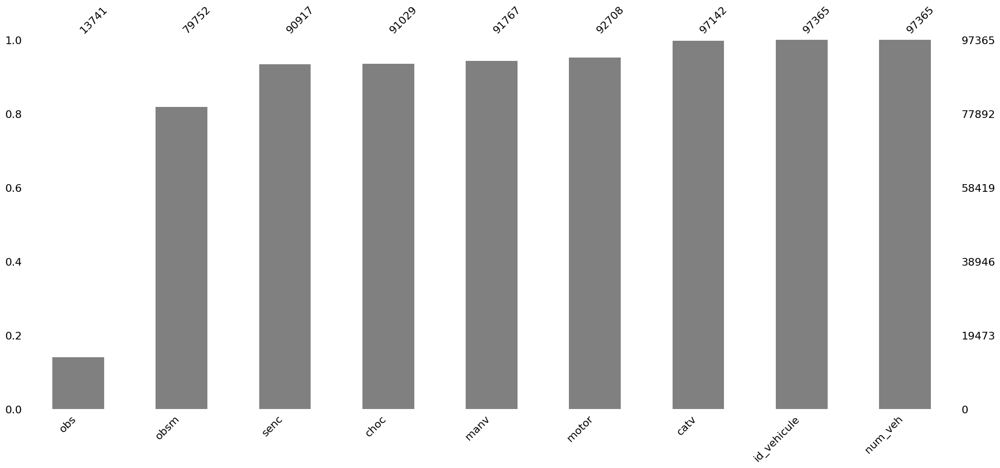

In [94]:
# Visualisation de tout notre dataset 
msno.bar(df_veh, sort= "ascending", color= "grey")

In [95]:
# Pourcentage de valeurs manquantes
pourcentage_valeurs_manquants(df_veh)

id_vehicule   0
num_veh       0
catv          0
motor         0
manv          0
choc          0
senc          0
obsm          0
obs           1
dtype: float64

In [96]:
df_veh.isna().sum()

id_vehicule        0
num_veh            0
senc            6448
catv             223
obs            83624
obsm           17613
choc            6336
manv            5598
motor           4657
dtype: int64

* Nous avons avons deux variables sans valeurs manquantes, il s'agit des des identifiants unique de véhicule;
* Une variable avec plus de 80% de valeurs manquantes **obs** ce qui trop élevées par rapport au nombre total de lignes;
* Le reste avec des valeurs manquantes  qui ne dépasse pas les 30%.
* Nous allons supprimer la colonne avec plus 80% de valeurs manquantes et le reste faire une imputation avec le mode ou imputation aléatoire.

In [97]:
# Isoler les valeurs manquantes
print(df_veh[df_veh.isna().any(axis = 1)].shape)
df_veh[df_veh.isna().any(axis = 1)].head(6)

(94299, 9)


,id_vehicule,num_veh,senc,catv,obs,obsm,choc,manv,motor
0,129åÊ983,A01,1,33,NaN,2,3,1,1
1,192åÊ850,B01,1,10,NaN,2,4,2,1
2,152åÊ776,A01,1,33,NaN,2,1,3,3
3,193åÊ398,A01,1,7,NaN,1,2,1,1
4,178åÊ605,A01,2,7,NaN,1,2,1,1
5,187åÊ823,A01,2,30,NaN,2,1,1,1


#### Suppression de la colonne avec plus de 80% de valeurs manquantes

In [98]:
# Suppression de la colonne
df_veh = df_veh.drop(columns = ["obs"], axis = 1)

#### Imputation des variables

* Avant de faire une imputation par le mode, vérifions dabord à l'aide d'un tableau de contigence si le mode est majoritaire ou pas:
    * Mode majoritaire : faire une imputation par le mode
    * Mode non majoritaire faire une imputation aléatoire

In [99]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_veh.select_dtypes("number").columns:
    print("=========================================")
    print(df_veh[i].value_counts(dropna=False), "\n", (df_veh[i].value_counts(dropna=False, normalize = True) * 100).round(2))

senc
1      44107
2      33152
3      13658
NaN     6448
Name: count, dtype: int64 
 senc
1     45
2     34
3     14
NaN    7
Name: proportion, dtype: float64
catv
7      57132
33      7514
10      6748
1       5620
2       3824
30      3382
32      2223
31      1688
50      1510
15       970
34       899
14       734
17       641
37       621
43       612
80       534
3        523
99       438
13       387
21       265
60       237
NaN      223
36       180
40       133
38       123
20        95
39        41
16        36
35        18
41        11
42         3
Name: count, dtype: int64 
 catv
7     59
33     8
10     7
1      6
2      4
30     3
32     2
31     2
50     2
15     1
34     1
14     1
17     1
37     1
43     1
80     1
3      1
99     0
13     0
21     0
60     0
NaN    0
36     0
40     0
38     0
20     0
39     0
16     0
35     0
41     0
42     0
Name: proportion, dtype: float64
obsm
2      69082
NaN    17613
1       8593
9       1741
6        137
4        113
5    

#### Imputation avec le mode

In [100]:
# Imputation avec le mode
df_veh['catv'] = df_veh['catv'].fillna(df_veh['catv'].mode()[0]).astype(int)
df_veh['obsm'] = df_veh['obsm'].fillna(df_veh['obsm'].mode()[0]).astype(int)
df_veh['motor'] = df_veh['motor'].fillna(df_veh['motor'].mode()[0]).astype(int)

#### Imputation aléatoire

In [101]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_senc = df_veh['senc'].value_counts(normalize = True)

In [102]:
# Appliquons une fonction à la variable avec la fonction lambda
df_veh['senc'] = df_veh['senc'].apply(lambda x: 
                   np.random.choice(Mod_senc.index, size = 1, 
                                    p = Mod_senc.values)[0] if pd.isna(x) else x)

In [103]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_choc = df_veh['choc'].value_counts(normalize = True)

In [104]:
# Appliquons une fonction à la variable avec la fonction lambda
df_veh['choc'] = df_veh['choc'].apply(lambda x: 
                   np.random.choice(Mod_choc.index, size = 1, 
                                    p = Mod_choc.values)[0] if pd.isna(x) else x)

In [105]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_manv = df_veh['manv'].value_counts(normalize = True)

In [106]:
# Appliquons une fonction à la variable avec la fonction lambda
df_veh['manv'] = df_veh['manv'].apply(lambda x: 
                   np.random.choice(Mod_manv.index, size = 1, 
                                    p = Mod_manv.values)[0] if pd.isna(x) else x)

In [107]:
# Afficher le pourcentage de valeurs manquantes aprés imputation
pourcentage_valeurs_manquants(df_veh)

id_vehicule   0
num_veh       0
senc          0
catv          0
obsm          0
choc          0
manv          0
motor         0
dtype: float64

<AxesSubplot: >

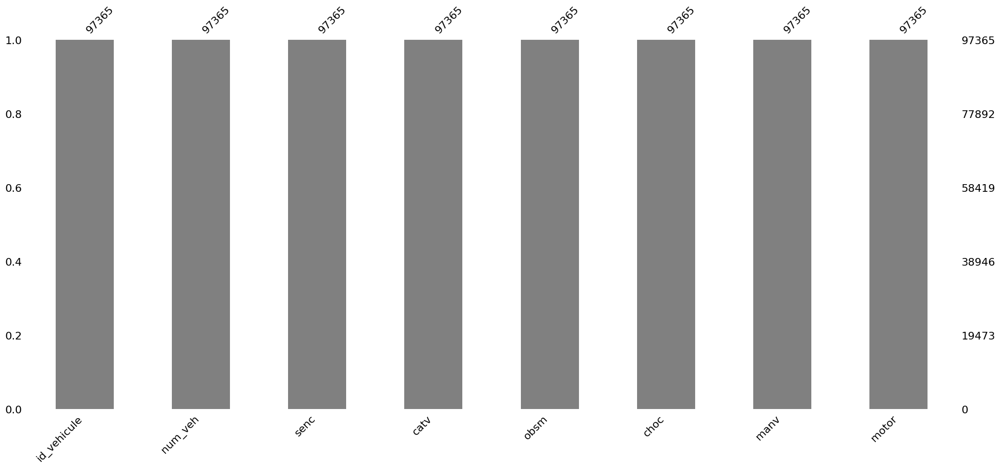

In [108]:
# Visualisation de tout notre dataset
msno.bar(df_veh, sort= "ascending", color= "grey")

In [109]:
# Typage des données
df_veh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97365 entries, 0 to 97364
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id_vehicule  97365 non-null  object 
 1   num_veh      97365 non-null  object 
 2   senc         97365 non-null  float64
 3   catv         97365 non-null  int32  
 4   obsm         97365 non-null  int32  
 5   choc         97365 non-null  float64
 6   manv         97365 non-null  float64
 7   motor        97365 non-null  int32  
dtypes: float64(3), int32(3), object(2)
memory usage: 4.8+ MB


In [110]:
# Convertir au bon format
df_veh['senc'] = df_veh['senc'].astype(int)
df_veh['choc'] = df_veh['choc'].astype(int)
df_veh['manv'] = df_veh['manv'].astype(int)

In [111]:
# Typage des données
df_veh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97365 entries, 0 to 97364
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id_vehicule  97365 non-null  object
 1   num_veh      97365 non-null  object
 2   senc         97365 non-null  int32 
 3   catv         97365 non-null  int32 
 4   obsm         97365 non-null  int32 
 5   choc         97365 non-null  int32 
 6   manv         97365 non-null  int32 
 7   motor        97365 non-null  int32 
dtypes: int32(6), object(2)
memory usage: 3.7+ MB


* Nous n'avons plus de valeurs manquantes dans la base et toutes nos variables sont au bon format.

### Gestion des données incohérentes

#### Variables quantitatives

In [112]:
# Statistiques descriptives 
df_veh.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
senc,97365,2,1,1,1,2,2,3
catv,97365,13,14,1,7,7,10,99
obsm,97365,2,1,1,2,2,2,9
choc,97365,3,2,1,1,2,4,9
manv,97365,8,8,1,1,2,15,26
motor,97365,1,1,1,1,1,1,6


* D'aprés la statistique descriptive des variables quantitatives, nous n'identifions pas d'anomalies.
* Pour nous rassurer nous allons faire un tableau de contigence afin d'identifier toutes les valeurs incohérentes.

In [113]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_veh.select_dtypes("number").columns:
    print("=========================================")
    print(df_veh[i].value_counts(dropna=False), "\n", (df_veh[i].value_counts(dropna=False, normalize = True) * 100).round(2))

senc
1    47192
2    35517
3    14656
Name: count, dtype: int64 
 senc
1   48
2   36
3   15
Name: proportion, dtype: float64
catv
7     57355
33     7514
10     6748
1      5620
2      3824
30     3382
32     2223
31     1688
50     1510
15      970
34      899
14      734
17      641
37      621
43      612
80      534
3       523
99      438
13      387
21      265
60      237
36      180
40      133
38      123
20       95
39       41
16       36
35       18
41       11
42        3
Name: count, dtype: int64 
 catv
7    59
33    8
10    7
1     6
2     4
30    3
32    2
31    2
50    2
15    1
34    1
14    1
17    1
37    1
43    1
80    1
3     1
99    0
13    0
21    0
60    0
36    0
40    0
38    0
20    0
39    0
16    0
35    0
41    0
42    0
Name: proportion, dtype: float64
obsm
2    86695
1     8593
9     1741
6      137
4      113
5       86
Name: count, dtype: int64 
 obsm
2   89
1    9
9    2
6    0
4    0
5    0
Name: proportion, dtype: float64
choc
1    37551
3    1522

* Nous n'avons pas de valeurs incohérentes dans les variables quantitatives.

#### Variables qualitatives

In [114]:
# Statistiques descriptives 
df_veh.describe(exclude = "number").T

,count,unique,top,freq
id_vehicule,97365,97365,129åÊ983,1
num_veh,97365,53,A01,55590


In [115]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_veh.select_dtypes("object").columns:
    print("=========================================")
    print(df_veh[i].value_counts(dropna=False), "\n", (df_veh[i].value_counts(dropna=False, normalize = True) * 100).round(2))

id_vehicule
129åÊ983    1
200åÊ350    1
126åÊ055    1
168åÊ102    1
117åÊ981    1
           ..
168åÊ593    1
151åÊ450    1
158åÊ209    1
129åÊ266    1
181åÊ572    1
Name: count, Length: 97365, dtype: int64 
 id_vehicule
129åÊ983   0 
200åÊ350   0 
126åÊ055   0 
168åÊ102   0 
117åÊ981   0 
           ..
168åÊ593   0 
151åÊ450   0 
158åÊ209   0 
129åÊ266   0 
181åÊ572   0 
Name: proportion, Length: 97365, dtype: float64
num_veh
A01     55590
B01     34806
C01      3999
Z01      1470
D01       899
E01       267
F01        80
Y01        73
G01        34
T01        24
H01        19
I01        10
X01         9
J01         8
K01         7
M01         5
L01         5
FA01        4
P01         4
[01         4
SA01        4
TA01        3
V01         3
BA01        2
ZZ01        2
MB01        2
AA01        2
VB01        2
RA01        2
DA01        2
CA01        2
U01         1
R01         1
NA01        1
S01         1
EB01        1
SB01        1
Q01         1
PA01        1
GB01        1
KD01     

* Nous n'avons pas de valeurs incohérentes dans les variables qualitatives.

In [116]:
#le type des données
df_veh.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97365 entries, 0 to 97364
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id_vehicule  97365 non-null  object
 1   num_veh      97365 non-null  object
 2   senc         97365 non-null  int32 
 3   catv         97365 non-null  int32 
 4   obsm         97365 non-null  int32 
 5   choc         97365 non-null  int32 
 6   manv         97365 non-null  int32 
 7   motor        97365 non-null  int32 
dtypes: int32(6), object(2)
memory usage: 3.7+ MB


### 3.1.d) Base des lieux de l'accident

In [117]:
# Faisons une copie pour garder la base d'origine
df_lieux = data_lieux.copy()
# Afficher les 5 premières lignes de notre base
df_lieux.head(3)

,Num_Acc,dep,catr,voie,v1,v2,circ,nbv,vosp,prof,pr,pr1,plan,lartpc,larrout,surf,infra,situ,vma
0,202100022009,40,1,A63,0,A,3,3,0,1,141,600,1,NaN,-1,1,0,1,130
1,202100023746,94,4,VLADIMIR ILLITCH LENINE (AV),0,NaN,-1,2,0,1,0,0,1,NaN,-1,1,0,1,50
2,202100019549,2A,2,20,0,T,2,2,0,1,-1,-1,2,NaN,-1,1,0,3,80


### Qualité des données

In [118]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_lieux))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_lieux))
print("=============================================")
print("Information sur les colonnes:", df_lieux.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_lieux))
print("=============================================")
print("Types de variables:", type_variable(df_lieux))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_lieux))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_lieux))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_lieux))

Nombre de lignes: 56525
Nombre de colonnes: 19
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56525 entries, 0 to 56524
Data columns (total 19 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Num_Acc  56525 non-null  int64  
 1   dep      56525 non-null  object 
 2   catr     56525 non-null  int64  
 3   voie     52117 non-null  object 
 4   v1       56525 non-null  int64  
 5   v2       4990 non-null   object 
 6   circ     56525 non-null  int64  
 7   nbv      56525 non-null  int64  
 8   vosp     56525 non-null  int64  
 9   prof     56525 non-null  int64  
 10  pr       56525 non-null  int64  
 11  pr1      56525 non-null  int64  
 12  plan     56525 non-null  int64  
 13  lartpc   108 non-null    float64
 14  larrout  56525 non-null  float64
 15  surf     56525 non-null  int64  
 16  infra    56525 non-null  int64  
 17  situ     56525 non-null  int64  
 18  vma      56525 non-null  int64  
dtypes: float64(2), int64(14), object(3)
memor

* Nous avons une base avec 56525 lignes qui correspondent chacune à un lieu d'accident;
* Présence de plusieurs valeurs manquantes dans certaines colonnes.
* Toutes les variables sont au bon format.
* Nous avons des doublons purs.

### Gestion des doublons

In [119]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_lieux.duplicated().sum()

0

In [120]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_lieux.duplicated(["Num_Acc"]).sum()

7

* Sur les 56525, nous n'avons pas de doublons purs mais plutôt des doublons impurs (7 lignes).
* Vérifions les lignes avec les doublons impurs en se basant sur la clé primaire ("Num_acc")

In [121]:
# Afficher les doublons
doublons_lieux = df_lieux[df_lieux.duplicated("Num_Acc", keep = False)].sort_values("Num_Acc")
# Afficher les 8 première lignes
print(doublons_lieux.shape)
doublons_lieux.head(8)

(14, 19)


,Num_Acc,dep,catr,voie,v1,v2,circ,nbv,vosp,prof,pr,pr1,plan,lartpc,larrout,surf,infra,situ,vma
7422,202100013248,6,4,JOURDAN (RUE EMILE),0,NaN,1,1,0,2,-1,-1,1,NaN,-1,1,0,1,30
28863,202100013248,56,4,JOURDAN (RUE EMILE),0,NaN,1,1,0,2,-1,-1,1,NaN,-1,1,0,1,30
5151,202100014522,77,3,6015,-1,NaN,2,2,0,1,49,1001,1,NaN,-1,1,0,1,70
27414,202100014522,76,3,6015,-1,NaN,2,2,0,1,49,1001,1,NaN,-1,1,0,1,70
38978,202100015071,93,4,AVE JEAN PERRIN,0,NaN,2,2,0,1,-1,-1,1,NaN,-1,1,0,1,50
43005,202100015071,33,4,AVE JEAN PERRIN,0,NaN,2,2,0,1,-1,-1,1,NaN,-1,1,0,1,50
12917,202100021839,67,3,1420,-1,NaN,2,2,0,1,13,950,1,NaN,-1,1,0,1,80
13659,202100021839,68,3,1420,-1,NaN,2,2,0,1,13,950,1,NaN,-1,1,0,1,80


* Les doublons se différencient de la colonne **dep**, on pourra considérer qu'il y'a des départements avec le même nom de voie mais c'est le numéro de département qui les différencie
* Pour celà nous n'allons pas supprimer ces doublons mais de les considérer comme des doublons impurs.

### Gestion des valeurs manquantes

* Nous allons faire une visualisation afin de voir les valeurs manquantes.

<AxesSubplot: >

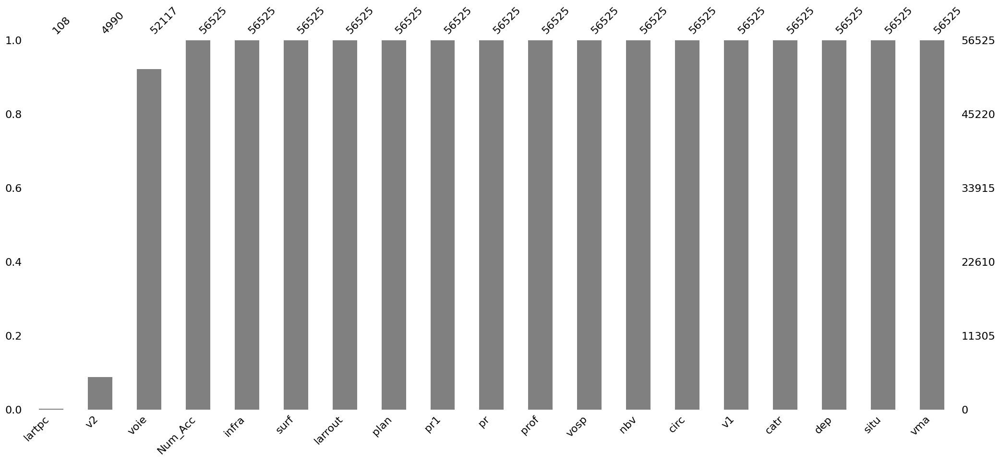

In [122]:
# Visualisation de tout notre dataset
msno.bar(df_lieux, sort= "ascending", color= "grey")

**REMARQUE**

* Présence de plusieurs valeurs manquantes dans **v2 qui correspond la lettre indice alphanumérique de la route** et **lartpc qui correspond à la Largeur du terre-plein central (TPC) s'il existe (en m).**;
* Certaines colonnes utilisaient des codes spécifiques pour désigner l’absence d’information, notamment les valeurs -1 et 0.
* Ces codes ont été considérés comme des données manquantes et vont être convertis en NaN afin d’harmoniser le traitement.
* Affichons leurs pourcentages de valeurs manquantes.

In [123]:
# Remplacer les valeurs non renseignées
df_lieux.replace([-1, 0], np.nan, inplace=True)

* Visualisation aprés remplaçement des valeurs non renseignées

<AxesSubplot: >

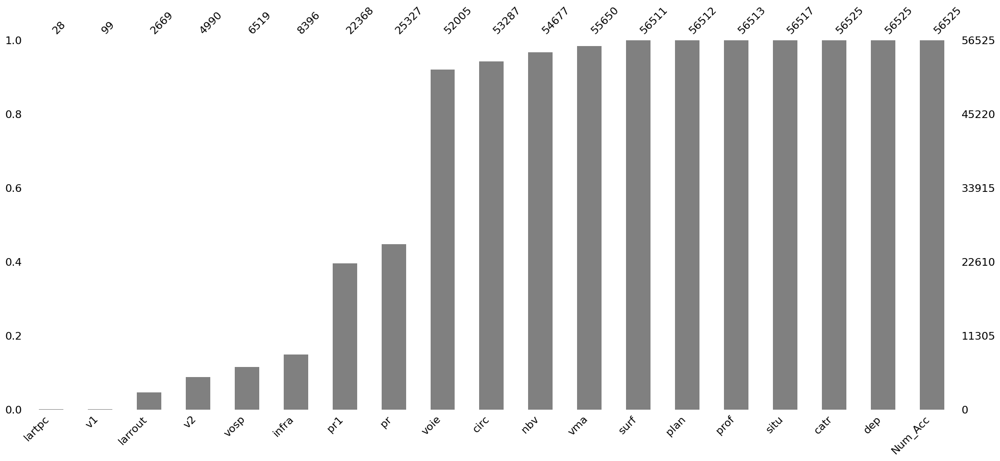

In [124]:
# Visualisation de tout notre dataset
msno.bar(df_lieux, sort= "ascending", color= "grey")

* Affichons leurs pourcentages de valeurs manquantes.

In [125]:
# Pourcentages des valeurs nulls
pourcentage_valeurs_manquants(df_lieux)

Num_Acc   0
dep       0
catr      0
situ      0
prof      0
plan      0
surf      0
vma       0
nbv       0
circ      0
voie      0
pr        1
pr1       1
infra     1
vosp      1
v2        1
larrout   1
v1        1
lartpc    1
dtype: float64

In [126]:
# Afficher les valeurs manquantes pour chacune des variables
df_lieux.isna().sum()

Num_Acc        0
dep            0
catr           0
voie        4520
v1         56426
v2         51535
circ        3238
nbv         1848
vosp       50006
prof          12
pr         31198
pr1        34157
plan          13
lartpc     56497
larrout    53856
surf          14
infra      48129
situ           8
vma          875
dtype: int64

#### Suprression des colonnes avec plus de 80% de valeurs manquantes

In [127]:
# Suppression des colonnes avec plus de 
df_lieux = df_lieux.drop(columns = ["lartpc", "v1", "v2", "larrout", "vosp", "infra", "pr1", "pr"], axis = 1)
# affichage de la base
print(df_lieux.shape)
df_lieux.head(5)

(56525, 11)


,Num_Acc,dep,catr,voie,circ,nbv,prof,plan,surf,situ,vma
0,202100022009,40,1,A63,3,3,1,1,1,1,130
1,202100023746,94,4,VLADIMIR ILLITCH LENINE (AV),NaN,2,1,1,1,1,50
2,202100019549,2A,2,20,2,2,1,2,1,3,80
3,202100022748,75,4,AVENUE SIMON BOLIVAR,2,2,2,1,1,1,50
4,202100051993,971,3,BOLOGNE (ROUTE DE),2,2,1,1,1,1,50


* Aprés suppression des colonnes avec plusieurs valeurs manquantes, nous allons afficher les lignes avec valeurs manquantes.

In [128]:
# Afficher les lignes avec les valeurs manquantes
print(df_lieux[df_lieux.isna().any(axis = 1)].shape)
df_lieux[df_lieux.isna().any(axis = 1)].head(7)

(8860, 11)


,Num_Acc,dep,catr,voie,circ,nbv,prof,plan,surf,situ,vma
1,202100023746,94,4,VLADIMIR ILLITCH LENINE (AV),NaN,2,1,1,1,1,50
6,202100023370,971,4,NaN,2,1,1,1,1,3,50
9,202100017993,78,3,GENERAL DE GAULLE (RUE DU),NaN,NaN,1,1,1,1,50
12,202100047554,56,4,NaN,2,2,2,1,1,1,50
28,202100006663,35,4,NaN,2,2,1,1,1,1,50
30,202100003676,31,4,GAMBETTA (BOULEVARD),NaN,2,1,1,2,1,50
34,202100020606,71,4,NaN,2,2,1,2,1,1,50


* Le nombre de lignes avec les valeurs manquantes est de 8860 ce qui n'est pas négligeagle car chaque lieux compte pour dans un accident;
* Pour celà nous essayer de faire une imputation avec le mode ou en réalisant un tirage aléatoire des différentes modalités afin de remplacer ces valeurs manquantes.

#### Imputation des valeurs manquantes

* Avant de faire une imputation par le mode, vérifions dabord à l'aide d'un tableau de contigence si le mode est majoritaire ou pas:
    * Mode majoritaire : faire une imputation par le mode
    * Mode non majoritaire faire une imputation aléatoire

In [129]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_lieux.select_dtypes("number").columns:
    print("=========================================")
    print(df_lieux[i].value_counts(dropna=False), "\n", (df_lieux[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Num_Acc
202100021839    2
202100039502    2
202100055766    2
202100013248    2
202100014522    2
               ..
202100008429    1
202100036816    1
202100020894    1
202100022888    1
202100017773    1
Name: count, Length: 56518, dtype: int64 
 Num_Acc
202100021839   0 
202100039502   0 
202100055766   0 
202100013248   0 
202100014522   0 
               ..
202100008429   0 
202100036816   0 
202100020894   0 
202100022888   0 
202100017773   0 
Name: proportion, Length: 56518, dtype: float64
catr
4    23661
3    20322
1     5422
2     3524
7     2782
6      395
9      356
5       63
Name: count, dtype: int64 
 catr
4   42
3   36
1   10
2    6
7    5
6    1
9    1
5    0
Name: proportion, dtype: float64
circ
2      34930
1      10113
3       7880
NaN     3238
4        364
Name: count, dtype: int64 
 circ
2     62
1     18
3     14
NaN    6
4      1
Name: proportion, dtype: float64
nbv
2      34387
4       6724
1       6045
3       4283
NaN     1848
6       1467
5        864
8     

#### Imputation avec le mode des variables quantitatives

In [130]:
# Imputation avec le mode
df_lieux['circ'] = df_lieux['circ'].fillna(df_lieux['circ'].mode()[0]).astype(int)
df_lieux['nbv'] = df_lieux['nbv'].fillna(df_lieux['nbv'].mode()[0]).astype(int)
df_lieux['prof'] = df_lieux['prof'].fillna(df_lieux['prof'].mode()[0]).astype(int)
df_lieux['plan'] = df_lieux['plan'].fillna(df_lieux['plan'].mode()[0]).astype(int)
df_lieux['surf'] = df_lieux['surf'].fillna(df_lieux['surf'].mode()[0]).astype(int)
df_lieux['situ'] = df_lieux['situ'].fillna(df_lieux['situ'].mode()[0]).astype(int)
df_lieux['vma'] = df_lieux['vma'].fillna(df_lieux['vma'].mode()[0]).astype(int)

#### Imputation avec le mode des variables qualitatives

In [131]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_lieux.select_dtypes("object").columns:
    print("=========================================")
    print(df_lieux[i].value_counts(dropna=False), "\n", (df_lieux[i].value_counts(dropna=False, normalize = True) * 100).round(2))

dep
75     5070
93     2897
13     2780
94     2493
69     2444
       ... 
90       43
978      40
977      22
986      13
975       5
Name: count, Length: 107, dtype: int64 
 dep
75    9 
93    5 
13    5 
94    4 
69    4 
      ..
90    0 
978   0 
977   0 
986   0 
975   0 
Name: proportion, Length: 107, dtype: float64
voie
NaN                           4520
1                              442
7                              393
2                              320
AUTOROUTE A86                  298
                              ... 
SOMME (AVE DE LA)                1
796                              1
CHEVALIER (AVENUE MAURICE)       1
LEROUX (R)                       1
SERGENT BERNES CAMBOT DU         1
Name: count, Length: 17238, dtype: int64 
 voie
NaN                          8 
1                            1 
7                            1 
2                            1 
AUTOROUTE A86                1 
                             ..
SOMME (AVE DE LA)            0 
796         

**REMARQUES**

* On constate que les voies inconnues sont beaucoup plus nombreuses (majoritaires) par rapport aux autres, pour celà on préfère supprimer cette colonne pour ne pas biaiser les analyses.

In [132]:
# Suppression de la colonne voie
df_lieux = df_lieux.drop(columns = ["voie"], axis = 1)

In [133]:
# Afficher le pourcentage de valeurs manquantes aprés imputation
pourcentage_valeurs_manquants(df_lieux)

Num_Acc   0
dep       0
catr      0
circ      0
nbv       0
prof      0
plan      0
surf      0
situ      0
vma       0
dtype: float64

<AxesSubplot: >

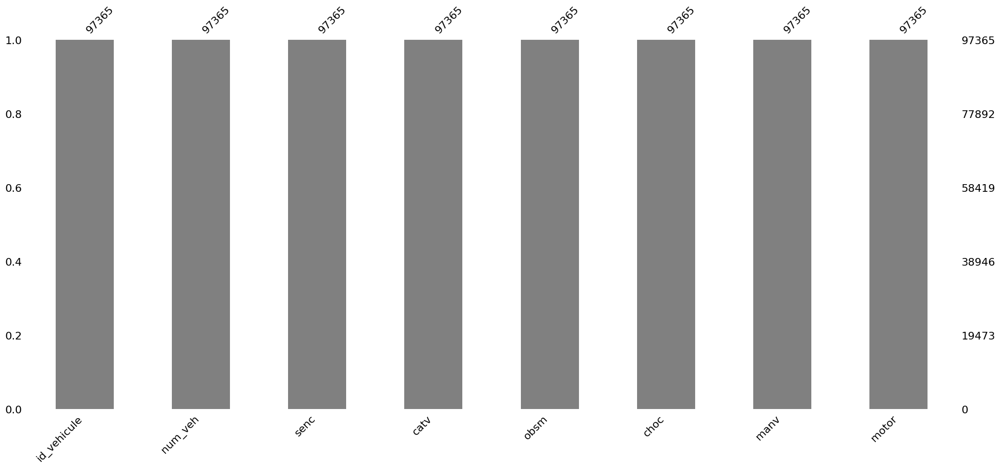

In [134]:
# Visualisation de tout notre dataset
msno.bar(df_veh, sort= "ascending", color= "grey")

In [135]:
# Typage des données
df_lieux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56525 entries, 0 to 56524
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Num_Acc  56525 non-null  int64 
 1   dep      56525 non-null  object
 2   catr     56525 non-null  int64 
 3   circ     56525 non-null  int32 
 4   nbv      56525 non-null  int32 
 5   prof     56525 non-null  int32 
 6   plan     56525 non-null  int32 
 7   surf     56525 non-null  int32 
 8   situ     56525 non-null  int32 
 9   vma      56525 non-null  int32 
dtypes: int32(7), int64(2), object(1)
memory usage: 2.8+ MB


* Nous avons traiter toutes les valeurs manquantes, toutes nos variables sont au bon format, maintenant passons aux valeurs incohérentes

### Gestion des données incohérentes

In [136]:
# Typage des données
df_lieux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56525 entries, 0 to 56524
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Num_Acc  56525 non-null  int64 
 1   dep      56525 non-null  object
 2   catr     56525 non-null  int64 
 3   circ     56525 non-null  int32 
 4   nbv      56525 non-null  int32 
 5   prof     56525 non-null  int32 
 6   plan     56525 non-null  int32 
 7   surf     56525 non-null  int32 
 8   situ     56525 non-null  int32 
 9   vma      56525 non-null  int32 
dtypes: int32(7), int64(2), object(1)
memory usage: 2.8+ MB


#### Variables quantitatives

In [137]:
# Statistiques descriptives 
df_lieux.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Num_Acc,56525,202100028259,16315,202100000001,202100014131,202100028259,202100042388,202100056518
catr,56525,3,1,1,3,3,4,9
circ,56525,2,1,1,2,2,2,4
nbv,56525,2,1,1,2,2,3,12
prof,56525,1,1,1,1,1,1,4
plan,56525,1,1,1,1,1,1,4
surf,56525,1,1,1,1,1,1,9
situ,56525,2,2,1,1,1,1,8
vma,56525,60,24,1,50,50,80,901


* D'aprés la statistique descriptive des variables quantitatives, nous avons des valeurs discrétes
* On remarque avec la variable **vma qui correspond à la vitesse maximale autorisée sur le lieu et au moment de l’accident** qui varie de 1 à 901 ce qui est une erreure.
* Nous allons faire un tableau de contigence afin d'identifier toutes les valeurs incohérentes.

In [138]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_lieux.select_dtypes("number").columns:
    print("=========================================")
    print(df_lieux[i].value_counts(dropna=False), "\n", (df_lieux[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Num_Acc
202100021839    2
202100039502    2
202100055766    2
202100013248    2
202100014522    2
               ..
202100008429    1
202100036816    1
202100020894    1
202100022888    1
202100017773    1
Name: count, Length: 56518, dtype: int64 
 Num_Acc
202100021839   0 
202100039502   0 
202100055766   0 
202100013248   0 
202100014522   0 
               ..
202100008429   0 
202100036816   0 
202100020894   0 
202100022888   0 
202100017773   0 
Name: proportion, Length: 56518, dtype: float64
catr
4    23661
3    20322
1     5422
2     3524
7     2782
6      395
9      356
5       63
Name: count, dtype: int64 
 catr
4   42
3   36
1   10
2    6
7    5
6    1
9    1
5    0
Name: proportion, dtype: float64
circ
2    38168
1    10113
3     7880
4      364
Name: count, dtype: int64 
 circ
2   68
1   18
3   14
4    1
Name: proportion, dtype: float64
nbv
2     36235
4      6724
1      6045
3      4283
6      1467
5       864
8       482
7       194
10      120
9        74
12       22
11 

**intéressons à la variable **vma** qui correspond à la vitesse maximale autorisée sur le lieu et au moment de l’accident.**
* On constate que la vitesse varie de -1 à 901 d'aprés la statistique descriptive, ce qui est anormale car les valeurs cohérentes en contexte réel (en France par exemple).
* Les vitesses suivantes sont des limites officielles classiques :
    * 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 130

* Les valeurs atypiques ou douteuses:
    * -1 : probablement une valeur manquante (non renseigné) codée ainsi.

    * 1, 2, 3, 5, 6, 8, 9, 12, 15, 25, 45, 55, 75 : trop faibles ou non réglementaires.

    * 140, 180 : pas courantes mais possibles dans certains pays ou erreurs de saisie.

    * 300, 500, 501, 502, 520, 700, 770, 900, 901 : irréalistes mais sûrement des erreurs ou codages erronés.
 
**Nous allons procéder comme suit:**
    
* Créer une liste de valeurs de référence.

* Vérifier si les valeurs d’une colonne sont dans cette liste.

* Garder uniquement celles qui sont dans la liste, sinon afficher les valeurs exclues dans un DataFrame

In [139]:
# Liste de référence
ma_liste_vma = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 130]

# Garder les lignes où la valeur est dans la liste
df_valide_vma = df_lieux[df_lieux["vma"].isin(ma_liste_vma)]

# Extraire les lignes exclues
df_exclu_vma = df_lieux[~df_lieux["vma"].isin(ma_liste_vma)]

# Affichage
print("Valeurs gardées dans vma :")
print(df_valide_vma)
print("=================================================")
print("\n Valeurs exclues dans vma :")
print(df_exclu_vma)

Valeurs gardées dans vma :
            Num_Acc  dep  catr  circ  nbv  prof  plan  surf  situ  vma
0      202100022009   40     1     3    3     1     1     1     1  130
1      202100023746   94     4     2    2     1     1     1     1   50
2      202100019549   2A     2     2    2     1     2     1     3   80
3      202100022748   75     4     2    2     2     1     1     1   50
4      202100051993  971     3     2    2     1     1     1     1   50
...             ...  ...   ...   ...  ...   ...   ...   ...   ...  ...
56520  202100056035   76     4     1    2     1     1     1     1   30
56521  202100043915   75     4     1    2     1     1     1     1   30
56522  202100047332   73     4     3    2     1     1     1     1   50
56523  202100016135   64     4     2    3     1     1     1     1   30
56524  202100017773   78     2     3    4     1     1     1     1  110

[56384 rows x 10 columns]

 Valeurs exclues dans vma :
            Num_Acc dep  catr  circ  nbv  prof  plan  surf  situ 

* Nous avons 141 lignes sont sont considérer comme des erreurs, nous n'allons pas les supprimer mais faire une imputation avec le mode.

In [140]:
# Calcul du mode des valeurs autorisées
mode_vma = df_lieux[df_lieux["vma"].isin(ma_liste_vma)]["vma"].mode()[0]
# Remplacement des lignes exclues par le mode
df_lieux.loc[~df_lieux["vma"].isin(ma_liste_vma), "vma"] = mode_vma

In [141]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
print(df_lieux["vma"].value_counts(dropna=False), "\n", (df_lieux["vma"].value_counts(dropna=False, normalize = True) * 100).round(2))

vma
50     30829
80      7681
30      6317
90      4314
70      3987
110     1987
130      993
20       151
10       114
60        93
40        51
100        8
Name: count, dtype: int64 
 vma
50    55
80    14
30    11
90     8
70     7
110    4
130    2
20     0
10     0
60     0
40     0
100    0
Name: proportion, dtype: float64


#### Variable qualitatives

In [142]:
# Statistique descriptive des variables
df_lieux.describe(exclude = "number").T

,count,unique,top,freq
dep,56525,107,75,5070


In [143]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_lieux.select_dtypes("object").columns:
    print("=========================================")
    print(df_lieux[i].value_counts(dropna=False))

dep
75     5070
93     2897
13     2780
94     2493
69     2444
       ... 
90       43
978      40
977      22
986      13
975       5
Name: count, Length: 107, dtype: int64


* On remarque pas des erreurs sur les variables qualitatives.
* Nous obtenons une base de données sans valeurs manquantes, ni doublons et sans valeurs incohérences.

In [144]:
# Typage des données
df_lieux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56525 entries, 0 to 56524
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Num_Acc  56525 non-null  int64 
 1   dep      56525 non-null  object
 2   catr     56525 non-null  int64 
 3   circ     56525 non-null  int32 
 4   nbv      56525 non-null  int32 
 5   prof     56525 non-null  int32 
 6   plan     56525 non-null  int32 
 7   surf     56525 non-null  int32 
 8   situ     56525 non-null  int32 
 9   vma      56525 non-null  int32 
dtypes: int32(7), int64(2), object(1)
memory usage: 2.8+ MB


### 3.1.e) Base des caractéristiques de l'accident

In [145]:
# Faisons une copie pour garder la base d'origine
df_carac = data_carac.copy()
# Afficher les 5 premières lignes de notre base
df_carac.head(5)

,Num_Acc,jour,mois,an,hrmn,lum,com,agg,int,atm,col,adr,lat,long
0,202100037733,28,5,2021,14:15,1,CC_97407,2,2,1,3,JEAN MOULIN (RUE) - RIV. DES GALETS,"-20,95888","55,31743"
1,202100049382,2,3,2021,10:59,1,CC_63113,2,1,1,2,SAINT ROBERT (RUE),"45,79137","3,1162"
2,202100038891,20,5,2021,16:50,1,CC_88160,2,2,1,1,POISSOMPRE (FG DE),"48,18261","6,47218"
3,202100028616,14,7,2021,19:45,1,CC_80021,2,1,1,3,CAGNARD (RUE),"49,90355","2,2872"
4,202100033509,17,6,2021,23:40,3,CC_13214,2,1,1,1,A7-Sens Lyon vers Marseille,"43,34031","5,37689"


### Qualité des données

In [146]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_carac))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_carac))
print("=============================================")
print("Information sur les colonnes:", df_carac.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_carac))
print("=============================================")
print("Types de variables:", type_variable(df_carac))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_carac))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_carac))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_carac))

Nombre de lignes: 56530
Nombre de colonnes: 14
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56530 entries, 0 to 56529
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Num_Acc  56530 non-null  int64 
 1   jour     56530 non-null  int64 
 2   mois     56530 non-null  int64 
 3   an       56530 non-null  int64 
 4   hrmn     56530 non-null  object
 5   lum      56530 non-null  int64 
 6   com      56530 non-null  object
 7   agg      56530 non-null  int64 
 8   int      56530 non-null  int64 
 9   atm      56530 non-null  int64 
 10  col      56530 non-null  int64 
 11  adr      55957 non-null  object
 12  lat      56530 non-null  object
 13  long     56530 non-null  object
dtypes: int64(9), object(5)
memory usage: 6.0+ MB
Information sur les colonnes: None
Total des valeurs manquantes: 573
Types de variables: int64     9
object    5
Name: count, dtype: int64
Pourcentage de valeurs manquantes: Num_Acc   0
jour      0
mois

* Nous avons une base 56530 lignes qui correspondent chacune les caractéristiques d'un accident corporel;
* Présence de valeurs manquantes dans une seule colonne;
* Certaines des variables ne sont pas au bon format que nous allons corriger;
* Présence de doublons purs.

In [147]:
# convertir au bon format
df_carac["lat"] = pd.to_numeric(df_carac["lat"].astype(str).str.replace(",", "."), errors="coerce")
df_carac["long"] = pd.to_numeric(df_carac["long"].astype(str).str.replace(",", "."), errors="coerce")

# Convertir au format date
df_carac["hrmn"] = pd.to_datetime(df_carac["hrmn"], format = '%H:%M', errors = "coerce").dt.time

In [148]:
# Typage des données aprés correction
df_carac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56530 entries, 0 to 56529
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Num_Acc  56530 non-null  int64  
 1   jour     56530 non-null  int64  
 2   mois     56530 non-null  int64  
 3   an       56530 non-null  int64  
 4   hrmn     56530 non-null  object 
 5   lum      56530 non-null  int64  
 6   com      56530 non-null  object 
 7   agg      56530 non-null  int64  
 8   int      56530 non-null  int64  
 9   atm      56530 non-null  int64  
 10  col      56530 non-null  int64  
 11  adr      55957 non-null  object 
 12  lat      56530 non-null  float64
 13  long     56530 non-null  float64
dtypes: float64(2), int64(9), object(3)
memory usage: 6.0+ MB


### Gestion des doublons

In [149]:
# Nombre de doublons purs/parfaits sans la clé primaire
sum(df_carac.duplicated())

11

In [150]:
# Nombre de doublons purs/parfaits avec la clé primaire
sum(df_carac.duplicated("Num_Acc"))

11

* Sur les 56530 lignes qui permettent d'identifier de manière unique les caractéristiques d'un accident, nous avons 11 doublons purs et 11 doublons impurs avec la variable "Num_Acc" comme étant la clé primaire.
* Vérifions les lignes avec les doublons en se basant sur la clé primaire ("Num_Acc").

In [151]:
# Afficher les doublons
doublons_carac = df_carac[df_carac.duplicated(keep = False)].sort_values("Num_Acc")

# Afficher les 11 première lignes
print(doublons_carac.shape)
doublons_carac.head(11)

(22, 14)


,Num_Acc,jour,mois,an,hrmn,lum,com,agg,int,atm,col,adr,lat,long
33687,202100013498,12,10,2021,11:00:00,1,CC_71076,2,2,1,3,Avenue de Paris,47,5
6317,202100013498,12,10,2021,11:00:00,1,CC_71076,2,2,1,3,Avenue de Paris,47,5
25206,202100017917,21,9,2021,09:45:00,1,CC_95280,2,1,1,3,RD 47A,49,2
19025,202100017917,21,9,2021,09:45:00,1,CC_95280,2,1,1,3,RD 47A,49,2
32639,202100023406,19,8,2021,10:00:00,1,CC_97120,2,1,1,6,UNIVERSITE FOUILLOLE,16,-62
420,202100023406,19,8,2021,10:00:00,1,CC_97120,2,1,1,6,UNIVERSITE FOUILLOLE,16,-62
45121,202100027321,23,7,2021,11:10:00,1,CC_97302,2,1,1,3,A.HENRI(RUE),5,-52
50662,202100027321,23,7,2021,11:10:00,1,CC_97302,2,1,1,3,A.HENRI(RUE),5,-52
2994,202100027995,20,7,2021,18:20:00,1,CC_62307,2,1,1,1,Route de Peuplingues,51,2
55470,202100027995,20,7,2021,18:20:00,1,CC_62307,2,1,1,1,Route de Peuplingues,51,2


* Il s'agit des doublons purs donc nous allons supprimer une puis garder l'autre.

In [152]:
# Suppression des doublons
df_carac = df_carac.drop_duplicates(keep = "first").reset_index(drop=True)
print("Le nombre de lignes restantes aprés suppression des doublons est de: ", df_carac.shape)

Le nombre de lignes restantes aprés suppression des doublons est de:  (56519, 14)


### Gestion des données manquantes

* Nous allons faire une affichage afin de mieux visualiser les valeurs manquantes dans chacune des colonnes.

<AxesSubplot: >

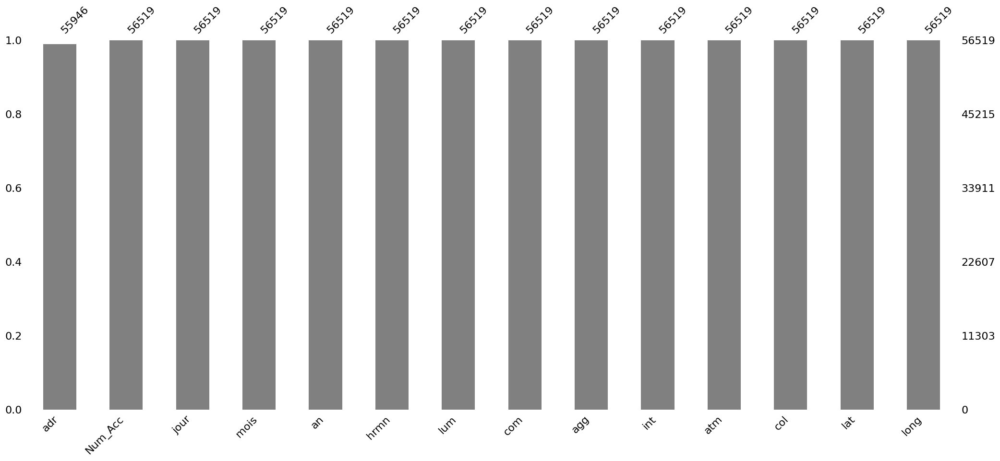

In [153]:
# Visualisation de tout notre dataset
msno.bar(df_carac, sort= "ascending", color= "grey")

**REMARQUE**

* Nous avons une seule colonne avec des valeurs manquantes aprés affichage 
* Certaines colonnes utilisaient des codes spécifiques pour désigner l’absence d’information, notamment les valeurs -1.
* Ces codes ont été considérés comme des données manquantes et vont être convertis en NaN afin d’harmoniser le traitement.

In [154]:
# Remplacer les valeurs non renseignées
df_carac.replace([-1, 0, -0],  np.nan, inplace=True)

* Visualisation aprés remplacement des données non renseignées.

<AxesSubplot: >

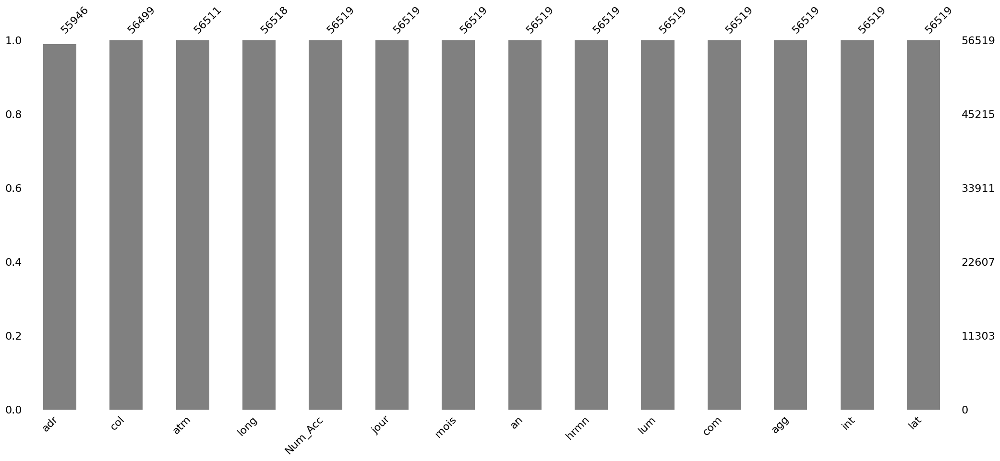

In [155]:
# Visualisation de tout notre dataset
msno.bar(df_carac, sort= "ascending", color= "grey")

In [156]:
# Afficher les valeurs manquantes pour chacune des variables
df_carac.isna().sum()

Num_Acc      0
jour         0
mois         0
an           0
hrmn         0
lum          0
com          0
agg          0
int          0
atm          8
col         20
adr        573
lat          0
long         1
dtype: int64

In [157]:
# Isoler les valeurs manquantes
print(df_carac[df_carac.isna().any(axis = 1)].shape)
df_carac[df_carac.isna().any(axis = 1)].head(6)

(601, 14)


,Num_Acc,jour,mois,an,hrmn,lum,com,agg,int,atm,col,adr,lat,long
64,202100024166,14,8,2021,20:00:00,1,CC_79061,1,1,1,5,NaN,46,-0
287,202100028727,14,7,2021,19:00:00,1,CC_33314,2,6,1,3,NaN,45,-1
448,202100024939,10,8,2021,07:50:00,1,CC_39255,1,3,1,3,NaN,47,5
484,202100046970,10,3,2021,16:20:00,1,CC_33294,2,1,1,6,NaN,45,-0
568,202100029815,9,7,2021,07:20:00,1,CC_1053,2,2,1,2,NaN,46,5
705,202100049028,6,3,2021,19:30:00,2,CC_85003,1,1,1,6,NaN,47,-2


* Nous avons nos variables avec de faible valeurs manquantes, nous n'allons pas les supprimer mais plutôt faire une imputation car supprimer ces lignes (**601**) nous fera perdre d'informations pour les analyses.
* Avant de faire une imputation par le mode, vérifions dabord à l'aide d'un tableau de contigence si le mode est majoritaire ou pas:
    * Mode majoritaire : faire une imputation par le mode
    * Mode non majoritaire faire une imputation aléatoire

In [158]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_carac.select_dtypes("number").columns:
    print("=========================================")
    print(df_carac[i].value_counts(dropna=False), "\n", (df_carac[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Num_Acc
202100037733    1
202100002158    1
202100007757    1
202100028154    1
202100033768    1
               ..
202100022091    1
202100029208    1
202100012846    1
202100048804    1
202100046742    1
Name: count, Length: 56519, dtype: int64 
 Num_Acc
202100037733   0 
202100002158   0 
202100007757   0 
202100028154   0 
202100033768   0 
               ..
202100022091   0 
202100029208   0 
202100012846   0 
202100048804   0 
202100046742   0 
Name: proportion, Length: 56519, dtype: float64
jour
9     1994
8     1958
23    1942
27    1930
19    1921
28    1899
10    1885
12    1881
15    1876
6     1875
18    1874
22    1874
16    1872
13    1871
2     1869
1     1865
25    1864
17    1843
24    1836
3     1815
7     1809
20    1790
29    1789
14    1789
26    1784
21    1773
5     1771
4     1765
11    1750
30    1720
31    1035
Name: count, dtype: int64 
 jour
9    4
8    3
23   3
27   3
19   3
28   3
10   3
12   3
15   3
6    3
18   3
22   3
16   3
13   3
2    3
1    3
25   3

In [159]:
df_carac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56519 entries, 0 to 56518
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Num_Acc  56519 non-null  int64  
 1   jour     56519 non-null  int64  
 2   mois     56519 non-null  int64  
 3   an       56519 non-null  int64  
 4   hrmn     56519 non-null  object 
 5   lum      56519 non-null  int64  
 6   com      56519 non-null  object 
 7   agg      56519 non-null  int64  
 8   int      56519 non-null  int64  
 9   atm      56511 non-null  float64
 10  col      56499 non-null  float64
 11  adr      55946 non-null  object 
 12  lat      56519 non-null  float64
 13  long     56518 non-null  float64
dtypes: float64(4), int64(7), object(3)
memory usage: 6.0+ MB


#### Imputation des valeurs manquantes avec le mode

In [160]:
# Imputation avec le mode
df_carac['atm'] = df_carac['atm'].fillna(df_carac['atm'].mode()[0]).astype(int)
df_carac['long'] = df_carac['long'].fillna(df_carac['long'].mode()[0])

#### Imputation aléatoire

In [161]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_col = df_carac['col'].value_counts(normalize = True)

In [162]:
# Appliquons une fonction à la variable avec la fonction lambda
df_carac['col'] = df_carac['col'].apply(lambda x: 
                   np.random.choice(Mod_col.index, size = 1, 
                                    p = Mod_col.values)[0] if pd.isna(x) else x)

In [163]:
# Convertir au bon format
df_carac['col'] = df_carac['col'].astype(int)             

In [164]:
# Les modalités
print(df_carac["adr"].value_counts(dropna=False), "\n", (df_carac["adr"].value_counts(dropna=False, normalize = True) * 100).round(2))

adr
NaN                                573
AUTOROUTE A86                      351
AUTOROUTE A1                       244
A4                                 241
AUTOROUTE A3                       223
                                  ... 
face au 400 rue du haut              1
COUBERTIN (BOULEVARD PIERRE DE)      1
Chemin du Sermoraz                   1
D1e                                  1
HAIE. RUE DE LA                      1
Name: count, Length: 29669, dtype: int64 
 adr
NaN                               1 
AUTOROUTE A86                     1 
AUTOROUTE A1                      0 
A4                                0 
AUTOROUTE A3                      0 
                                  ..
face au 400 rue du haut           0 
COUBERTIN (BOULEVARD PIERRE DE)   0 
Chemin du Sermoraz                0 
D1e                               0 
HAIE. RUE DE LA                   0 
Name: proportion, Length: 29669, dtype: float64


* On constate qu'il y'a beaucoup d'adresse qu'on ne connait pas, nous pouvons les considérer comme des valeurs non renseignéees
* Alors pour ne pas biaiser les analyses nous allons supprimer la colonne.

#### Suppression de la colonne adr

In [165]:
# Suppression de la colonne
df_carac = df_carac.drop(columns = ["adr"], axis = 1)

In [166]:
# Afficher le pourcentage de valeurs manquantes aprés imputation
pourcentage_valeurs_manquants(df_carac)

Num_Acc   0
jour      0
mois      0
an        0
hrmn      0
lum       0
com       0
agg       0
int       0
atm       0
col       0
lat       0
long      0
dtype: float64

<AxesSubplot: >

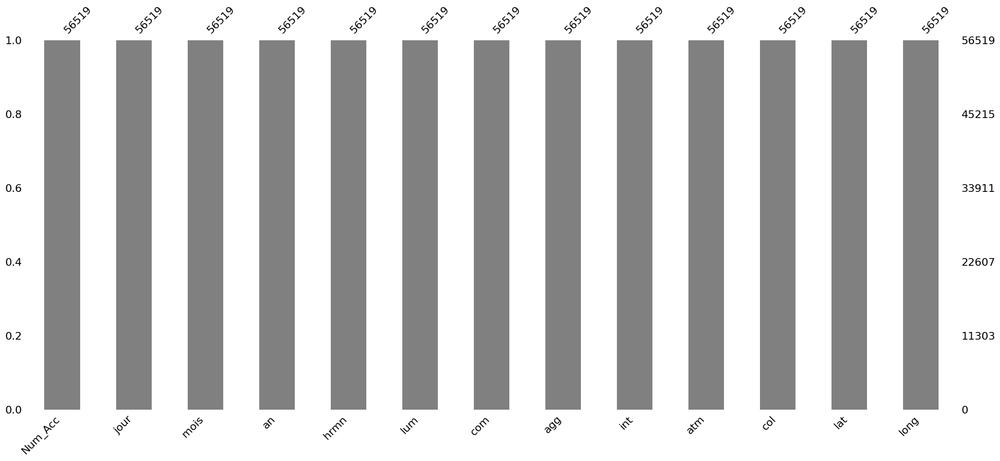

In [167]:
# Visualisation de tout notre dataset
msno.bar(df_carac, sort= "ascending", color= "grey")

In [168]:
# Typage des données
df_carac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56519 entries, 0 to 56518
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Num_Acc  56519 non-null  int64  
 1   jour     56519 non-null  int64  
 2   mois     56519 non-null  int64  
 3   an       56519 non-null  int64  
 4   hrmn     56519 non-null  object 
 5   lum      56519 non-null  int64  
 6   com      56519 non-null  object 
 7   agg      56519 non-null  int64  
 8   int      56519 non-null  int64  
 9   atm      56519 non-null  int32  
 10  col      56519 non-null  int32  
 11  lat      56519 non-null  float64
 12  long     56519 non-null  float64
dtypes: float64(2), int32(2), int64(7), object(2)
memory usage: 5.2+ MB


* Toutes les valeurs manquantes sont traitées et toutes les données sont au bon format.

### Gestion des données incohérentes

#### Variables quantitatives

In [169]:
# Statistiques descriptives 
df_carac.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Num_Acc,56519,202100028259,16316,202100000000,202100014130,202100028259,202100042388,202100056518
jour,56519,16,9,1,8,16,23,31
mois,56519,7,3,1,4,7,10,12
an,56519,2021,0,2021,2021,2021,2021,2021
lum,56519,2,1,1,1,1,2,5
agg,56519,2,0,1,1,2,2,2
int,56519,2,2,1,1,1,2,9
atm,56519,2,2,1,1,1,1,9
col,56519,4,2,1,3,3,6,7
lat,56519,44,12,-23,45,48,49,51


**REMARQUES**

* On constate avec les colonnes **latitude** et **longitude** des valeurs qui varient de **-23** à **51** pour la **latitude**, de **178** à **168** pour la **longitude** qui nous semble anormales.
* Nous allons faire un tableau de contigence afin d'identifier toutes les valeurs incohérentes.

In [170]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
print(df_carac["lat"].value_counts(dropna=False), "\n", (df_carac["lat"].value_counts(dropna=False, normalize = True)))
print("==================================================")
print(df_carac["long"].value_counts(dropna=False), "\n", (df_carac["long"].value_counts(dropna=False, normalize = True)))

lat
-18    11
49     10
49      7
43      7
49      6
       ..
49      1
48      1
49      1
49      1
49      1
Name: count, Length: 54612, dtype: int64 
 lat
-18   0 
49    0 
49    0 
43    0 
49    0 
      ..
49    0 
48    0 
49    0 
49    0 
49    0 
Name: proportion, Length: 54612, dtype: float64
long
-150    12
2        7
5        6
2        6
2        6
        ..
2        1
4        1
2        1
2        1
1        1
Name: count, Length: 54919, dtype: int64 
 long
-150   0 
2      0 
5      0 
2      0 
2      0 
       ..
2      0 
4      0 
2      0 
2      0 
1      0 
Name: proportion, Length: 54919, dtype: float64


* Nous allons corriger ces lignes en définissant des plages valides.

In [171]:
# Définir les plages valides pour la France métropolitaine
lat_min, lat_max = 41.0, 51.5
long_min, long_max = -5.0, 10.0

# Remplacer les valeurs anormales par NaN
df_carac.loc[(df_carac["lat"] < lat_min) | (df_carac["lat"] > lat_max), "lat"] = np.nan
df_carac.loc[(df_carac["long"] < long_min) | (df_carac["long"] > long_max), "long"] = np.nan

In [172]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
print(df_carac["lat"].value_counts(dropna=False), "\n", (df_carac["lat"].value_counts(dropna=False, normalize = True)))
print("==================================================")
print(df_carac["long"].value_counts(dropna=False), "\n", (df_carac["long"].value_counts(dropna=False, normalize = True)))

lat
NaN    2973
49       10
49        7
43        7
49        6
       ... 
49        1
43        1
49        1
44        1
49        1
Name: count, Length: 51723, dtype: int64 
 lat
NaN   0 
49    0 
49    0 
43    0 
49    0 
      ..
49    0 
43    0 
49    0 
44    0 
49    0 
Name: proportion, Length: 51723, dtype: float64
long
NaN    2980
2         7
2         6
5         6
2         6
       ... 
2         1
2         1
5         1
2         1
1         1
Name: count, Length: 51997, dtype: int64 
 long
NaN   0 
2     0 
2     0 
5     0 
2     0 
      ..
2     0 
2     0 
5     0 
2     0 
1     0 
Name: proportion, Length: 51997, dtype: float64


* Aprés remplacement des ces valeurs anormales en valeurs manquantes, nous allons faire une imputation par la médiane.

#### Imputation avec la mediane

In [173]:
# Imputation avec le mode
df_carac['lat'] = df_carac['lat'].fillna(df_carac['lat'].median())
df_carac['long'] = df_carac['long'].fillna(df_carac['long'].median())

In [174]:
# Statistiques descriptives aprés imputation 
df_carac.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Num_Acc,56519,202100028259,16316,202100000000,202100014130,202100028259,202100042388,202100056518
jour,56519,16,9,1,8,16,23,31
mois,56519,7,3,1,4,7,10,12
an,56519,2021,0,2021,2021,2021,2021,2021
lum,56519,2,1,1,1,1,2,5
agg,56519,2,0,1,1,2,2,2
int,56519,2,2,1,1,1,2,9
atm,56519,2,2,1,1,1,1,9
col,56519,4,2,1,3,3,6,7
lat,56519,47,2,41,45,48,49,51


* Toutes les valeurs anormales sont corrigées.

#### Variables qualitatives

In [175]:
# Statistiques descriptives 
df_carac.describe(exclude = "number").T

,count,unique,top,freq
hrmn,56519,1374,18:00:00,769
com,56519,11150,CC_75116,507


In [176]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_carac.select_dtypes("object").columns:
    print("=========================================")
    print(df_carac[i].value_counts(dropna=False))

hrmn
18:00:00    769
17:00:00    706
17:30:00    653
18:30:00    630
16:00:00    613
           ... 
13:31:00      1
04:12:00      1
02:16:00      1
03:11:00      1
04:06:00      1
Name: count, Length: 1374, dtype: int64
com
CC_75116    507
CC_75112    434
CC_75119    384
CC_97302    377
CC_75115    368
           ... 
CC_38163      1
CC_33261      1
CC_49097      1
CC_1135       1
CC_62898      1
Name: count, Length: 11150, dtype: int64


* On remarque juste des erreurs de saisies sur la variable **com**,
* Faire une correction avec la variable **com** de remplacer les **CC_** par rien.

In [177]:
# Correction de la variable "com"
df_carac["com"] = df_carac["com"].astype(str).str.replace("CC_", "", regex=False)

* Nous n'avons plus de valeurs incohérentes.
* Nous obtenons une base de données sans valeurs manquantes, ni doublons et sans valeurs incohérences.

In [178]:
# Le typage des données
df_carac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56519 entries, 0 to 56518
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Num_Acc  56519 non-null  int64  
 1   jour     56519 non-null  int64  
 2   mois     56519 non-null  int64  
 3   an       56519 non-null  int64  
 4   hrmn     56519 non-null  object 
 5   lum      56519 non-null  int64  
 6   com      56519 non-null  object 
 7   agg      56519 non-null  int64  
 8   int      56519 non-null  int64  
 9   atm      56519 non-null  int32  
 10  col      56519 non-null  int32  
 11  lat      56519 non-null  float64
 12  long     56519 non-null  float64
dtypes: float64(2), int32(2), int64(7), object(2)
memory usage: 5.2+ MB


### 3.1.f) Base des types de sinistre

In [179]:
# faire une copie pour garder la base d'origine
df_freq = data_freq.copy()
# Afficher les cinq premières lignes
df_freq.head(5)

,IDpol,Year,Damage,Fire,Other,Theft,TPL,Windscreen
0,90141098.101a,2003,0,0,0,0,0,0
1,90133410.100a,2003,0,0,0,0,0,0
2,90151918.101b,2003,0,0,0,0,0,0
3,90190826.100b,2003,1,0,0,0,0,0
4,90165899.100a,2004,0,0,0,0,0,0


### Qualité des données

In [180]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_freq))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_freq))
print("=============================================")
print("Information sur les colonnes:", df_freq.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_freq))
print("=============================================")
print("Types de variables:", type_variable(df_freq))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_freq))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_freq))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_freq))

Nombre de lignes: 62377
Nombre de colonnes: 8
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62377 entries, 0 to 62376
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   IDpol       62377 non-null  object
 1   Year        62377 non-null  int64 
 2   Damage      62377 non-null  object
 3   Fire        62377 non-null  int64 
 4   Other       62377 non-null  int64 
 5   Theft       62377 non-null  int64 
 6   TPL         62377 non-null  int64 
 7   Windscreen  62377 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 3.8+ MB
Information sur les colonnes: None
Total des valeurs manquantes: 0
Types de variables: int64     6
object    2
Name: count, dtype: int64
Pourcentage de valeurs manquantes: IDpol        0
Year         0
Damage       0
Fire         0
Other        0
Theft        0
TPL          0
Windscreen   0
dtype: float64
Nombre de lignes dupliquées: 7
Statistique descriptive des variables:                 IDp

* Nous avons une base avec 62377 lignes qui correspondent chacune à un type de sinsitres (fréquence de sinistres) que ça soit des dommages, Incendie, Vol, Pare-brise ou Autre survenus par contrat et par année.
* Absence de valeurs manquantes dans toutes les colonnes.
* Toutes les variables sont au bon format.
* Présence de doublons purs.

### Gestion des doublons

In [181]:
# Nombre de doublons purs/parfaits sans la clé primaire
sum(df_freq.duplicated())

7

In [182]:
# Nombre de doublons purs/parfaits avec la clé primaire
sum(df_freq.duplicated("IDpol"))

28475

* Cela signifie que chaque police d'assurance est unique pour un véhicule et un client donné.
* Sur les 62377 police d'assurance automobiles, nous avons 7 doublons purs, 28475 doublons impurs avec la variable "IDpol" qui correspond à l'identifiant unique puis étant la clé primaire.
* Vérifions les lignes avec les doublons .

In [183]:
# Afficher les doublons
doublons_freq = df_freq[df_freq.duplicated(keep = False)].sort_values("IDpol")
# Afficher les 14 premières lignes
print(doublons_freq.shape)
doublons_freq.head(14)

(14, 8)


,IDpol,Year,Damage,Fire,Other,Theft,TPL,Windscreen
53871,90198222.102c,2004,0,0,0,0,0,0
55895,90198222.102c,2004,0,0,0,0,0,0
6988,90218806.102c,2003,0,0,0,0,0,0
27135,90218806.102c,2003,0,0,0,0,0,0
29668,90222565.102c,2003,0,0,0,0,0,0
55010,90222565.102c,2003,0,0,0,0,0,0
31765,90234161.102c,2003,0,0,0,0,0,0
49131,90234161.102c,2003,0,0,0,0,0,0
9034,90235201.102c,2004,0,0,0,0,0,0
44977,90235201.102c,2004,0,0,0,0,0,0


* Aprés affichage on voit bien qu'il s'agit des doublons purs, nous allons garder la première occurence comme étant la bonne puis la deuxième occurence.

#### Suppression des doublons purs

In [184]:
# Suppression des doublons
# keep = firt pour dire que la 1ère ligne est la bonne
doublons_freq = df_freq.drop_duplicates(keep = "first").reset_index(drop=True)
print("Le nombre de lignes restantes aprés suppression des doublons est de: ", doublons_freq.shape)

Le nombre de lignes restantes aprés suppression des doublons est de:  (62370, 8)


In [185]:
#faire une copie
df_freq = doublons_freq.copy()

### Gestion des données manquantes

* Nous allons faire une affichage afin de mieux visualiser les valeurs manquantes dans chacune des colonnes.

<AxesSubplot: >

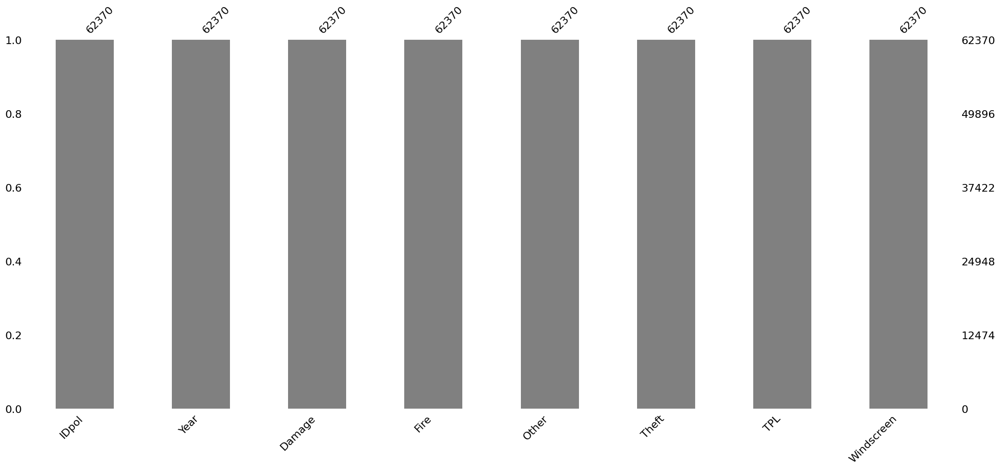

In [186]:
# Visualisation de tout notre dataset
msno.bar(df_freq, sort= "ascending", color= "grey")

In [187]:
# Pourcentage de valeurs manquantes
pourcentage_valeurs_manquants(df_freq)

IDpol        0
Year         0
Damage       0
Fire         0
Other        0
Theft        0
TPL          0
Windscreen   0
dtype: float64

* Nous n'avons de valeurs manquantes dans la base.

### Gestion des données incohérentes

In [188]:
# Le typage des données
df_freq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62370 entries, 0 to 62369
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   IDpol       62370 non-null  object
 1   Year        62370 non-null  int64 
 2   Damage      62370 non-null  object
 3   Fire        62370 non-null  int64 
 4   Other       62370 non-null  int64 
 5   Theft       62370 non-null  int64 
 6   TPL         62370 non-null  int64 
 7   Windscreen  62370 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 3.8+ MB


#### Variables quantitatives

In [189]:
# Statistique descriptive des variables quantitatives uniquement
df_freq.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Year,62370,2003,1,2003,2003,2003,2004,2004
Fire,62370,0,0,0,0,0,0,1
Other,62370,-0,0,-1,0,0,0,1
Theft,62370,0,0,0,0,0,0,2
TPL,62370,0,0,0,0,0,0,3
Windscreen,62370,0,0,0,0,0,0,3


* La description statistique des variables quantitatives, nous montre avec la variable **Other** des valeurs négatives qui varie de -1 à 1 mais aussi avec une moyenne de -0 ce qui est anormale.
* Nous pouvons les considérer comme des anomalies et nous allons les corriger.
* Faisons un tableau de contingence pour identifier les anomalies ainsi que créer des filtres avec des listes de base pour les variables afin de connaitre le nombre de lignes concernées.

In [190]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_freq.select_dtypes("number").columns:
    print("=========================================")
    print(df_freq[i].value_counts(dropna=False), "\n", (df_freq[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Year
2003    31210
2004    31160
Name: count, dtype: int64 
 Year
2003   50
2004   50
Name: proportion, dtype: float64
Fire
0    62258
1      112
Name: count, dtype: int64 
 Fire
0   100
1     0
Name: proportion, dtype: float64
Other
 0    54891
-1     7280
 1      199
Name: count, dtype: int64 
 Other
 0   88
-1   12
 1    0
Name: proportion, dtype: float64
Theft
0    61816
1      542
2       12
Name: count, dtype: int64 
 Theft
0   99
1    1
2    0
Name: proportion, dtype: float64
TPL
0    58194
1     4021
2      145
3       10
Name: count, dtype: int64 
 TPL
0   93
1    6
2    0
3    0
Name: proportion, dtype: float64
Windscreen
0    59180
1     3105
2       82
3        3
Name: count, dtype: int64 
 Windscreen
0   95
1    5
2    0
3    0
Name: proportion, dtype: float64


* On constate que avec la variable **Other** les modalités doivent être 1 et 2, pour celà nous allons créer une liste de base. 

In [191]:
# Liste de référence
ma_liste_other = [0,1]

# Garder les lignes où la valeur est dans la liste
df_valide_other = df_freq[df_freq["Other"].isin(ma_liste_other)]

# Extraire les lignes exclues
df_exclu_other = df_freq[~df_freq["Other"].isin(ma_liste_other)]

# Affichage
print("Valeurs gardées dans Other:")
print(df_valide_other)
print("====================================================")
print("\n Valeurs exclues dans Other :")
print(df_exclu_other)

Valeurs gardées dans Other:
               IDpol  Year Damage  Fire  Other  Theft  TPL  Windscreen
0      90141098.101a  2003      0     0      0      0    0           0
1      90133410.100a  2003      0     0      0      0    0           0
2      90151918.101b  2003      0     0      0      0    0           0
3      90190826.100b  2003      1     0      0      0    0           0
4      90165899.100a  2004      0     0      0      0    0           0
...              ...   ...    ...   ...    ...    ...  ...         ...
62365  90158106.100b  2003      0     0      0      0    0           0
62366  90155850.100a  2003      0     0      0      0    0           0
62367  90148516.100c  2003      0     0      0      0    1           0
62368  90190869.100b  2003      0     0      0      0    0           0
62369  90133354.100a  2004      0     0      0      0    0           0

[55090 rows x 8 columns]

 Valeurs exclues dans Other :
               IDpol  Year Damage  Fire  Other  Theft  TPL  Win

* Maintenant que nous avons détecter ces lignes qui sont au nombre de 7280, nous allons les remplacer par le mode.

In [192]:
# Calcul du mode des valeurs autorisées
mode_Other = df_freq[df_freq["Other"].isin(ma_liste_other)]["Other"].mode()[0]
# Remplacement des lignes exclues par le mode
df_freq.loc[~df_freq["Other"].isin(ma_liste_other), "Other"] = mode_Other

In [193]:
# convertir au bon format
df_freq["Other"] = df_freq["Other"].astype(int)

In [194]:
# Statistique descriptive des variables quantitatives uniquement
df_freq.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Year,62370,2003,1,2003,2003,2003,2004,2004
Fire,62370,0,0,0,0,0,0,1
Other,62370,0,0,0,0,0,0,1
Theft,62370,0,0,0,0,0,0,2
TPL,62370,0,0,0,0,0,0,3
Windscreen,62370,0,0,0,0,0,0,3


#### Variables qualitatives

In [195]:
# Statistique descriptive des variables qualitatives uniquement
df_freq.describe(exclude = "number").T

,count,unique,top,freq
IDpol,62370,33902,90141098.101a,2
Damage,62370,5,0,61338


In [196]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_freq.select_dtypes("object").columns:
    print("=========================================")
    print(df_freq[i].value_counts(dropna=False), "\n", (df_freq[i].value_counts(dropna=False, normalize = True) * 100).round(2))

IDpol
90141098.101a    2
90146038.100a    2
90111492.101b    2
90182591.100a    2
90140566.100a    2
                ..
90158064.100a    1
90113348.100d    1
90154665.101a    1
90252939.100a    1
90155850.100a    1
Name: count, Length: 33902, dtype: int64 
 IDpol
90141098.101a   0 
90146038.100a   0 
90111492.101b   0 
90182591.100a   0 
90140566.100a   0 
                ..
90158064.100a   0 
90113348.100d   0 
90154665.101a   0 
90252939.100a   0 
90155850.100a   0 
Name: proportion, Length: 33902, dtype: float64
Damage
0    61338
1      939
O       73
2       19
o        1
Name: count, dtype: int64 
 Damage
0   98
1    2
O    0
2    0
o    0
Name: proportion, dtype: float64


* On constate aussi des valeurs incohérentes dans la colonne **Damage (Domage)**, nous allons les corriger.

In [197]:
# Liste de référence
ma_liste_domage = ["0","1","2"]

# Garder les lignes où la valeur est dans la liste
df_valide_domage = df_freq[df_freq["Damage"].isin(ma_liste_domage)]

# Extraire les lignes exclues
df_exclu_domage = df_freq[~df_freq["Damage"].isin(ma_liste_domage)]

# Affichage
print("Valeurs gardées dans Domage:")
print(df_valide_domage)
print("====================================================")
print("\n Valeurs exclues dans Domage :")
print(df_exclu_domage)

Valeurs gardées dans Domage:
               IDpol  Year Damage  Fire  Other  Theft  TPL  Windscreen
0      90141098.101a  2003      0     0      0      0    0           0
1      90133410.100a  2003      0     0      0      0    0           0
2      90151918.101b  2003      0     0      0      0    0           0
3      90190826.100b  2003      1     0      0      0    0           0
4      90165899.100a  2004      0     0      0      0    0           0
...              ...   ...    ...   ...    ...    ...  ...         ...
62365  90158106.100b  2003      0     0      0      0    0           0
62366  90155850.100a  2003      0     0      0      0    0           0
62367  90148516.100c  2003      0     0      0      0    1           0
62368  90190869.100b  2003      0     0      0      0    0           0
62369  90133354.100a  2004      0     0      0      0    0           0

[62296 rows x 8 columns]

 Valeurs exclues dans Domage :
               IDpol  Year Damage  Fire  Other  Theft  TPL  W

* Maintenant que nous avons détecter ces lignes qui sont au nombre de 74, nous allons les remplacer par le mode.

In [198]:
# Convertir en chaîne pour filtrer facilement
df_freq["Damage"] = df_freq["Damage"].astype(str)

# Garder uniquement les valeurs valides ("0", "1", "2")
valeurs_valides = ["0", "1", "2"]

# Calculer le mode parmi les valeurs valides
mode_valide = df_freq[df_freq["Damage"].isin(valeurs_valides)]["Damage"].mode()[0]

# Remplacer les valeurs non valides par le mode
df_freq["Damage"] = df_freq["Damage"].apply(lambda x: x if x in valeurs_valides else mode_valide)

# Convertir en int final si tu veux
df_freq["Damage"] = df_freq["Damage"].astype(int)

In [199]:
# Statistique descriptive des variables qualitatives uniquement
df_freq.describe(exclude = "number").T

,count,unique,top,freq
IDpol,62370,33902,90141098.101a,2


* Nous obtenons une base de données sans valeurs manquantes, ni doublons et sans valeurs incohérences.

In [200]:
df_freq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62370 entries, 0 to 62369
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   IDpol       62370 non-null  object
 1   Year        62370 non-null  int64 
 2   Damage      62370 non-null  int32 
 3   Fire        62370 non-null  int64 
 4   Other       62370 non-null  int32 
 5   Theft       62370 non-null  int64 
 6   TPL         62370 non-null  int64 
 7   Windscreen  62370 non-null  int64 
dtypes: int32(2), int64(5), object(1)
memory usage: 3.3+ MB


### 3.1.g) Base des assurés automobiles avec le type de sinistre

In [201]:
# Faire une copie de la base pour garder la base d'origine
df_prem = data_prem.copy()
# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 50)
# Affichage aprés copie
df_prem.head(5)

,IDpol,Year,DrivAge,DrivGender,MaritalStatus,BonusMalus,LicenceNb,PayFreq,JobCode,VehAge,VehClass,VehPower,VehGas,VehUsage,Garage,Area,Region,Channel,Marketing,PremWindscreen,PremDamAll,PremFire,PremAcc1,PremAcc2,PremLegal,PremTPLM,PremTPLV,PremServ,PremTheft,PremTot
0,90182572.101a,2004,32,M,NaN,80,2,Annual,NaN,NaN,Cheap,P12,Regular,Private+trip to office,Street,A7,Headquarters,B,M4,58,0,13,0,56,13,"260,2",14,57,130,"601,2"
1,90104346.102b,2003,37,M,Single,50,2,Annual,Private employee,12,Cheapest,P11,Regular,Private+trip to office,Closed zbox,A9,Headquarters,A,M1,13,0,0,0,0,8,"96,1",5,49,0,"171,1"
2,90134055.100b,2004,36,F,NaN,88,2,Half-yearly,NaN,8,Expensive,P16,Diesel,Private+trip to office,Opened collective parking,A2,Center,L,M2,164,0,0,0,48,16,"355,6",19,49,0,"651,6"
3,90144845.100a,2004,45,M,NaN,50,1,Monthly,NaN,7,Cheapest,P11,Regular,Private+trip to office,Street,A7,South West,A,M4,16,0,4,0,58,11,"141,3",8,60,51,"349,3"
4,90132238.100a,2003,51,M,NaN,50,3,Half-yearly,NaN,5,Cheap,P13,Diesel,Private+trip to office,Closed zbox,A5,Center,A,M1,31,161,5,0,53,12,"143,7",8,53,53,"519,7"


### Qualité des données

In [202]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_prem))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_prem))
print("=============================================")
print("Information sur les colonnes:", df_prem.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_prem))
print("=============================================")
print("Types de variables:", type_variable(df_prem))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_prem))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_prem))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_prem))

Nombre de lignes: 53456
Nombre de colonnes: 30
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53456 entries, 0 to 53455
Data columns (total 30 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   IDpol           53456 non-null  object 
 1   Year            53456 non-null  int64  
 2   DrivAge         53440 non-null  object 
 3   DrivGender      53456 non-null  object 
 4   MaritalStatus   17507 non-null  object 
 5   BonusMalus      52948 non-null  float64
 6   LicenceNb       53456 non-null  int64  
 7   PayFreq         53456 non-null  object 
 8   JobCode         17507 non-null  object 
 9   VehAge          52635 non-null  float64
 10  VehClass        53456 non-null  object 
 11  VehPower        53414 non-null  object 
 12  VehGas          53456 non-null  object 
 13  VehUsage        52963 non-null  object 
 14  Garage          51975 non-null  object 
 15  Area            53456 non-null  object 
 16  Region          53456 non-nul

* Nous avons une base avec 53456 lignes qui correspondent chacune à un assuré avec le type de sinistre ainsi que les caractéristiques(l'identité) de l'assuré;
* Présence de valeurs manquantes dans deux variables.
* Certaines des variables ne sont pas au bon format.
* Présence de doublons purs.

In [203]:
# Convertir uniquement les valeurs valides en nombres
df_prem["DrivAge"] = pd.to_numeric(df_prem["DrivAge"], errors="coerce")

### Gestion des doublons

In [204]:
# Nombre de doublons purs/parfaits sans la clé primaire
sum(df_prem.duplicated())

1054

In [205]:
# Nombre de doublons purs/parfaits avec la clé primaire
sum(df_prem.duplicated(["IDpol"]))

21339

* Sur les 53456 lignes des assurés, nous avons 1054 doublons purs, 21339 doublons impurs avec la variable "IDpol" qui correspond à l'identifiant unique puis étant la clé primaire.
* Identifions les lignes avec les doublons .

In [206]:
# Afficher les doublons
doublons_prem = df_prem[df_prem.duplicated(keep = False)].sort_values("IDpol")
# Afficher les 16 premières lignes
print(doublons_prem.shape)
doublons_prem.head(16)

(2108, 30)


,IDpol,Year,DrivAge,DrivGender,MaritalStatus,BonusMalus,LicenceNb,PayFreq,JobCode,VehAge,VehClass,VehPower,VehGas,VehUsage,Garage,Area,Region,Channel,Marketing,PremWindscreen,PremDamAll,PremFire,PremAcc1,PremAcc2,PremLegal,PremTPLM,PremTPLV,PremServ,PremTheft,PremTot
48893,1000499.100a,2003,26,M,Divorced,68,1,Annual,Private employee,6,Cheapest,P9,Diesel,Private+trip to office,Closed zbox,A7,Headquarters,A,M1,13,0,3,0,0,10,"163,1",8,54,32,"283,1"
16194,1000499.100a,2003,26,M,Divorced,68,1,Annual,Private employee,6,Cheapest,P9,Diesel,Private+trip to office,Closed zbox,A7,Headquarters,A,M1,13,0,3,0,0,10,"163,1",8,54,32,"283,1"
26257,1000519.100a,2004,42,F,Cohabiting,50,1,Annual,Private employee,11,Cheapest,P8,Regular,Private+trip to office,Closed zbox,A2,Headquarters,A,M1,0,0,0,0,0,8,"89,5",5,58,0,"160,5"
11924,1000519.100a,2004,42,F,Cohabiting,50,1,Annual,Private employee,11,Cheapest,P8,Regular,Private+trip to office,Closed zbox,A2,Headquarters,A,M1,0,0,0,0,0,8,"89,5",5,58,0,"160,5"
48361,1000605.100b,2003,53,F,Cohabiting,50,2,Half-yearly,Private employee,13,Cheap,P11,Regular,Private+trip to office,Closed collective parking,A9,Headquarters,A,M3,26,0,0,0,0,8,"98,3",5,47,0,"184,3"
47900,1000605.100b,2003,53,F,Cohabiting,50,2,Half-yearly,Private employee,13,Cheap,P11,Regular,Private+trip to office,Closed collective parking,A9,Headquarters,A,M3,26,0,0,0,0,8,"98,3",5,47,0,"184,3"
47972,1001352.100a,2003,36,F,Widowed,53,2,Annual,Public employee,4,Cheapest,P9,Regular,Private+trip to office,Closed zbox,A5,Headquarters,A,M1,11,80,2,0,50,8,"103,7",5,55,23,"337,7"
43251,1001352.100a,2003,36,F,Widowed,53,2,Annual,Public employee,4,Cheapest,P9,Regular,Private+trip to office,Closed zbox,A5,Headquarters,A,M1,11,80,2,0,50,8,"103,7",5,55,23,"337,7"
34124,1001548.100a,2003,33,M,Married,72,2,Half-yearly,Other,9,Cheap,P12,Diesel,Private+trip to office,Closed collective parking,A3,Headquarters,A,M3,51,191,8,0,0,10,"185,8",10,57,80,"592,8"
46648,1001548.100a,2003,33,M,Married,72,2,Half-yearly,Other,9,Cheap,P12,Diesel,Private+trip to office,Closed collective parking,A3,Headquarters,A,M3,51,191,8,0,0,10,"185,8",10,57,80,"592,8"


#### Suppression des doublons purs

In [207]:
# Suppression des doublons
# keep = firt pour dire que la 1ère ligne est la bonne
doublons_prem = df_prem.drop_duplicates(keep = "first").reset_index(drop=True)
print("Le nombre de lignes restantes aprés suppression des doublons est de: ", doublons_prem.shape)

Le nombre de lignes restantes aprés suppression des doublons est de:  (52402, 30)


In [208]:
# Faire une copie
df_prem = doublons_prem.copy()

### Gestion des données manquantes

* Faire une visualisation afin me mieux connaitre le nombre de valeurs manquantes dans chacune des colonnes.

<AxesSubplot: >

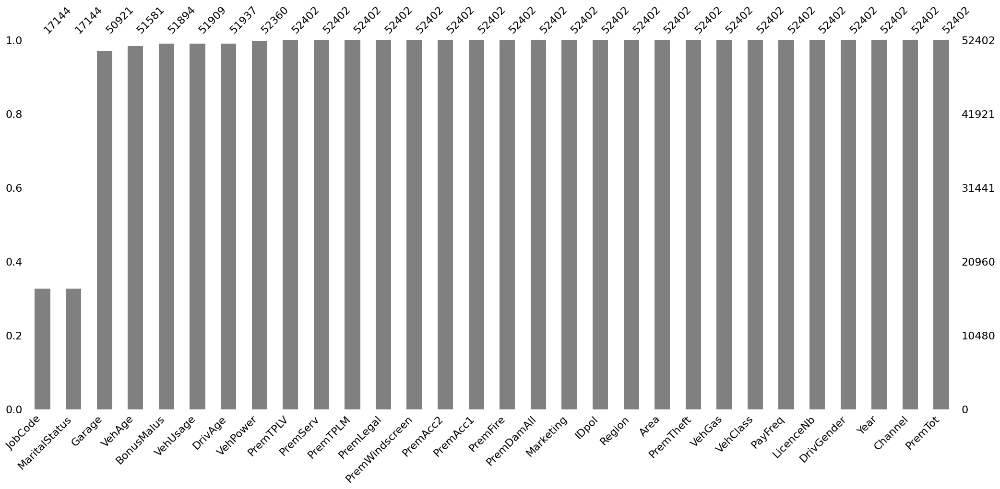

In [209]:
# Visualisation de tout notre dataset
msno.bar(df_prem, sort= "ascending", color= "grey")

In [210]:
# la somme de VM pour chaque colonne
df_prem.isna().sum()

IDpol                 0
Year                  0
DrivAge             465
DrivGender            0
MaritalStatus     35258
BonusMalus          508
LicenceNb             0
PayFreq               0
JobCode           35258
VehAge              821
VehClass              0
VehPower             42
VehGas                0
VehUsage            493
Garage             1481
Area                  0
Region                0
Channel               0
Marketing             0
PremWindscreen        0
PremDamAll            0
PremFire              0
PremAcc1              0
PremAcc2              0
PremLegal             0
PremTPLM              0
PremTPLV              0
PremServ              0
PremTheft             0
PremTot               0
dtype: int64

* On constate qu'on a deux colonne avec plus de 60% de valeurs manquantes(**MaritalStatus** et **JobCode**), nous allons les supprimer.
* Pour le reste des autres colonnes avec VM nous allons faire de l'imputation.

#### Suppression des colonnes avec plusieurs valeurs manquantes

In [211]:
df_prem = df_prem.drop(columns = ["MaritalStatus", "JobCode"], axis = 1)

#### Imputatition des valeurs manquantes

In [212]:
# faisons une séparation sous forme de liste des variables quantitatives et qualitatives
num_data = df_prem.select_dtypes(include=["number"]).columns.to_list()
# afficher les variables quantitatives
print("Liste des variables quantitatives:", num_data)
print("=============================================================================================================================================")
# afficher les variables qualitatives
cat_data = df_prem.select_dtypes("object").columns.to_list()
print("Liste des variables qualitatives:", cat_data)

Liste des variables quantitatives: ['Year', 'DrivAge', 'BonusMalus', 'LicenceNb', 'VehAge', 'PremWindscreen', 'PremDamAll', 'PremFire', 'PremAcc1', 'PremAcc2', 'PremLegal', 'PremTPLV', 'PremServ', 'PremTheft']
Liste des variables qualitatives: ['IDpol', 'DrivGender', 'PayFreq', 'VehClass', 'VehPower', 'VehGas', 'VehUsage', 'Garage', 'Area', 'Region', 'Channel', 'Marketing', 'PremTPLM', 'PremTot']


#### Variables quantitatives

* Nous allons faire une imputation par la mediane

In [213]:
# Imputation des variables quantitatives
df_prem['DrivAge'] = df_prem['DrivAge'].fillna(df_prem['DrivAge'].median())
df_prem['BonusMalus'] = df_prem['BonusMalus'].fillna(df_prem['BonusMalus'].median())
df_prem['DrivAge'] = df_prem['DrivAge'].fillna(df_prem['DrivAge'].median())
df_prem['VehAge'] = df_prem['VehAge'].fillna(df_prem['DrivAge'].median())

#### Variables qualitatives

* Avant de faire une imputation par le mode, vérifions dabord à l'aide d'un tableau de contigence si le mode est majoritaire ou pas:
    * Mode majoritaire : faire une imputation par le mode
    * Mode non majoritaire faire une imputation aléatoire

In [214]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
print(df_prem["VehPower"].value_counts(dropna=False), "\n", (df_prem["VehPower"].value_counts(dropna=False, normalize = True) * 100).round(2))
print("=========================================")
print(df_prem["VehUsage"].value_counts(dropna=False), "\n", (df_prem["VehUsage"].value_counts(dropna=False, normalize = True) * 100).round(2))
print("=========================================")
print(df_prem["Garage"].value_counts(dropna=False), "\n", (df_prem["Garage"].value_counts(dropna=False, normalize = True) * 100).round(2))

VehPower
P10    9215
P12    8405
P11    8386
P9     6740
P13    6663
P8     5233
P14    3798
P15    1520
P7      949
P16     727
P5      602
P17      58
P4       47
NaN      42
P2       15
P6        2
Name: count, dtype: int64 
 VehPower
P10   18
P12   16
P11   16
P9    13
P13   13
P8    10
P14    7
P15    3
P7     2
P16    1
P5     1
P17    0
P4     0
NaN    0
P2     0
P6     0
Name: proportion, dtype: float64
VehUsage
Private+trip to office    49986
Professional               1073
NaN                         493
???                         431
Professional run            419
Name: count, dtype: int64 
 VehUsage
Private+trip to office   95
Professional              2
NaN                       1
???                       1
Professional run          1
Name: proportion, dtype: float64
Garage
Closed zbox                  25804
Closed collective parking     9651
Opened collective parking     8413
Street                        7053
NaN                           1481
Name: count, dtype: int6

#### Imputation par le mode

In [215]:
# Imputation avec le mode
df_prem['VehUsage'] = df_prem['VehUsage'].fillna(df_prem['VehUsage'].mode()[0])

#### Imputation aléatoire

In [216]:
# Tableau de contigence pour l'appliquer à la fonction lambda
Mod_power = df_prem['VehPower'].value_counts(normalize = True)
Mod_garage = df_prem['Garage'].value_counts(normalize = True)

In [217]:
# Appliquons une fonction à la variable avec la fonction lambda
df_prem['Garage'] = df_prem['Garage'].apply(lambda x: 
                   np.random.choice(Mod_garage.index, size = 1, 
                                    p = Mod_garage.values)[0] if pd.isna(x) else x)

In [218]:
# Appliquons une fonction à la variable avec la fonction lambda
df_prem['VehPower'] = df_prem['VehPower'].apply(lambda x: 
                   np.random.choice(Mod_power.index, size = 1, 
                                    p = Mod_power.values)[0] if pd.isna(x) else x)

In [219]:
# valeurs manquantes
df_prem.isna().sum()

IDpol             0
Year              0
DrivAge           0
DrivGender        0
BonusMalus        0
LicenceNb         0
PayFreq           0
VehAge            0
VehClass          0
VehPower          0
VehGas            0
VehUsage          0
Garage            0
Area              0
Region            0
Channel           0
Marketing         0
PremWindscreen    0
PremDamAll        0
PremFire          0
PremAcc1          0
PremAcc2          0
PremLegal         0
PremTPLM          0
PremTPLV          0
PremServ          0
PremTheft         0
PremTot           0
dtype: int64

<AxesSubplot: >

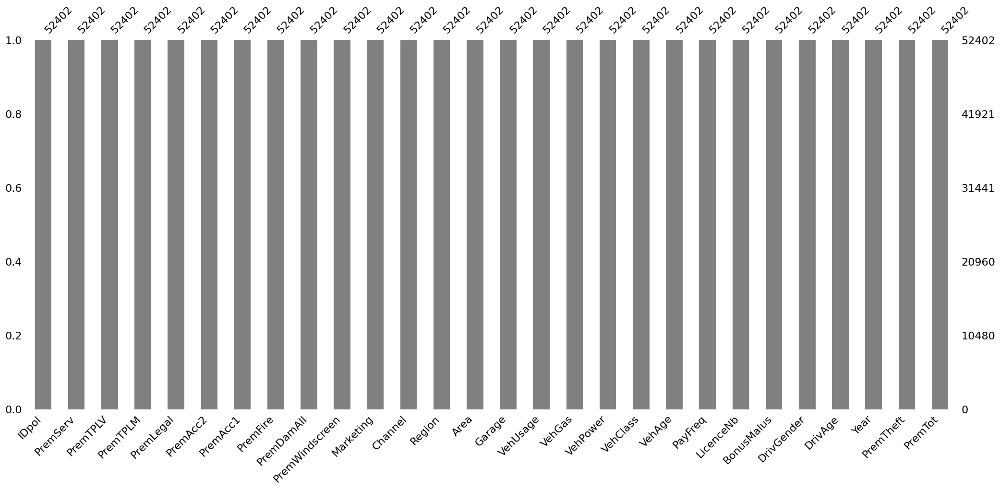

In [220]:
# Visualisation de tout notre dataset
msno.bar(df_prem, sort= "ascending", color= "grey")

* Toutes les valeurs manquantes sont traitées.
* Passons à la gestion des valeurs incohérentes.

### Gestion des valeurs incohérentes

In [221]:
# Statistique descriptive des variables quantitatives uniquement
df_prem.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IDpol,52402,32117,90178166.100b,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,52402,NaN,NaN,NaN,2003,0,2003,2003,2003,2004,2004
DrivAge,52402,NaN,NaN,NaN,40,12,10,31,38,47,456
DrivGender,52402,3,M,33872,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BonusMalus,52402,NaN,NaN,NaN,63,16,0,50,57,72,156
LicenceNb,52402,NaN,NaN,NaN,2,1,1,1,2,2,7
PayFreq,52402,5,Half-yearly,29234,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VehAge,52402,NaN,NaN,NaN,8,6,0,4,7,10,89
VehClass,52402,9,Cheapest,18067,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VehPower,52402,15,P10,9224,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [222]:
# Conversion propre : remplacer virgule par point, puis convertir en float
df_prem["PremTPLM"] = df_prem["PremTPLM"].astype(str).str.replace(",", ".").astype(float)
df_prem["PremTot"] = df_prem["PremTot"].astype(str).str.replace(",", ".").astype(float)

**REMARQUES**

* **IDpol**: Identifiant de la police d'assurance.

    * Nous avons 32117 valeurs uniques sur 53456 lignes, ce qui suggère que certaines polices ont plusieurs contrats avec le top = 90156002.100c(valeur la plus fréquente qui est 4 fois).

* **Year**: Année de souscription.

    * Toutes les valeurs sont 2003 ou 2004 ce qui veux dire qu'on a un jeu de données sur 2 ans.

* **DrivAge**: Âge du conducteur.

    * Nous avons la moyenne d'âge égale à 40 ans, avec un minimum égal à 10 et un maximum égal à 456 :

    * 10 ans : trop jeune pour conduire (ce qui peux être une anomalie).

    * 456 ans : valeur incohérente à nettoyer (entre 18 et 100 avec ex : par la médiane ou une valeur raisonnable)

* **DrivGender**: Sexe du conducteur.

    * Nous avons 3 modalités ce qui est anormale (une autre ? présente et à corriger).

    * La modalité M est plus nombreuse 34 557 occurrences.

* **BonusMalus**: Coefficient de bonus/malus assurance.

    * La moyenne est égale à 63 avec un minimum égale à 0 et un maximum égale à 156.
 
    * Une valeur maximale de 156 , ce qui est anormal pour un bonus d'assurance. Généralement, un bonus/malus varie entre 0.5 et 3.50

    * Cohérent si le système est sur une base 100, mais à valider selon ton contexte.

* **LicenceNb**: L'âge du permis de conduire (ou années de permis ?).

    * Nous avons moyenne d'ancienneté du permis de conduire égale à 2 et un maximum égal à 7.
 
    * On peux dire qu'on a une porte feuille trés jeune.

* **PayFreq**: Fréquence de paiement.

    * La fréquence de paiement : Le prix de la couverture d'assurance peut être payé annuellement, semestriellement, trimestriellement ou mensuellement.

    * Nous avons 5 modalités présentes avec Half-yearly qui est au top (à corriger).

* **VehAge**: Âge du véhicule.

    * Nous avons la moyenne des véhicules égale à 8 et l'âge maximale égale à 89

    * Ce qui peux être rare comme âge maximale d'un véhicule.
 
    * Solution: À nettoyer au-delà de 40 ans (véhicules anciens rares).

* **POUR LE RESTE DES VARIABLE**

* **VehClass**, **VehPower**, **VehGas**, **VehUsage**, **Garage**, **Area**, **Region**, **Channel**, **Marketing** qui correspondent aux variables catégorielles liées au véhicule, usage, zone, canal, etc... on ne remarque pas aucune incohérence apparente.

#### Variables quantitatives

In [223]:
# Statistique descriptive des variables quantitatives uniquement
df_prem.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Year,52402,2003,0,2003,2003,2003,2004,2004
DrivAge,52402,40,12,10,31,38,47,456
BonusMalus,52402,63,16,0,50,57,72,156
LicenceNb,52402,2,1,1,1,2,2,7
VehAge,52402,8,6,0,4,7,10,89
PremWindscreen,52402,26,20,0,13,22,35,264
PremDamAll,52402,83,106,0,0,0,144,1429
PremFire,52402,4,4,0,0,4,7,51
PremAcc1,52402,13,17,0,0,0,32,71
PremAcc2,52402,15,24,0,0,0,45,198


In [224]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_prem.select_dtypes("number").columns:
    print("=========================================")
    print(df_prem[i].value_counts(dropna=False), "\n", (df_prem[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Year
2003    32402
2004    20000
Name: count, dtype: int64 
 Year
2003   62
2004   38
Name: proportion, dtype: float64
DrivAge
32     2137
30     2078
38     2026
31     2015
35     1987
       ... 
14        1
96        1
245       1
16        1
190       1
Name: count, Length: 86, dtype: int64 
 DrivAge
32    4 
30    4 
38    4 
31    4 
35    4 
      ..
14    0 
96    0 
245   0 
16    0 
190   0 
Name: proportion, Length: 86, dtype: float64
BonusMalus
50     19561
57      2613
80      2503
85      2466
64      2385
       ...  
145        2
120        2
126        1
99         1
89         1
Name: count, Length: 69, dtype: int64 
 BonusMalus
50    37
57     5
80     5
85     5
64     5
      ..
145    0
120    0
126    0
99     0
89     0
Name: proportion, Length: 69, dtype: float64
LicenceNb
2    33580
1    13216
3     4261
4     1170
5      143
6       31
7        1
Name: count, dtype: int64 
 LicenceNb
2   64
1   25
3    8
4    2
5    0
6    0
7    0
Name: proportion, dtype: f

#### Gestion de la variable DrivAge

* On remarque des condeucteurs mineurs (âge = 10ans) et des condeucteurs trés âgés (âge maximum = 456ans)
* Nous allons fixer une limite pour lâge des conducteurs qui varie de 18ans à 100ans,
* Ensuite les identifier puis faire une imputaion par la mediane.

In [225]:
# filtre en isolant les anomalies
df_anomalie = df_prem[(df_prem["DrivAge"] < 18) | (df_prem["DrivAge"] > 100)]
print(df_anomalie.shape)
df_anomalie

(17, 28)


,IDpol,Year,DrivAge,DrivGender,BonusMalus,LicenceNb,PayFreq,VehAge,VehClass,VehPower,VehGas,VehUsage,Garage,Area,Region,Channel,Marketing,PremWindscreen,PremDamAll,PremFire,PremAcc1,PremAcc2,PremLegal,PremTPLM,PremTPLV,PremServ,PremTheft,PremTot
4053,90187818.101b,2004,12,M,60,2,Annual,15,Cheapest,P7,Regular,Private+trip to office,Closed zbox,A7,South West,L,M1,13,0,0,0,46,5,82,4,56,0,206
5272,90134591.101b,2003,178,M,54,2,Half-yearly,14,Cheaper,P10,Regular,Private+trip to office,Closed zbox,A7,Paris area,A,M1,0,0,0,32,0,9,118,6,52,0,217
8348,90139000.100a,2004,155,M,58,2,Half-yearly,21,Cheapest,P7,Regular,Private+trip to office,Closed zbox,A3,Center,A,M1,0,0,0,29,0,4,65,0,57,0,155
13285,90117664.101a,2003,167,M,50,2,Half-yearly,8,Cheaper,P12,Diesel,Private+trip to office,Closed collective parking,A3,Center,A,M3,14,120,4,0,0,8,92,5,45,46,334
16453,90177835.100c,2003,456,M,50,3,Annual,8,Cheap,P14,Regular,Private+trip to office,Closed zbox,A7,South West,L,M1,29,0,5,0,52,11,139,7,52,56,351
22343,90157600.101c,2003,11,M,50,2,Quarterly,16,Cheapest,P8,Regular,Private+trip to office,Closed collective parking,A3,Center,A,M3,0,0,0,0,46,5,61,3,57,0,172
25328,90182774.101a,2003,176,M,64,2,Half-yearly,8,Cheap,P12,Diesel,Private+trip to office,Closed collective parking,A3,Center,L,M3,35,0,7,0,47,9,135,7,50,69,359
25502,90179457.100c,2003,13,F,50,2,Half-yearly,1,Cheaper,P9,Regular,Private+trip to office,Opened collective parking,A5,Center,A,M2,20,125,5,35,0,10,125,7,57,56,440
26534,90124573.101b,2003,10,M,64,2,Annual,2,Cheap,P12,Diesel,Private+trip to office,Closed collective parking,A5,Headquarters,A,M3,41,209,10,38,0,12,187,10,58,101,666
27687,90179878.102a,2004,14,M,50,2,Annual,12,Cheap,P13,Regular,Professional,Closed zbox,A3,Headquarters,A,M1,28,0,0,33,0,10,120,5,51,0,247


* Nous avons détecter 17 lignes (conducteurs) avec les anomalies, remplaçons ces valeurs par la mediane.

In [226]:
# Calcul de la médiane sur les valeurs normales
mediane_age = df_prem[(df_prem["DrivAge"] >= 18) & (df_prem["DrivAge"] <= 100)]["DrivAge"].median()

# Imputation des valeurs incohérentes par la mediane
df_prem.loc[(df_prem["DrivAge"] < 18) | (df_prem["DrivAge"] > 100), "DrivAge"] = mediane_age

In [227]:
# Stats descriptive aprés imputation
df_prem["DrivAge"].describe()

count   52402
mean       40
std        12
min        18
25%        31
50%        38
75%        47
max        97
Name: DrivAge, dtype: float64

#### Gestion de la variable VehAge

 * Les âges entre 0 et 30 ans sont très fréquents ce qui nous semble normaux.

 * Des valeurs comme 60, 68, 69, 77, 78, 79, 89 sont rares et probablement aberrantes.

 * Même 42, 44 sont très marginaux (3 occurrences), donc peuvent être considérés comme anomalies selon le seuil de tolérance qu'on va fixer.

**Solution**: Nous allons fixer un seuil maximum égal à 40 ans, afin de calculer la mediane.

In [228]:
# Seuil maximum à ne pas dépasser
seuil_max = 40

# Calculer la médiane des valeurs plausibles
mediane_veh = df_prem[df_prem["VehAge"] <= seuil_max]["VehAge"].median()

# Remplacer les valeurs anormales par la médiane
df_prem.loc[df_prem["VehAge"] > seuil_max, "VehAge"] = mediane_veh

In [229]:
# Stats descriptive aprés imputation
df_prem["VehAge"].describe()

count   52402
mean        8
std         6
min         0
25%         4
50%         7
75%        10
max        40
Name: VehAge, dtype: float64

In [230]:
# Statistique descriptive des variables quantitatives uniquement
df_prem.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Year,52402,2003,0,2003,2003,2003,2004,2004
DrivAge,52402,40,12,18,31,38,47,97
BonusMalus,52402,63,16,0,50,57,72,156
LicenceNb,52402,2,1,1,1,2,2,7
VehAge,52402,8,6,0,4,7,10,40
PremWindscreen,52402,26,20,0,13,22,35,264
PremDamAll,52402,83,106,0,0,0,144,1429
PremFire,52402,4,4,0,0,4,7,51
PremAcc1,52402,13,17,0,0,0,32,71
PremAcc2,52402,15,24,0,0,0,45,198


#### Gestion de la variable PremTot

 * En assurance, le total des primes (souvent appelé prime totale ou PremTot dans tes données) désigne la somme que l’assuré doit payer à l’assureur pour l’ensemble des garanties souscrites.
 * Toutes les colonnes Prem... sont des montants (en euros) liés à différents types de couverture :

    * PremWindscreen qui correspond à la bris de glace
    * PremDamAll qui correspond aux dommages tous accidents
    * PremFire qui correspond à une	incendie
    * PremAcc1, PremAcc2 qui correspond chacune à un accident corporel (différentes options ?)
    * PremLegal qui correspond à une protection juridique semble réaliste
    * PremTPLM, PremTPLV qui correspond chacune à une responsabilité civile (matérielle ou corporelle)
    * PremServ	qui correspond à des services annexes
    * PremTheft qui correpond à un vol
    * PremTot qui correspond le	total des primes avec un minimum égale à 0 et un maximum égal à 3163 ce qui est suspect : pourquoi une prime totale à 0 avec des primes partielles renseignées
 * Nous allons corriger les lignes où PremTot == 0 en procédant de la manière suivante:
    * Vérifier si une sous-prime est > 0
    * Si oui, recalculer et corriger PremTot
    * Sinon, laisser tel quel (ou éventuellement exclure)

In [231]:
# Liste des sous-primes utilisées
cols_primes = ["PremWindscreen", "PremDamAll", "PremFire", "PremAcc1", "PremAcc2",
               "PremLegal", "PremTPLM", "PremTPLV", "PremServ", "PremTheft"]

In [232]:
# Créer une colonne temporaire qui calcule la vraie somme
df_prem["PremTot_calcule"] = df_prem[cols_primes].sum(axis = 1)

In [233]:
# Afficher les 7 premières lignes
df_prem.head(7)

,IDpol,Year,DrivAge,DrivGender,BonusMalus,LicenceNb,PayFreq,VehAge,VehClass,VehPower,VehGas,VehUsage,Garage,Area,Region,Channel,Marketing,PremWindscreen,PremDamAll,PremFire,PremAcc1,PremAcc2,PremLegal,PremTPLM,PremTPLV,PremServ,PremTheft,PremTot,PremTot_calcule
0,90182572.101a,2004,32,M,80,2,Annual,38,Cheap,P12,Regular,Private+trip to office,Street,A7,Headquarters,B,M4,58,0,13,0,56,13,260,14,57,130,601,601
1,90104346.102b,2003,37,M,50,2,Annual,12,Cheapest,P11,Regular,Private+trip to office,Closed zbox,A9,Headquarters,A,M1,13,0,0,0,0,8,96,5,49,0,171,171
2,90134055.100b,2004,36,F,88,2,Half-yearly,8,Expensive,P16,Diesel,Private+trip to office,Opened collective parking,A2,Center,L,M2,164,0,0,0,48,16,356,19,49,0,652,652
3,90144845.100a,2004,45,M,50,1,Monthly,7,Cheapest,P11,Regular,Private+trip to office,Street,A7,South West,A,M4,16,0,4,0,58,11,141,8,60,51,349,349
4,90132238.100a,2003,51,M,50,3,Half-yearly,5,Cheap,P13,Diesel,Private+trip to office,Closed zbox,A5,Center,A,M1,31,161,5,0,53,12,144,8,53,53,520,520
5,90173083.101a,2004,40,M,50,2,Annual,15,Cheapest,P9,Regular,Private+trip to office,Closed collective parking,A9,Headquarters,A,M4,0,0,0,30,0,7,85,0,50,0,172,172
6,90184879.100a,2003,43,M,0,2,Annual,5,Cheaper,P12,Regular,Private+trip to office,Closed collective parking,A3,Center,A,M3,21,133,5,0,47,9,128,6,50,55,454,454


In [234]:
# Identifier les anomalies : PremTot = 0 mais des sous-primes existent
condition_anomalie = (df_prem["PremTot"] == 0) & (df_prem["PremTot_calcule"] > 0)
print(condition_anomalie.shape)
# afficher les anomalies
condition_anomalie

(52402,)


0        False
1        False
2        False
3        False
4        False
         ...  
52397    False
52398    False
52399    False
52400    False
52401    False
Length: 52402, dtype: bool

In [235]:
# Corriger les anomalies
df_prem.loc[condition_anomalie, "PremTot"] = df_prem.loc[condition_anomalie, "PremTot_calcule"]

In [236]:
# supprimer la colonne temporaire
df_prem = df_prem.drop(columns = "PremTot_calcule", axis = 1)

#### Variables qualitatives

In [237]:
# Statistique descriptive des variables qualitatives uniquement
df_prem.describe(exclude = "number").T

,count,unique,top,freq
IDpol,52402,32117,90178166.100b,3
DrivGender,52402,3,M,33872
PayFreq,52402,5,Half-yearly,29234
VehClass,52402,9,Cheapest,18067
VehPower,52402,15,P10,9224
VehGas,52402,3,Regular,31263
VehUsage,52402,4,Private+trip to office,50479
Garage,52402,4,Closed zbox,26593
Area,52402,10,A5,15211
Region,52402,4,Center,27724


In [238]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_prem.select_dtypes("object").columns:
    print("=========================================")
    print(df_prem[i].value_counts(dropna=False), "\n", (df_prem[i].value_counts(dropna=False, normalize = True) * 100).round(2))

IDpol
90178166.100b    3
90127261.101a    3
90148572.100a    3
90131636.100a    3
40200018.101a    3
                ..
90160517.100a    1
90151254.101a    1
90169089.100a    1
80100200.10a     1
90105766.100a    1
Name: count, Length: 32117, dtype: int64 
 IDpol
90178166.100b   0 
90127261.101a   0 
90148572.100a   0 
90131636.100a   0 
40200018.101a   0 
                ..
90160517.100a   0 
90151254.101a   0 
90169089.100a   0 
80100200.10a    0 
90105766.100a   0 
Name: proportion, Length: 32117, dtype: float64
DrivGender
M    33872
F    17953
H      577
Name: count, dtype: int64 
 DrivGender
M   65
F   34
H    1
Name: proportion, dtype: float64
PayFreq
Half-yearly    29234
Annual         17167
Quarterly       3934
Monthly         1512
Yearly           555
Name: count, dtype: int64 
 PayFreq
Half-yearly   56
Annual        33
Quarterly      8
Monthly        3
Yearly         1
Name: proportion, dtype: float64
VehClass
Cheapest          18067
Cheaper           15294
Cheap             

#### Gestion de la variable DrivGender

* Présence de 3 modalités alors qu'on devrait avoir 2 modalités, l'erreure vient de la présence de la modalité **H** qui doit être **M**
* Nous allons remplacer les **H** par des **M**

In [239]:
# Corriger les modalités de la variables "DrivGender"
df_prem["DrivGender"] = df_prem["DrivGender"].replace({"H" : "M"})

#### Gestion de la variable PayFreq

* La fréquence de paiement : Le prix de la couverture d'assurance peut être payé annuellement, semestriellement, trimestriellement ou mensuellement
* Nous allons remplacer les **Yearly** par des **Annual**

In [240]:
# Corriger les modalités de la variables "PayFreq"
df_prem["PayFreq"] = df_prem["PayFreq"].replace({"Yearly" : "Annual"})

#### Gestion de la variable VehUsage

* Nous avons 4 modalités: **Privé + déplacement au bureau**, **Professionnel**, **???** et **Course professionnelle**;
* **Professionnel** qui dénote une utilisation professionnelle du véhicule, et **Course professionnelle** qui est assez similaire à Professionnel (incluant les tournées professionnel)
* On remarque la présence des ??? (valeurs incohérentes) qui est une modalité mais pas une VM car il y'a des informations qu'on peut déviner puis remplacer
* L'usage du véhicule le plus fréquent est le **Privé + déplacement au bureau** qui est le mode, alors nous allons remplacer ces **???** par le mode.

In [241]:
# Corriger les modalités de la variables "PayFreq"
df_prem["VehUsage"] = df_prem["VehUsage"].replace({"???" : "Private+trip to office"})

#### Vérification aprés correction des variables

In [242]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
print(df_prem["DrivGender"].value_counts(dropna=False), "\n", (df_prem["DrivGender"].value_counts(dropna=False, normalize = True) * 100).round(2))
print("=========================================")
print(df_prem["VehUsage"].value_counts(dropna=False), "\n", (df_prem["VehUsage"].value_counts(dropna=False, normalize = True) * 100).round(2))
print("=========================================")
print(df_prem["PayFreq"].value_counts(dropna=False), "\n", (df_prem["PayFreq"].value_counts(dropna=False, normalize = True) * 100).round(2))

DrivGender
M    34449
F    17953
Name: count, dtype: int64 
 DrivGender
M   66
F   34
Name: proportion, dtype: float64
VehUsage
Private+trip to office    50910
Professional               1073
Professional run            419
Name: count, dtype: int64 
 VehUsage
Private+trip to office   97
Professional              2
Professional run          1
Name: proportion, dtype: float64
PayFreq
Half-yearly    29234
Annual         17722
Quarterly       3934
Monthly         1512
Name: count, dtype: int64 
 PayFreq
Half-yearly   56
Annual        34
Quarterly      8
Monthly        3
Name: proportion, dtype: float64


In [243]:
# Statistique descriptive des variables quantitatives uniquement
df_prem.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Year,52402,2003,0,2003,2003,2003,2004,2004
DrivAge,52402,40,12,18,31,38,47,97
BonusMalus,52402,63,16,0,50,57,72,156
LicenceNb,52402,2,1,1,1,2,2,7
VehAge,52402,8,6,0,4,7,10,40
PremWindscreen,52402,26,20,0,13,22,35,264
PremDamAll,52402,83,106,0,0,0,144,1429
PremFire,52402,4,4,0,0,4,7,51
PremAcc1,52402,13,17,0,0,0,32,71
PremAcc2,52402,15,24,0,0,0,45,198


* Toutes nos variables nous semble correctes.

### 3.1.h) Base de l'historique des payements de l'assuré (garanties)

In [244]:
# Faisons une copie pour garder la base d'origine
df_sev = data_sev.copy()
# Afficher les 5 premières lignes de notre base
df_sev.head(5)

,IDpol,OccurDate,Payment,IDclaim,Guarantee
0,90256234.101d,13/08/2003,598,203395,Windscreen
1,90107141.101a,09/11/2003,231,207040,Windscreen
2,90149724.101a,06/06/2004,367,1202234,TPL
3,90185828.101a,21/07/2003,236,201766,TPL
4,90126140.101b,24/09/2003,440,205318,Theft


### Qualité des données

In [245]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_sev))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_sev))
print("=============================================")
print("Information sur les colonnes:", df_sev.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_sev))
print("=============================================")
print("Types de variables:", type_variable(df_sev))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_sev))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_sev))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_sev))

Nombre de lignes: 13609
Nombre de colonnes: 5
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13609 entries, 0 to 13608
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   IDpol      13609 non-null  object
 1   OccurDate  13609 non-null  object
 2   Payment    13609 non-null  int64 
 3   IDclaim    13609 non-null  int64 
 4   Guarantee  13609 non-null  object
dtypes: int64(2), object(3)
memory usage: 531.7+ KB
Information sur les colonnes: None
Total des valeurs manquantes: 0
Types de variables: object    3
int64     2
Name: count, dtype: int64
Pourcentage de valeurs manquantes: IDpol       0
OccurDate   0
Payment     0
IDclaim     0
Guarantee   0
dtype: float64
Nombre de lignes dupliquées: 0
Statistique descriptive des variables:                 IDpol   OccurDate  Payment  IDclaim Guarantee
count           13609       13609    13609    13609     13609
unique           7146        1340      NaN      NaN         7
top     

* Nous avons une base avec plus de 13000 lignes qui représente l’historique des paiements de sinistres effectués par l’assureur avec ces différentes caractériques qui sont les 6 colonnes;
* Absence de valeurs manquantes;
* Une des variables n'est pas au bon format, il s'agit de la variable **OccurData** qui correspond à la date de survenance du sinistre;
* Pas de doublons purs.

In [246]:
# Conversion du date 
df_sev["OccurDate"] = pd.to_datetime(df_sev["OccurDate"], errors="coerce")

# Extraire l'année
df_sev["Year"] = df_sev["OccurDate"].dt.year
# Extraire le mois
df_sev["Month"] = df_sev["OccurDate"].dt.month
# Extraire l'année
df_sev["Day"] = df_sev["OccurDate"].dt.day

# Suppresion de la colonne *OccurDate"
df_sev = df_sev.drop(columns = ["OccurDate"], axis = 1)

### Gestion des doublons

In [247]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_sev.duplicated().sum()

0

In [248]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_sev.duplicated(["IDpol"]).sum()

6463

In [249]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_sev.duplicated(["IDclaim"]).sum()

4698

* Sur les 13609 historiques de payement, nous n'avons pas de doublons purs (0 doublon) mais plutôt des doublons impurs (6463 doublons) avec **IDpol**
* Affichons les doublons pour connaitre la différence entre les lignes

In [250]:
# Afficher les doublons
doublons_sev = df_sev[df_sev.duplicated("IDpol", keep = False)].sort_values("IDpol")
print(doublons_sev.shape)
# Afficher les 10 premières lignes
doublons_sev.head(10)

(10517, 7)


,IDpol,Payment,IDclaim,Guarantee,Year,Month,Day
4192,1000196.100b,1794,208390,TPL,2004,12,10
4816,1000196.100b,-1,208390,TPL,2004,12,10
363,1000431.10a,564,1206437,Windscreen,2004,3,23
7545,1000431.10a,553,206437,Windscreen,2003,10,11
1211,1000465.100a,501,13376,TPL,2006,10,19
13102,1000465.100a,501,13376,TPL,2004,10,19
13113,1000650.101a,87,1209202,TPL,2004,1,9
2348,1000650.101a,85,209202,TPL,2003,12,23
11644,1000650.101a,-1,1209202,TPL,2004,1,9
9464,1000733.10a,266,202367,Windscreen,2003,6,16


* Les doublons se différencient de la variable:
    * **Payment** : Le numéro d'identification unique de la police d'assurance car pour chaque on peut avoir un montant à payer.
* Dans ce cas nous n'allons pas supprimer les doublons impurs mais plutôt les garder car en regardant les payements, on voit qu'il y'a des sinistres plus récent de l'assuré avec un nouveau montant du sinistre. On peut les considérer comme des fausses doublons. Pour celà nous n'allons pas les supprimer.

### Gestion des données manquantes

* Nous allons faire une visualisation afin d'afficher les valeurs manquantes sur un graphique

<AxesSubplot: >

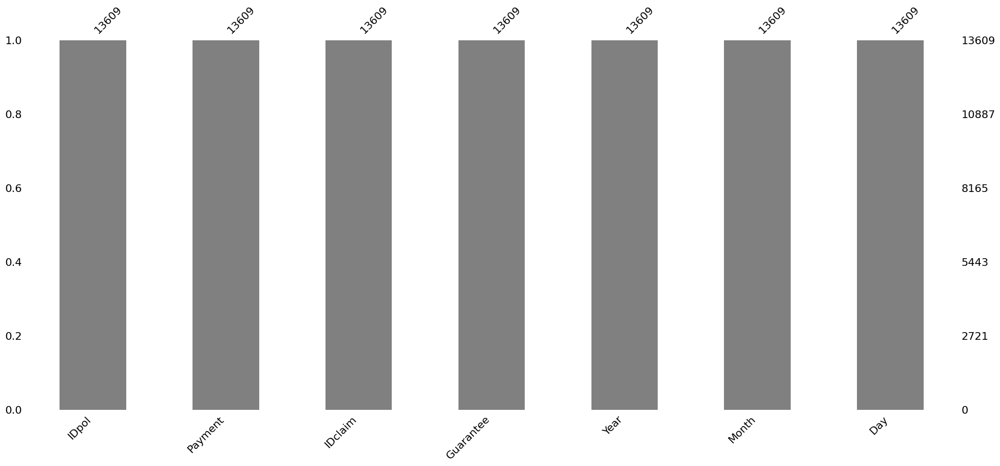

In [251]:
# Visualisation de tout notre dataset
msno.bar(df_sev, sort= "ascending", color= "grey")

* Nous n'avons de valeurs manquantes dans la base.

### Gestion des données incohérentes

In [252]:
# Statistiques descriptives 
df_sev.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
IDpol,13609,7146,90148239.100a,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Payment,13609,NaN,NaN,NaN,977,6713,-1,65,307,897,632893
IDclaim,13609,NaN,NaN,NaN,467729,511024,6783,12685,205248,1203166,1210578
Guarantee,13609,7,TPL,6237,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,13609,NaN,NaN,NaN,2004,1,2003,2003,2004,2004,2006
Month,13609,NaN,NaN,NaN,7,3,1,4,7,10,12
Day,13609,NaN,NaN,NaN,16,9,1,8,16,23,31


#### Variables quantitatives

In [253]:
# Statistiques descriptives 
df_sev.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Payment,13609,977,6713,-1,65,307,897,632893
IDclaim,13609,467729,511024,6783,12685,205248,1203166,1210578
Year,13609,2004,1,2003,2003,2004,2004,2006
Month,13609,7,3,1,4,7,10,12
Day,13609,16,9,1,8,16,23,31


In [254]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_sev.select_dtypes("number").columns:
    print("=========================================")
    print(df_sev[i].value_counts(dropna=False), "\n", (df_sev[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Payment
-1       2502
 897      560
 0        414
 915      261
 1121     134
         ... 
 578        1
 1371       1
 2137       1
 6068       1
 2127       1
Name: count, Length: 2233, dtype: int64 
 Payment
-1      18
 897     4
 0       3
 915     2
 1121    1
        ..
 578     0
 1371    0
 2137    0
 6068    0
 2127    0
Name: proportion, Length: 2233, dtype: float64
IDclaim
1206824    13
208793      9
1204940     9
209361      8
10511       8
           ..
13414       1
200113      1
8891        1
1205390     1
7090        1
Name: count, Length: 8911, dtype: int64 
 IDclaim
1206824   0 
208793    0 
1204940   0 
209361    0 
10511     0 
          ..
13414     0 
200113    0 
8891      0 
1205390   0 
7090      0 
Name: proportion, Length: 8911, dtype: float64
Year
2004    6167
2003    5929
2006     787
2005     726
Name: count, dtype: int64 
 Year
2004   45
2003   44
2006    6
2005    5
Name: proportion, dtype: float64
Month
11    1261
10    1221
7     1213
8     1163
4    

In [255]:
# Affichage des lignes avec le montant des sinistres négative
df_sev_neg = df_sev.loc[df_sev['Payment'] < 0]
print(df_sev_neg.shape)

(2502, 7)


In [256]:
# Affichage des lignes avec le montant des sinistres négative
df_sev_neg = df_sev.loc[df_sev['Payment'] == -1]
print(df_sev_neg.shape)

(2502, 7)


* Le montant des sinistres (Payment) varie de -1 € à 632 893 €, ce qui est tout à fait cohérent dans un portefeuille automobile.

* La présence de montants négatifs, comme -1 €, peut s’expliquer par des conventions entre assureurs. Par exemple, pour des montants peu élevés (ex. < 2 000 €), un assureur peut avancer le paiement au client avant d’être remboursé par l’assureur adverse. Ce remboursement attendu est enregistré comme montant négatif dans le système comptable, en attente de régularisation.

* Les montants à 0 € peuvent quant à eux résulter :

    * d’une franchise contractuelle à la charge de l’assuré,

    * ou d’un sinistre déclaré trop tardivement (hors délai de déclaration),

    * ou d’un rejet du remboursement malgré la déclaration du sinistre.

* Ces valeurs ne traduisent donc pas une erreur, mais plutôt des situations courantes dans la gestion des sinistres.

#### Variables qualitatives

In [257]:
# Statistiques descriptives 
df_sev.describe(exclude = "number").T

,count,unique,top,freq
IDpol,13609,7146,90148239.100a,11
Guarantee,13609,7,TPL,6237


In [258]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_sev.select_dtypes("object").columns:
    print("=========================================")
    print(df_sev[i].value_counts(dropna=False), "\n", (df_sev[i].value_counts(dropna=False, normalize = True) * 100).round(2))

IDpol
90148239.100a    11
90146580.100a    10
90157490.100b     9
90108446.100a     9
90181916.100a     9
                 ..
90254949.101d     1
90112572.101b     1
90108462.101a     1
90158800.100a     1
90126492.102a     1
Name: count, Length: 7146, dtype: int64 
 IDpol
90148239.100a   0 
90146580.100a   0 
90157490.100b   0 
90108446.100a   0 
90181916.100a   0 
                ..
90254949.101d   0 
90112572.101b   0 
90108462.101a   0 
90158800.100a   0 
90126492.102a   0 
Name: proportion, Length: 7146, dtype: float64
Guarantee
TPL           6237
Windscreen    4723
Damage         928
Theft          775
Accident       452
Other          336
Fire           158
Name: count, dtype: int64 
 Guarantee
TPL          46
Windscreen   35
Damage        7
Theft         6
Accident      3
Other         2
Fire          1
Name: proportion, dtype: float64


* Nous avons 7 types de garanties avec la garantie de la responsabilité civile (matérielle / corporelle) le plus souscrite par les assureurs ce qui semble normale car c'est obligatoire en France.
* Les variables qualitatives nous semblent cohérentes.

In [259]:
# Typage des données
df_sev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13609 entries, 0 to 13608
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   IDpol      13609 non-null  object
 1   Payment    13609 non-null  int64 
 2   IDclaim    13609 non-null  int64 
 3   Guarantee  13609 non-null  object
 4   Year       13609 non-null  int32 
 5   Month      13609 non-null  int32 
 6   Day        13609 non-null  int32 
dtypes: int32(3), int64(2), object(2)
memory usage: 584.9+ KB


### 3.1.i) Base de souscription assurés auto

In [260]:
# Faisons une copie pour garder la base d'origine
df_cnt = data_cnt.copy()
# Afficher les 5 premières lignes de notre base
df_cnt.head(5)

,Id_pol,Duration,Insured.age,Insured.sex,Car.age,Marital,Car.use,Credit.score,Region,Annual.miles.drive,Years.noclaims,Territory,age-YNC
0,121744,365,59,Female,5,Single,Private,491,Urban,12427,40,77,19
1,123584,182,32,F,10,Married,Private,730,Rural,6214,4,89,28
2,133223,365,59,F,9,Single,Commute,689,Rural,12427,41,85,18
3,124356,237,54,Male,8,Married,Commute,794,Urban,6214,37,70,17
4,192713,365,40,Female,0,Married,Commute,880,Urban,12427,8,76,32


### Qualité des données

In [261]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_cnt))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_cnt))
print("=============================================")
print("Information sur les colonnes:", df_cnt.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_cnt))
print("=============================================")
print("Types de variables:", type_variable(df_cnt))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_cnt))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_cnt))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_cnt))

Nombre de lignes: 100399
Nombre de colonnes: 13
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100399 entries, 0 to 100398
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Id_pol              100399 non-null  int64  
 1   Duration            100399 non-null  int64  
 2   Insured.age         100399 non-null  int64  
 3   Insured.sex         100399 non-null  object 
 4   Car.age             100399 non-null  int64  
 5   Marital             100307 non-null  object 
 6   Car.use             100399 non-null  object 
 7   Credit.score        100399 non-null  float64
 8   Region              100271 non-null  object 
 9   Annual.miles.drive  100399 non-null  float64
 10  Years.noclaims      100399 non-null  object 
 11  Territory           100399 non-null  int64  
 12  age-YNC             100363 non-null  float64
dtypes: float64(3), int64(5), object(5)
memory usage: 10.0+ MB
Information sur les colonnes

* Nous avons une base avec plus de 100000 polices d'assurances automobiles avec des informations sociodémographiques, comportementales et géographiques ;
* Présence de valeurs manquantes;
* Une seule de nos variables qui n'est pas au bon format, il s'agit du **Years.noclaims** que nous allons corriger;
* Nous avons des doublons purs.
* Avant de commencer les analyses nous allons dabord renommer à nouveau les colonnes

In [262]:
# Afficher les colonnes
df_cnt.columns

Index(['Id_pol', 'Duration', 'Insured.age', 'Insured.sex', 'Car.age',
       'Marital', 'Car.use', 'Credit.score', 'Region', 'Annual.miles.drive',
       'Years.noclaims', 'Territory', 'age-YNC'],
      dtype='object')

In [263]:
# Renommez les colonnes
df_cnt = df_cnt.rename(columns={
    'Insured.age': 'Insured_age',
    'Insured.sex': 'Insured_sex',
    'Car.age': 'Car_age',
    'Car.use': 'Car_use',
    'Credit.score': 'Credit_score',
    'Annual.miles.drive': 'Annual_miles_drive',
    'Years.noclaims': 'Years_noclaims'})

In [264]:
# convertir au bon format
df_cnt["Years_noclaims"] = pd.to_numeric(df_cnt["Years_noclaims"], errors = 'coerce')

In [265]:
# Vérification aprés correction
df_cnt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100399 entries, 0 to 100398
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Id_pol              100399 non-null  int64  
 1   Duration            100399 non-null  int64  
 2   Insured_age         100399 non-null  int64  
 3   Insured_sex         100399 non-null  object 
 4   Car_age             100399 non-null  int64  
 5   Marital             100307 non-null  object 
 6   Car_use             100399 non-null  object 
 7   Credit_score        100399 non-null  float64
 8   Region              100271 non-null  object 
 9   Annual_miles_drive  100399 non-null  float64
 10  Years_noclaims      100363 non-null  float64
 11  Territory           100399 non-null  int64  
 12  age-YNC             100363 non-null  float64
dtypes: float64(4), int64(5), object(4)
memory usage: 10.0+ MB


### Gestion des doublons

In [266]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_cnt.duplicated().sum()

5

In [267]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_cnt.duplicated(["Id_pol"]).sum()

140

* Sur les 100399 polices d'assurances, nous avons 5 doublons purs (0 doublon) et 140 doublons impurs avec "Id_pol" identifiant unique de l'assuré
* Affichons les doublons pour connaitre la différence entre les lignes

In [268]:
# Afficher les doublons
doublons_cnt = df_cnt[df_cnt.duplicated(keep = False)].sort_values("Id_pol")
print(doublons_cnt.shape)
# Afficher les 10 premières lignes
doublons_cnt.head(10)

(10, 13)


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
65672,130737,183,69,Male,5,NaN,Private,840,Urban,6214,48,84,21
81060,130737,183,69,Male,5,NaN,Private,840,Urban,6214,48,84,21
8129,152072,365,53,Male,1,NaN,Private,743,Urban,6214,35,67,18
96783,152072,365,53,Male,1,NaN,Private,743,Urban,6214,35,67,18
60302,183276,339,49,Female,3,NaN,Commute,727,Rural,12427,30,89,19
94161,183276,339,49,Female,3,NaN,Commute,727,Rural,12427,30,89,19
4505,191358,365,70,Female,11,NaN,Private,842,Urban,6214,29,69,41
69702,191358,365,70,Female,11,NaN,Private,842,Urban,6214,29,69,41
49047,214317,366,53,Female,6,NaN,Commute,796,Urban,15534,36,86,17
75222,214317,366,53,Female,6,NaN,Commute,796,Urban,15534,36,86,17


* Il s'agit bien de doublons purs car les lignes sont identiques.
* Pour celà nous allons supprimer ces doublons purs afin de ne pas fausser les analyses.

#### Suppression des doublons

In [269]:
# Suppression des doublons
doublons_cnt = df_cnt.drop_duplicates(keep = "first").reset_index(drop=True)
print("Le nombre de lignes restantes aprés suppression des doublons est de: ", doublons_cnt.shape)

Le nombre de lignes restantes aprés suppression des doublons est de:  (100394, 13)


In [270]:
# Faire une copie aprés la suppression des doublons
df_cnt = doublons_cnt.copy()

### Gestion des données manquantes

* Nous allons faire une visualisation afin d'afficher les valeurs manquantes sur un graphique

<AxesSubplot: >

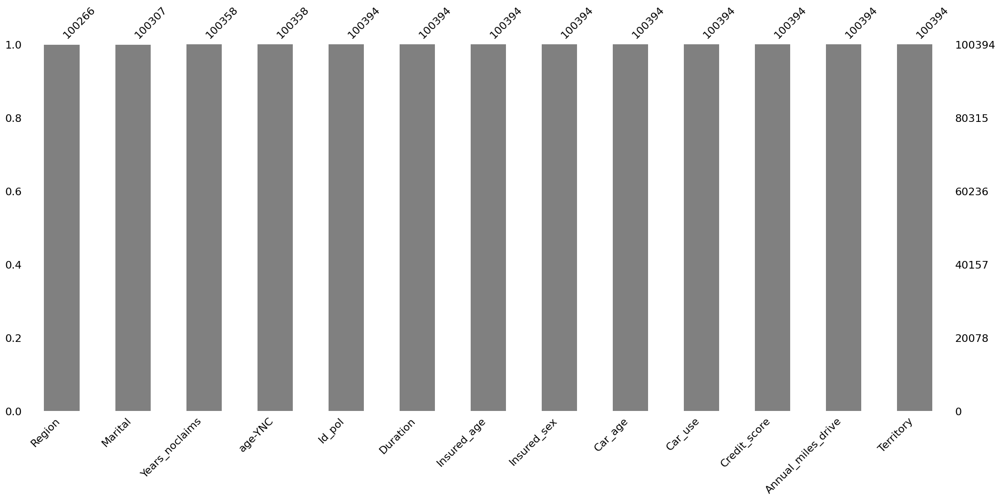

In [271]:
# Visualisation de tout notre dataset 
msno.bar(df_cnt, sort= "ascending", color= "grey")

In [272]:
# La somme des VM par colonnes
df_cnt.isna().sum()

Id_pol                  0
Duration                0
Insured_age             0
Insured_sex             0
Car_age                 0
Marital                87
Car_use                 0
Credit_score            0
Region                128
Annual_miles_drive      0
Years_noclaims         36
Territory               0
age-YNC                36
dtype: int64

In [273]:
# Isoler les valeurs manquantes
print(df_cnt[df_cnt.isna().any(axis = 1)].shape)
df_cnt[df_cnt.isna().any(axis = 1)].head(6)

(251, 13)


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
84,186103,366,42,Male,6,Single,Commute,796,Urban,6214,NaN,38,NaN
1011,184075,366,59,Male,1,Married,Commute,800,NaN,9321,29,87,30
1389,172720,365,25,Female,5,Single,Commute,838,Urban,18641,NaN,63,NaN
1612,147372,362,42,Male,6,Married,Commute,619,Urban,6214,NaN,33,NaN
2790,219739,366,44,Female,8,NaN,Commute,823,Urban,6214,14,79,30
3625,212445,200,73,Female,3,NaN,Private,900,Urban,8078,56,43,17


* Nous avons 251 lignes avec des valeurs manquantes dans certaines colonnes,
* Pour ne pas perdre des informations en lignes, faison une imputation.

#### Imputation des valeurs manquantes

* Nous allons faire une imputation par la mediane pour les variables quantitatives;
* Avant de faire une imputation par le mode avec les variables qualitatives, vérifions dabord à l'aide d'un tableau de contigence si le mode est majoritaire ou pas:
    * Mode majoritaire : faire une imputation par le mode
    * Mode non majoritaire faire une imputation aléatoire

#### Variables quantitatives

In [274]:
# Imputation des variables quantitatives
df_cnt['Years_noclaims'] = df_cnt['Years_noclaims'].fillna(df_cnt['Years_noclaims'].median())
df_cnt['age-YNC'] = df_cnt['age-YNC'].fillna(df_cnt['age-YNC'].median())

In [275]:
# Convertir au bon format aprés imputation
df_cnt['Years_noclaims'] = df_cnt['Years_noclaims'].astype(int)
df_cnt['age-YNC'] = df_cnt['age-YNC'].astype(int)                                                          

In [276]:
# Vérification aprés conversion
df_cnt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100394 entries, 0 to 100393
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Id_pol              100394 non-null  int64  
 1   Duration            100394 non-null  int64  
 2   Insured_age         100394 non-null  int64  
 3   Insured_sex         100394 non-null  object 
 4   Car_age             100394 non-null  int64  
 5   Marital             100307 non-null  object 
 6   Car_use             100394 non-null  object 
 7   Credit_score        100394 non-null  float64
 8   Region              100266 non-null  object 
 9   Annual_miles_drive  100394 non-null  float64
 10  Years_noclaims      100394 non-null  int32  
 11  Territory           100394 non-null  int64  
 12  age-YNC             100394 non-null  int32  
dtypes: float64(2), int32(2), int64(5), object(4)
memory usage: 9.2+ MB


#### Variables qualitatives

In [277]:
# afficher les différentes modalités (tableaux de contigence)
print(df_cnt["Marital"].value_counts(dropna=False), "\n", (df_cnt["Marital"].value_counts(dropna=False, normalize = True) * 100).round(2))
print("=========================================")
print(df_cnt["Region"].value_counts(dropna=False), "\n", (df_cnt["Region"].value_counts(dropna=False, normalize = True) * 100).round(2))

Marital
Married    65666
Single     28214
Marié       4467
Celib       1960
NaN           87
Name: count, dtype: int64 
 Marital
Married   65
Single    28
Marié      4
Celib      2
NaN        0
Name: proportion, dtype: float64
Region
Urban    78354
Rural    21912
NaN        128
Name: count, dtype: int64 
 Region
Urban   78
Rural   22
NaN      0
Name: proportion, dtype: float64


* Nous avons le mode qui est majoriatire alors nous allons faire une imputation par le mode.

In [278]:
# Imputation des variables quantitatives
df_cnt['Marital'] = df_cnt['Marital'].fillna(df_cnt['Marital'].mode()[0])
df_cnt['Region'] = df_cnt['Region'].fillna(df_cnt['Region'].mode()[0])

<AxesSubplot: >

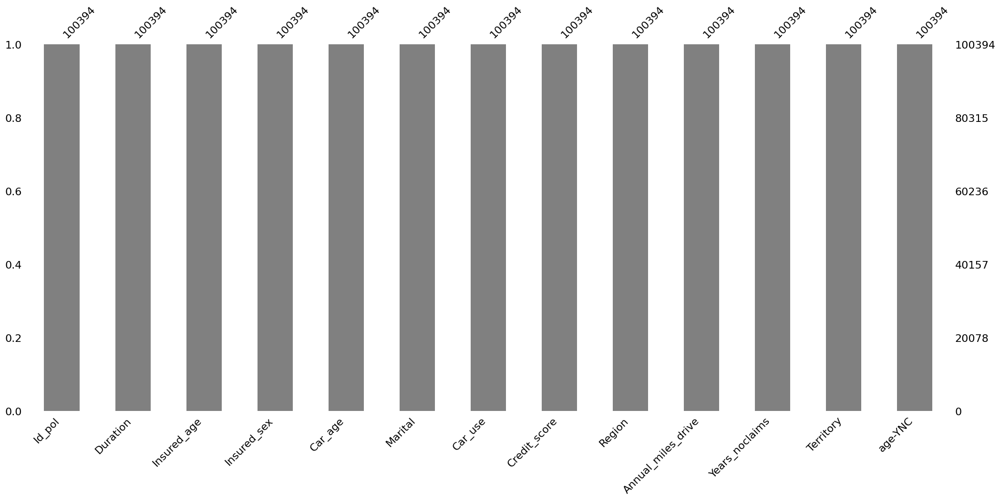

In [279]:
# Visualisation de tout notre dataset aprés imputation
msno.bar(df_cnt, sort= "ascending", color= "grey")

In [280]:
# Vérification aprés imputation
df_cnt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100394 entries, 0 to 100393
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Id_pol              100394 non-null  int64  
 1   Duration            100394 non-null  int64  
 2   Insured_age         100394 non-null  int64  
 3   Insured_sex         100394 non-null  object 
 4   Car_age             100394 non-null  int64  
 5   Marital             100394 non-null  object 
 6   Car_use             100394 non-null  object 
 7   Credit_score        100394 non-null  float64
 8   Region              100394 non-null  object 
 9   Annual_miles_drive  100394 non-null  float64
 10  Years_noclaims      100394 non-null  int32  
 11  Territory           100394 non-null  int64  
 12  age-YNC             100394 non-null  int32  
dtypes: float64(2), int32(2), int64(5), object(4)
memory usage: 9.2+ MB


* Toutes les valeurs manquantes sont traités ainsi que toutes nos variables sont au bon format.
* Passons à la gestion des valeurs incohérentes.

### Gestion des données incohérentes

In [281]:
# Statistiques descriptives 
df_cnt.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Id_pol,100394,NaN,NaN,NaN,170918,28992,100009,145879,170938,196008,221067
Duration,100394,NaN,NaN,NaN,314,80,0,200,365,366,366
Insured_age,100394,NaN,NaN,NaN,51,15,16,39,51,63,103
Insured_sex,100394,5,Male,45930,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Car_age,100394,NaN,NaN,NaN,6,4,-2,2,5,8,20
Marital,100394,4,Married,65753,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Car_use,100394,111,Commute,49853,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Credit_score,100394,NaN,NaN,NaN,801,83,422,766,825,856,900
Region,100394,2,Urban,78482,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Annual_miles_drive,100394,NaN,NaN,NaN,9124,3826,0,6214,7456,12427,56731


#### Variables quantitatives

In [282]:
# Statistiques descriptives 
df_cnt.describe(include = "number").T

,count,mean,std,min,25%,50%,75%,max
Id_pol,100394,170918,28992,100009,145879,170938,196008,221067
Duration,100394,314,80,0,200,365,366,366
Insured_age,100394,51,15,16,39,51,63,103
Car_age,100394,6,4,-2,2,5,8,20
Credit_score,100394,801,83,422,766,825,856,900
Annual_miles_drive,100394,9124,3826,0,6214,7456,12427,56731
Years_noclaims,100394,29,16,0,15,29,41,85
Territory,100394,57,24,11,35,62,78,91
age-YNC,100394,23,9,0,17,19,25,90


In [283]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_cnt.select_dtypes("number").columns:
    print("=========================================")
    print(df_cnt[i].value_counts(dropna=False), "\n", (df_cnt[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Id_pol
201975    2
197107    2
128654    2
183067    2
175139    2
         ..
213453    1
134666    1
193646    1
138163    1
178187    1
Name: count, Length: 100259, dtype: int64 
 Id_pol
201975   0 
197107   0 
128654   0 
183067   0 
175139   0 
         ..
213453   0 
134666   0 
193646   0 
138163   0 
178187   0 
Name: proportion, Length: 100259, dtype: float64
Duration
365    36865
366    29715
184     7198
183     6550
182     6288
       ...  
274        1
75         1
27         1
71         1
129        1
Name: count, Length: 241, dtype: int64 
 Duration
365   37
366   30
184    7
183    7
182    6
      ..
274    0
75     0
27     0
71     0
129    0
Name: proportion, Length: 241, dtype: float64
Insured_age
51     2277
50     2263
48     2261
47     2221
49     2165
       ... 
95        4
96        2
103       1
102       1
99        1
Name: count, Length: 84, dtype: int64 
 Insured_age
51    2 
50    2 
48    2 
47    2 
49    2 
      ..
95    0 
96    0 
103   0 
102  

**Gestion de la variable **Duration****

* La durée de la situation représente l'âge des caractéristiques de la police actuelle.
* On remarque la durée de la police d'assurance qui varie de 0 à 366 jour avec une très forte concentration sur 365 et 366 jours qui correspond aux contrats annuels (normaux).
* Mais la présence de durées faibles comme 27 ou 75 jours, nous allons vérifier l'existance de ces courtes durées de la police d'assurance (ex = 0) afin de les identifier pour les traiter.

In [284]:
# Détection des valeurs considérées comme anormales (ex : <= 0 jours)
anomalies = df_cnt[df_cnt["Duration"] <= 0]
print(f"Nombre d'anomalies détectées : {anomalies.shape[0]}")
anomalies

Nombre d'anomalies détectées : 7


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
17193,220667,0,23,Female,8,Single,Private,778,Urban,12427,7,52,16
55630,193005,0,35,Male,8,Single,Commute,857,Urban,12427,18,43,17
81452,147733,0,84,Male,10,Married,Private,856,Urban,6214,65,70,19
85547,218653,0,48,Female,6,Married,Commute,847,Urban,12427,14,84,34
96023,187368,0,45,Male,-1,Married,Commute,609,Urban,6214,25,70,20
98991,178092,0,71,Male,6,Married,Private,842,Urban,6214,43,30,28
99363,126690,0,44,Female,3,Married,Commute,575,Urban,12427,20,26,24


* Nous avons 7 lignes avec une durée de la police d'assurance égale à zéro, nous allons calculer la mediane des valeurs normales ensuite remplacer les zéro par la mediane.

In [285]:
# Calcul de la médiane des valeurs normales
med_duration = df_cnt[df_cnt["Duration"] > 0]["Duration"].median()
print(f"Médiane Duration (valeurs > 0) = {med_duration}")

# Remplacer les 0 par la médiane
df_cnt.loc[df_cnt["Duration"] <= 0, "Duration"] = med_duration

Médiane Duration (valeurs > 0) = 365.0


**Gestion de la variable **Insured_age****

* D'aprés la statistique describtive l'âge minimum est de 16ans et l'âge maximum est de 103ans .
* L'âge légal pour conduire est de 18 ans, celà signifie en dessous de cette limite est une anomalie. En raison du fait que la base de données est construite sur des situations existantes on peut également avoir des conducteurs assez âgés.

In [286]:
# filtre en isolant les anomalies
df_anomalie_age = df_cnt[(df_cnt["Insured_age"] < 18) | (df_cnt["Insured_age"] > 103)]
print(df_anomalie_age.shape)
df_anomalie_age

(16, 13)


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
10400,163034,364,16,Male,7,Single,Commute,814,Urban,9321,1,62,15
18887,190064,365,16,Male,9,Single,Commute,656,Rural,9321,1,89,15
20026,141727,353,17,Male,7,Single,Commute,815,Urban,9321,2,60,15
29153,191953,365,16,Male,7,Single,Commute,814,Urban,9321,1,62,15
36079,211507,365,17,Female,9,Single,Commute,833,Urban,6214,1,32,16
46027,133989,363,16,Male,7,Single,Commute,814,Urban,9321,1,62,15
48253,206833,366,17,Female,12,Single,Commute,759,Rural,12427,2,39,15
59009,184571,365,17,Female,11,Single,Private,660,Urban,6214,1,30,16
59892,165422,366,17,H,13,Single,Commute,728,Urban,6214,1,24,16
60692,164524,365,17,Female,9,Single,Commute,684,Urban,6214,2,38,15


* Nous avons 16 lignes avec moins de 18ans, calculons la mediane des valeurs normales ensuite remplacer les moins de 18ans par la mediane.

In [287]:
# Calcul de la médiane sur les valeurs normales
mediane_age = df_cnt[df_cnt["Insured_age"] >= 18]["Insured_age"].median()

# Imputation des valeurs incohérentes par la mediane
df_cnt.loc[(df_cnt["Insured_age"] < 18), "Insured_age"] = mediane_age

**Gestion de la variable **Car_age****

* On remarque la présence des valeurs négatives dans la variable qui correspond à l'âge du véhicule(-1, -2).
* Corrigeons les en les remplaçant par la médiane des valeurs valides.

In [288]:
# Détection des âges de véhicules < 0
car_age_anomalies = df_cnt[df_cnt["Car_age"] < 0]
print(f"Nombre de Car_age négatifs : {car_age_anomalies.shape[0]}")
car_age_anomalies

Nombre de Car_age négatifs : 1953


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
171,160776,184,41,Female,-1,Married,Commute,869,Urban,9321,21,86,20
237,125673,365,45,F,-1,Married,Commute,752,Urban,12427,14,75,31
282,157589,366,75,Male,-1,Married,Private,831,Urban,6214,38,12,37
317,212236,366,70,H,-2,Married,Private,853,Urban,6214,30,57,40
332,215727,366,56,Male,-1,Married,Commute,757,Urban,6214,38,89,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100057,129905,366,39,H,-1,Single,Commercial,843,Urban,12427,23,38,16
100137,127266,182,60,Female,-1,Married,Commute,867,Rural,18641,44,39,16
100309,167509,366,51,Female,-1,Married,Commute,812,Urban,6214,35,31,16
100340,197181,365,36,Male,-1,Married,Private,877,Urban,6214,6,73,30


In [289]:
# Calcul de la médiane des valeurs valides
car_age_median = df_cnt[df_cnt["Car_age"] >= 0]["Car_age"].median()
print(f"Médiane Car_age = {car_age_median}")

# Remplacer les âges négatifs par la médiane
df_cnt.loc[df_cnt["Car_age"] < 0, "Car_age"] = car_age_median

Médiane Car_age = 5.0


**Gestion de la variable **Annual_miles_drive****

* Cette variable correspond au Kilométrage annuel moyen du conducteur avec un minimum égale à 0 et un maximum égale à 56 731
* Identifions valeurs à 0 km/an .
* Corrigeons les en les remplaçant par la médiane des valeurs valides.

In [290]:
# Détection des 0 km/an
zero_miles = df_cnt[df_cnt["Annual_miles_drive"] == 0]
print(f"Nombre de valeurs à 0 miles : {zero_miles.shape[0]}")
zero_miles

Nombre de valeurs à 0 miles : 3


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
50952,170034,366,42,Male,7,Married,Private,773,Urban,0,10,63,32
79031,190366,360,46,Male,1,Married,Commute,828,Urban,0,30,60,16
83805,149609,365,45,Male,1,Married,Commute,822,Urban,0,27,60,18


* Nous n'avons que 3 lignes avec des valeurs à 0 km/an à corriger

In [291]:
#Calcul de la médiane sur les valeurs valides
miles_median = df_cnt[df_cnt["Annual_miles_drive"] > 0]["Annual_miles_drive"].median()

#Remplacer les 0 par la médiane
df_cnt.loc[df_cnt["Annual_miles_drive"] == 0, "Annual_miles_drive"] = miles_median


#### Gestion de la variable **age-YNC**

* Cette variable semble être la différence entre l'âge de l'assurée au moment de sa première année sans sinistre(**age-YNC ≈ Insured.age - Years_noclaims**) avec un minimum égale à 0 (incohérente sauf si l’assuré n’a jamais eu de sinistres) et un maximum égale à 90 (trés rare).
* Identifions ces lignes puis faire une imputation par la mediane.

In [292]:
# Détecter les anomalies
anomalies = df_cnt[df_cnt["age-YNC"] < 10 | (df_cnt["age-YNC"] > 80)]
print(f"Nombre de lignes concernées: {anomalies.shape[0]}")
anomalies

Nombre de lignes concernées: 131


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
14,154884,184,66,Male,10,Married,Private,841,Urban,6214,66,30,0
290,216360,181,63,Male,1,Married,Commute,849,Rural,12427,63,81,0
298,219077,366,49,Male,14,Single,Commute,877,Urban,3107,49,39,0
3394,193143,202,69,Female,8,Married,Private,849,Urban,12427,69,85,0
3485,215425,365,51,Female,1,Married,Commute,829,Urban,12427,51,24,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
94563,218359,365,21,Male,3,Single,Commute,836,Urban,6214,21,71,0
95212,126225,366,47,Female,4,Married,Private,900,Rural,6214,47,23,0
97352,165754,182,80,Male,2,Married,Private,900,Urban,12427,80,70,0
98236,206806,366,47,Female,3,Married,Commute,844,Rural,15534,47,90,0


In [293]:
# Remplacer ces valeurs par la médiane des valeurs valides
mediane_ageYNC = df_cnt.loc[(df_cnt["age-YNC"] >= 10) & (df_cnt["age-YNC"] <= 80), "age-YNC"].median()

# Correction
df_cnt.loc[(df_cnt["age-YNC"] < 10) | (df_cnt["age-YNC"] > 80), "age-YNC"] = mediane_ageYNC

#### Variables qualitatives

In [294]:
# Statistiques descriptives 
df_cnt.describe(exclude = "number").T

,count,unique,top,freq
Insured_sex,100394,5,Male,45930
Marital,100394,4,Married,65753
Car_use,100394,111,Commute,49853
Region,100394,2,Urban,78482


In [295]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_cnt.select_dtypes("object").columns:
    print("=========================================")
    print(df_cnt[i].value_counts(dropna=False), "\n", (df_cnt[i].value_counts(dropna=False, normalize = True) * 100).round(2))

Insured_sex
Male       45930
Female     39062
H           8165
F           7124
Unknown      113
Name: count, dtype: int64 
 Insured_sex
Male      46
Female    39
H          8
F          7
Unknown    0
Name: proportion, dtype: float64
Marital
Married    65753
Single     28214
Marié       4467
Celib       1960
Name: count, dtype: int64 
 Marital
Married   65
Single    28
Marié      4
Celib      2
Name: proportion, dtype: float64
Car_use
Commute       49853
Private       46100
Commercial     2650
Farmer         1411
                 17
              ...  
97                1
49                1
83                1
73                1
                  1
Name: count, Length: 111, dtype: int64 
 Car_use
Commute      50
Private      46
Commercial    3
Farmer        1
              0
             ..
97            0
49            0
83            0
73            0
              0
Name: proportion, Length: 111, dtype: float64
Region
Urban    78482
Rural    21912
Name: count, dtype: int64 
 Regi

**Gestion de la variable **Insured_sex****

* On constate la présence de 5 modalités au lieu de 2 modalités qui sont **Male** et **Female**
* Nous allons utiliser la fonction replace pour corriger ces modalités.
* Pour la modalité "Unknown" nous allons la remplacer par le mode

In [296]:
# Corriger les modalités de la variables "Insured_sex"
df_cnt["Insured_sex"] = df_cnt["Insured_sex"].replace({"H": "Male", "F": "Female", "Unknown" : "Male"})

**Gestion de la variable **Car_use****

* On constate qu'on a plus de 111 modalités avec des nombres,
* Créeons une liste de base afin de remplacer ces valeurs qui ne sont pas dans la liste par **Autre** avec la fonction **lambda**.

In [297]:
# Liste des modalités valides
valeurs_valides = ["Commute", "Private", "Commercial", "Farmer"]

# Remplacer les valeurs non valides par "Other"
df_cnt["Car_use"] = df_cnt["Car_use"].apply(lambda x: x if x in valeurs_valides else "Other")

In [298]:
# Statistiques descriptives 
df_cnt.describe(exclude = "number").T

,count,unique,top,freq
Insured_sex,100394,2,Male,54208
Marital,100394,4,Married,65753
Car_use,100394,5,Commute,49853
Region,100394,2,Urban,78482


* Toutes nos variables qualitatives nous semblent cohérentes.

In [299]:
# Typage des données
df_cnt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100394 entries, 0 to 100393
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Id_pol              100394 non-null  int64  
 1   Duration            100394 non-null  int64  
 2   Insured_age         100394 non-null  int64  
 3   Insured_sex         100394 non-null  object 
 4   Car_age             100394 non-null  int64  
 5   Marital             100394 non-null  object 
 6   Car_use             100394 non-null  object 
 7   Credit_score        100394 non-null  float64
 8   Region              100394 non-null  object 
 9   Annual_miles_drive  100394 non-null  float64
 10  Years_noclaims      100394 non-null  int32  
 11  Territory           100394 non-null  int64  
 12  age-YNC             100394 non-null  int32  
dtypes: float64(2), int32(2), int64(5), object(4)
memory usage: 9.2+ MB


### 3.1.j) Base des sinistres

In [300]:
# Faire une copie de la base pour garder la base d'origine
df_sinis = data_sin.copy()
# Affichage aprés copie
df_sinis.head(7)

,Id_pol,NB_Claim,AMT_Claim
0,212433,1,"1137,079102"
1,124370,1,"3170,102051"
2,208357,1,"3753,909668"
3,141403,1,"16,03637695"
4,173366,1,"41774,71289"
5,207020,1,"1837,470154"
6,214687,1,"1446,97879"


### Qualité des données

In [301]:
# la forme de la base 
print("Nombre de lignes:", nombre_ligne(df_sinis))
print("=============================================")
print("Nombre de colonnes:", nombre_columns(df_sinis))
print("=============================================")
print("Information sur les colonnes:", df_sinis.info())
print("=============================================")
print("Total des valeurs manquantes:", valeurs_manquants(df_sinis))
print("=============================================")
print("Types de variables:", type_variable(df_sinis))
print("=============================================")
print("Pourcentage de valeurs manquantes:", pourcentage_valeurs_manquants(df_sinis))
print("=============================================")
print("Nombre de lignes dupliquées:", nombre_lignes_duplicate(df_sinis))
print("=============================================")
print("Statistique descriptive des variables:", stats(df_sinis))

Nombre de lignes: 4337
Nombre de colonnes: 3
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4337 entries, 0 to 4336
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Id_pol     4337 non-null   int64 
 1   NB_Claim   4337 non-null   object
 2   AMT_Claim  4337 non-null   object
dtypes: int64(1), object(2)
memory usage: 101.8+ KB
Information sur les colonnes: None
Total des valeurs manquantes: 0
Types de variables: object    2
int64     1
Name: count, dtype: int64
Pourcentage de valeurs manquantes: Id_pol      0
NB_Claim    0
AMT_Claim   0
dtype: float64
Nombre de lignes dupliquées: 2
Statistique descriptive des variables:         Id_pol NB_Claim AMT_Claim
count     4337     4337      4337
unique     NaN        5      3851
top        NaN        1         0
freq       NaN     4131       436
mean    170184      NaN       NaN
std      29131      NaN       NaN
min     100210      NaN       NaN
25%     145343      NaN       N

* Nous avons une base avec plus de 4337 sinitres (chaque ligne représente un sinitre) avec ces différentes caractériques qui sont les 6 colonnes;
* Absence de valeurs manquantes;
* Certaines de nos variables ne sont pas au bon format, il s'agit du montant des sinistres et le nombre de sinistresque nous allons corriger;
* Présence de doublons purs.

**Conversion des variables**

* Nous avons essayer de convertir au bon format mais on remarque que ça nous renvoie des erreurs et pour en savoir plus l'origine de l'erreur,
* Nous décidons d'afficher les différentes modalités afin de connaitre l'origine des erreurs.

In [302]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in df_sinis.select_dtypes("object").columns:
    print("=========================================")
    print(df_sinis[i].value_counts(dropna=False), "\n", (df_sinis[i].value_counts(dropna=False, normalize = True) * 100).round(2))

NB_Claim
1             4131
2              170
NB_CLAIM:1      23
3               11
NB_CLAIM:2       2
Name: count, dtype: int64 
 NB_Claim
1            95
2             4
NB_CLAIM:1    1
3             0
NB_CLAIM:2    0
Name: proportion, dtype: float64
AMT_Claim
0              436
ANN             37
279,9525146      9
477,3110047      7
1710,054932      2
              ... 
9324,375         1
1164,303863      1
1625,644409      1
4381,549073      1
6034,40625       1
Name: count, Length: 3851, dtype: int64 
 AMT_Claim
0             10
ANN            1
279,9525146    0
477,3110047    0
1710,054932    0
              ..
9324,375       0
1164,303863    0
1625,644409    0
4381,549073    0
6034,40625     0
Name: proportion, Length: 3851, dtype: float64


* Certaines valeurs sont sous forme de texte : "NB_CLAIM:1" ou "NB_CLAIM:2".
* Solution:
  * Extraire uniquement la valeur numérique et convertir en int.
  * Remplacer les virgules par des points

In [303]:
# convertir au bon format
df_sinis["NB_Claim"] = df_sinis["NB_Claim"].str.replace("NB_CLAIM:", "")

# convertir au bon format
df_sinis["NB_Claim"] = pd.to_numeric(df_sinis["NB_Claim"], errors = 'coerce')

In [304]:
# Remplacer les virgules par des points
df_sinis["AMT_Claim"] = df_sinis["AMT_Claim"].str.replace(",", ".", regex=False)

# Convertir en numérique, forcer les erreurs à NaN
df_sinis["AMT_Claim"] = pd.to_numeric(df_sinis["AMT_Claim"], errors="coerce")

In [305]:
# Typage des données aprés conversion au bon format
df_sinis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4337 entries, 0 to 4336
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Id_pol     4337 non-null   int64  
 1   NB_Claim   4337 non-null   int64  
 2   AMT_Claim  4300 non-null   float64
dtypes: float64(1), int64(2)
memory usage: 101.8 KB


* Toutes nos variables sont maintenant au bon format.

### Gestion des doublons

In [306]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_sinis.duplicated().sum()

2

In [307]:
# Nombre de doublons purs/parfaits avec la clé primaire
df_sinis.duplicated(["Id_pol"]).sum()

28

* Sur les 4337 sinistres, nous avons 2 doublons purs et 28 doublons impurs avec "Id_pol" l'identifiant unique.
* Affichons les doublons pour connaitre la différence entre les lignes

In [308]:
# Afficher les doublons
doublons_sinis = df_sinis[df_sinis.duplicated(keep = False)].sort_values("Id_pol")
print(doublons_sinis.shape)
# Afficher les 6 premières lignes
doublons_sinis.head(6)

(4, 3)


,Id_pol,NB_Claim,AMT_Claim
2434,149978,1,0
2859,149978,1,0
695,161618,1,0
3954,161618,1,0


* Il s'agit bien de doublons, pour celà nous allons les supprimer.

#### Suppression des doublons purs

In [309]:
# Suppression des doublons
doublons_sinis = df_sinis.drop_duplicates(keep = "first").reset_index(drop=True)
print("Le nombre de lignes restantes aprés suppression des doublons est de: ", doublons_sinis.shape)

Le nombre de lignes restantes aprés suppression des doublons est de:  (4335, 3)


In [310]:
# Faire une copie aprés suppression des doublons
df_sinis = doublons_sinis .copy()

### Gestion des données manquantes

* Nous allons faire une visualisation afin d'afficher les valeurs manquantes sur un graphique

<AxesSubplot: >

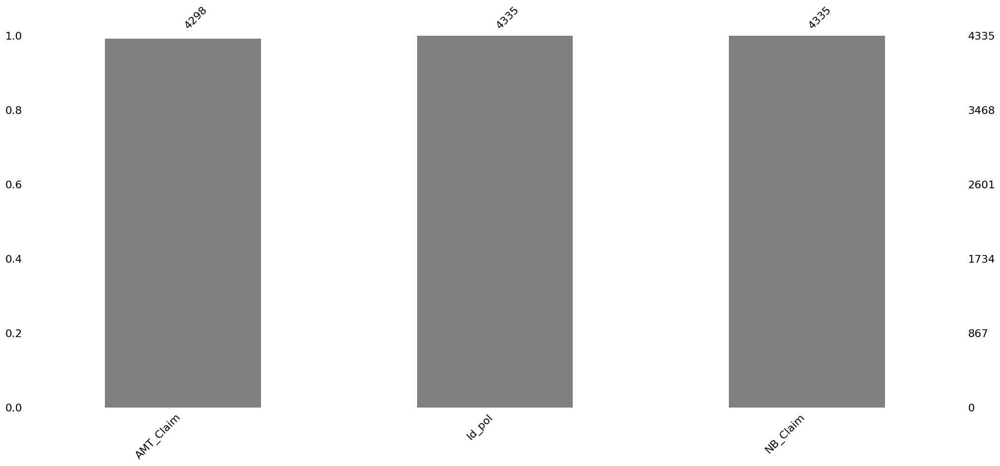

In [311]:
# Visualisation de tout notre dataset aprés imputation des VM
msno.bar(df_sinis, sort= "ascending", color= "grey")

* Nous avons avons des données dans la variable montant des sinistres,
* Faisons une imputation

#### Imputation des valeurs manquantes

* Remplacer toutes les valeurs manquantes par 0.

In [312]:
# imputation des VM
df_sinis["AMT_Claim"] = df_sinis["AMT_Claim"].fillna(0)

In [313]:
# Vérifier aprés impuatation
df_sinis.isna().sum()

Id_pol       0
NB_Claim     0
AMT_Claim    0
dtype: int64

* Nous n'avons plus de valeurs manquantes dans la base.

### Gestion des données incohérentes

In [314]:
# Statistiques descriptives 
df_sinis.describe(include = "all")

,Id_pol,NB_Claim,AMT_Claim
count,4335,4335,4335
mean,170191,1,3138
std,29136,0,5137
min,100210,1,0
25%,145322,1,495
50%,170603,1,1670
75%,195486,1,3703
max,221064,3,104075


**REMARQUES**

* **Id_pol**: Chaque identifiant est unique

* **NB_Claim**: Le nombre de sinistres d'un assuré ne dépasse pas les 3 (minimum = 1 et maximum = 3)

* **AMT_Claim**: Le montant des sinistre varie de 0 (franchise) à 104074 (gros sinistre)

* Toutes nos valeurs nous semblent cohérentes.

* Nous avons procéder à différentes étapes pour le nettoyage de chacune des bases en :
    * Vérifiant la qualité des données
    * Afficher les doublons puis les traiter
    * Trouver les valeurs manquantes afin de les traiter
    * Détecter les données incohérentes (les anomalies) pour les corriger
* Aprés toutes ces étapes de nettoyage (prétrairement), nous allons passer à l'étape suivante qui est la jointure des bases de données pour obtenir une base de données final pour la suite de l'analyse.

### Sauvegarde des bases nettoyées

In [315]:
"""
# Sauvegarde
df_mark.to_csv("df_mark_clean.csv", index=False)
df_acc.to_csv("df_acc_clean.csv", index=False)
df_veh.to_csv("df_veh_clean.csv", index=False)
df_lieux.to_csv("df_lieux_clean.csv", index=False)
df_carac.to_csv("df_carac_clean.csv", index=False)
df_freq.to_csv("df_freq_clean.csv", index=False)
df_prem.to_csv("df_prem_clean.csv", index=False)
df_sev.to_csv("df_sev_clean.csv", index=False)
df_cnt.to_csv("df_cnt_clean.csv", index=False)
df_sinis.to_csv("df_sinis_clean.csv", index=False)
"""

'\n# Sauvegarde\ndf_mark.to_csv("df_mark_clean.csv", index=False)\ndf_acc.to_csv("df_acc_clean.csv", index=False)\ndf_veh.to_csv("df_veh_clean.csv", index=False)\ndf_lieux.to_csv("df_lieux_clean.csv", index=False)\ndf_carac.to_csv("df_carac_clean.csv", index=False)\ndf_freq.to_csv("df_freq_clean.csv", index=False)\ndf_prem.to_csv("df_prem_clean.csv", index=False)\ndf_sev.to_csv("df_sev_clean.csv", index=False)\ndf_cnt.to_csv("df_cnt_clean.csv", index=False)\ndf_sinis.to_csv("df_sinis_clean.csv", index=False)\n'

#### Maintenant que nous avons base qui est nettoyer, nous allons paaser à l'étape suivante qui est la jointure des bases de données.

# 4. Jointure des Bases de données

* Dans cette parti nous allons faire de nos bases afin d'obtenir une base de données final à partir des dfférentes tables.

In [316]:
# Faisons une copie de chacune de nos BD nettoyées pour garder la base d'origine
df_mark_final = df_mark.copy()
df_acc_final = df_acc.copy()
df_veh_final = df_veh.copy()
df_lieux_final = df_lieux.copy()
df_carac_final = df_carac.copy()
df_freq_final = df_freq.copy()
df_prem_final = df_prem.copy()
df_sev_final = df_sev.copy()
df_cnt_final = df_cnt.copy()
df_sinis_final = df_sinis.copy()

In [317]:
# Les 10 dataframes
print("Base télémarketing:", df_mark_final.shape), print(df_mark_final.columns)
print("---------------------------------------------------------------------------")
print("Base des accidents corporels:", df_acc_final.shape), print(df_acc_final.columns)
print("---------------------------------------------------------------------------")
print("Base des véhicules dans l'accident:", df_veh_final.shape), print(df_veh_final.columns)
print("---------------------------------------------------------------------------")
print("Base des lieux de l'accident:", df_lieux_final.shape), print(df_lieux_final.columns)
print("---------------------------------------------------------------------------")
print("Base des caractéristiques de l'accident:", df_carac_final.shape), print(df_carac_final.columns)
print("---------------------------------------------------------------------------")
print("Base des types de sinistres:", df_freq_final.shape), print(df_freq_final.columns)
print("---------------------------------------------------------------------------")
print("Base des assurés automobiles avec le type de sinistre:", df_prem_final.shape), print(df_prem_final.columns)
print("---------------------------------------------------------------------------")
print("Base des historiques de payement avec le type de garantie:", df_sev_final.shape), print(df_sev_final.columns)
print("---------------------------------------------------------------------------")
print("Base de la police d'assurance:", df_cnt_final.shape), print(df_cnt_final.columns)
print("---------------------------------------------------------------------------")
print("Base des sinitres avec le nombre et le montant:", df_sinis_final.shape), print(df_sinis_final.columns)

Base télémarketing: (41176, 21)
Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')
---------------------------------------------------------------------------
Base des accidents corporels: (129153, 10)
Index(['Num_Acc', 'id_vehicule', 'num_veh', 'place', 'catu', 'grav', 'sexe',
       'an_nais', 'trajet', 'secu1'],
      dtype='object')
---------------------------------------------------------------------------
Base des véhicules dans l'accident: (97365, 8)
Index(['id_vehicule', 'num_veh', 'senc', 'catv', 'obsm', 'choc', 'manv',
       'motor'],
      dtype='object')
---------------------------------------------------------------------------
Base des lieux de l'accident: (56525, 10)
Index(['Num_Acc', 'dep', 'catr', 'circ', 'nbv', 'prof', 'plan', 

(None, None)

* Nous allons afficher toutes les bases afin de mieux voir les identifiants clés pour les jointures.

In [318]:
# Afficher toutes les bases
print(df_mark_final.shape)
df_mark_final.head(3)

(41176, 21)


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1,94,-36,5,5191,no
1,57,services,married,high.school,no,no,no,telephone,may,mon,149,1,999,0,nonexistent,1,94,-36,5,5191,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1,94,-36,5,5191,no


In [319]:
# Afficher toutes les bases
print(df_acc_final.shape)
df_acc_final.head(3)

(129153, 10)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1
0,202100021165,163Â 830,A01,9,2,4,1,1948,5,1
1,202100020281,165Â 383,A01,1,1,1,2,1965,1,1
2,202100047336,117Â 153,A01,1,1,4,2,1972,1,2


In [320]:
# Afficher toutes les bases
print(df_veh_final.shape)
df_veh_final.head(3)

(97365, 8)


,id_vehicule,num_veh,senc,catv,obsm,choc,manv,motor
0,129åÊ983,A01,1,33,2,3,1,1
1,192åÊ850,B01,1,10,2,4,2,1
2,152åÊ776,A01,1,33,2,1,3,3


In [321]:
# Afficher toutes les bases
print(df_lieux_final.shape)
df_lieux_final.head(3)

(56525, 10)


,Num_Acc,dep,catr,circ,nbv,prof,plan,surf,situ,vma
0,202100022009,40,1,3,3,1,1,1,1,130
1,202100023746,94,4,2,2,1,1,1,1,50
2,202100019549,2A,2,2,2,1,2,1,3,80


In [322]:
# Afficher toutes les bases
print(df_carac_final.shape)
df_carac_final.head(3)

(56519, 13)


,Num_Acc,jour,mois,an,hrmn,lum,com,agg,int,atm,col,lat,long
0,202100037733,28,5,2021,14:15:00,1,97407,2,2,1,3,48,2
1,202100049382,2,3,2021,10:59:00,1,63113,2,1,1,2,46,3
2,202100038891,20,5,2021,16:50:00,1,88160,2,2,1,1,48,6


In [323]:
# Afficher toutes les bases
print(df_freq_final.shape)
df_freq_final.head(3)

(62370, 8)


,IDpol,Year,Damage,Fire,Other,Theft,TPL,Windscreen
0,90141098.101a,2003,0,0,0,0,0,0
1,90133410.100a,2003,0,0,0,0,0,0
2,90151918.101b,2003,0,0,0,0,0,0


In [324]:
# Afficher toutes les bases
print(df_prem_final.shape)
df_prem_final.head(3)

(52402, 28)


,IDpol,Year,DrivAge,DrivGender,BonusMalus,LicenceNb,PayFreq,VehAge,VehClass,VehPower,VehGas,VehUsage,Garage,Area,Region,Channel,Marketing,PremWindscreen,PremDamAll,PremFire,PremAcc1,PremAcc2,PremLegal,PremTPLM,PremTPLV,PremServ,PremTheft,PremTot
0,90182572.101a,2004,32,M,80,2,Annual,38,Cheap,P12,Regular,Private+trip to office,Street,A7,Headquarters,B,M4,58,0,13,0,56,13,260,14,57,130,601
1,90104346.102b,2003,37,M,50,2,Annual,12,Cheapest,P11,Regular,Private+trip to office,Closed zbox,A9,Headquarters,A,M1,13,0,0,0,0,8,96,5,49,0,171
2,90134055.100b,2004,36,F,88,2,Half-yearly,8,Expensive,P16,Diesel,Private+trip to office,Opened collective parking,A2,Center,L,M2,164,0,0,0,48,16,356,19,49,0,652


In [325]:
# Afficher toutes les bases
print(df_sev_final.shape)
df_sev_final.head(3)

(13609, 7)


,IDpol,Payment,IDclaim,Guarantee,Year,Month,Day
0,90256234.101d,598,203395,Windscreen,2003,8,13
1,90107141.101a,231,207040,Windscreen,2003,11,9
2,90149724.101a,367,1202234,TPL,2004,6,6


In [326]:
# Afficher toutes les bases
print(df_cnt_final.shape)
df_cnt_final.head(3)

(100394, 13)


,Id_pol,Duration,Insured_age,Insured_sex,Car_age,Marital,Car_use,Credit_score,Region,Annual_miles_drive,Years_noclaims,Territory,age-YNC
0,121744,365,59,Female,5,Single,Private,491,Urban,12427,40,77,19
1,123584,182,32,Female,10,Married,Private,730,Rural,6214,4,89,28
2,133223,365,59,Female,9,Single,Commute,689,Rural,12427,41,85,18


In [327]:
# Afficher toutes les bases
print(df_sinis_final.shape)
df_sinis_final.head(3)

(4335, 3)


,Id_pol,NB_Claim,AMT_Claim
0,212433,1,1137
1,124370,1,3170
2,208357,1,3754


* Maintenant que nous avons toutes nos bases (10) de données propres, avant de passer à la jointure,  nous devons nous fixer un objectif qui est le but de ce projet.
* **L'objectif du projet est de : Analyser les facteurs aggravants des accidents corporels ou Analyser et prédire la gravité des accidents corporels (grav) en fonction des caractéristiques du lieu, du véhicule, du conducteur et des conditions d’accident.**
* Pour celà nous allons continuer pour la suite des anlayses avec les quatres bases de données:
    * CARACTERISTIQUES qui décrit les circonstances générales de l’accident 
    * LIEUX qui décrit le lieu principal de l’accident même si celui-ci s’est déroulé à une intersection 
    * VEHICULES impliqués 
    * USAGERS impliqués qui correspond aux accidents.

In [328]:
df_acc_final = df_acc.copy()
df_veh_final = df_veh.copy()
df_lieux_final = df_lieux.copy()
df_carac_final = df_carac.copy()

In [329]:
print(df_acc_final.shape)
print(df_veh_final.shape)
print(df_lieux_final.shape)
print(df_carac_final.shape)

(129153, 10)
(97365, 8)
(56525, 10)
(56519, 13)


In [330]:
print(df_acc_final.info())
print("=======================================================")
print(df_veh_final.info())
print("=======================================================")
print(df_lieux_final.info())
print("=======================================================")
print(df_carac_final.info())

<class 'pandas.core.frame.DataFrame'>
Index: 129153 entries, 0 to 129155
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Num_Acc      129153 non-null  int64 
 1   id_vehicule  129153 non-null  object
 2   num_veh      129153 non-null  object
 3   place        129153 non-null  int32 
 4   catu         129153 non-null  int64 
 5   grav         129153 non-null  int32 
 6   sexe         129153 non-null  int32 
 7   an_nais      129153 non-null  int32 
 8   trajet       129153 non-null  int32 
 9   secu1        129153 non-null  int32 
dtypes: int32(6), int64(2), object(2)
memory usage: 7.9+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97365 entries, 0 to 97364
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id_vehicule  97365 non-null  object
 1   num_veh      97365 non-null  object
 2   senc         97365 non-null  int32 
 3   catv   

* Dans cette parti nous allons faire trois jointures:
* Mon choix se porte sur une jointure à gauche pour garantir la qualité mais nous assurons que toutes les données incluses dans l'analyse sont complètes et fiables.
    * Dabord nous allons faire une jointure à gauche entre la table des **USAGERS** qui correspond aux accidents et la table des **VEHICULES** impliqués en gardant toutes les lignes de la table des **USAGERS** (même les piétons, les animaux etc...) avec leurs identifiants clés (**'num_veh'**) pour chaque dataframe qui permettent la jointure;
      
    * Ensuite la deuxième jointure ça sera une jointure gauche avec le résultat obtenu lors de la première jointure avec à nouveau le dataframe **LIEUX** qui décrit le lieu principal de l’accident en gardant toutes les lignes de la table des **USAGERS** avec l'identifiant clés (**'Num_Acc'**) pour chaque dataframe.
 
    * Enfin pour la troisième et dernière jointure, faire encore une jointure gauche avec le résultat obtenu de la deuxième jointure avec à nouveau le dataframe **CARACTERISTIQUES** qui décrit les circonstances générales de l’accident en gardant toutes les lignes de la table des **USAGERS** avec l'identifiant clés (**'Num_Acc'**) pour chaque dataframe afin d'obtenir un dataframe final.

## 4.1 Première jointure

* Avant la jointure des deux tables, on constate que les colonnes **id_vehicule** dans les deux bases (**usager** et **vehicule**) ne sont pas parfaitement alignées à cause de caractères spéciaux ou d'encodages. Pour celà nous allons procéder comme suit:
  * Enlever les caractères spéciaux issus de l'encodage
  * Supprimer les espaces
  * Harmoniser les formats entre les deux colonnes

In [331]:
# Nettoyage de la colonne id_vehicule dans les deux bases
def nettoyer_id_vehicule(col):
    return col.astype(str).str.encode('latin1', errors = 'ignore').str.decode('utf-8', errors='ignore').str.replace(r'\s+', '', regex=True)

df_acc_final['id_vehicule'] = nettoyer_id_vehicule(df_acc_final['id_vehicule'])
df_veh_final['id_vehicule'] = nettoyer_id_vehicule(df_veh_final['id_vehicule'])

In [332]:
# Vérification aprés nettoyage
df_acc_final.head(2)

,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1
0,202100021165,163830,A01,9,2,4,1,1948,5,1
1,202100020281,165383,A01,1,1,1,2,1965,1,1


In [333]:
# Vérification aprés nettoyage
df_veh_final.head(2)

,id_vehicule,num_veh,senc,catv,obsm,choc,manv,motor
0,129983,A01,1,33,2,3,1,1
1,192850,B01,1,10,2,4,2,1


In [334]:
# Première jointure
df_usa_veh = pd.merge(df_acc_final, df_veh_final, how = "left", on = ["id_vehicule", "num_veh"])
print(df_usa_veh.shape)
df_usa_veh.head(3)

(129153, 16)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor
0,202100021165,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1
1,202100020281,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1
2,202100047336,117153,A01,1,1,4,2,1972,1,2,1,30,2,1,2,1


#### **Gestion des doublons aprés jointure**

In [335]:
# Afficher les doublons sur les trois colonnes
df_doublons_join1 = df_usa_veh[df_usa_veh.duplicated(subset=["Num_Acc", "id_vehicule", "num_veh"], keep=False)].sort_values(by=["Num_Acc", "id_vehicule", "num_veh"])
print(df_doublons_join1.shape)

# Afficher les 10 premières lignes
df_doublons_join1.head(10)

(55811, 16)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor
23854,202100000003,201761,A01,1,1,1,1,1995,1,1,1,7,1,3,1,1
88783,202100000003,201761,A01,10,3,3,2,1959,4,1,1,7,1,3,1,1
19192,202100000007,201750,B01,1,1,1,1,2001,5,1,3,7,2,2,11,1
104726,202100000007,201750,B01,4,2,4,2,2002,4,1,3,7,2,2,11,1
55007,202100000008,201748,B01,1,1,3,1,1972,5,2,2,32,2,1,1,1
59018,202100000008,201748,B01,2,2,4,2,1984,5,8,2,32,2,1,1,1
2825,202100000009,201747,B01,2,2,4,2,1936,5,1,2,7,2,1,1,1
96913,202100000009,201747,B01,1,1,1,1,1935,5,1,2,7,2,1,1,1
22341,202100000010,201745,B01,1,1,4,2,1994,4,1,1,37,2,3,2,2
62871,202100000010,201745,B01,8,2,4,2,1959,5,8,1,37,2,3,2,2


* Nous avons 55814 doublons impurs qui se différencient des colonnes **anné de naissance**, la **place** occupée par dans le véhicule par l'usager etc...
* Nous allons pas les supprimer.

#### **Gestion des données manquantes aprés jointure**

In [336]:
# Afficher les VM dans chacune des colonnes
print(df_usa_veh.isnull().sum())

Num_Acc        0
id_vehicule    0
num_veh        0
place          0
catu           0
grav           0
sexe           0
an_nais        0
trajet         0
secu1          0
senc           0
catv           0
obsm           0
choc           0
manv           0
motor          0
dtype: int64


<AxesSubplot: >

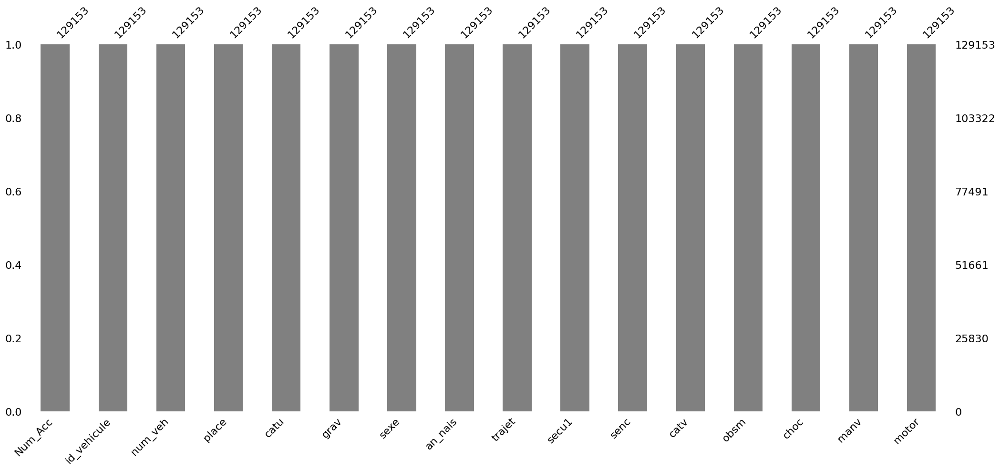

In [337]:
# Visualisation de tout notre dataset
msno.bar(df_usa_veh, sort= "ascending", color= "grey")

* Absence de données manquantes.

## 4.2 Deuxième jointure

In [338]:
print(df_usa_veh['Num_Acc'].dtype)
print(df_lieux_final['Num_Acc'].dtype)

int64
int64


In [339]:
# Deuxième jointure jointure
df_usa_veh_lieux = pd.merge(df_usa_veh, df_lieux_final, on = "Num_Acc", how = "left")

print(df_usa_veh_lieux.shape)
df_usa_veh_lieux.head(3)

(129166, 25)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma
0,202100021165,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1,973,2,2,2,1,1,1,1,80
1,202100020281,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1,49,4,1,1,1,2,1,1,50
2,202100047336,117153,A01,1,1,4,2,1972,1,2,1,30,2,1,2,1,64,4,1,1,1,1,1,1,30


#### **Gestion des doublons aprés jointure**

In [340]:
# Afficher les doublons sur les trois colonnes
df_doublons_join2 = df_usa_veh_lieux[df_usa_veh_lieux.duplicated(subset=["Num_Acc", "id_vehicule", "num_veh"], keep=False)].sort_values(by=["Num_Acc", "id_vehicule", "num_veh"])
print(df_doublons_join2.shape)

# Afficher les 10 premières lignes
df_doublons_join2.head(10)

(55835, 25)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma
23858,202100000003,201761,A01,1,1,1,1,1995,1,1,1,7,1,3,1,1,85,4,2,2,1,1,1,1,50
88793,202100000003,201761,A01,10,3,3,2,1959,4,1,1,7,1,3,1,1,85,4,2,2,1,1,1,1,50
19194,202100000007,201750,B01,1,1,1,1,2001,5,1,3,7,2,2,11,1,38,4,2,2,1,1,1,1,50
104736,202100000007,201750,B01,4,2,4,2,2002,4,1,3,7,2,2,11,1,38,4,2,2,1,1,1,1,50
55015,202100000008,201748,B01,1,1,3,1,1972,5,2,2,32,2,1,1,1,987,2,2,2,1,1,1,1,40
59026,202100000008,201748,B01,2,2,4,2,1984,5,8,2,32,2,1,1,1,987,2,2,2,1,1,1,1,40
2826,202100000009,201747,B01,2,2,4,2,1936,5,1,2,7,2,1,1,1,92,3,2,3,1,1,2,1,50
96923,202100000009,201747,B01,1,1,1,1,1935,5,1,2,7,2,1,1,1,92,3,2,3,1,1,2,1,50
22345,202100000010,201745,B01,1,1,4,2,1994,4,1,1,37,2,3,2,2,93,2,1,4,1,1,1,6,50
62879,202100000010,201745,B01,8,2,4,2,1959,5,8,1,37,2,3,2,2,93,2,1,4,1,1,1,6,50


* Il s'agisse des doublons impurs.

#### **Gestion des données manquantes aprés jointure**

In [341]:
# Afficher les VM dans chacune des colonnes
print(df_usa_veh_lieux.isnull().sum())

Num_Acc        0
id_vehicule    0
num_veh        0
place          0
catu           0
grav           0
sexe           0
an_nais        0
trajet         0
secu1          0
senc           0
catv           0
obsm           0
choc           0
manv           0
motor          0
dep            3
catr           3
circ           3
nbv            3
prof           3
plan           3
surf           3
situ           3
vma            3
dtype: int64


<AxesSubplot: >

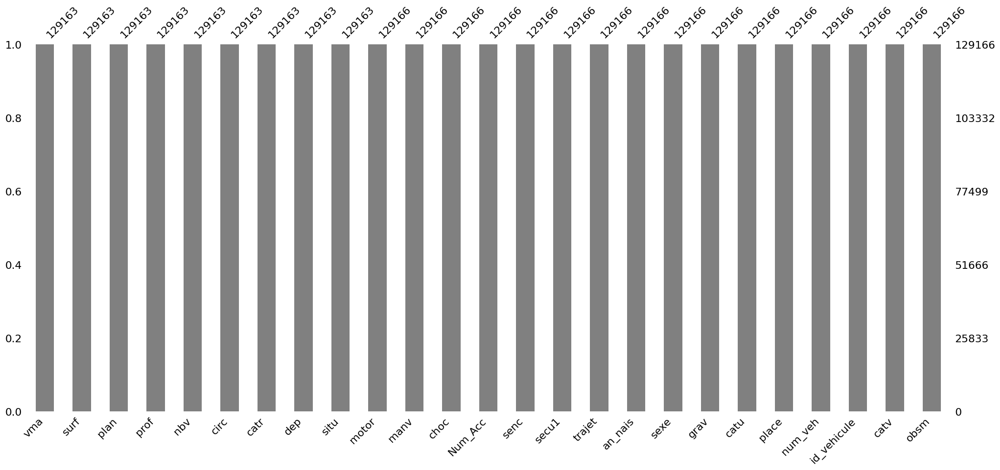

In [342]:
# Visualisation de tout notre dataset
msno.bar(df_usa_veh_lieux, sort= "ascending", color= "grey")

* Présence de valeurs manquantes dans certaines colonnes, ça veut dire que certains **Num_Acc** présents dans **df_usa_veh** n’existent pas dans **df_lieux_final**.
* Identifions ces lignes.

In [343]:
# Trouver les identifiants qui n'ont pas de correspondance dans la table lieux
ids_sans_lieux = df_usa_veh[~df_usa_veh['Num_Acc'].isin(df_lieux_final['Num_Acc'])]

# Affichage des lignes 
ids_sans_lieux 

,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor
129150,202100056519,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1
129151,202100056520,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1
129152,202100056521,117153,A01,1,1,4,2,1972,5,2,1,30,2,1,2,1


In [344]:
# Isoler les valeurs manquantes
print(df_usa_veh_lieux[df_usa_veh_lieux.isna().any(axis = 1)].shape)
df_usa_veh_lieux[df_usa_veh_lieux.isna().any(axis = 1)].head(6)

(3, 25)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma
129163,202100056519,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
129164,202100056520,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
129165,202100056521,117153,A01,1,1,4,2,1972,5,2,1,30,2,1,2,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


* Vu qu’il y a seulement 3 lignes manquantes sur 129169 usagers, nous allons supprimer ces lieux qui n'ont pas de correspondances.

In [345]:
# Suppressions des VM
df_usa_veh_lieux = df_usa_veh_lieux.dropna()

# Afficher la somme des VM
print(df_usa_veh_lieux.shape)
print(df_usa_veh_lieux.isna().sum().sum())

(129163, 25)
0


## 4.3 Troisième jointure

In [346]:
# Troixième jointure jointure
df_usa_veh_lieux_carac = pd.merge(df_usa_veh_lieux, df_carac_final, on = "Num_Acc", how = "left")

print(df_usa_veh_lieux_carac.shape)
df_usa_veh_lieux_carac.head(3)

(129163, 37)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,an,hrmn,lum,com,agg,int,atm,col,lat,long
0,202100021165,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1,973,2,2,2,1,1,1,1,80,3,9,2021,20:00:00,3,97303,1,1,1,1,48,2
1,202100020281,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1,49,4,1,1,1,2,1,1,50,2,9,2021,18:30:00,1,49099,2,6,1,2,47,-1
2,202100047336,117153,A01,1,1,4,2,1972,1,2,1,30,2,1,2,1,64,4,1,1,1,1,1,1,30,19,3,2021,14:20:00,1,64445,2,1,1,2,43,-0


#### **Gestion des doublons aprés jointure**

In [347]:
# Afficher les doublons sur les trois colonnes
df_doublons_join3 = df_usa_veh_lieux_carac[df_usa_veh_lieux_carac.duplicated(subset=["Num_Acc", "id_vehicule", "num_veh"], keep=False)].sort_values(by=["Num_Acc", "id_vehicule", "num_veh"])
print(df_doublons_join3.shape)

# Afficher les 10 premières lignes
df_doublons_join3.head(10)

(55835, 37)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,an,hrmn,lum,com,agg,int,atm,col,lat,long
23858,202100000003,201761,A01,1,1,1,1,1995,1,1,1,7,1,3,1,1,85,4,2,2,1,1,1,1,50,15,7,2021,07:55:00,1,85048,2,1,7,6,47,-1
88793,202100000003,201761,A01,10,3,3,2,1959,4,1,1,7,1,3,1,1,85,4,2,2,1,1,1,1,50,15,7,2021,07:55:00,1,85048,2,1,7,6,47,-1
19194,202100000007,201750,B01,1,1,1,1,2001,5,1,3,7,2,2,11,1,38,4,2,2,1,1,1,1,50,13,12,2021,19:10:00,5,38053,2,9,1,1,46,5
104736,202100000007,201750,B01,4,2,4,2,2002,4,1,3,7,2,2,11,1,38,4,2,2,1,1,1,1,50,13,12,2021,19:10:00,5,38053,2,9,1,1,46,5
55015,202100000008,201748,B01,1,1,3,1,1972,5,2,2,32,2,1,1,1,987,2,2,2,1,1,1,1,40,21,11,2021,16:30:00,1,98715,2,1,1,3,48,2
59026,202100000008,201748,B01,2,2,4,2,1984,5,8,2,32,2,1,1,1,987,2,2,2,1,1,1,1,40,21,11,2021,16:30:00,1,98715,2,1,1,3,48,2
2826,202100000009,201747,B01,2,2,4,2,1936,5,1,2,7,2,1,1,1,92,3,2,3,1,1,2,1,50,29,12,2021,16:45:00,2,92048,2,2,2,3,49,2
96923,202100000009,201747,B01,1,1,1,1,1935,5,1,2,7,2,1,1,1,92,3,2,3,1,1,2,1,50,29,12,2021,16:45:00,2,92048,2,2,2,3,49,2
22345,202100000010,201745,B01,1,1,4,2,1994,4,1,1,37,2,3,2,2,93,2,1,4,1,1,1,6,50,16,10,2021,09:53:00,1,93008,2,1,1,3,49,2
62879,202100000010,201745,B01,8,2,4,2,1959,5,8,1,37,2,3,2,2,93,2,1,4,1,1,1,6,50,16,10,2021,09:53:00,1,93008,2,1,1,3,49,2


* Doublons impurs.

#### **Gestion des données manquantes aprés jointure**

In [348]:
# Afficher les VM dans chacune des colonnes
print(df_usa_veh_lieux_carac.isnull().sum())

Num_Acc        0
id_vehicule    0
num_veh        0
place          0
catu           0
grav           0
sexe           0
an_nais        0
trajet         0
secu1          0
senc           0
catv           0
obsm           0
choc           0
manv           0
motor          0
dep            0
catr           0
circ           0
nbv            0
prof           0
plan           0
surf           0
situ           0
vma            0
jour           0
mois           0
an             0
hrmn           0
lum            0
com            0
agg            0
int            0
atm            0
col            0
lat            0
long           0
dtype: int64


<AxesSubplot: >

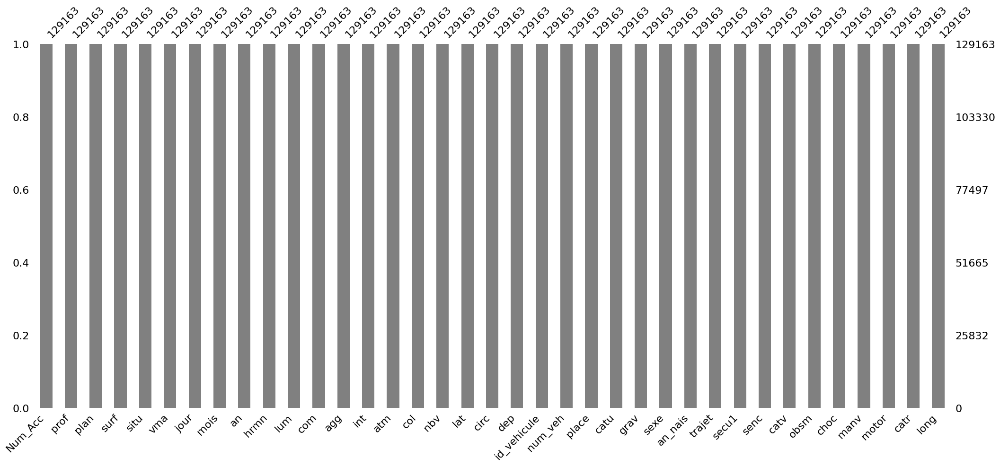

In [349]:
# Visualisation de tout notre dataset
msno.bar(df_usa_veh_lieux_carac, sort= "ascending", color= "grey")

* Absence de doublons.

In [350]:
# Faire une copie
df_final = df_usa_veh_lieux_carac.copy()

# Afficher les 5 premières lignes de notre table final
df_final.head(5)

,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,an,hrmn,lum,com,agg,int,atm,col,lat,long
0,202100021165,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1,973,2,2,2,1,1,1,1,80,3,9,2021,20:00:00,3,97303,1,1,1,1,48,2
1,202100020281,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1,49,4,1,1,1,2,1,1,50,2,9,2021,18:30:00,1,49099,2,6,1,2,47,-1
2,202100047336,117153,A01,1,1,4,2,1972,1,2,1,30,2,1,2,1,64,4,1,1,1,1,1,1,30,19,3,2021,14:20:00,1,64445,2,1,1,2,43,-0
3,202100008918,185779,B01,1,1,4,1,1985,9,8,1,1,2,7,2,5,74,3,2,2,1,1,1,1,50,31,5,2021,21:20:00,2,74010,2,6,1,3,46,6
4,202100009175,185315,A01,1,1,3,1,1960,5,1,2,7,2,1,13,1,83,3,2,2,1,2,1,1,80,7,11,2021,13:45:00,1,83066,1,1,1,1,44,6


* Aprés jointure de nos différentes tables, nous n'avons plus de valeurs manquantes,
* Pour celà nous allons sauvegarder ces données afin de les utiliser pour la suite de l'analyse.

## 4.4 Sauvegarde des données

* Nous allons sauvegarder deux bases:
    * la première avec toutes les caractérisques de l'assuré, du véhicule, et la commune où réside l'assuré
    * la deuxième base y'aura toutes les caractérisques de l'assuré, de l'automobile, la commune où réside l'assuré et les données spaciales.
* Séparer les deux bases nous permettra de faire soit un zonier (en se basant des caractériques spaciales) ou un véhiculier (en se basant des caractéristiques du véhicule)

In [351]:
# Sauvegarde de la base final
df_final.to_csv("C:/Users/diarr/Downloads/Projet tutorés/df_final_accidents_corporels.csv", index = False)

# Partie 2 : ECONOMETRIE

# 5. Analyse descriptive des variables

* Nous allons importer notre base de données nettoyés afin continuer notre analyse.

## 5.1) Chargement des bases de données

In [352]:
# charger la base
base_final = pd.read_csv("C:/Users/diarr/Downloads/Projet tutorés/df_final_accidents_corporels.csv", sep = ",")

# afficher le nombre maximum de colonnes
pd.set_option('display.max_columns', 40)

print(base_final.shape)
base_final.head(5)

(129163, 37)


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,an,hrmn,lum,com,agg,int,atm,col,lat,long
0,202100021165,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1,973,2,2,2,1,1,1,1,80,3,9,2021,20:00:00,3,97303,1,1,1,1,48,2
1,202100020281,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1,49,4,1,1,1,2,1,1,50,2,9,2021,18:30:00,1,49099,2,6,1,2,47,-1
2,202100047336,117153,A01,1,1,4,2,1972,1,2,1,30,2,1,2,1,64,4,1,1,1,1,1,1,30,19,3,2021,14:20:00,1,64445,2,1,1,2,43,-0
3,202100008918,185779,B01,1,1,4,1,1985,9,8,1,1,2,7,2,5,74,3,2,2,1,1,1,1,50,31,5,2021,21:20:00,2,74010,2,6,1,3,46,6
4,202100009175,185315,A01,1,1,3,1,1960,5,1,2,7,2,1,13,1,83,3,2,2,1,2,1,1,80,7,11,2021,13:45:00,1,83066,1,1,1,1,44,6


* Aprés le chargement de la base, nous faire une inspection c'est à dire vérifier différentes informations.

In [353]:
# Afficher les informations sur le DataFrame
print("Informations sur le DataFrame:", base_final.info())
print("=============================================")
# Afficher la dimension du DataFrame
print("Forme du DataFrame:", base_final.shape)
print("=============================================")
print("Valeurs manquantes par colonne:", base_final.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129163 entries, 0 to 129162
Data columns (total 37 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Num_Acc      129163 non-null  int64  
 1   id_vehicule  129163 non-null  int64  
 2   num_veh      129163 non-null  object 
 3   place        129163 non-null  int64  
 4   catu         129163 non-null  int64  
 5   grav         129163 non-null  int64  
 6   sexe         129163 non-null  int64  
 7   an_nais      129163 non-null  int64  
 8   trajet       129163 non-null  int64  
 9   secu1        129163 non-null  int64  
 10  senc         129163 non-null  int64  
 11  catv         129163 non-null  int64  
 12  obsm         129163 non-null  int64  
 13  choc         129163 non-null  int64  
 14  manv         129163 non-null  int64  
 15  motor        129163 non-null  int64  
 16  dep          129163 non-null  object 
 17  catr         129163 non-null  float64
 18  circ         129163 non-

## 5.2) Analyse descriptive des variables

In [354]:
# Statistique descriptive de toutes les variables
base_final.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Num_Acc,129163,NaN,NaN,NaN,202100028103,16286,202100000001,202100014034,202100028023,202100042082,202100056518
id_vehicule,129163,NaN,NaN,NaN,151477,29112,100882,126404,151621,176618,201765
num_veh,129163,53,A01,76947,NaN,NaN,NaN,NaN,NaN,NaN,NaN
place,129163,NaN,NaN,NaN,2,3,1,1,1,1,10
catu,129163,NaN,NaN,NaN,1,1,1,1,1,1,3
grav,129163,NaN,NaN,NaN,3,1,1,1,3,4,4
sexe,129163,NaN,NaN,NaN,1,0,1,1,1,2,2
an_nais,129163,NaN,NaN,NaN,1983,19,1920,1971,1987,1998,2021
trajet,129163,NaN,NaN,NaN,4,2,1,3,5,5,9
secu1,129163,NaN,NaN,NaN,2,2,1,1,1,2,9


In [355]:
# les colonnes de la base finale
base_final.columns

Index(['Num_Acc', 'id_vehicule', 'num_veh', 'place', 'catu', 'grav', 'sexe',
       'an_nais', 'trajet', 'secu1', 'senc', 'catv', 'obsm', 'choc', 'manv',
       'motor', 'dep', 'catr', 'circ', 'nbv', 'prof', 'plan', 'surf', 'situ',
       'vma', 'jour', 'mois', 'an', 'hrmn', 'lum', 'com', 'agg', 'int', 'atm',
       'col', 'lat', 'long'],
      dtype='object')

In [356]:
# Séparer les variables catégorielles (qualitatives)
qualitative_vars = [
    'place', 'catu', 'sexe', 'trajet', 'secu1', 'senc', 'obsm', 'choc', 'motor',
    'catr', 'circ', 'prof', 'plan', 'surf', 'situ', 'catv', 'manv', 'hrmn',
    'mois', 'lum', 'agg', 'int', 'atm', 'col', 'grav', 'dep', 'com', 'num_veh', 'vma']

# Séparer les variables numériques (quantitatives)
quantitative_vars = ['Num_Acc', 'id_vehicule',
    'an_nais', 'jour', 'lat', 'long', 'nbv']

# Afficher les listes
print("Variables quantitatives :", quantitative_vars)
print("=================================================================================================================")
print("Variables qualitatives :", qualitative_vars)

Variables quantitatives : ['Num_Acc', 'id_vehicule', 'an_nais', 'jour', 'lat', 'long', 'nbv']
Variables qualitatives : ['place', 'catu', 'sexe', 'trajet', 'secu1', 'senc', 'obsm', 'choc', 'motor', 'catr', 'circ', 'prof', 'plan', 'surf', 'situ', 'catv', 'manv', 'hrmn', 'mois', 'lum', 'agg', 'int', 'atm', 'col', 'grav', 'dep', 'com', 'num_veh', 'vma']


### 5.2.a) Analyse descriptive des variables quantitatives

In [357]:
# Statistique descriptive
base_final[quantitative_vars].describe().T

,count,mean,std,min,25%,50%,75%,max
Num_Acc,129163,202100028103,16286,202100000001,202100014034,202100028023,202100042082,202100056518
id_vehicule,129163,151477,29112,100882,126404,151621,176618,201765
an_nais,129163,1983,19,1920,1971,1987,1998,2021
jour,129163,16,9,1,8,16,23,31
lat,129163,47,2,41,45,48,49,51
long,129163,3,2,-5,2,2,5,10
nbv,129163,3,1,1,2,2,3,12


**Explication de l’analyse descriptive des variables quantitatives**

Avant d’exécuter l’analyse, nous formulons des hypothèses sur les variables qui pourraient avoir un impact sur la gravité d'un accident.

* **Objectif de l’analyse descriptive**
Nous cherchons à explorer les tendances générales, identifier d’éventuelles anomalies, mieux comprendre les distributions, et évaluer si certaines variables ont un lien potentiel avec la gravité des sinistres (**grav**) ou la fréquence des accidents (**Num_Acc**).

* **Hypothèses et sélection des variables**
Nous avons sélectionné des variables qui, selon nos hypothèses, pourraient influencer la fréquence et la gravité des sinistres.

**an_nais (Année de naissance)**: Les conducteurs plus jeunes ou plus âgés sont plus à risque avec une moyenne d'année de naissance 1983, un Min = 1920 et un Max = 2021

**jour**: Certains jours du mois sont plus accidentogènes (ex : début ou fin de mois ) avec une Moyenne = 16. Ce qui nous donne une répartition équilibrée

(On peut faire une analyse bivariée jour vs gravité, ou même faire un test statistique pour connaitre la significativité)

**lat et long**: La localisation géographique influence les risques (zones urbaines vs rurales) avec une Moyenne lat = 47, long = 3 (À croiser avec une carte pour repérer les zones à risques.


* **À noter** : Nous ne supposons pas que ces variables influencent directement les sinistres. L’analyse descriptive nous permettra d’explorer les relations et de voir si nos hypothèses tiennent.

Nous allons maintenant effectuer cette analyse à l’aide de statistiques générales, de visualisations et de matrices de corrélation.

### 5.2.b) Analyse descriptive des variables qualitatives

In [358]:
# Statistique descriptive
base_final[qualitative_vars].describe().T

,count,mean,std,min,25%,50%,75%,max
place,129163,2,3,1,1,1,1,10
catu,129163,1,1,1,1,1,1,3
sexe,129163,1,0,1,1,1,2,2
trajet,129163,4,2,1,3,5,5,9
secu1,129163,2,2,1,1,1,2,9
senc,129163,2,1,1,1,2,2,3
obsm,129163,2,1,1,2,2,2,9
choc,129163,3,2,1,1,2,4,9
motor,129163,1,1,1,1,1,1,6
catr,129163,3,1,1,3,3,4,9


**Analyse descriptive des variables qualitatives**

Avant d'exécuter l'analyse descriptive des variables qualitatives, il est important de rappeler l'objectif de cette étape.

* **Les variables qualitatives** représentent des catégories (ex : gravité de l'accident, type de motor, de véhicule, nombre de voies…). Leur analyse descriptive va permettre de :
    * Comprendre la répartition des modalités et identifier les valeurs les plus fréquentes.
    * Repérer d’éventuelles anomalies comme des valeurs incohérentes ou des catégories rares.
    * Explorer d’éventuelles relations entre ces variables et la sinistralité pour voir si certaines catégories influencent la probabilité d’avoir un sinistre.
    * Cela permettra d'orienter des modélisations futures (classification, encodage, réduction de cardinalité...).

* **Nous allons donc effectuer :**
     * Un comptage des occurrences pour voir la distribution des modalités.
     * Des visualisations (diagrammes en barres) pour mieux interpréter ces distributions.
     * Une étude des relations entre certaines variables qualitatives et la survenue d’un sinistre.

**L’objectif** est d’explorer des tendances et d'identifier des facteurs potentiels de risque pour les sinistres.

Nous allons maintenant exécuter le code pour cette analyse. 

In [359]:
# boucle for afin d'afficher les différentes modalités (tableaux de contigence)
for i in base_final[qualitative_vars]:
    print("=========================================")
    print(base_final[qualitative_vars][i].value_counts(dropna=False), "\n", (base_final[qualitative_vars][i].value_counts(dropna=False, normalize = True)))

place
1     97053
2     14451
10     9475
3      2474
4      2228
9      1187
7      1101
5       610
8       437
6       147
Name: count, dtype: int64 
 place
1    1
2    0
10   0
3    0
4    0
9    0
7    0
5    0
8    0
6    0
Name: proportion, dtype: float64
catu
1    97286
2    22402
3     9475
Name: count, dtype: int64 
 catu
1   1
2   0
3   0
Name: proportion, dtype: float64
sexe
1    89274
2    39889
Name: count, dtype: int64 
 sexe
1   1
2   0
Name: proportion, dtype: float64
trajet
5    63005
1    23894
4    16944
9    15227
3     6204
2     3889
Name: count, dtype: int64 
 trajet
5   0
1   0
4   0
9   0
3   0
2   0
Name: proportion, dtype: float64
secu1
1    90312
2    23949
8    13756
3      821
6      114
9      109
4       75
5       24
7        3
Name: count, dtype: int64 
 secu1
1   1
2   0
8   0
3   0
6   0
9   0
4   0
5   0
7   0
Name: proportion, dtype: float64
senc
1    62470
2    46934
3    19759
Name: count, dtype: int64 
 senc
1   0
2   0
3   0
Name: proportion, 

**Exemple de variables**

**vma**: Les routes avec une vitesse maximale élevée sont souvent associées à des accidents plus graves en raison de la violence des impacts. À l'inverse, les zones limitées à 30 ou 50 km/h sont souvent urbaines, où la fréquence d'accidents peut être plus élevée mais leur gravité moindre.Nous avons: 

* La moyenne égale à 61 km/h, cela suggère une forte proportion d’accidents en zones urbaines (50 km/h).

* La médiane à 50 km/h, ce qui renforce l'idée que la majorité des accidents surviennent dans des zones urbaines.

* Un maximum à 130 km/h (des cas en autoroute), à étudier en lien avec la gravité (grav) ou le nombre de véhicules impliqués.

* Un minimum à 10 km/h (probablement des zones de parking ou piétonnes) potentiellement non significatif, ou à analyser comme cas particuliers.

# 6. DATAVISUALISATION: Analyse Graphique

* L'objectif de ces visualisations permettent d'observer la distribution des différentes variables.
* aident à comprendre les habitudes des usagers, détectant d'éventuelles tendances ou anomalies dans les comportements de conduite.

## 6.1 Analyse univarié

### 6.1.a) Variable quantitative

Pour analyser une variable quantitative, on peut faire 
* Stats des : describe()
* graphique : histogramme ou boxplots

* Nous avons l'année de naissance de chacun de nos usagers, maintenant on veut connaitre leur âge exact au moment des faits (moment des sinistres),
* Pour celà nous allons nous baser sur l'année où les sinistres sont sauvegardés (**2021**) pour faire la différence afin de trouver l'âge exact de l'usager.

In [360]:
# ajouter une colonne âge
base_final['age'] = 2021 - base_final['an_nais']

In [361]:
# Vérification des VM
base_final.isna().sum().sum()

0

* Pas de VM aprés l'ajout de de la nouvelle colonne,
* Vérifions s'il y'a pas des valeurs incohérentes aprés l'ajout de la colonne **âge**.

In [362]:
print(base_final['age'].describe())
base_final[base_final['age'] == 0]

count   129163
mean        38
std         19
min          0
25%         23
50%         34
75%         50
max        101
Name: age, dtype: float64


,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,an,hrmn,lum,com,agg,int,atm,col,lat,long,age
106,202100039541,130913,A01,3,2,4,2,2021,5,1,2,7,2,2,22,1,93,1,3,7,2,2,2,1,70,18,5,2021,20:00:00,1,93027,1,1,2,6,49,2,0
963,202100025360,156330,A01,3,2,3,2,2021,5,9,2,7,2,3,13,1,12,3,2,2,2,4,2,1,90,7,8,2021,13:50:00,1,12016,1,1,2,5,45,2,0
1092,202100028110,151458,C01,4,2,1,2,2021,5,3,1,10,2,8,1,1,72,4,2,2,1,1,1,1,50,18,7,2021,11:10:00,1,72181,2,1,1,6,48,0,0
1212,202100048247,115508,A01,1,1,4,1,2021,4,8,1,10,2,1,1,1,69,4,2,2,1,1,2,4,50,12,3,2021,07:15:00,2,69256,2,1,1,6,46,5,0
1679,202100000938,200073,A01,2,2,4,2,2021,9,1,2,7,2,1,1,1,84,3,2,2,2,3,8,1,50,30,12,2021,16:20:00,1,84139,2,1,1,1,44,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122455,202100023907,158901,B01,3,2,4,1,2021,5,3,1,7,2,4,2,1,75,4,1,3,1,1,1,1,70,16,8,2021,10:10:00,1,75115,2,1,1,2,49,2,0
124142,202100003027,196372,B01,3,2,1,2,2021,5,3,2,7,2,1,1,1,64,3,2,2,1,3,1,1,80,16,12,2021,15:20:00,1,64422,1,1,1,5,43,-1,0
124241,202100002240,197779,B01,3,2,4,1,2021,5,3,1,7,2,4,13,1,51,3,1,2,1,1,1,1,90,17,12,2021,17:35:00,3,51493,1,1,1,2,49,4,0
126756,202100040155,129822,B01,3,2,4,1,2021,5,1,1,7,2,1,1,1,76,2,2,3,1,1,1,1,50,12,5,2021,10:10:00,1,76540,2,3,1,2,49,1,0


* Nous avons avons des lignes ou l'âge est égal à 0, il s'agit pas des valeurs incohérentes mais les plus jeunes usagers plausibles peuvent être des bébés transportés ou piétons avec année de naissance 2021 (0 an).
* Vérifions combien d’usagers ont age == 0

In [363]:
# Vérification 
base_final[base_final['age'] == 0]['catu'].value_counts()

catu
2    208
1     13
3     13
Name: count, dtype: int64

* Nous avons:
    * 208 bébés passagers : c'est très cohérent ce sont probablement des nourrissons transportés en voiture.

    * 13 bébés conducteurs : probablement une erreur de saisie.

    * 13 bébés piétons : (bébés en poussette, portés, ou en déplacement accompagné).
 
* Nous allons laisser les données telles quelles, en notant qu’il y a quelques incohérences possibles (13 conducteurs de 0 an…).

In [364]:
# Séparer les variables numériques (quantitatives)
quantitative_vars = ['Num_Acc', 'id_vehicule',
    'an_nais', 'jour', 'lat', 'long', 'age', 'nbv']

# exclure 'Num_Acc' et 'id_vehicule' pour l'analyse descriptive
quantitative_vars = [var for var in quantitative_vars if var not in ['Num_Acc', 'id_vehicule']]

# Afficher la liste des variables
print("Variables quantitatives :", quantitative_vars)

Variables quantitatives : ['an_nais', 'jour', 'lat', 'long', 'age', 'nbv']


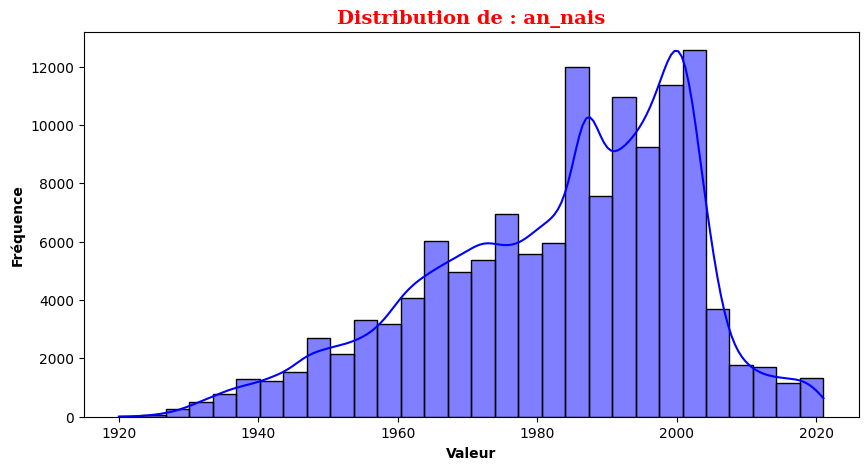

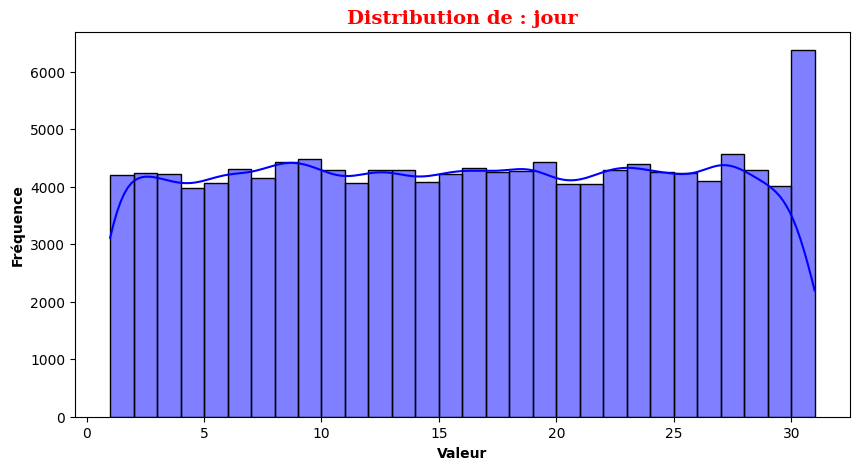

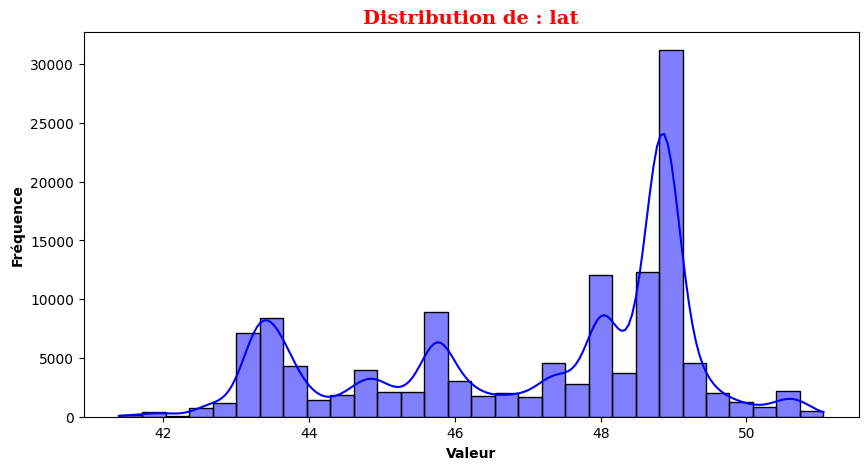

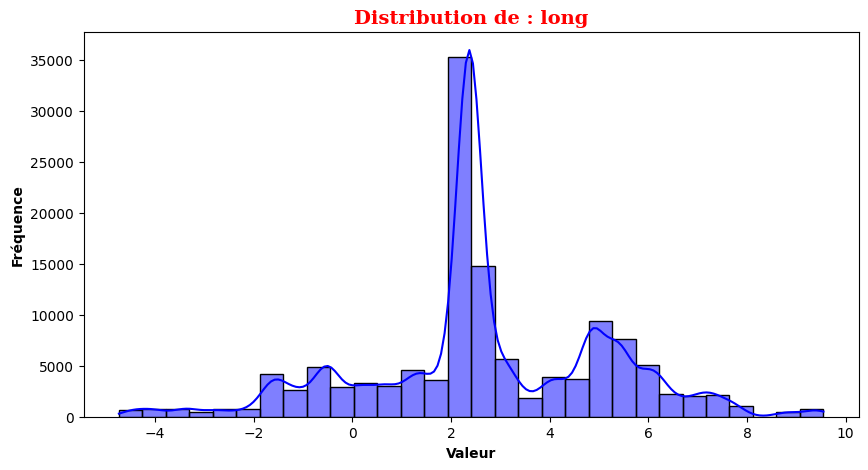

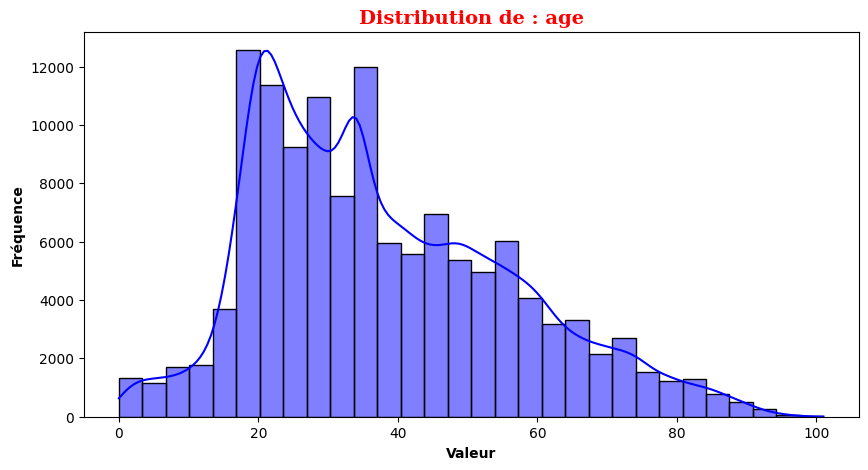

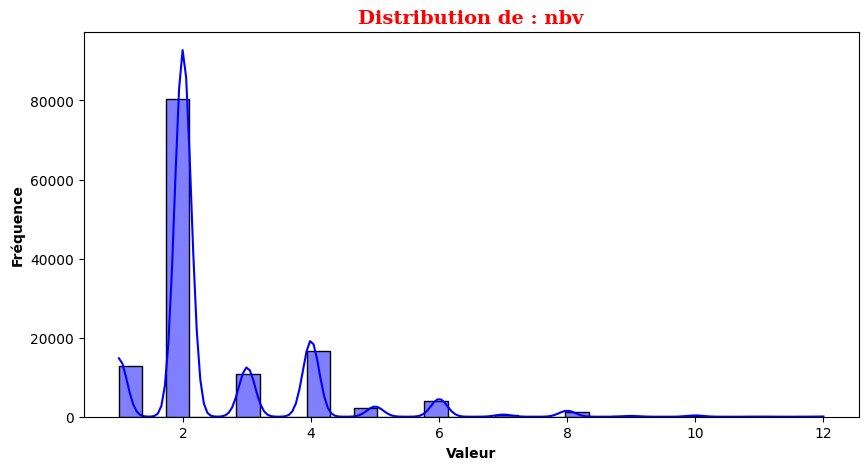

In [365]:
# Visualisation
font_title = {"family": "serif",
              "color":  "red",
              "weight": "bold",
              "size": 14}
for col in quantitative_vars:
    plt.rcParams.update({ "font.size" : 10})
    plt.figure(figsize=(10,5)) 
    sns.histplot(base_final[quantitative_vars][col], bins = 30, kde = True, color = "blue")
    plt.xlabel("Valeur", fontweight = "bold")
    plt.ylabel("Fréquence", fontweight = "bold")
    plt.title('Distribution de : ' + str(col), fontdict=font_title)
    plt.show()
    print("\n")

**Objectif du Graphique:**

* L'objectif de ces visualisations est d'explorer la distribution de chacune des variables quantiatives dans la base de données afin d'obtenir une meilleure compréhension de nos variables. Cela permettra de comprendre:
  * les caractéristiques du conducteur, les habitdes des assurés;
  * et en détectant d'éventuelles tendances ou anomalies dans les comportements de conduite.

**Interprétation du graphique:**

* an_nais : La distribution de l'année de naissance des usagers est centrée autour de 1983, avec un pic entre 1970 et 2000. La majorité des individus sont nés entre 1960 et 2000, avec un pic vers 1980-1990. Les années avant 1940 sont peu représentées (il s'agit des usagers âgés et sont pas nombreux).

* jour : La distribution est relativement uniforme, ce qui est logique. Les accidents (ou données) se répartissent à peu près également sur les jours mais on constate une pic ou légère hausse vers la fin du mois (jour 30-31).

* lat : Les valeurs sont concentrées entre 42 et 50, ce qui correspond aux latitudes de la France métropolitaine. On observe aussi plusieurs pics : un très net autour de 49-50 et un autre vers 44-46.

* long : La distribution est centrée autour de 2° Est, ce qui est cohérente avec la France avec une forte concentration entre 1 et 3, qui pourrait correspondre à l’axe Paris - Lyon. On observe aussi des valeurs allant vers l’ouest (jusqu’à -5).

* age : Nous avons une distribution assymétrique à droite. Un pic important entre 18 et 30 ans, ce qui montre que la majorité des conducteurs ou impliqués dans les accidents sont des jeunes adultes. L’effectif diminue progressivement après 40 ans. Quelques cas au-delà de 80 ans, mais très rares.

* nbv : On constate une distribution très concentrée, avec quelques valeurs dominantes. La majorité des accidents sur des routes à 2 voies. Quelques occurrences sur des routes à 1 voie, 3 voies, ou plus mais beaucoup plus rares. avec une distribution très déséquilibrée.

### 6.1.b) Variable qualitative

Pour analyser des variables qualitatives, on peut faire soit:
* tableau de contingence (fréquence absolues : relatives)
* graphique : pieplot / barplot

**Objectif du Graphique:**

* L'objectif de ces visualisations est d'explorer la distribution des variables catégorielles dans la base de données afin d'obtenir une meilleure compréhension des caractéristiques des clients et des contrats d'assurance. Cela permet de :

    * Analyser la répartition des modalités : Identifier les valeurs les plus fréquentes et repérer d'éventuels déséquilibres.
    * Détecter d'éventuelles anomalies : Vérifier si certaines modalités sont sous-représentées ou inhabituelles.


In [366]:
# Séparer les variables catégorielles (qualitatives)
qualitative_vars = [
    'place', 'catu', 'sexe', 'trajet', 'secu1', 'senc', 'obsm', 'choc', 'motor', 'vma',
    'catr', 'circ', 'prof', 'plan', 'surf', 'situ', 'catv', 'manv', 'hrmn',
    'mois', 'lum', 'agg', 'int', 'atm', 'col', 'grav', 'dep', 'com', 'num_veh']

# exclure 'num_veh' pour l'analyse descriptive
qualitative_vars = [var for var in qualitative_vars if var not in ['num_veh']]

# Afficher la liste des variables
print("Variables qualitatives :", qualitative_vars)

Variables qualitatives : ['place', 'catu', 'sexe', 'trajet', 'secu1', 'senc', 'obsm', 'choc', 'motor', 'vma', 'catr', 'circ', 'prof', 'plan', 'surf', 'situ', 'catv', 'manv', 'hrmn', 'mois', 'lum', 'agg', 'int', 'atm', 'col', 'grav', 'dep', 'com']


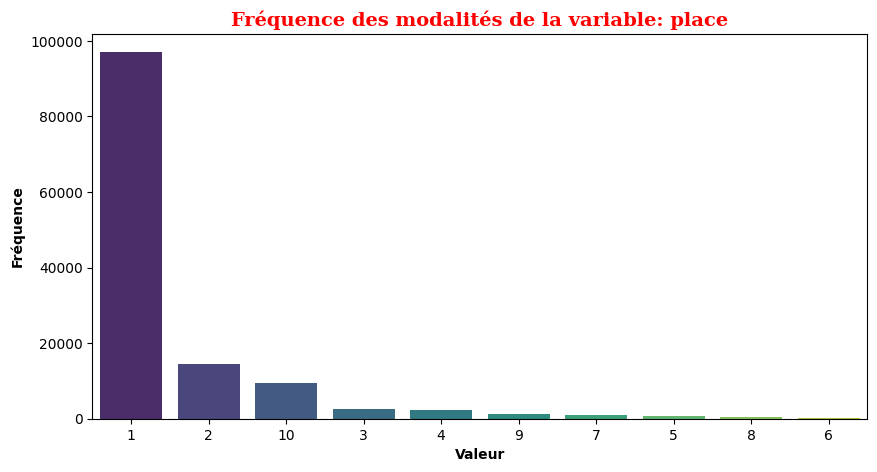

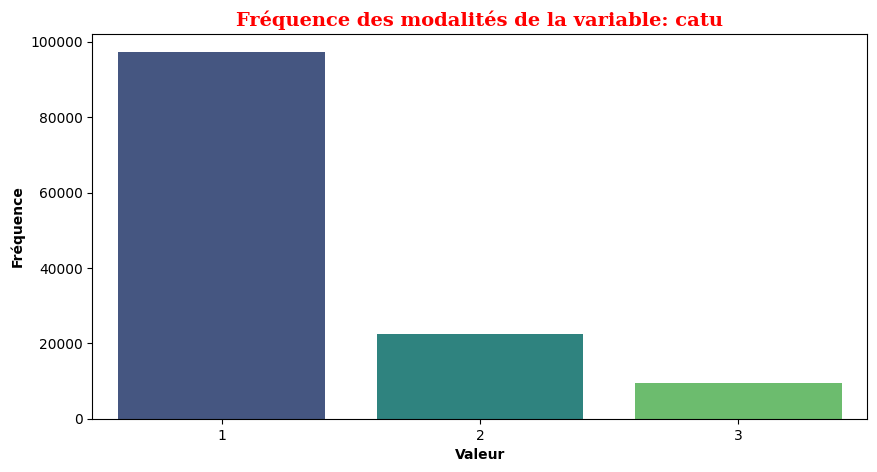

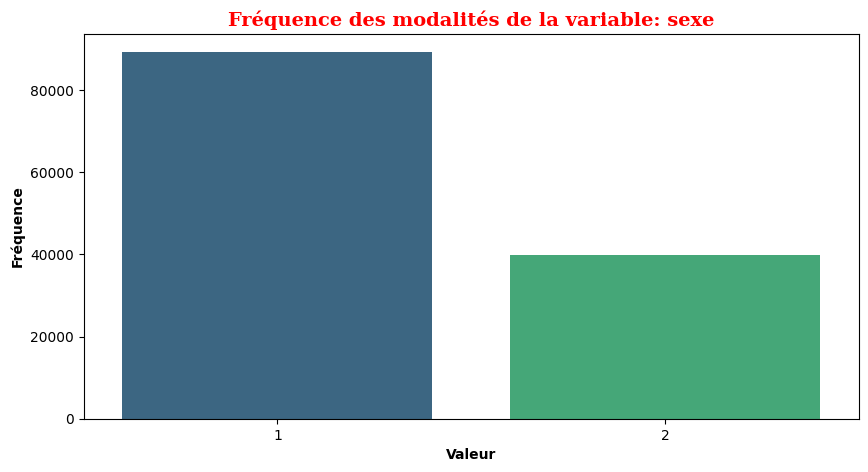

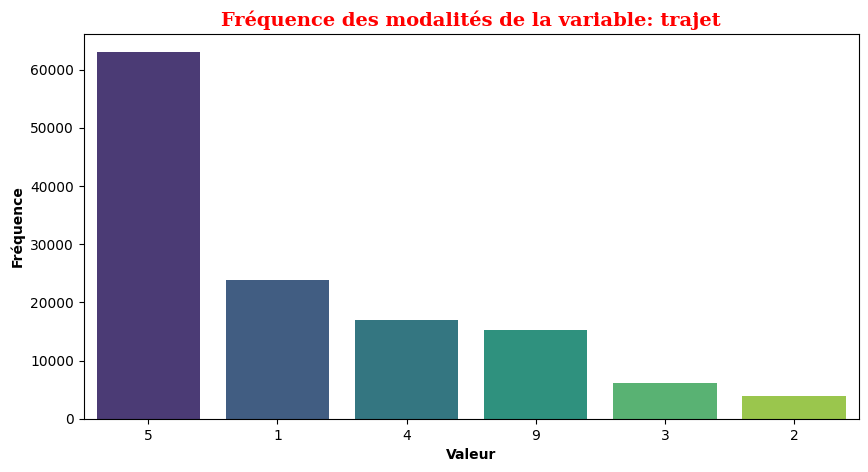

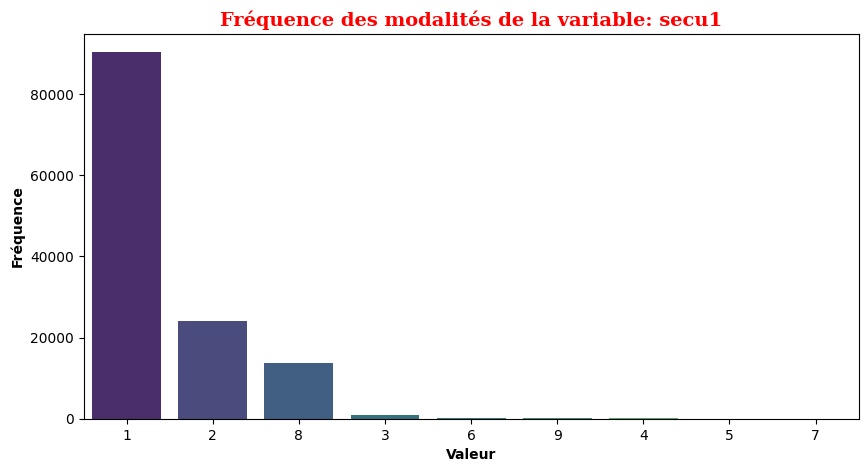

...

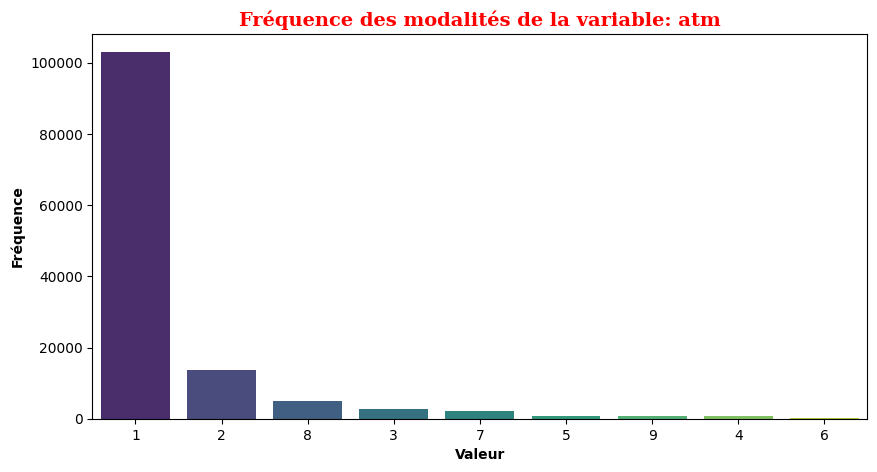

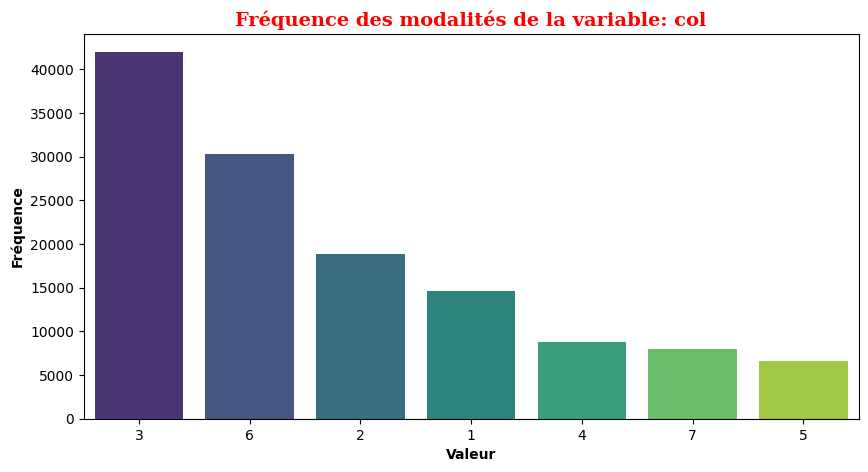

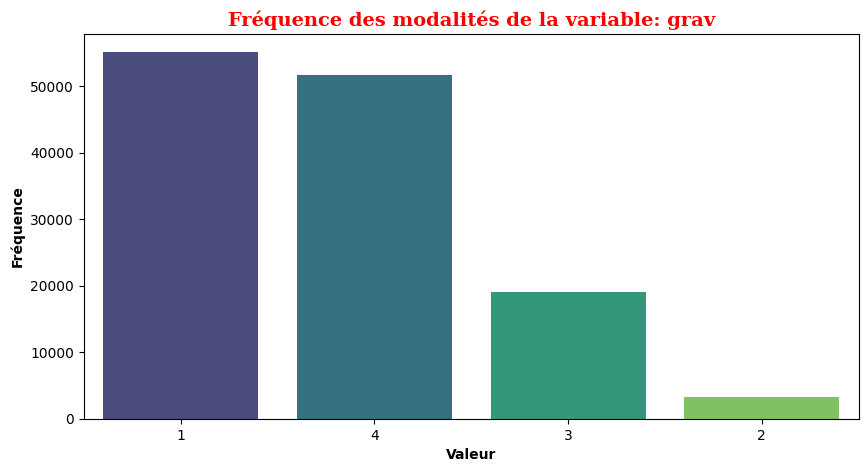

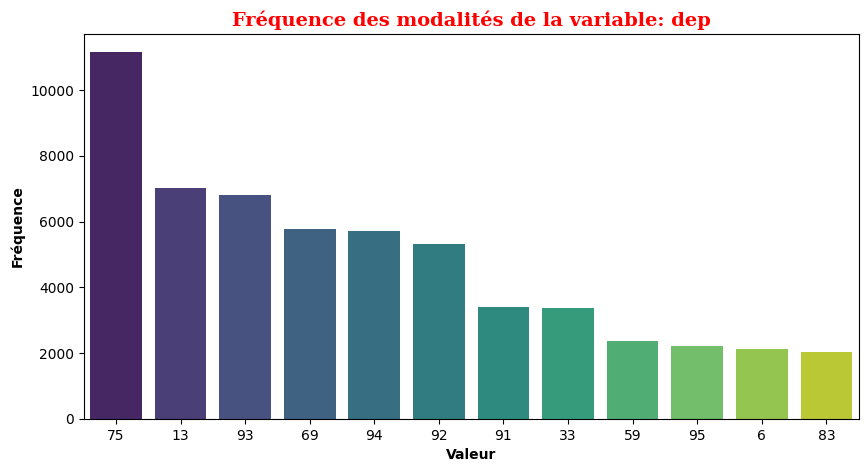

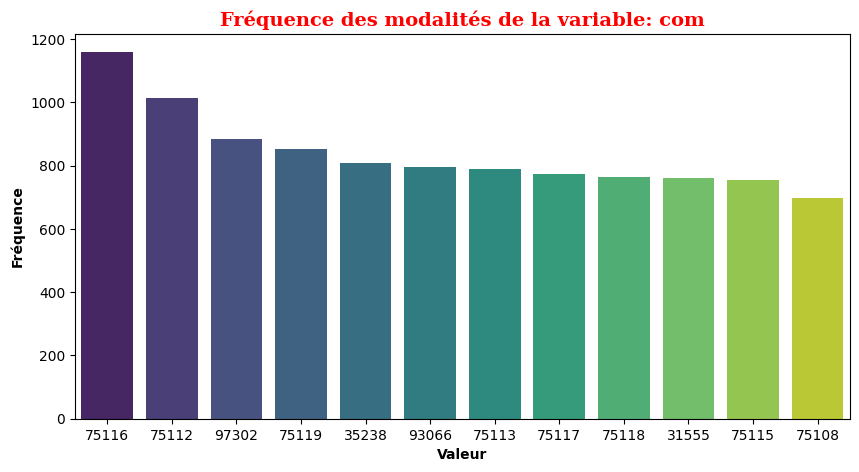

In [367]:
# Visualisation
for col in qualitative_vars:
    plt.rcParams.update({ "font.size" : 10})
    plt.figure(figsize=(10,5)) 
    sns.countplot(x = base_final[col], order = base_final[col].value_counts(ascending=False).head(12).index, data = base_final, palette="viridis")
    plt.title('Fréquence des modalités de la variable: ' + str(col), fontdict=font_title)
    plt.xlabel("Valeur", fontweight = "bold")
    plt.ylabel("Fréquence", fontweight = "bold")
    plt.show()
    print("\n")

**Interprétation du graphique:**

**Profil de l’usager :**

* catu : Les conducteurs de la modalité 1 sont très majoritaires, suivis des passagers  de la modalité 2 et des piétons avec la modalité 3.
* sexe : Les hommes sont plus présentes au volant contrairement aux femmes.
* trajet : Les accidents ont principalement lieu lors de trajets Promenade – loisirs (modalité 5), suivis de trajet Domicile – travail (modalité 1) puis Utilisation professionnelle et autres motifs (4 et 9).
* secu1 : La majorité portait leur équipement de sécurité comme la ceinture (modalité 1), suivi du port de casque ou Non déterminable (modalité 2 et 8). D’autres modalités indiquent des cas rares (non port, équipement inadapté...).

**Véhicule et conduite :**

* motor	: La majorité des véhicules sont de type hydocarbures (modalité 1) suivis des humains et et des voitures électriques (modalité 5 et 3).
* catv : La majorité des véhicules sont légers (modalité 7) suivie des véhicules utilitaires (modalités 10 et 33) avec ou sans remorque et tracteur routier qui dominent.
* manv : La majorité des manœuvres sont sans changement de direction (modalité 1), suivie des manœuvres qui sont dans le même sens, même file (modalité 2), changement direction gauche (modalité 15). Certaines modalités sont très rares.
* vitesse maximale (vma) : la majorité des accidents surviennent dans des zones urbaines.

**Localisation de l’accident :**

* catr (catégorie de route)	: Les accidents surviennent surtout sur des routes hors agglomération ou voie communales (modalité 4) et en route départementale (modalité 3).
* circ (régime de circulation) : La circulation à double sens sans séparation (modalité 2) domine suivie de la circulation à sens unique (modalité 1).
* surf (état de la chaussée) : Majoritairement sèche ou normale (modalité 1), suivie de mouillée (modalité 2).
* plan (profil de la route) : 	En grande majorité plat (modalité 1) suivie d' une courbe à gauche et une courbe à droite (2 et 3).
* situ (situation de l’accident) : 	Très souvent sur la chaussée (modalité 1).
* int (type d'intersection)	: La majeure partie des accidents se passe hors intersection, les autres se répartissent entre d'autres intersections ou carrefours divers.
* agg (localisation) : Majoritaire en agglomération (modalité 2) suivie hors agglomération (modalité 1).


**Conditions environnementales :**

* atm (conditions atmosphériques) : La majorité des conditions sont normales (modalité 1) dans les cas. Quelques cas de pluie légère (modalité 2), brouillard ou temps couvert (modalité 8) ou forte pluie et temps éblouissant  (3, 7).
* lum (luminosité) : La majorité des accidents se passe de jour (modalité 1), suivis de nuit avec éclairage public (modalité 5) ou nuit sans éclairage public (modalité 3).

**Nature et cause de l’accident :**

* col (type de collision) : Les accidents sont souvent deux véhicules – par le coté (modalité 3),  autre collision (modalité 6), ou Deux véhicules – par l’arrière (modalité 2).
* choc (point d'impact) : 	L'avant ou choc frontal (modalité 1) est le plus fréquent, suivi de l'avant gauche (modalité 3) et l'avant droit (modalité 2).
* senc (sens de circulation) : 	Principalement sens normal (modalité 1), quelques cas de contresens (modalité 2) ou inconnu ou absence de repère (modalité 3).

**Gravité et conséquences :**

* grav (gravité de blessure de l'usager) : La majorité des blessures sont de type Indemne (modalité 1), suivis des cas de blessés légers (modalité 4), suivis par les blessés hospitalisés(modalité 3) et enfin des cas plus graves(Tués, modalité 2).
* obsm (obstacle fixe heurté) : Les plus présentes sont les modalités 2 (les Arbres) et modalité 1 (Véhicule en stationnement). Certaines modalités sont très rares.
* place (place occupée dans le véhicule) : 	Majoritairement les conducteurs (avec la modalité 1), puis passagers (2, 10).

**Localisation géographique :**

* dep (département) : Nous avons presques toutes les départements avec les Top départements : 75 (Paris), 13 (Bouches-du-Rhône), 93, 69.
* com (code commune) : On constate une très grande cardinalité (>11 000 modalités).

**Données temporelles :**

* mois : Répartition quasi uniforme avec un léger pic en été (juin, juillet) et à l’automne (septembre-octobre).

## 6.2 Analyse bivariée

**Nous allons faire des visualisation mais aussi faire des tests pour voir les relations qui existe entres ces deux variables**

### 6.2.a) Variable quantitative

**Relation entre l'âge de l'usager et la vitesse maximale autorisée**

**Objectif de cette visualisation :**

* Montrer s’il existe une relation entre la vitesse maximale autorisée sur le lieu de l’accident et l’âge des personnes impliquées.

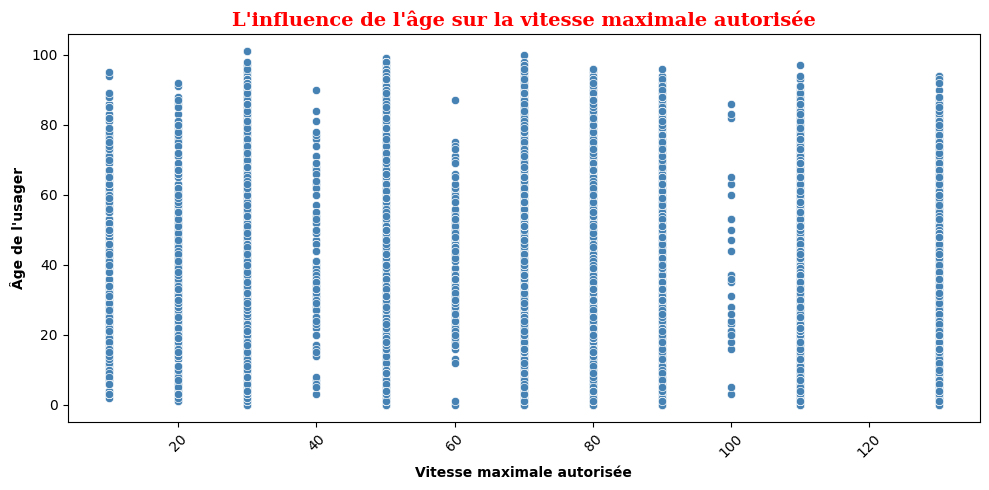

In [368]:
# visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10,5))
sns.scatterplot(x = base_final["vma"], y = base_final["age"], data = base_final, color='steelblue')
plt.title("L'influence de l'âge sur la vitesse maximale autorisée", fontdict=font_title)
plt.xlabel("Vitesse maximale autorisée", fontweight = "bold")
plt.ylabel("Âge de l'usager", fontweight = "bold")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Interprétation** : 

* On constate une répartition verticale étalée pour chaque niveau de vitesse, celà signifie que les accidents concernent des personnes de tous âges.

* Il n’y a pas de corrélation apparente entre l'âge et la vitesse autorisée.

    * Les très jeunes usagers semblent moins présents sur les axes à très haute vitesse (peut-être car ils conduisent moins sur autoroute).

    * Les personnes plus âgées sont présentes à tous niveaux de vitesse.

**Conclusion :**
Nous n'avons pas de corrélation nette entre l’âge des usagers et la vitesse maximale autorisée sur le lieu de l’accident.

**Relation entre la latitude et la longitude**

**Objectif de cette visualisation :**

* Visualiser la dispersion géographique des accidents sur le territoire français..

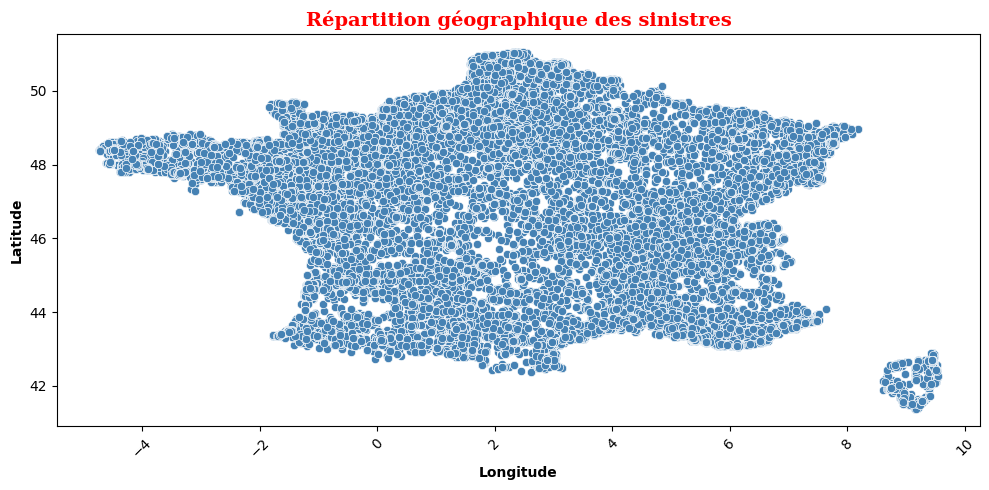

In [369]:
# visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10,5))
sns.scatterplot(x = base_final["long"], y = base_final["lat"], data = base_final, color='steelblue')
plt.title("Répartition géographique des sinistres", fontdict=font_title)
plt.xlabel("Longitude", fontweight = "bold")
plt.ylabel("Latitude", fontweight = "bold")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Interprétation** :  

* Les points (chaque point représente un sinistre) forment clairement une carte de la France, ce qui est bon signe.

* On observe :

    * Une forte concentration dans les zones urbanisées (Île-de-France, Rhône-Alpes, etc.).

    * Moins d'accidents dans les zones rurales ou peu peuplées.

    * La Corse apparaît également comme une zone distincte.

**Conclusion :**
Ce graphique permet d’identifier les zones à forte sinistralité, utiles pour cibler les politiques de prévention ou renforcer les contrôles..

### Analyse des données géographiques

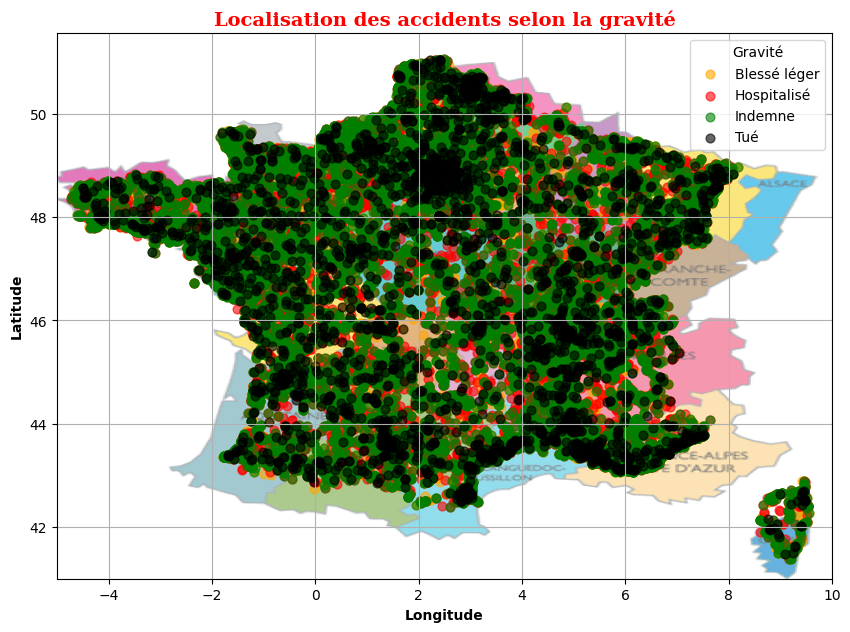

In [370]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Chargement de l'image (carte France)
carte_france = mpimg.imread("C:/Users/diarr/Downloads/Projet tutorés/carte-france-region.gif")

# Créer une colonne texte pour la gravité
base_final['grav_libelle'] = base_final['grav'].map({
    1: "Indemne",
    2: "Tué",
    3: "Hospitalisé",
    4: "Blessé léger"
})

# Définir des couleurs fixes par catégorie
couleurs = {
    "Indemne": "green",
    "Tué": "black",
    "Hospitalisé": "red",
    "Blessé léger": "orange"
}

# Créer le graphique
plt.figure(figsize=(10, 8))

# Afficher la carte en fond
plt.imshow(carte_france, extent=[-5, 10, 41, 51], alpha=0.6)

# Ajouter les points par gravité
for gravite, groupe in base_final.groupby('grav_libelle'):
    plt.scatter(groupe['long'], groupe['lat'],
                c=couleurs[gravite],
                label=gravite,
                alpha=0.6,
                s=40)

# Ajouts esthétiques
plt.xlabel("Longitude", fontweight="bold")
plt.ylabel("Latitude", fontweight="bold")
plt.title("Localisation des accidents selon la gravité", fontdict = font_title)
plt.legend(title="Gravité")
plt.grid(True)
plt.show()

**Interprétation :**

Ce graphique représente les accidents de la route géolocalisés sur le territoire français, en distinguant les niveaux de gravité par couleurs:

* Concentration d'accidents : On observe une forte densité d'accidents dans les zones fortement peuplées, notamment :

    * La région parisienne (Île-de-France)

    * Le sillon rhodanien (Lyon)

    * La région Provence-Alpes-Côte d’Azur

    * Le nord (Lille, Hauts-de-France)

* Accidents graves (noirs et rouges) :

    * Les accidents mortels et hospitalisés sont répartis sur tout le territoire, y compris en zones moins denses.

    * Ces accidents apparaissent légèrement plus dispersés que les blessés légers, suggérant une surreprésentation en zones rurales (moins d’accès aux secours, vitesses plus élevées).

* Accidents bénins (verts) :

    * Très nombreux, particulièrement concentrés dans les grandes métropoles.

    * Ce sont les plus fréquents et suivent la démographie urbaine.

* Zones rurales :

    * Moins d’accidents en volume, mais la proportion de gravité semble plus élevée (plus de rouge/noir par rapport au vert), ce qui appuie l'idée que la ruralité est un facteur de gravité accrue.

### 6.2.b) Variable qualitative

**Relation entre la gravité de blessure sur le genre de l'usager**

**Objectif**

* Analyser si la gravité des accidents varie selon le sexe des usagers impliqués..

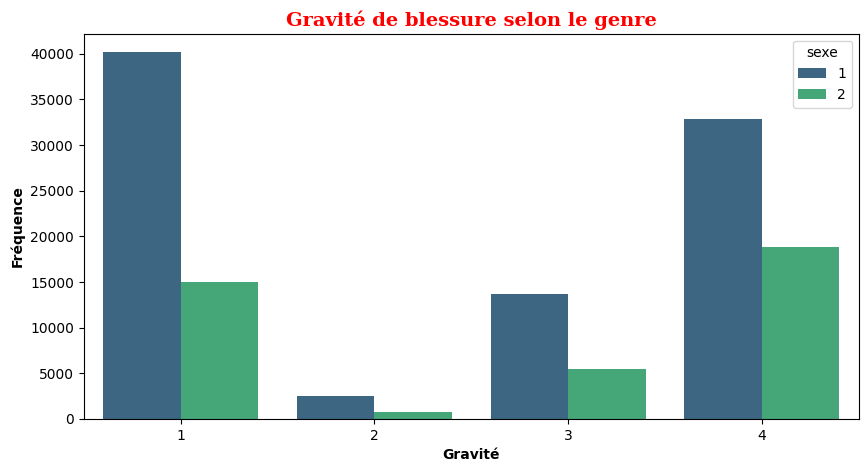

In [371]:
# Visualisation 
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.countplot(x ='grav', hue ='sexe', data = base_final, palette = "viridis")
plt.title("Gravité de blessure selon le genre", fontdict=font_title)
plt.xlabel("Gravité", fontweight = "bold")
plt.ylabel("Fréquence", fontweight = "bold")
plt.show()

**Interprétation**

* On observe plus d’accidents légers ou sans blessure (gravité faible) chez les deux sexes, surtout chez les hommes.

* Pour les accidents graves ou mortels, la proportion d’hommes est également plus élevée.

* Cela peut indiquer que les hommes sont plus impliqués dans des accidents graves, probablement lié à des comportements à risque plus fréquents.

**Relation entre la catégorie d'usager et la gravité de blessure**

**Objectif :**

* Identifier les catégories de véhicules les plus concernées par les accidents selon le niveau de gravité.

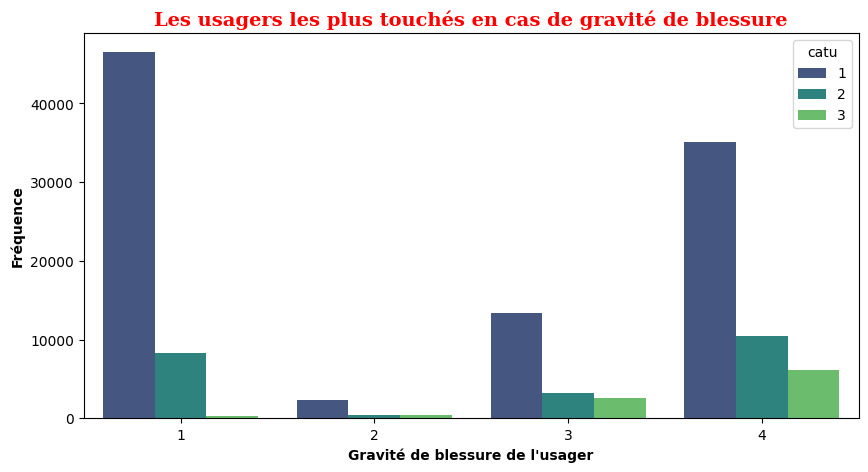

In [372]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.countplot(x ='grav', hue ='catu', data = base_final, palette = "viridis")
plt.title("Les usagers les plus touchés en cas de gravité de blessure", fontdict=font_title)
plt.xlabel("Gravité de blessure de l'usager", fontweight = "bold")
plt.ylabel("Fréquence", fontweight = "bold")
plt.show()

**Interprétation**

* Les usagers les plus touchés en cas d'accidents s'agit des conducteurs même que ça soient légers ou sans blessure (gravité faible) chez les deux sexes, surtout chez les hommes.

* Pour les accidents graves ou mortels, la proportion de passagers et piétons n'est pas aussi élevée.

* Cela peut indiquer que les conducteurs sont plus impliqués ou exposés dans des accidents graves.

**Relation entre les conditions atmosphériques et la gravité de blessure**

**Objectif :**

* Cela permet de compter le nombre d’accidents par type de condition météo et gravité (crosstab).

* Voir la répartition des gravités selon la météo (barplot).

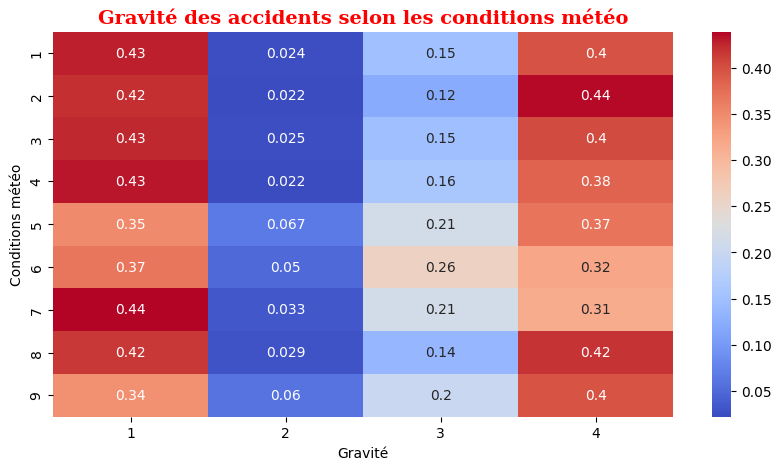

In [373]:
ct = pd.crosstab(base_final['atm'], base_final['grav'], normalize='index')

plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.heatmap(ct, annot=True, cmap='coolwarm')
plt.title("Gravité des accidents selon les conditions météo", fontdict=font_title)
plt.xlabel("Gravité")
plt.ylabel("Conditions météo")
plt.show()

In [374]:
# Gravité moyenne des accidents selon les conditions atmosphériques
df_atm_grav = base_final.groupby(["atm"])["grav"].mean().sort_values(ascending=False).reset_index()
df_atm_grav.head(5)

,atm,grav
0,9,3
1,5,3
2,2,3
3,8,3
4,6,3


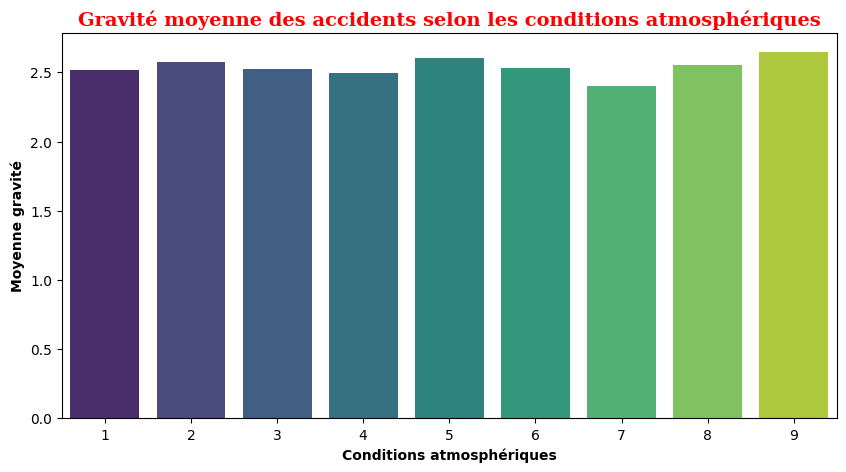

In [375]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.barplot(x = 'atm', y = 'grav', data = df_atm_grav, palette = "viridis")
plt.title("Gravité moyenne des accidents selon les conditions atmosphériques", fontdict=font_title)
plt.xlabel("Conditions atmosphériques", fontweight = "bold")
plt.ylabel("Moyenne gravité", fontweight = "bold")
plt.show()

**Interprétation**

* Par beau temps, le nombre d’accidents est élevé (logique car trafic plus important).

* En conditions difficiles (pluie, brouillard…), bien que le nombre d’accidents soit moindre, on peut observer une proportion plus élevée d’accidents graves.

* Cela aide à quantifier l’impact de la météo sur la sévérité des accidents.

**Répartition des gravités pour chaque condition atmosphérique**

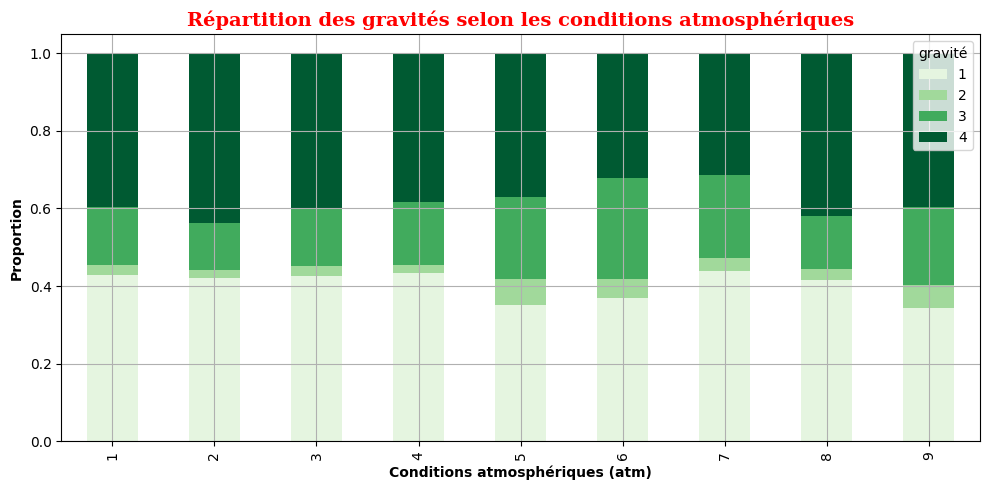

In [376]:
colors = ['#e5f5e0', '#a1d99b', '#41ab5d', '#005a32']
base_final.groupby('atm')['grav'].value_counts(normalize=True).unstack().plot(kind='bar', figsize = (10, 5), color = colors, stacked=True)

plt.title("Répartition des gravités selon les conditions atmosphériques", fontdict=font_title)
plt.ylabel("Proportion", fontweight = "bold")
plt.xlabel("Conditions atmosphériques (atm)", fontweight = "bold")
plt.legend(title="gravité")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* Ce graphique en barres empilées normalisées montre la distribution des niveaux de gravité (1 à 4) en proportion pour chaque modalité de atm.

* Quelle que soit la condition météo, les accidents non graves (gravité 1: **indemnes** et gravité 4: **blessés légers**) sont très majoritaires.

* Toutefois, certaines conditions comme le brouillard (5) ou la neige (4) semblent légèrement associées à une proportion plus élevée d'accidents graves (gravité 2 et 3).

**Conclusion:**

En conditions normales (1), la gravité semble légèrement moins élevée en proportion que sous des conditions dégradées.

**Nombre absolu de cas par gravité et atm**

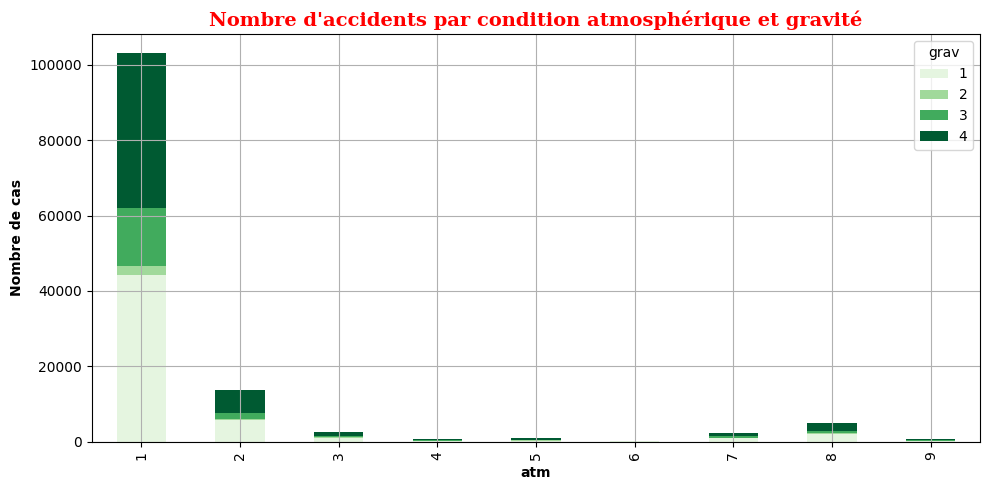

In [377]:
colors = ['#e5f5e0', '#a1d99b', '#41ab5d', '#005a32']
base_final.groupby(['atm', 'grav']).size().unstack().plot(kind='bar', figsize = (10, 5), color = colors, stacked=True)

plt.title("Nombre d'accidents par condition atmosphérique et gravité", fontdict=font_title)
plt.ylabel("Nombre de cas", fontweight = "bold")
plt.xlabel("atm", fontweight = "bold")
plt.legend(title="grav")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation:**

* Ce graphique montre le nombre total d’accidents selon la condition météo par niveau de gravité.

* La majorité des accidents surviennent sous des conditions atmosphériques normales (atm = 1).

* Les autres conditions sont nettement moins fréquentes (pluie légère, forte pluie, neige, brouillard…).

**Conclusion :**

On peut dire que ce graphique reflète plus la fréquence des conditions météo que leur dangerosité intrinsèque.

**Taux d’accidents graves (tué + blessé hospitalisé) par météo**

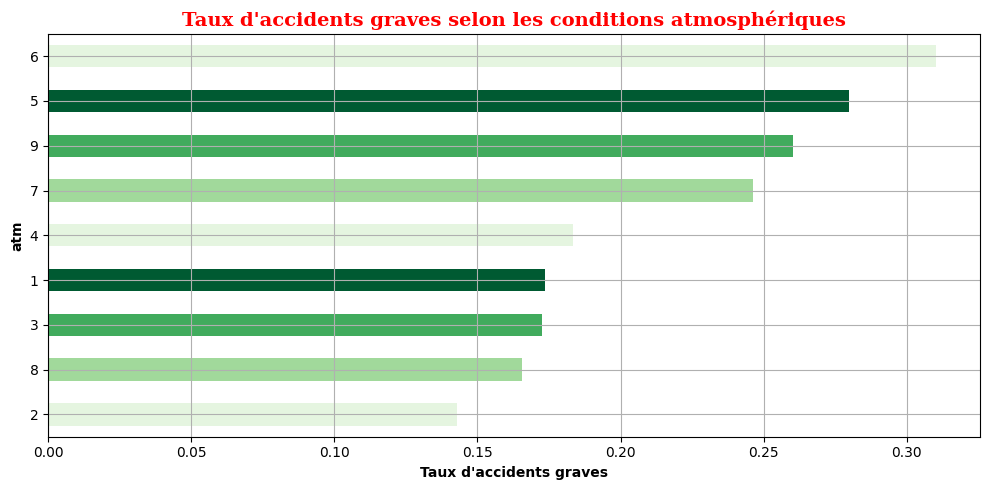

In [378]:
base_final['grave_binaire'] = base_final['grav'].isin([2, 3]).astype(int)
base_final.groupby('atm')['grave_binaire'].mean().sort_values().plot(kind='barh', figsize = (10, 5), color = colors)


#plt.figure(figsize = (10, 5))
plt.title("Taux d'accidents graves selon les conditions atmosphériques", fontdict=font_title)
plt.xlabel("Taux d'accidents graves", fontweight = "bold")
plt.ylabel("atm", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* On voit ici la proportion d’accidents graves (tués ou blessés hospitalisés) parmi tous les accidents, par condition météo.

* Les conditions les plus associées à une gravité élevée sont :

    * Brouillard ou fumée (atm = 5) : 8.5 % d’accidents graves

    * Neige ou grêle (atm = 4) : 7.5 %

    * Pluie forte (atm = 3) : 7 %

    * À l’inverse, en conditions normales (atm = 1), le taux d’accidents graves est le plus faible (5.5 %).

**Conclusion :**

Ce graphique met donc en lumière l'importance d’analyser les risques relatifs et non uniquement les volumes absolus.

**Relation entre la catégorie de route et la gravité de blessure**

**Objectif des graphiques:**

* analyser la relation entre la catégorie de route (catr) et la gravité des accidents (grav).
* Ils permettent d’identifier quelles catégories de routes sont associées à des accidents plus graves, et ainsi orienter les actions de prévention ou les décisions d’infrastructure.

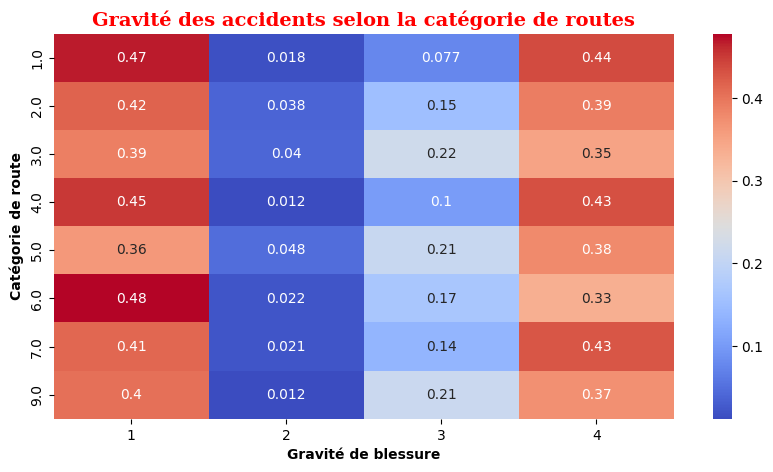

In [379]:
# crosstab
ct = pd.crosstab(base_final['catr'], base_final['grav'], normalize='index')

# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.heatmap(ct, annot=True, cmap='coolwarm')
plt.title("Gravité des accidents selon la catégorie de routes", fontdict=font_title)
plt.xlabel("Gravité de blessure", fontweight = "bold")
plt.ylabel("Catégorie de route", fontweight = "bold")
plt.show()

In [380]:
# Gravité moyenne des accidents selon la catégories de routes
df_rout_grav = base_final.groupby(["catr"])["grav"].mean().sort_values(ascending=False).reset_index()
df_rout_grav

,catr,grav
0,5,3
1,7,3
2,9,3
3,3,3
4,2,3
5,4,3
6,1,2
7,6,2


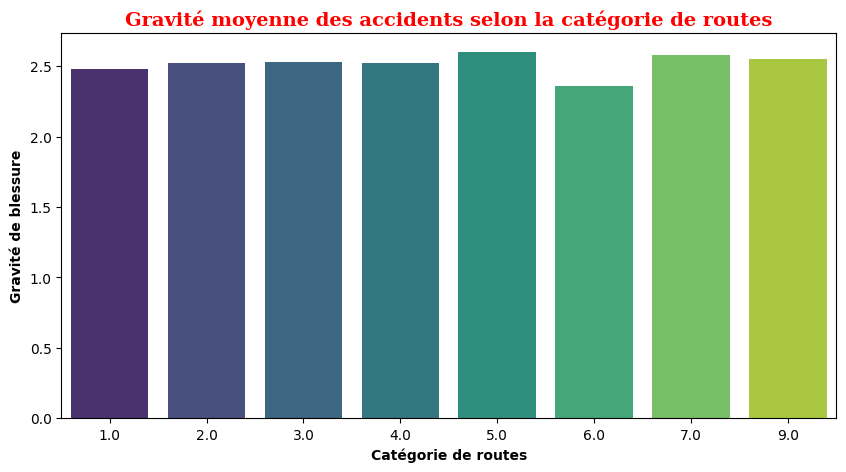

In [381]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.barplot(x = 'catr', y = 'grav', data = df_rout_grav, palette = "viridis")
plt.title("Gravité moyenne des accidents selon la catégorie de routes", fontdict=font_title)
plt.xlabel("Catégorie de routes", fontweight = "bold")
plt.ylabel("Gravité de blessure", fontweight = "bold")
plt.show()

**Interprétation :**

* Sur les routes de catégorie 1 (autoroutes), la majorité des accidents sont légers (grav = 4), mais on note aussi une proportion non négligeable de gravité 1 (indemnes) et 2 (tués).

* Les routes 4, 5, 6, 7, 9 semblent avoir une proportion plus élevée de blessures légères (4), ce qui peut refléter leur usage plus urbain ou à vitesse réduite.

**Vitesse moyenne selon la catégorie de route**

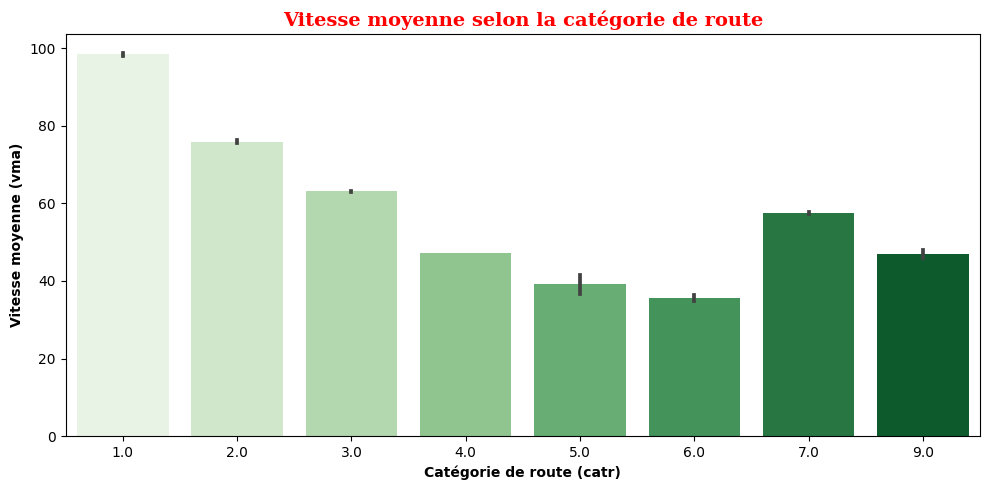

In [382]:
plt.figure(figsize=(10, 5))
sns.barplot(data=base_final, x='catr', y='vma', estimator='mean', palette='Greens')
plt.title("Vitesse moyenne selon la catégorie de route", fontdict=font_title)
plt.xlabel("Catégorie de route (catr)", fontweight = "bold")
plt.ylabel("Vitesse moyenne (vma)", fontweight = "bold")
plt.tight_layout()
plt.show()

**Interprétation :**

Ce graphique montre que la vitesse moyenne des véhicules varie fortement en fonction de la catégorie de route, ce qui est cohérent avec les limitations réglementaires et l’usage de chaque type d’infrastructure.

* Autoroutes (catr = 1) présentent la vitesse moyenne la plus élevée, proche de 100 km/h, ce qui reflète bien leur usage rapide et fluide.

* Routes nationales (catr = 2) et départementales (catr = 3) suivent logiquement avec des vitesses moyennes respectives autour de 75 km/h et 63 km/h.

* Les voies communales (catr = 4) et les routes hors réseau public (catr = 5) enregistrent des vitesses nettement plus faibles (≈ 47 km/h et 39 km/h).

* Les parcs de stationnement (catr = 6) sont naturellement les plus lents (≈ 35 km/h), car ils impliquent des manœuvres et un environnement fermé.

* les routes de métropole urbaine (catr = 7) montrent une vitesse moyenne supérieure à celle des voies communales, ce qui peut s’expliquer par des axes de transit rapide dans les grandes agglomérations.

* Les routes "autres" (catr = 9) présentent des vitesses intermédiaires (≈ 47 km/h), mais leur hétérogénéité justifie une certaine prudence d’interprétation.

**Relation entre le trajet et la gravité de blessure**

**Objectif des graphiques:**

* analyser la relation entre le motif du déplacement au moment de l’accident (trajet) et la gravité des blessures (grav).

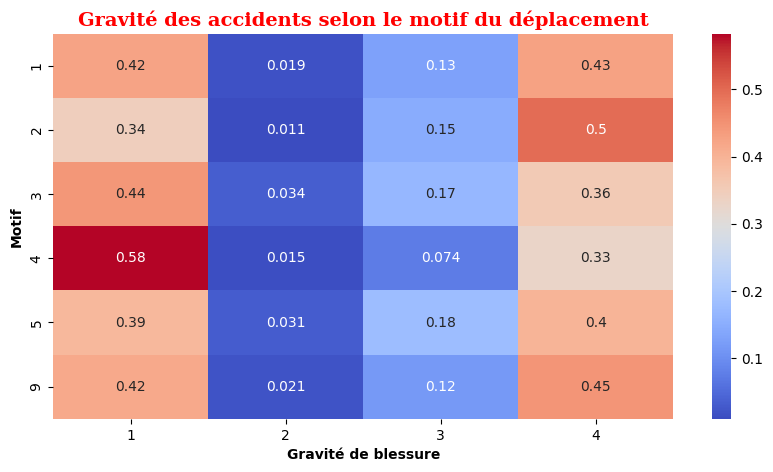

In [383]:
# crosstab
ct = pd.crosstab(base_final['trajet'], base_final['grav'], normalize='index')

# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.heatmap(ct, annot=True, cmap='coolwarm')
plt.title("Gravité des accidents selon le motif du déplacement", fontdict=font_title)
plt.xlabel("Gravité de blessure", fontweight = "bold")
plt.ylabel("Motif", fontweight = "bold")
plt.show()

In [384]:
# Gravité moyenne des accidents selon le motif du déplacement
df_traj_grav = base_final.groupby(["trajet"])["grav"].mean().sort_values(ascending=False).reset_index()
df_traj_grav

,trajet,grav
0,2,3
1,9,3
2,5,3
3,1,3
4,3,2
5,4,2


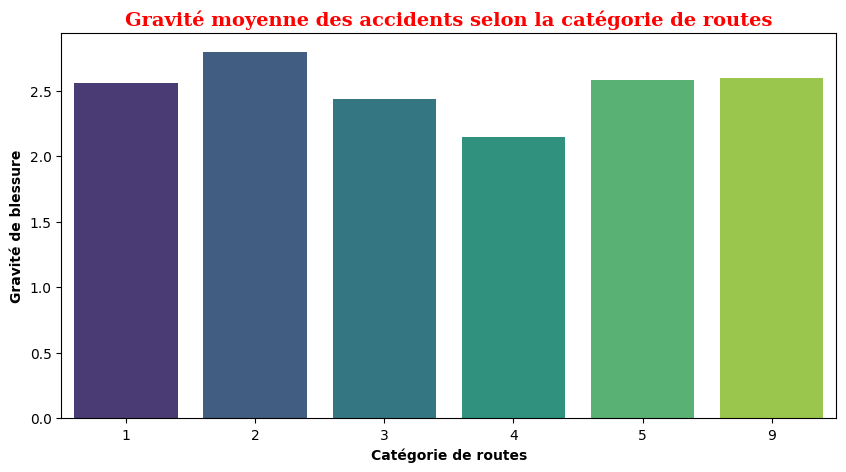

In [385]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.barplot(x = 'trajet', y = 'grav', data = df_traj_grav, palette = "viridis")
plt.title("Gravité moyenne des accidents selon la catégorie de routes", fontdict=font_title)
plt.xlabel("Catégorie de routes", fontweight = "bold")
plt.ylabel("Gravité de blessure", fontweight = "bold")
plt.show()

**Interprétation :**

* Les routes nationales (catr = 2) sont particulièrement à risque, avec une gravité moyenne plus forte que les autoroutes. Cela peut s’expliquer par :

    * des vélocités élevées sans séparation centrale, un trafic mixte (voitures + poids lourds), des infrastructures plus anciennes ou moins sécurisées.

* Les voies communales (catr = 4) présentent la gravité la plus faible, ce qui est attendu du fait de vitesses plus réduites, de la présence d’usagers vulnérables (piétons, cyclistes), et d’un trafic urbain.

**Relation entre le type de motorisation du véhicule et la gravité de blessure**

**Objectif :**

* Étudier la relation entre le type de motorisation des véhicules et la gravité moyenne des accidents.

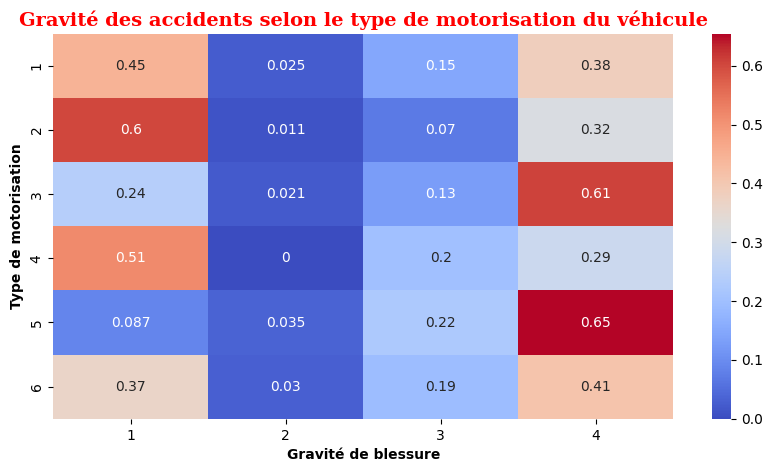

In [386]:
# crosstab
ct = pd.crosstab(base_final['motor'], base_final['grav'], normalize='index')

# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.heatmap(ct, annot=True, cmap='coolwarm')
plt.title("Gravité des accidents selon le type de motorisation du véhicule", fontdict=font_title)
plt.xlabel("Gravité de blessure", fontweight = "bold")
plt.ylabel("Type de motorisation", fontweight = "bold")
plt.show()

In [387]:
# Gravité moyenne des accidents selon le type de motorisation
df_motor_grav = base_final.groupby(["motor"])["grav"].mean().sort_values(ascending=False).reset_index()
df_motor_grav

,motor,grav
0,5,3
1,3,3
2,6,3
3,1,2
4,4,2
5,2,2


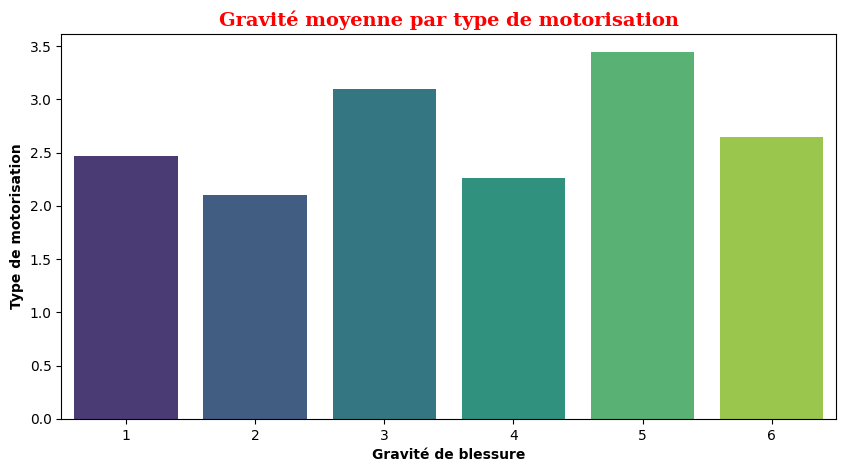

In [388]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize = (10, 5))
sns.barplot(x ='motor', y = 'grav', data = df_motor_grav, palette = "viridis")
plt.title("Gravité moyenne par type de motorisation", fontdict=font_title)
plt.xlabel("Gravité de blessure", fontweight = "bold")
plt.ylabel("Type de motorisation", fontweight = "bold")
plt.show()

**Interprétation :**

* La heatmap met en évidence la distribution des accidents selon les niveaux de gravité pour chaque type de motorisation. On observe que les véhicules à motorisation électrique (3) et hybride électrique (2) sont associés à une proportion relativement élevée d’accidents graves, notamment en termes d’hospitalisations et de décès.

* Le barplot présente la gravité moyenne pour chaque type de motorisation. Plus la moyenne est faible, plus les accidents sont graves. Ainsi, les véhicules hybrides électriques (2) et électriques (3) affichent des gravités moyennes plus faibles, ce qui suggère une implication plus fréquente dans des accidents graves. À l’inverse, les véhicules à motorisation humaine (5) comme les vélos, trotinettes présentent une gravité moyenne plus élevée, traduisant des accidents généralement moins graves, bien que cela puisse aussi refléter des biais de signalement ou d’exposition.

**Relation entre les départements et la gravité de blessure**

**Objectif :**
* Identifier les départements où la gravité des accidents est plus élevée.

In [389]:
# gravité moyenne par département
df_dep_grav = base_final.groupby("dep")["grav"].mean().sort_values(ascending=False).reset_index()
df_dep_grav

,dep,grav
0,95,3
1,60,3
2,4,3
3,12,3
4,79,3
...,...,...
102,53,2
103,90,2
104,23,2
105,987,2


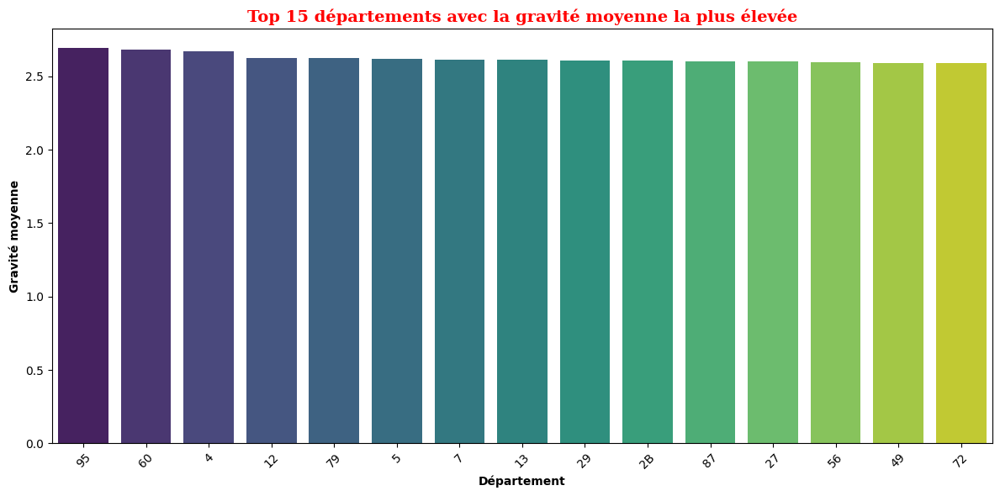

In [390]:
# Visualisation
plt.figure(figsize=(12, 6))
sns.barplot(data = df_dep_grav.head(15), x = "dep", y = "grav", palette = "viridis")
plt.title("Top 15 départements avec la gravité moyenne la plus élevée", fontdict=font_title)
plt.xlabel("Département", fontweight="bold")
plt.ylabel("Gravité moyenne", fontweight="bold")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Interprétation :**

* Ce barplot présente les 15 départements ayant une gravité moyenne d'accident la plus élevée (gravité sur l’échelle 1 à 4).

* Certains départements comme le 08 (Ardennes), 55 (Meuse), 2A (Corse-du-Sud) ressortent avec une gravité moyenne proche de 2.5 à 2.8, ce qui signifie que les accidents y sont plus souvent graves ou hospitalisés.

* Ces zones sont souvent rurales, montagneuses ou peu desservies, ce qui peut expliquer une prise en charge plus lente ou une plus grande violence des accidents (vitesse plus élevée).

**Relation entre les communes et la gravité de blessure**

**Objectif :**

* Identifier les communes avec la plus forte gravité d’accidents.

In [391]:
# gravité moyenne par commune
df_com_grav = base_final.groupby("com")["grav"].mean().sort_values(ascending=False).reset_index()
df_com_grav

,com,grav
0,54217,4
1,52332,4
2,53030,4
3,14162,4
4,24004,4
...,...,...
11145,11188,1
11146,46021,1
11147,15207,1
11148,3097,1


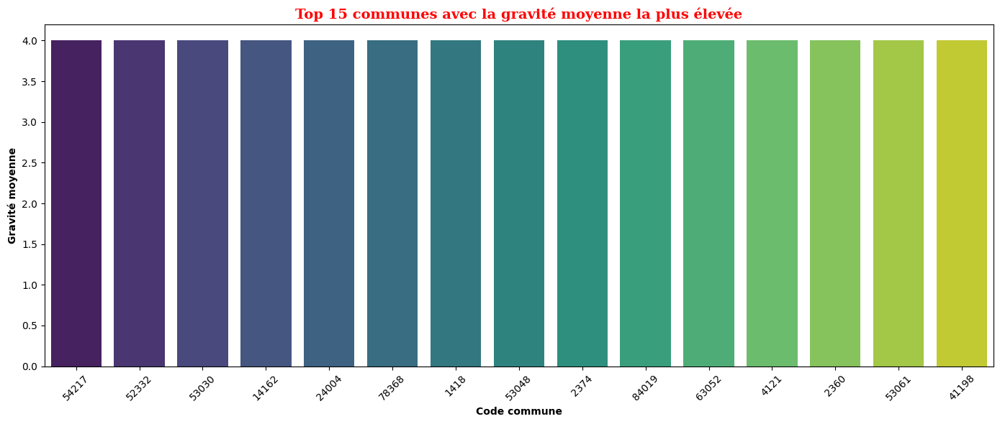

In [392]:
# Visualisation
plt.figure(figsize=(14, 6))
sns.barplot(data = df_com_grav.head(15), x = "com", y = "grav", palette = "viridis")
plt.title("Top 15 communes avec la gravité moyenne la plus élevée", fontdict=font_title)
plt.xlabel("Code commune", fontweight ="bold")
plt.ylabel("Gravité moyenne", fontweight ="bold")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

**Interprétation :**

* Ce graphique montre les 15 communes ayant la gravité moyenne d’accidents la plus forte.

* Certaines communes comme 26310, 89460, 53000 dépassent une gravité moyenne de 3, ce qui est extrêmement élevé.

* Cela peut être dû à :

    * un très faible nombre d’accidents (moyenne biaisée),

    * ou à des zones rurales/isolées où les accidents sont plus graves.

**Gravité des accidents par position géographique**

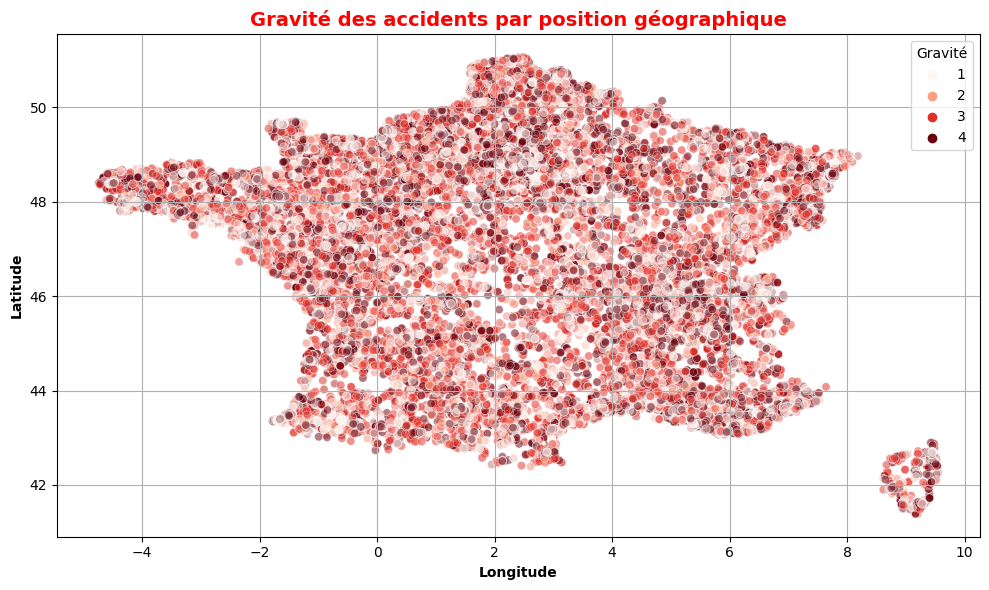

In [393]:
# Visualisation
plt.figure(figsize=(10, 6))
sns.scatterplot(data = base_final, x = "long", y = "lat", hue = "grav", palette = "Reds", alpha=0.5)
plt.title("Gravité des accidents par position géographique", fontsize=14, fontweight="bold", color="red")
plt.xlabel("Longitude", fontweight = "bold")
plt.ylabel("Latitude", fontweight = "bold")
plt.legend(title="Gravité")
plt.tight_layout()
plt.grid(True)
plt.show()

**Interprétation :**

* Cette carte de la France affiche chaque accident selon ses coordonnées géographiques, avec une couleur par niveau de gravité.

* Il y a une forte concentration d’accidents dans les zones urbaines (Paris, Lyon, Marseille…).

* Les accidents graves (gravité 2 ou 3) semblent plus répartis dans les zones périphériques ou rurales.

* L’outre-mer est également représenté (coin en bas à droite), ce qui est un bon point de complétude.

### 6.2.b) Variable quantitative - variable qualitative

**Objectif** :

* Étudier les relations entre les variables qualitatives ou quantitatives avec la variable cible (gravité de blessure de l'usager) ou autres variables.

**Relation entre l'âge et la gravité de blessure de l'usager**

In [394]:
# Moyenne de la gravité de blessure selon
df_age_grav = base_final.groupby(["age"])["grav"].mean().sort_values(ascending=False).reset_index()
df_age_grav.head(5)

,age,grav
0,100,4
1,12,3
2,14,3
3,15,3
4,16,3


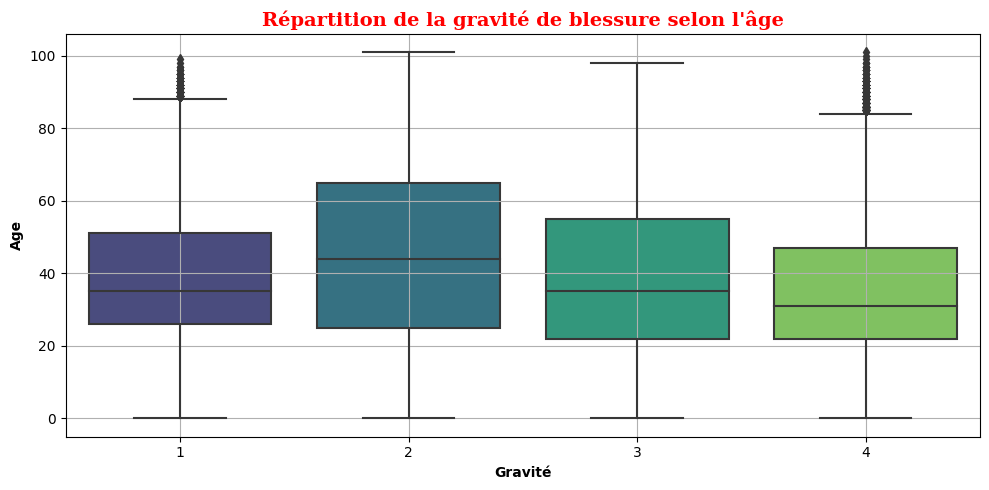

In [395]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 5))
sns.boxplot(data = base_final, x = 'grav', y ='age', palette = "viridis")
plt.title("Répartition de la gravité de blessure selon l'âge", fontdict=font_title)
plt.xlabel("Gravité", fontweight = "bold")
plt.ylabel("Age", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* Les personnes tuées (modalité 2) ont une médiane d’âge plus élevée que dans les autres catégories.

* Les blessés légers (4) et les indemnes (1) sont globalement plus jeunes.

* On observe quelques valeurs extrêmes (âges très élevés) dans tous les groupes, mais plus marqués pour les tués.

**Conclusion :**

Les accidents les plus graves (décès) touchent proportionnellement des personnes plus âgées, ce qui peut s’expliquer par une plus grande vulnérabilité physique. À l'inverse, les blessés légers sont en moyenne plus jeunes.

**Relation entre l'année de naissance selon la catégorie d'usager**

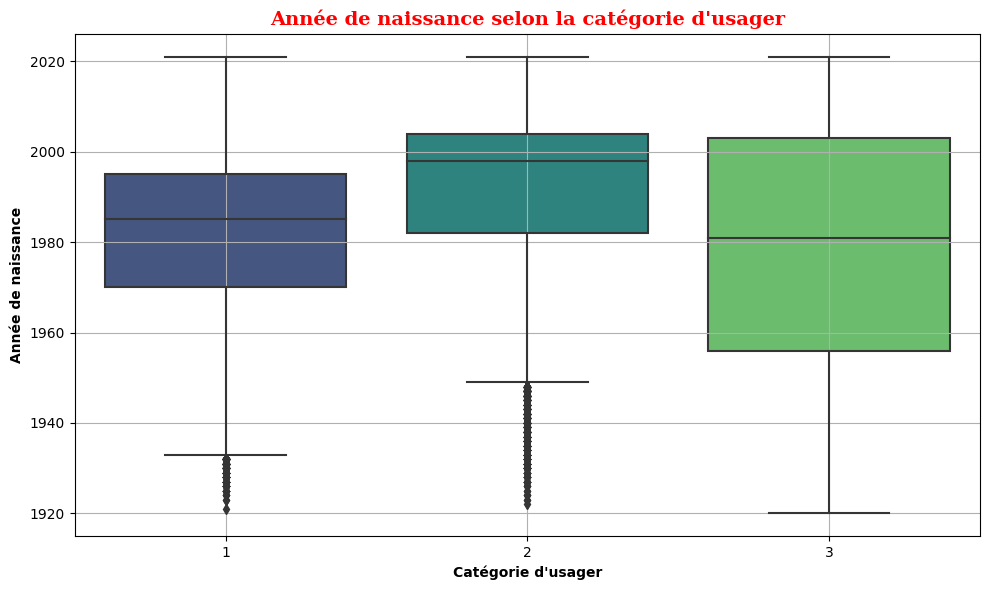

In [396]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 6))
sns.boxplot(x = "catu", y = "an_nais", data = base_final, palette = "viridis")
plt.title("Année de naissance selon la catégorie d'usager", fontdict = font_title)
plt.xlabel("Catégorie d'usager", fontweight = "bold")
plt.ylabel("Année de naissance", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* Les piétons (modalité 3) semblent en moyenne plus âgés que les autres usagers.

* Les conducteurs (modalité 1) et passagers (2) sont légèrement plus jeunes, avec une médiane autour de 1990-1995.

**Conclusion :**

Les piétons impliqués dans les accidents sont souvent des personnes plus âgées, ce qui peut les exposer à un risque accru (mobilité réduite, réflexes plus lents). Les conducteurs/passagers sont globalement plus jeunes.

**Relation entre l'âge des usagers selon leur rôle (Conducteur, Passager, Piéton)**

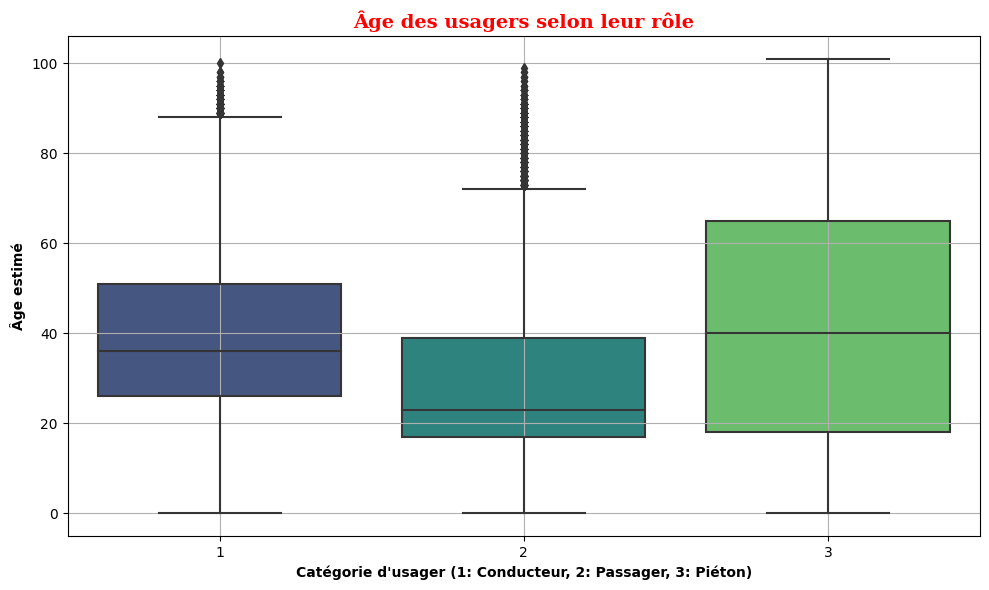

In [397]:
# Visualisation
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'catu', y = "age", data=base_final, palette = "viridis")
plt.title("Âge des usagers selon leur rôle", fontdict=font_title)
plt.xlabel("Catégorie d'usager (1: Conducteur, 2: Passager, 3: Piéton)", fontweight = 'bold')
plt.ylabel("Âge estimé", fontweight = 'bold')
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

Les piétons (modalité 3) semblent en moyenne plus âgés que les autres usagers.

Les conducteurs (modalité 1) et passagers (2) sont légèrement plus jeunes, avec une médiane autour de 23 à 38.

**Conclusion :**

Les piétons impliqués dans les accidents sont souvent des personnes plus âgées, ce qui peut les exposer à un risque accru (mobilité réduite, réflexes plus lents). Les conducteurs/passagers sont globalement plus jeunes.

**Relation entre l'année de naissance selon le sexe**

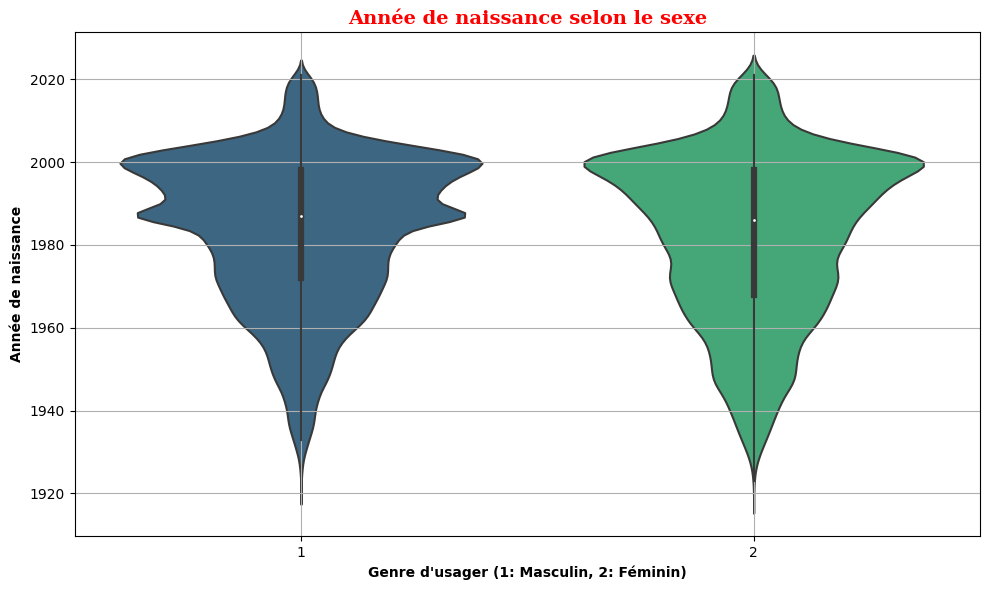

In [398]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 6))
sns.violinplot(x = "sexe", y = "an_nais", data = base_final, palette = "viridis")
plt.title("Année de naissance selon le sexe", fontdict=font_title)
plt.xlabel("Genre d'usager (1: Masculin, 2: Féminin)", fontweight = "bold")
plt.ylabel("Année de naissance", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation**

* La forme des distributions est globalement similaire pour les hommes (1) et les femmes (2), bien que celle des femmes soit légèrement plus concentrée autour des années 1980-2000.

* Il y a une majorité d'usagers impliqués nés entre 1960 et 2000.

* Les usagers masculins semblent légèrement plus nombreux dans les tranches plus âgées (nés avant 1960), tandis que les usagers féminins sont davantage concentrées entre 1980 et 2000.

**Conclusion**

Ceci pourrait refléter des comportements différenciés selon l’âge et le sexe (ex. : types de trajets, exposition au risque).

**Relation entre l'âge des usagers selon le sexe**

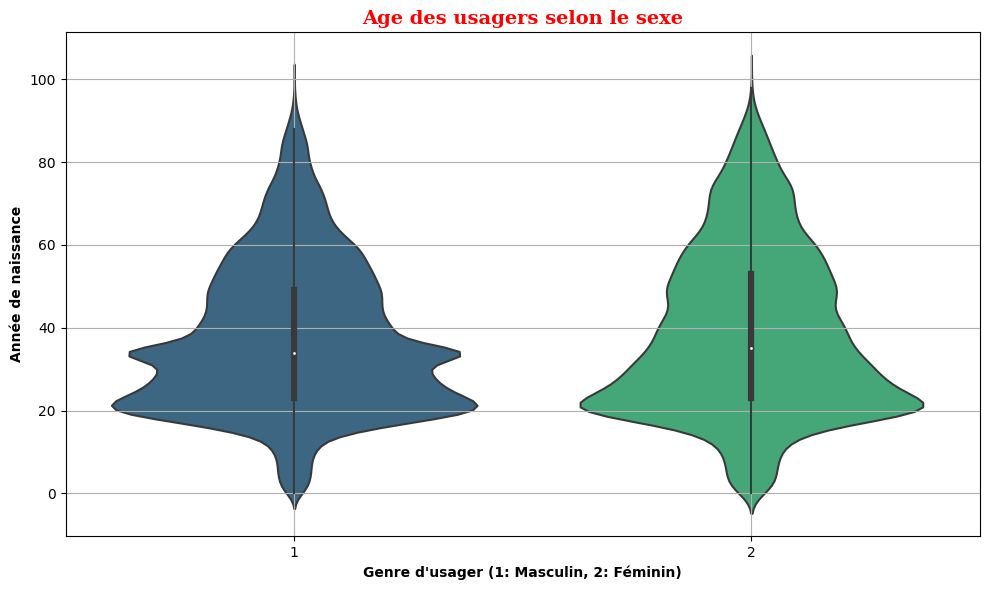

In [399]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 6))
sns.violinplot(x = "sexe", y = "age", data = base_final, palette = "viridis")
plt.title("Age des usagers selon le sexe", fontdict=font_title)
plt.xlabel("Genre d'usager (1: Masculin, 2: Féminin)", fontweight = "bold")
plt.ylabel("Année de naissance", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* On retrouve ici la même information, mais sous forme d'âge plutôt qu'année de naissance.

* Distribution relativement symétrique entre les sexes.

* La plupart des usagers ont entre 20 et 60 ans, avec un pic autour de 35-40 ans.

* On note aussi une queue de distribution allant jusqu’à 100 ans, mais ces cas restent rares.

**Conclusion**

Cela confirme que les actifs sont les plus concernés par les accidents corporels.

**Latitude des accidents selon le type de zone (urbaine/rurale)**

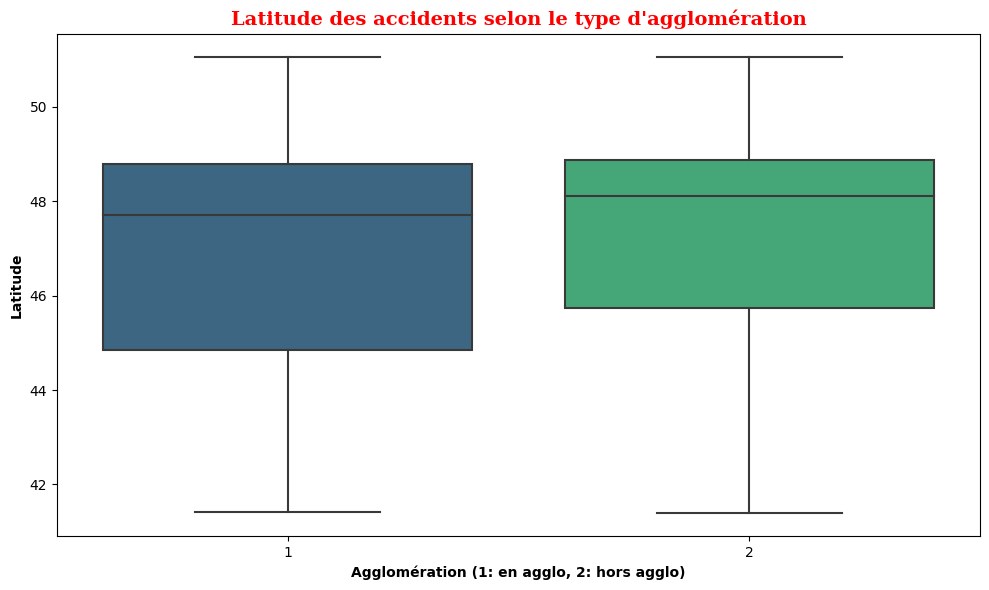

In [400]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 6))
sns.boxplot(x = 'agg', y = 'lat', data = base_final, palette = "viridis")
plt.title("Latitude des accidents selon le type d'agglomération", fontdict=font_title)
plt.xlabel("Agglomération (1: en agglo, 2: hors agglo)", fontweight = "bold")
plt.ylabel("Latitude", fontweight = "bold")
plt.tight_layout()
plt.show()

**Interprétation :**

* La latitude des accidents est légèrement plus basse en agglomération (1) que hors agglomération (2).

* Les médianes sont proches, mais les extrêmes montrent que les accidents hors agglomération couvrent une zone géographique un peu plus large.

**Conclusion**

Cela indique peut-être que les zones rurales, qui sont souvent plus dispersées géographiquement, ont des lieux d'accidents plus variés.

La localisation (via latitude/longitude) pourra être utile en analyse spatiale ou pour cartographier les zones à risque.

**Répartition du nombre de voies (nbv) selon les types de routes (catr)**

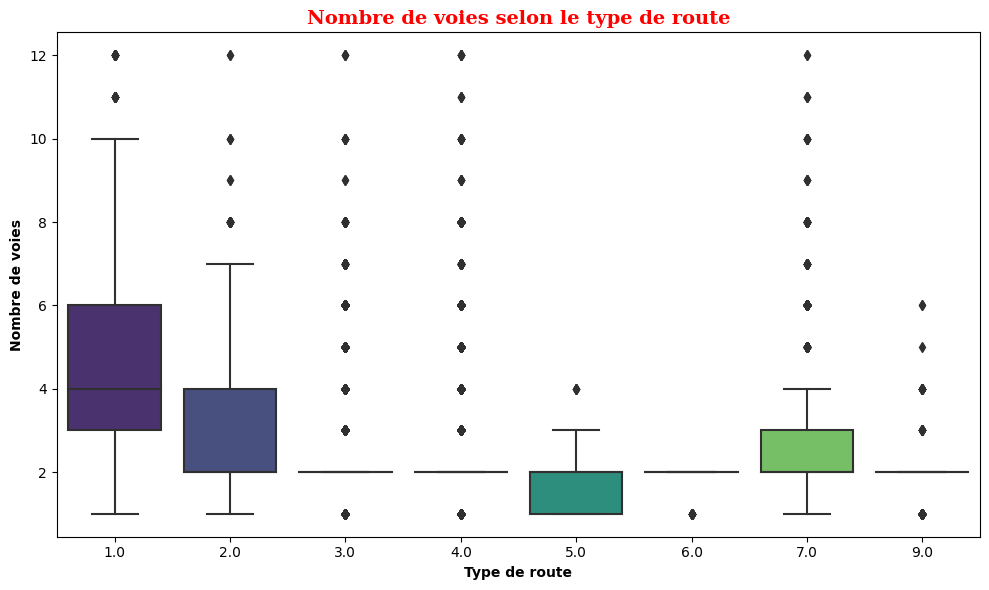

In [401]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 6))
sns.boxplot(x='catr', y ='nbv', data = base_final, palette = "viridis")
plt.title("Nombre de voies selon le type de route", fontdict=font_title)
plt.xlabel("Type de route", fontweight = "bold")
plt.ylabel("Nombre de voies", fontweight = "bold")
plt.tight_layout()
plt.show()

**Interprétation :**

* Type 1 (Autoroute) : large variation du nombre de voies, médiane autour de 4, avec des extrêmes atteignant jusqu'à 10-12 voies ce qui est cohérent avec des grands axes ou autoroutes.

* Type 2 (route nationale): distribution resserrée, médiane plus basse (2-3 voies), mais présence de routes avec davantage de voies. ce qui correspond à des routes nationales ou grandes départementales.

* Types 3 à 9 : nombre de voies très faible (souvent ≤ 2), peu de variation. Ces types semblent désigner des routes secondaires, locales, chemins ruraux, etc...

**Conclusion :**

Ce graphe montre bien que le type de route est un bon indicateur du nombre de voies disponibles, ce qui peut être croisé plus tard avec la gravité ou la fréquence des accidents.

**Heure des accidents (hrmn) selon la luminosité (lum)**

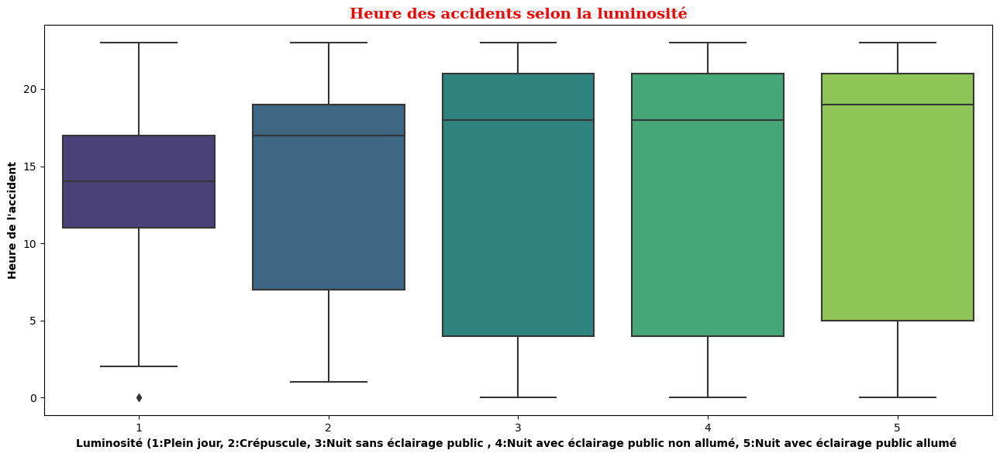

In [402]:
# extraire l'heure
base_final['heure'] = pd.to_datetime(base_final['hrmn'], format='%H:%M:%S').dt.hour
base_final = base_final.drop(columns = ['hrmn'], axis = 1)

# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(13, 6))
sns.boxplot(x = 'lum', y = 'heure', data = base_final, palette = "viridis")
plt.title("Heure des accidents selon la luminosité", fontdict=font_title)
plt.xlabel("Luminosité (1:Plein jour, 2:Crépuscule, 3:Nuit sans éclairage public , 4:Nuit avec éclairage public non allumé, 5:Nuit avec éclairage public allumé ", fontweight = "bold")
plt.ylabel("Heure de l'accident", fontweight = "bold")
plt.tight_layout()
plt.show()

**Interprétation :**

* En plein jour (1) : accidents répartis en majorité entre 8h et 18h, avec une médiane autour de midi (accidents typiques d’activité humaine comme les trajets domicile, travail, école, etc...).

* Crépuscule (2) : distribution centrée en soirée (18h–21h), comme attendu.

* Nuit (3, 4, 5) :

    * Les accidents sans éclairage public (3) et avec éclairage non allumé (4) ont une médiane en soirée (20h–22h), mais une dispersion plus large, parfois jusqu’à l’aube.

    * Avec éclairage allumé (5) : médiane plus tardive (22h), moins d’outliers matinaux  (probablement des zones urbaines mieux équipées).

**Conclusion :**

Ce graphe montre que l'éclairage influe sur l'heure des accidents nocturnes, avec une concentration plus nette le soir quand il y a de la lumière, et une dispersion plus large quand il fait nuit noire.

**Relation entre le mois et le nombre d'accident**

In [403]:
# le nombre d'accident mensuelle
df_mois_acc = base_final.groupby(["mois"])["Num_Acc"].count().sort_values(ascending=False).reset_index()
df_mois_acc.head(5)

,mois,Num_Acc
0,6,13350
1,10,13282
2,9,12836
3,7,12633
4,5,11097


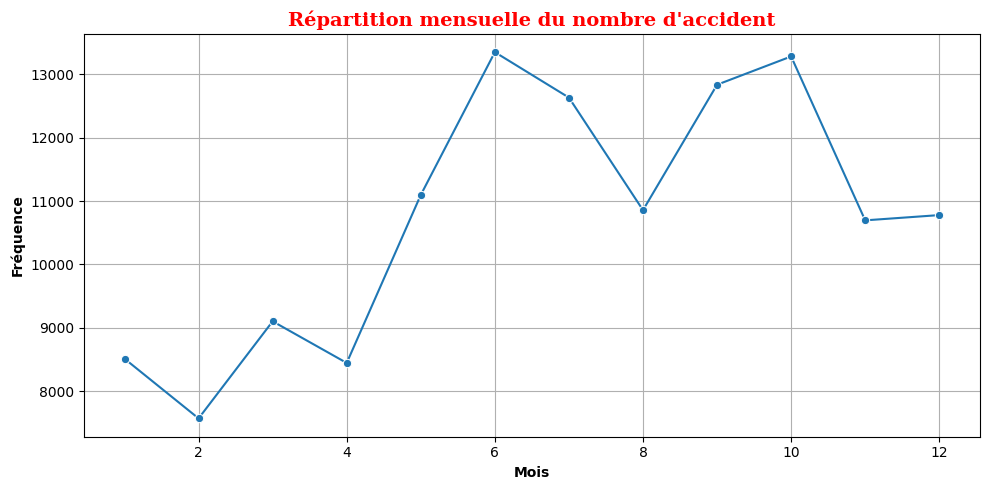

In [404]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 5))
sns.lineplot(data = df_mois_acc, x = 'mois', y = 'Num_Acc', marker='o', palette = "viridis")
plt.title("Répartition mensuelle du nombre d'accident", fontdict=font_title)
plt.xlabel("Mois", fontweight = "bold")
plt.ylabel("Fréquence", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation**

* On observe une nette hausse des accidents à partir de mai, avec un pic en juin (mois 6) et en octobre (mois 10).

* Les mois les moins accidentogènes semblent être février (2) et mars (3).

* Hausse en juin et octobre : Ces pics pourraient s'expliquer par :

    * Juin : période de l’année où la circulation augmente (fin d’année scolaire, météo plus clémente, plus de trajets).

    * Octobre : possible lien avec la météo qui se dégrade (pluie, baisse de visibilité) plus retour à une circulation dense après l’été.

    * Creux en février/mars : Moins de déplacements liés aux vacances ou à des événements saisonniers.

**Relation entre l'heure et le nombre d'accident**

In [405]:
# Nombre d'accident par heure
df_heure_acc = base_final.groupby(["heure"])["Num_Acc"].count().sort_values(ascending=False).reset_index()
df_heure_acc.head(5)

,heure,Num_Acc
0,17,12399
1,18,11359
2,16,10203
3,15,8528
4,19,8097


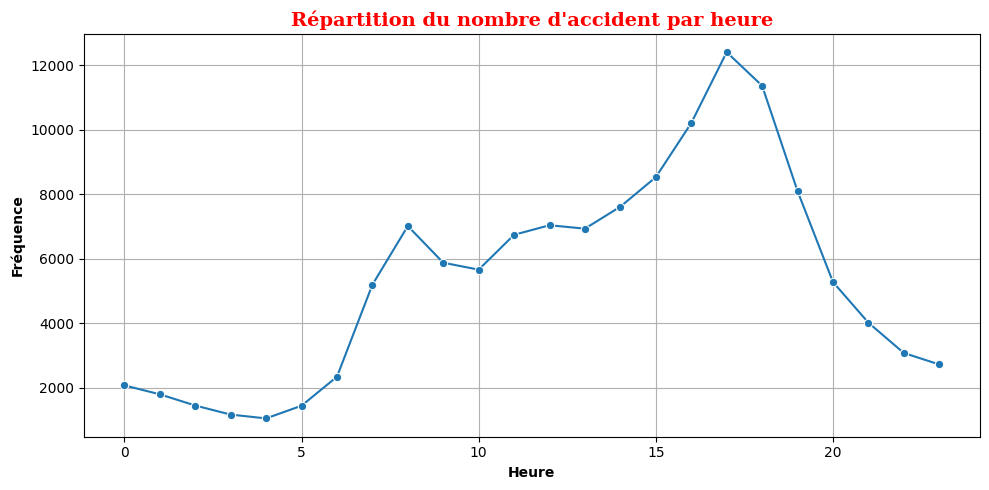

In [406]:
# Visualisation
plt.rcParams.update({ "font.size" : 10})
plt.figure(figsize=(10, 5))
sns.lineplot(data = df_heure_acc, x = 'heure', y ='Num_Acc', marker='o', palette = "viridis")
plt.title("Répartition du nombre d'accident par heure", fontdict=font_title)
plt.xlabel("Heure", fontweight = "bold")
plt.ylabel("Fréquence", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* Il y a deux pics très nets :

    * Premier pic vers 8h (heure d’embauche).

    * Deuxième pic plus fort vers 17h-18h (sortie du travail, fin de journée).

    * Très peu d’accidents entre minuit et 6h du matin.

    * Baisse progressive après 18h jusqu’à minuit.

* Cette distribution correspond très clairement aux heures de pointe, notamment :

    * Matin (7h–9h) : trajets domicile-travail.

    * Soir (16h–19h) : retours du travail, circulation dense.

    * Faible fréquence la nuit : circulation plus fluide et moins de véhicules, malgré une dangerosité potentiellement accrue.

**Nombre de véhicules impliqués selon le type d’intersection**

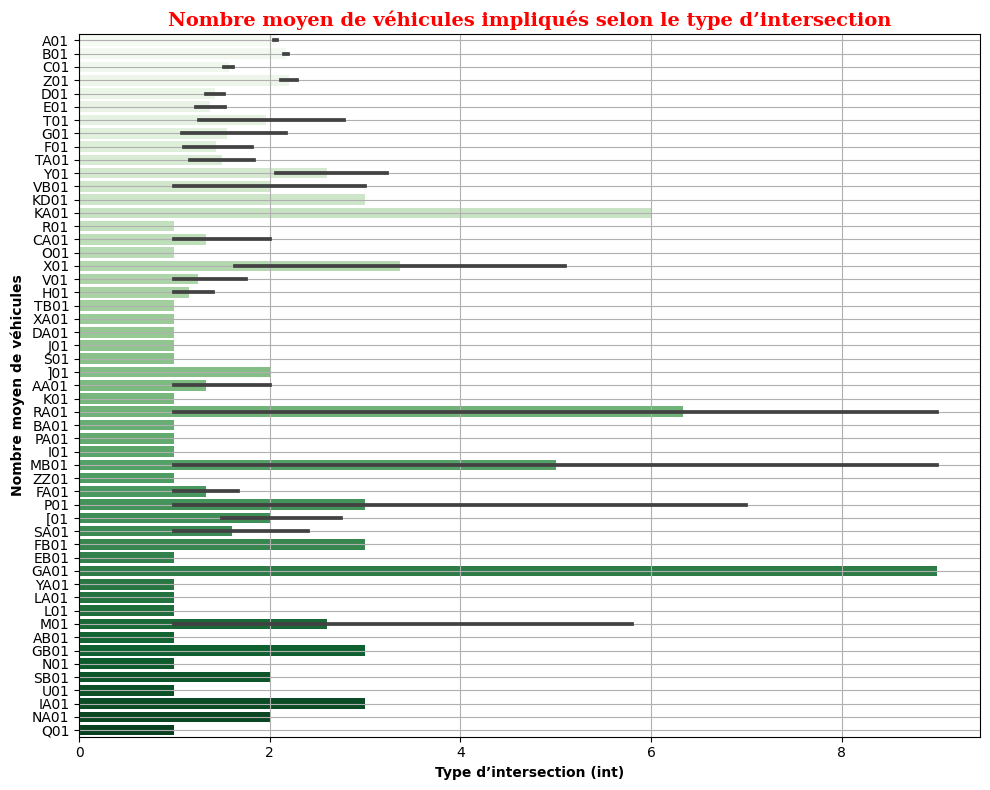

In [407]:
plt.figure(figsize=(10, 8))
sns.barplot(data=base_final, x='int', y='num_veh', estimator='mean', palette='Greens')
plt.title("Nombre moyen de véhicules impliqués selon le type d’intersection", fontdict=font_title)
plt.xlabel("Type d’intersection (int)", fontweight = "bold")
plt.ylabel("Nombre moyen de véhicules", fontweight = "bold")
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* Giratoires (modalité 6) et intersections à plus de 4 branches (modalité 5) ressortent avec le plus grand nombre moyen de véhicules impliqués.

    * Ces configurations sont souvent complexes, avec plusieurs flux croisés.

    * Il est fréquent qu’en cas d’accident, plusieurs véhicules soient impliqués, notamment dans des collisions en chaîne ou lors de non-respect de priorité.

* Les intersections en X (2) et T (3) montrent également des moyennes élevées.

    * Ce sont des points de croisement directs entre deux axes, favorisant les chocs latéraux, souvent avec plusieurs véhicules.

* En revanche, les passages à niveau (8), les places (7) et les intersections en Y (4) ont un nombre moyen plus faible.

    * Cela peut s’expliquer par des flux plus réduits ou un comportement de conduite plus prudent dans ces zones spécifiques.

* Hors intersection (1) affiche un nombre moyen plutôt faible, ce qui est logique :

    * Ces accidents ont lieu sur des routes linéaires, donc généralement impliquent moins de véhicules (souvent un ou deux maximum).

* Autres intersections (9) montrent une moyenne variable, ce qui reflète peut-être l’hétérogénéité de cette catégorie.

**Conclusion:**

Il apparaît clairement que la complexité et la géométrie de l’intersection influencent le nombre de véhicules impliqués. Les intersections multiples ou circulaires augmentent la probabilité d’accidents avec plusieurs véhicules.

* **Aprés l'analyse bivariée de diférentes variables, nous allons passer une autre étape (analyse) qui a pour objectif identifier si certaines modalités de variables qualitatives et même variables quantitatives influencent la probabilité qu’un sinistre ait lieu (accident).**
* **En observant la **moyenne de la gravité de blessure**, on met en lumière les profils ou comportements à risque, ce qui peut ensuite orienter l’interprétation de grave accidents(**grav**).**
* **Nous allons réaliser des tests statistiques pour voir les liens qui existe entre la variable cible est les autres variables qualitatives et quantitatives.**

### Test de Kruskal-Wallis

**Objectif du test :**

* Tester si la variable quantitative varie significativement en fonction des modalités de la variable qualitative cible (**grav**).
* Il s'agit d'un test non paramétrique (sans hypothèse ou aucune condition sur la distribution de probabilité).
*  Plus robuste quand les distributions sont asymétriques ou les variances très différentes.

In [408]:
from scipy.stats import kruskal

# Liste des variables quantitatives à tester
selected_vars_bivar = ['jour', 'lat', 'long', 'age', 'nbv', 'heure']

# Liste pour stocker les résultats
kruskal_results = []

# Boucle sur chaque variable quantitative
for var in selected_vars_bivar:
    # Création des groupes selon la gravité (1 à 4)
    groups = [base_final[base_final['grav'] == g][var].dropna() for g in sorted(base_final['grav'].unique())]

    # Test de Kruskal-Wallis
    stat, p = kruskal(*groups)

    # Stockage des résultats
    kruskal_results.append({
        'Variable': var,
        'Statistique de Kruskal': round(stat, 2),
        'p-value': round(p, 5),
        'Significatif': 'Oui' if p < 0.05 else 'Non'
    })

# Résumé dans un DataFrame
kruskal_summary = pd.DataFrame(kruskal_results)

# Affichage trié par p-value croissante
print(kruskal_summary.sort_values(by="p-value"))

  Variable  Statistique de Kruskal  p-value Significatif
1      lat                    1383        0          Oui
2     long                      40        0          Oui
3      age                    1916        0          Oui
4      nbv                    1006        0          Oui
5    heure                      66        0          Oui
0     jour                       4        0          Non


**Interprétation du test de Kruskal-Wallis :**

* On constate que toutes les variables quantitatives **('an_nais', 'lat', 'long', 'age', 'nbv', 'heure')** ont un impact significatif sur la gravité d'un accident à l'exception de la variable le **'jour'**  du mois n’a pas d’influence sur la gravité des accidents.
* La variable jour ne semble pas utile ici pour expliquer ou prédire la gravité.

**Visualisation des relations bivariées les plus fortes entre les variables et la gravité des accidents (grav), selon les résultats des tests statistiques effectués  (Kruskal-Wallis significatifs).**

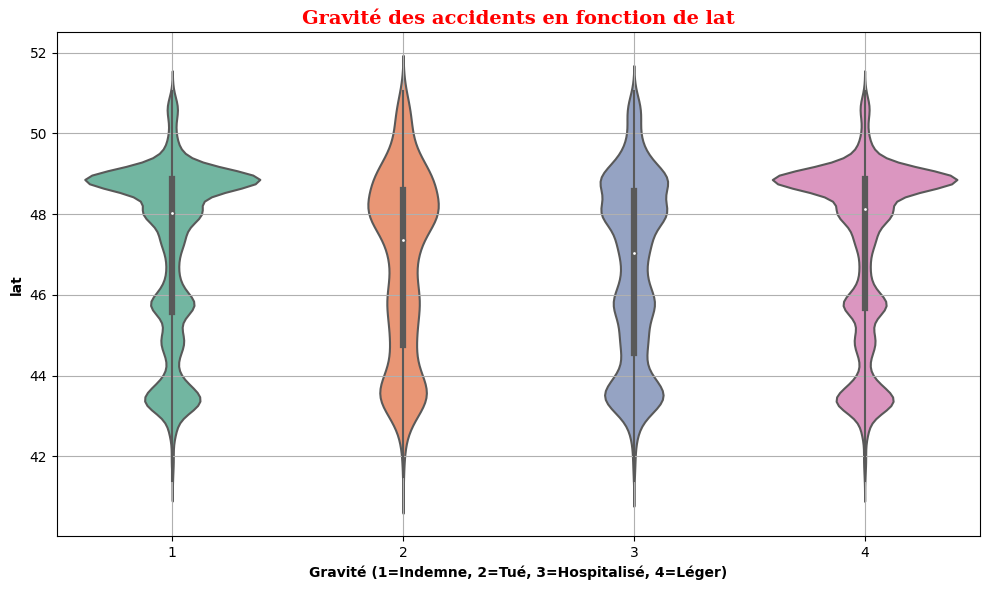

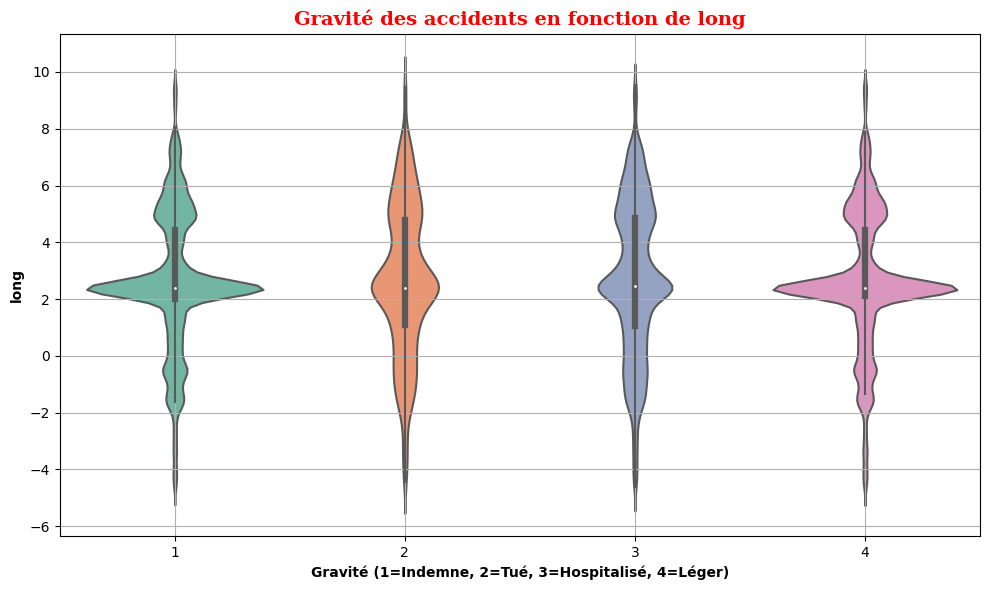

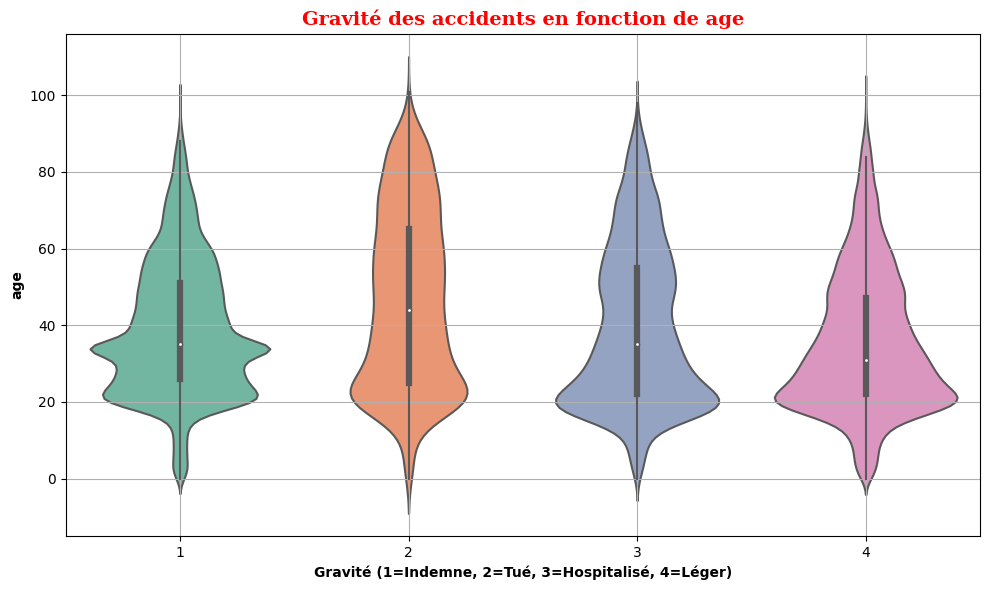

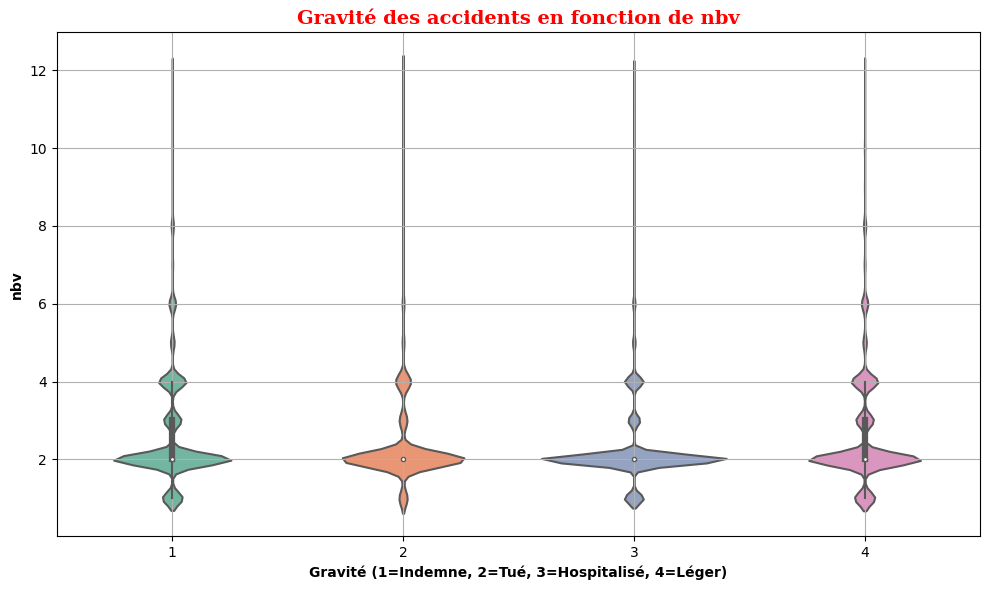

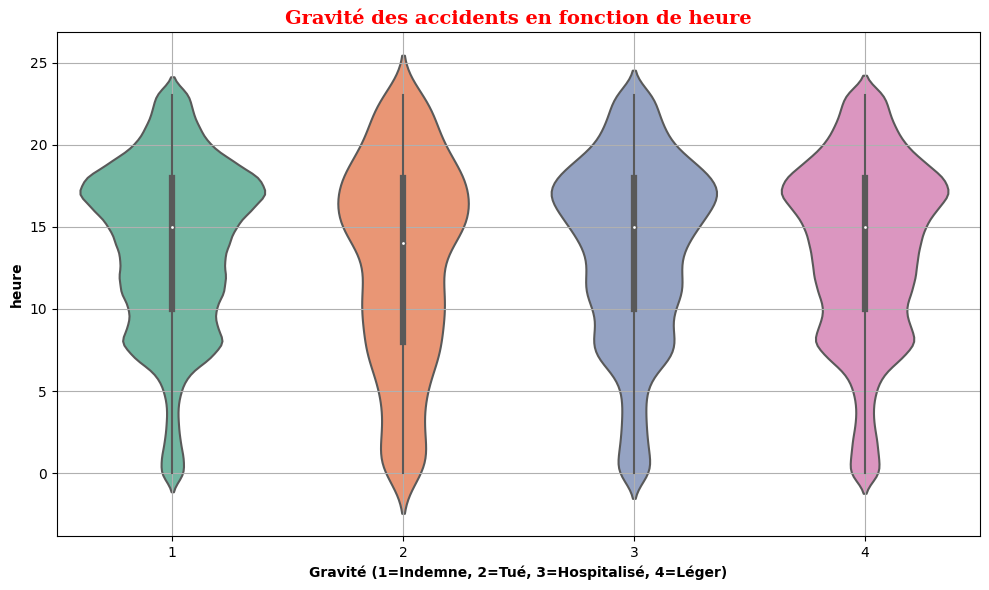

In [409]:
# Les variables
quant_vars = ['lat', 'long', 'age', 'nbv', 'heure']

for var in quant_vars:
    plt.figure(figsize=(10, 6))
    sns.violinplot(data=base_final, x='grav', y=var, inner='box', palette='Set2')
    plt.title(f'Gravité des accidents en fonction de {var}', fontdict=font_title)
    plt.xlabel('Gravité (1=Indemne, 2=Tué, 3=Hospitalisé, 4=Léger)', fontweight='bold')
    plt.ylabel(var, fontweight='bold')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

### Tableau de contingence et test du khi²

**Objectif du test khi²** :

* Ce test évalue s’il existe une dépendance statistique entre une variable qualitative et la présence d’un sinistre (accident) qui est aussi une variable qualitative.

* C’est particulièrement utile avant une modélisation, car ça te permet de sélectionner les variables catégorielles les plus influentes.

In [410]:
from scipy.stats import kendalltau, spearmanr, pearsonr
import scipy.stats as stats

# Liste des variables qualitatives à tester
selected_vars_bivar = ['place', 'catu', 'sexe', 'trajet', 'secu1', 'senc', 'obsm', 'choc', 'motor', 'vma',
                       'catr', 'circ', 'prof', 'plan', 'surf', 'situ', 'catv', 'manv',
                       'mois', 'lum', 'agg', 'int', 'atm', 'col', 'dep', 'com']

# Liste pour stocker les résultats
chi2_results = []

# Boucle sur chaque variable
for var in selected_vars_bivar:
    contingency_table = pd.crosstab(base_final[var], base_final['grav'])
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    chi2_results.append({
        'Variable': var,
        'Chi²': round(chi2, 2),
        'p-value': round(p, 5),
        'Significatif': 'Oui' if p < 0.05 else 'Non'
    })

# Résumé dans un DataFrame
chi2_summary = pd.DataFrame(chi2_results)

# Affichage
print(chi2_summary.sort_values(by="p-value"))

   Variable  Chi²  p-value Significatif
0     place  8139        0          Oui
23      col  8499        0          Oui
22      atm   446        0          Oui
21      int  1018        0          Oui
20      agg  3580        0          Oui
19      lum  1628        0          Oui
18     mois   162        0          Oui
17     manv  8932        0          Oui
16     catv 24202        0          Oui
15     situ  6939        0          Oui
14     surf   386        0          Oui
13     plan  1865        0          Oui
12     prof   634        0          Oui
11     circ  2745        0          Oui
10     catr  4542        0          Oui
9       vma  7104        0          Oui
8     motor  3908        0          Oui
7      choc  5203        0          Oui
6      obsm  1436        0          Oui
5      senc    39        0          Oui
4     secu1 16376        0          Oui
3    trajet  3144        0          Oui
2      sexe  1276        0          Oui
1      catu  7769        0          Oui


**Interprétation du test du khi² :**

* On constate que toutes les variables testées sont significatives (p-value = 0.000) avec une statistique de Chi² très élevée.

*  Toutes les variables sont statistiquement liées à la gravité d'un sinistre, mais certaines beaucoup plus fortement ce qui indique que chacune influence la gravité.

* Ce test statistique vise à détecter s’il existe une relation significative entre certaines variables qualitatives (comme la catu, la catr, le motor etc...) et la probabilité qu’un sinistre soit déclaré (via gravité). Cela oriente la sélection des variables explicatives pour le futur modèle.


**Conclusion :**
Toutes les variables sont statistiquement liées à la gravité, mais certaines beaucoup plus fortement.

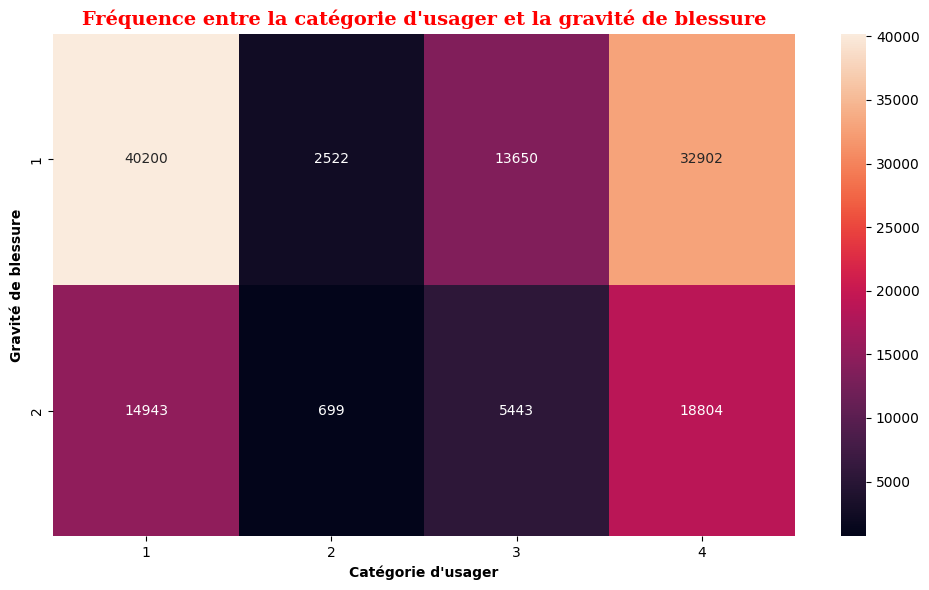

In [411]:
# Exemple tableau de contigence
cont_table = pd.crosstab(base_final['sexe'], base_final['grav'])
cont_table

# Heatmap des fréquences attendues pour 'catu' et 'grav'
plt.figure(figsize=(10, 6))
sns.heatmap(cont_table, annot = True, fmt='g')
plt.title("Fréquence entre la catégorie d'usager et la gravité de blessure", fontdict=font_title)
plt.xlabel("Catégorie d'usager", fontweight = "bold")
plt.ylabel("Gravité de blessure", fontweight = "bold")
plt.tight_layout()
plt.show()

**Visualisation des relations bivariées les plus fortes entre les variables et la gravité des accidents (grav), selon les résultats des tests statistiques effectués (Chi² significatifs).**

com (code commune, très fort Chi² à traiter avec précaution car ont une grande influence sur la gravité de blessure)

dep (code département)

catv (catégorie du véhicule)

secu1 (dispositif de sécurité)

manv (manœuvre du véhicule)

place (place occupée)

col (type de collision)

choc (point de choc)

<Figure size 1000x400 with 0 Axes>

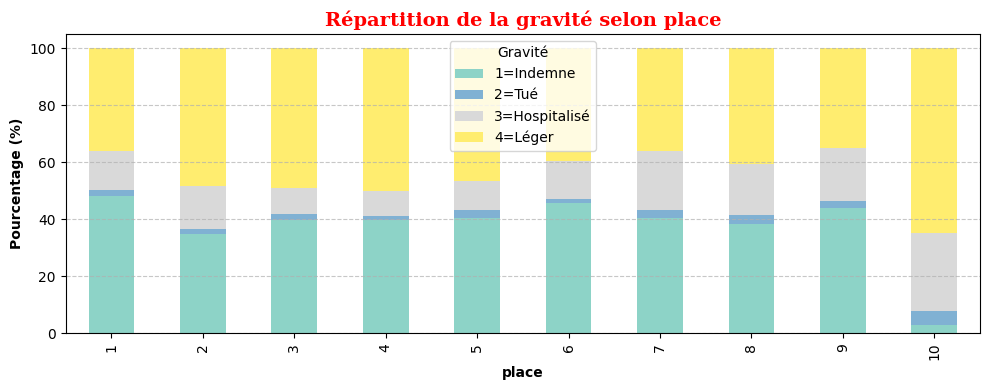

<Figure size 1000x400 with 0 Axes>

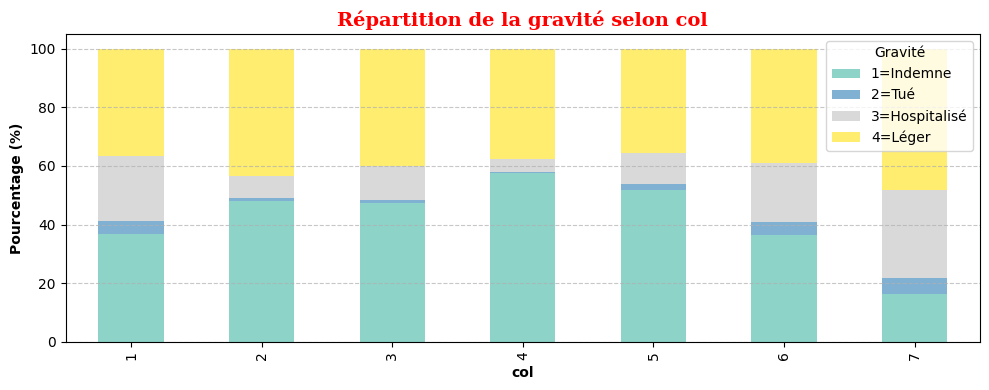

<Figure size 1000x400 with 0 Axes>

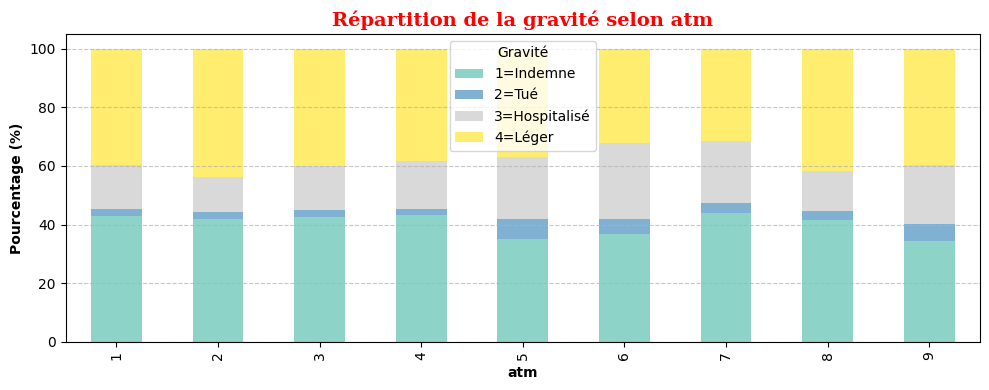

<Figure size 1000x400 with 0 Axes>

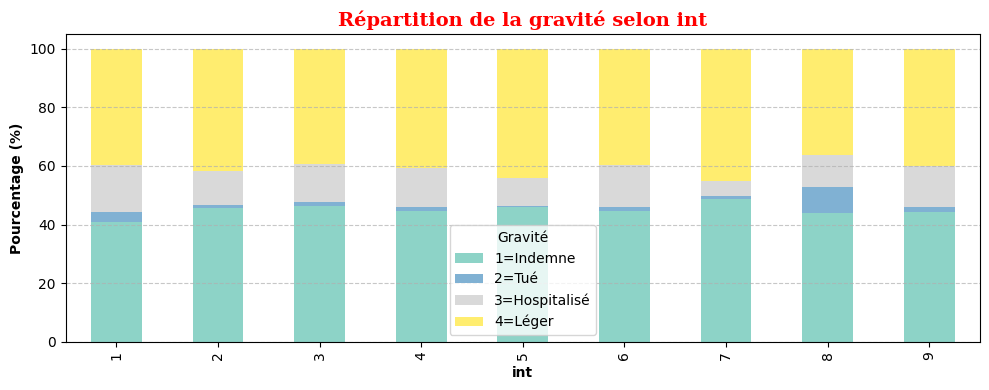

<Figure size 1000x400 with 0 Axes>

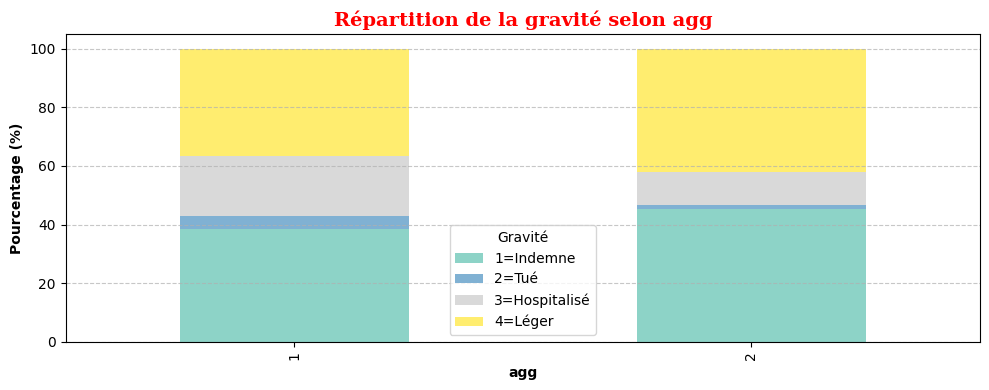

<Figure size 1000x400 with 0 Axes>

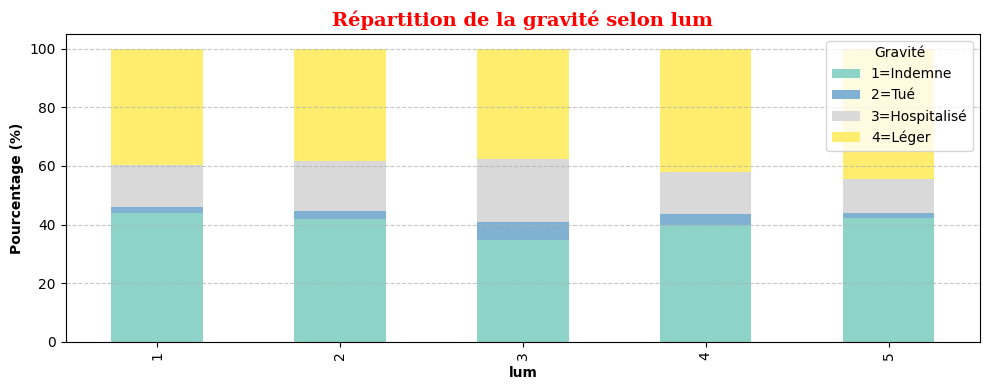

<Figure size 1000x400 with 0 Axes>

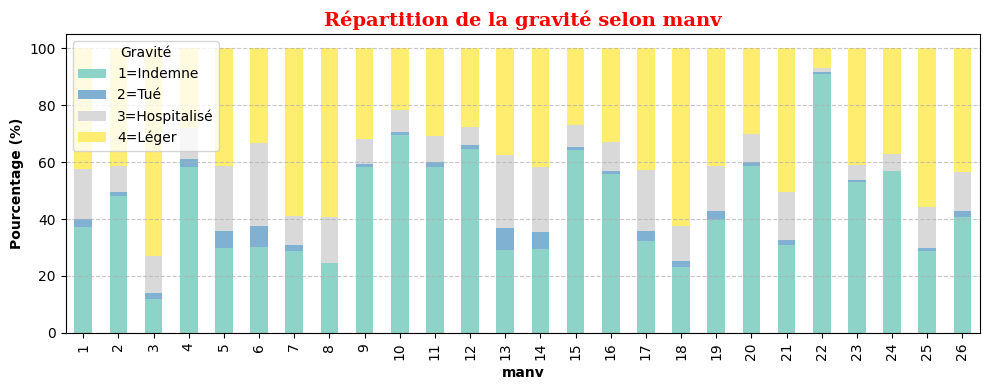

<Figure size 1000x400 with 0 Axes>

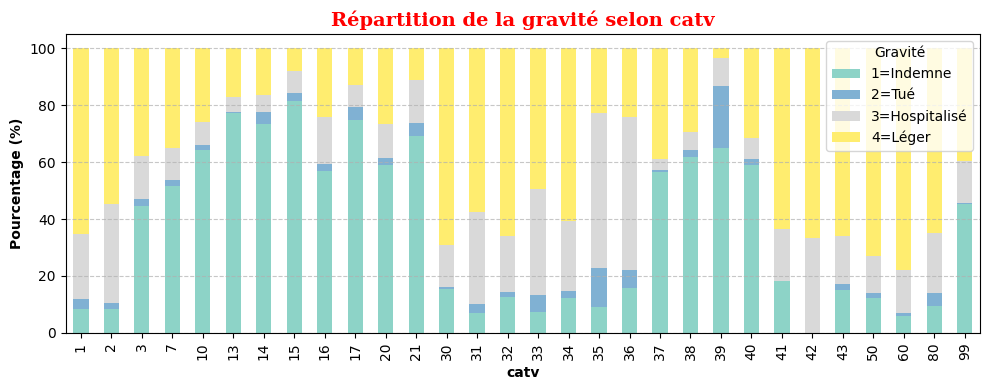

<Figure size 1000x400 with 0 Axes>

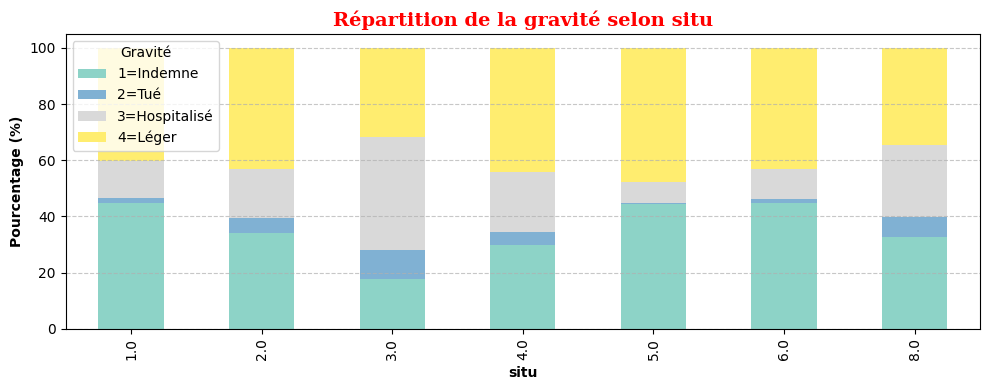

<Figure size 1000x400 with 0 Axes>

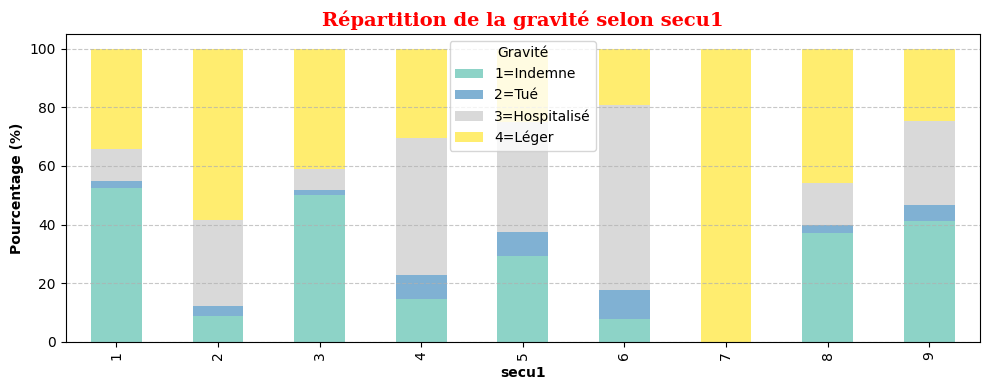

<Figure size 1000x400 with 0 Axes>

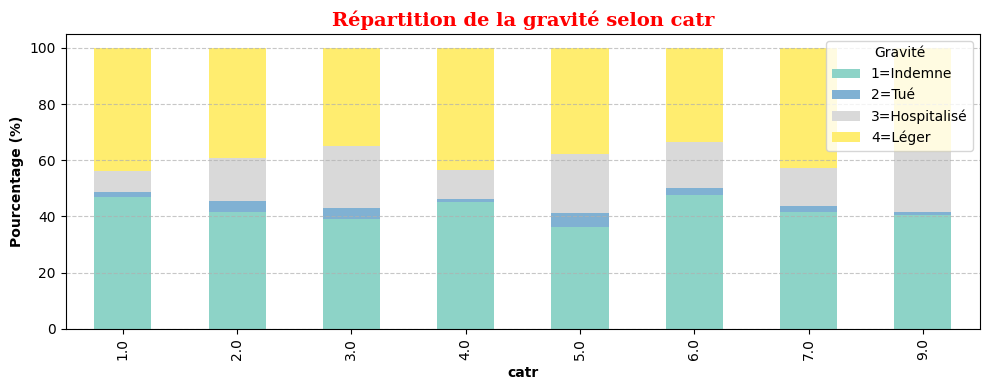

<Figure size 1000x400 with 0 Axes>

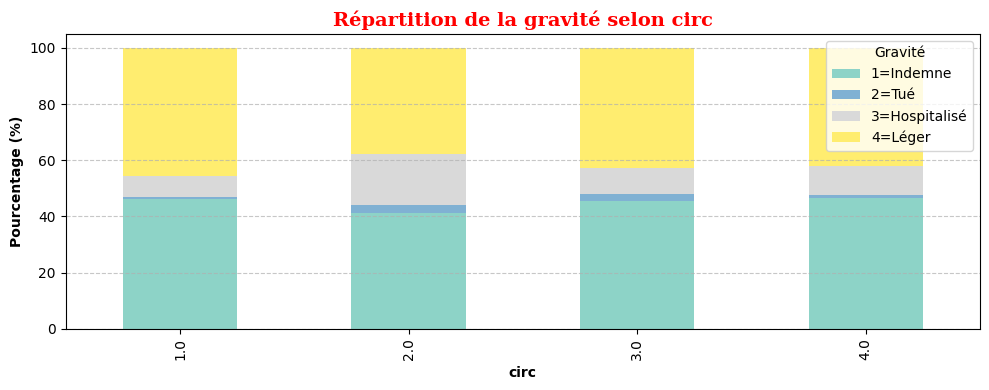

<Figure size 1000x400 with 0 Axes>

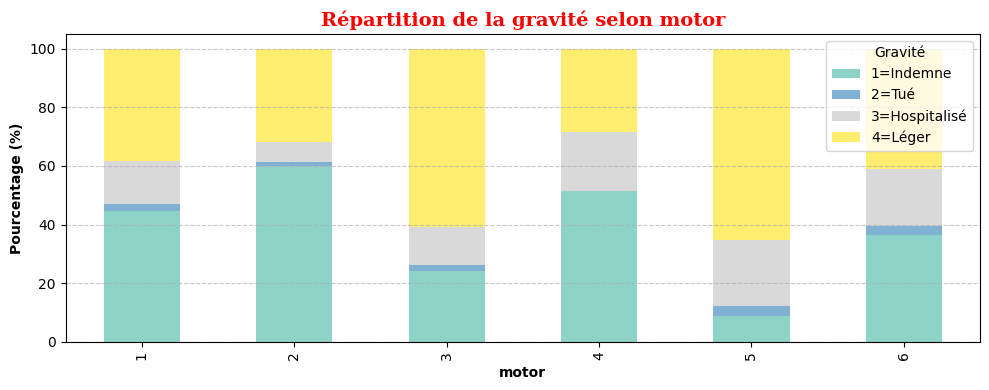

<Figure size 1000x400 with 0 Axes>

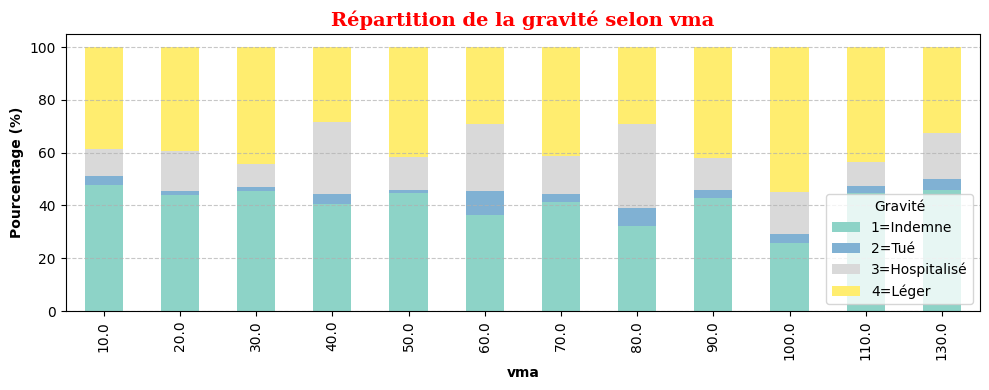

<Figure size 1000x400 with 0 Axes>

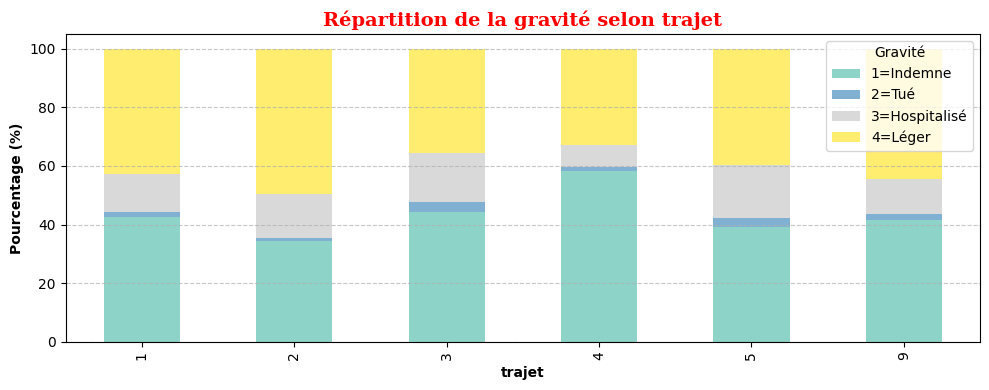

<Figure size 1000x400 with 0 Axes>

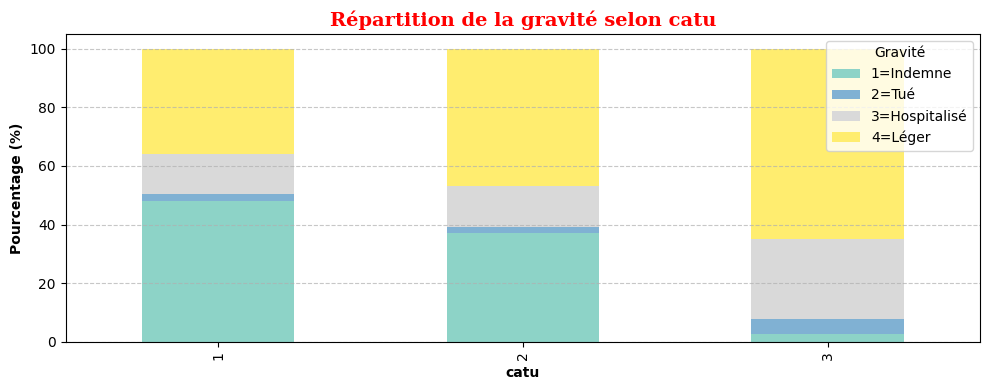

In [412]:
qual_vars = ['place', 'col', 'atm', 'int', 'agg', 'lum', 'manv', 'catv', 
             'situ', 'secu1', 'catr', 'circ', 'motor', 'vma', 'trajet', 'catu']

for var in qual_vars:
    plt.figure(figsize=(10, 4))
    prop_df = pd.crosstab(base_final[var], base_final['grav'], normalize='index') * 100
    prop_df.plot(kind='bar', stacked=True, colormap='Set3', figsize=(10, 4))
    plt.title(f'Répartition de la gravité selon {var}', fontdict=font_title)
    plt.ylabel('Pourcentage (%)', fontweight='bold')
    plt.xlabel(var, fontweight='bold')
    plt.legend(title='Gravité', labels=['1=Indemne', '2=Tué', '3=Hospitalisé', '4=Léger'])
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

## 6.3 Analyse multivariée (trivarié/quadrivarié)

### 6.3.1) Analyse multivariée des variables quantitatives

**Objectif :**

* Détecter des corrélations, des redondances, des axes dominants

**a1) Matrice des coeeficients de corrélation entre variables quantitatives.**

**Rappel sur la matrice de corrélation**
Une matrice de corrélation affiche les relations linéaires entre différentes variables quantitatives.

Valeurs proches de +1 : Corrélation forte et positive → quand une variable augmente, l’autre augmente aussi.

Valeurs proches de -1 : Corrélation forte et négative → quand une variable augmente, l’autre diminue.

Valeurs proches de 0 : Pas de corrélation linéaire significative.

In [413]:
# Sélection des variables quantitatives à visualiser
variables_quantitatives = ['an_nais', 'jour', 'lat', 'long', 'age', 'nbv', 'heure']

df_selected = base_final[variables_quantitatives]

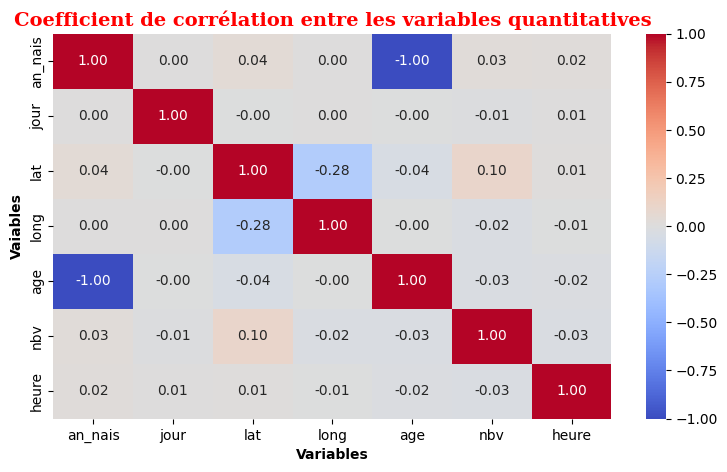

In [414]:
# Matrice de corrélation
plt.figure(figsize=(9, 5))
sns.heatmap(df_selected.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Coefficient de corrélation entre les variables quantitatives", fontdict=font_title)
plt.ylabel("Vaiables", fontweight='bold')
plt.xlabel("Variables", fontweight='bold')
plt.show()

**Analyse des principales corrélations**

* C'est une matrice basée sur la corrélation de Pearson.

* On observe une très forte corrélation négative entre :

* age et an_nais (corrélation = -1.00) ce qui est logique car ce sont des valeurs opposées (redondance nous allons supprimer une pour garder l'autre).

* Quelques corrélations faibles (entre -0.3 et +0.3) entre :

    * lat et long (corrélation = -0.28)

    * age et nbv, heure ou jour semblent très peu corrélés.

**a2) Test statistique entre les variables quantitatives**

**Construire la matrice de corrélation sur la base τ de kendall**
* Nous allons construire une matrice de corrélation sur la base de t de kendall qui mesure la corrélation entre deux variables ordinales ou continues.
* Il est particulièrement utile lorsque les données ne suivent pas une distribution normale (voir visualisation ci dessous avec **pairplot**) et c'est notre cas afin d'analyser la force et la direction d'une relation monotone entre deux variables.
* La correlation de Kendall est moins sensible aux outliers

In [415]:
# Sélection des variables quantitatives à visualiser sans 'an_nais'
variables_quantitatives = ['jour', 'lat', 'long', 'age', 'nbv', 'heure']

df_selected = base_final[variables_quantitatives]

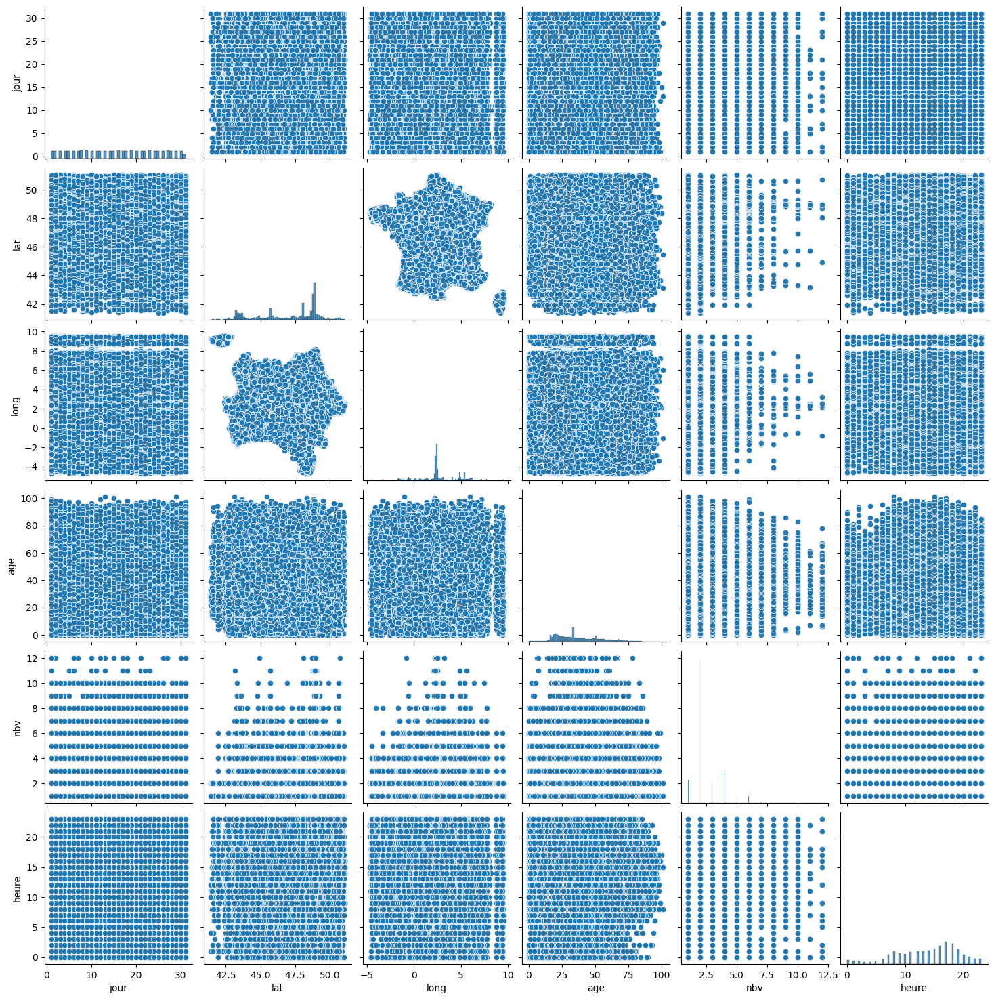

In [416]:
# Visualisation des distributions et des relations
sns.pairplot(df_selected)
plt.show()

* Ce graphique transcrit les relations linéaires et monotones entre les variables explicatives.

In [417]:
# Calculer la matrice de corrélation de Kendall
correlation_matrix = df_selected.corr(method = 'kendall')

# Afficher la matrice de corrélation
correlation_matrix.head(50)

,jour,lat,long,age,nbv,heure
jour,1,-0,0,-0,-0,0
lat,-0,1,-0,-0,0,0
long,0,-0,1,-0,-0,0
age,-0,-0,-0,1,-0,-0
nbv,-0,0,-0,-0,1,-0
heure,0,0,0,-0,-0,1


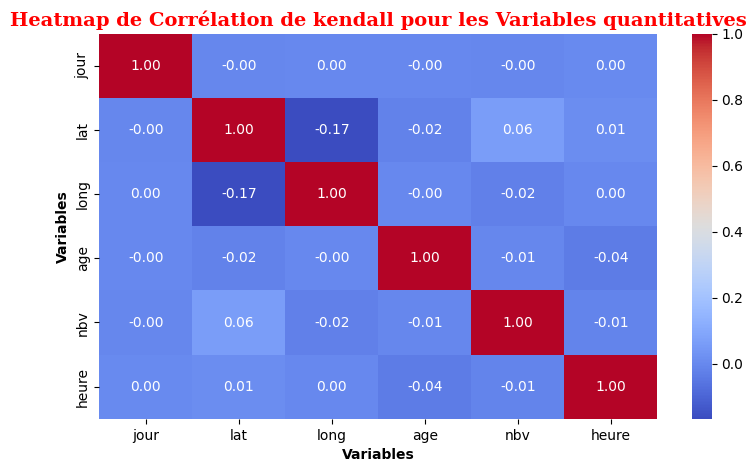

In [418]:
# Matrice de corrélation
plt.figure(figsize=(9, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap de Corrélation de kendall pour les Variables quantitatives", fontdict=font_title)
plt.ylabel("Variables", fontweight='bold')
plt.xlabel("Variables", fontweight='bold')
plt.show()

* Elle confirme les observations précédentes : très peu de corrélations importantes ailleurs entre les variables.

In [419]:
# Calcul de la corrélation entre 'jour' et 'nbv'
correlation = spearmanr(base_final["jour"], base_final["nbv"])

# Affichage 
print(f"La corrélation de Spearman entre 'jour' et 'nbv' est : {correlation}")

La corrélation de Spearman entre 'jour' et 'nbv' est : SignificanceResult(statistic=-0.005923584065172677, pvalue=0.033263361200870784)


In [420]:
# Calcul de la corrélation entre 'jour' et 'heure'
correlation = spearmanr(base_final["jour"], base_final["heure"])

# Affichage 
print(f"La corrélation de Spearman entre 'jour' et 'heure' est : {correlation}")

La corrélation de Spearman entre 'jour' et 'heure' est : SignificanceResult(statistic=0.006309658841609387, pvalue=0.023350854962090113)


In [421]:
# Calcul de la corrélation entre 'lat' et 'long'
correlation = spearmanr(base_final["lat"], base_final["long"])

# Affichage 
print(f"La corrélation de Spearman entre 'latitude' et 'longitude' est : {correlation}")

La corrélation de Spearman entre 'latitude' et 'longitude' est : SignificanceResult(statistic=-0.2455710911834213, pvalue=0.0)


* Cette matrice de corrélation de kendall nous aidera à sélectionner les variables pertinentes pour prédire notre variable de réponse, car elle est capable de capturer les relations monotones, même non linéaires, entre les variables.

  
* Nous choisirons de nous appuyer sur cette méthode, contrairement à la corrélation de Pearson,ou même de Spearman, la corrélation de kendall n' est pas affectée par les valeurs extrêmes et peut donc fournir une meilleure compréhension des associations sous-jacentes dans nos données.

* La limite des tests statistique est qu'on ne peut pas dépasser deux variables seulement donc c'est pas significatif (trés limité)

* Alors là qu'on va introduire l'analyse exploratoire multidimentionnelle qui est une analyse stats des données en tenant compte de toutes les variables.

**a3) Analyse en Composante Principales**

* On ne peut pas faire un graphique à quatre dimensions (avec toutes ces variables = 4, avec 3 c'est possible) c'est là intervient l'ACP
* C'est un mode d'apprentissage non supervisée en réduisant les colonnes tout en gardant le maximum d'information.
* Elle nous permettra d'éviter la redondance d'information.
* Identifier les variables les plus importantes.
* Étudier les corrélations entre variables.

**Préparation des données**

In [422]:
# Sélection des variables quantitatives pertinentes
quant_vars =  ['jour', 'lat', 'long', 'age', 'nbv', 'heure']

# Standardisation des données
scaler = StandardScaler()
df_std = scaler.fit_transform(base_final[quant_vars])

# Extraire les valeurs
X_values = base_final[quant_vars].values
# extraire les colonnes
X_features = base_final[quant_vars].columns

print(df_std)

[[-1.45424645  0.4287369  -0.11614898  1.89912018 -0.39507518  1.18617636]
 [-1.56796279 -0.00937201 -1.45502876  0.98162742 -1.14483049  0.8083719 ]
 [ 0.36521502 -1.70152189 -1.23519679  0.60383629 -1.14483049  0.05276299]
 ...
 [ 1.72981112  0.55296026  0.58089982  2.38485164 -0.39507518 -0.32504147]
 [ 0.25149868  0.4287369  -0.11614898  0.06413467 -0.39507518  0.24166521]
 [ 1.04751307 -1.04711808 -0.87503483  2.22294115 -0.39507518  0.8083719 ]]


* Les variables peuvent être sur des échelles différentes (ex: age en années, lat en coordonnées).
* Il faut centrer et réduire les variables (moyenne = 0, écart-type = 1) pour que chacune ait le même poids dans l’analyse.

**Calcul des composantes principales (PCA)**

* On applique l’ACP pour transformer les variables d’origine en composantes principales (PCA) :
    * Ce sont des axes nouveaux (non corrélés entre eux)
    * Chaque composante explique une part de la variance totale des données
    * Les premières composantes sont les plus informatives

In [423]:
# fonction pour afficher les composantes principales
def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c = "red",marker = 'o')
    plt.xlabel("rang de l'axe d'inertie", fontweight='bold')
    plt.ylabel("pourcentage d'inertie", fontweight='bold')
    plt.title("Eboulis des valeurs propres", fontdict=font_title)
    plt.show(block = False)

Nombre de composantes calculées :  [[-0.01989592  0.69575793 -0.65309856 -0.11040246  0.27631628  0.02116464]
 [ 0.34106895  0.04205938 -0.1240658  -0.17659016 -0.50356512  0.76272456]
 [ 0.09321509  0.04799185 -0.27731025  0.8397212  -0.42082672 -0.17285814]
 [ 0.931404   -0.00480707  0.041196   -0.06623422  0.17382806 -0.31010192]
 [ 0.0840354  -0.03503255  0.17261241  0.48976873  0.6566236   0.53934013]
 [ 0.00342214  0.71456162  0.67057946  0.08505962 -0.17777969 -0.02953647]]
------------------------------------------------
Proportion de variance expliquée :  [0.21857272 0.17134521 0.16925412 0.16606653 0.1573103  0.11745112]
------------------------------------------------
Cumul de variance expliquée :  [0.21857272 0.38991793 0.55917205 0.72523858 0.88254888 1.        ]


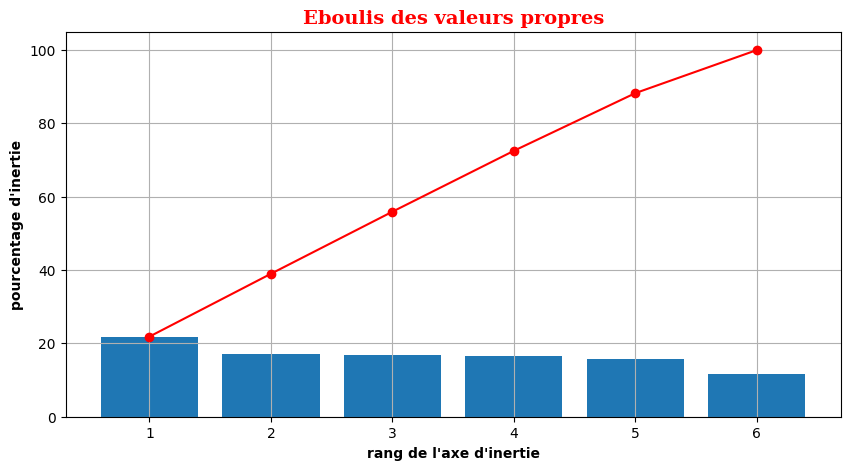

In [424]:
# définir le nombre de composantes (le nombre de colonnes)
n_comp = len(quant_vars)

# calcul des composantes principales (= modèle appliqué sur les données)
pca = PCA(n_components = n_comp)

# appliquer l'algorithme entrainé
pca_components = pca.fit(df_std)

# nombre de composantes
pcs = pca.components_
print("Nombre de composantes calculées : ", pcs)
print("------------------------------------------------")
print("Proportion de variance expliquée : ", pca.explained_variance_ratio_)
print("------------------------------------------------")
print("Cumul de variance expliquée : ", pca.explained_variance_ratio_.cumsum())


# Eboulis des valeurs propres
plt.figure(figsize = (10,5))
plt.grid(True)
# Appel à la fonction
display_scree_plot(pca)

* Le nombre de composant est égale à 4 me fera une variance de 72% c'est à dire là où les composantes supplémentaires commencent à apporter très peu d'information en plus ce qui nous a permis de choisir comme 4 le nombre de composants.

In [425]:
# appliquer l'acp pour avoir 4 composants du moment que 4 composantes nous permettent d'avoir 72% de l'information
pca = PCA(n_components = 4).fit(df_std)
print(pca)

# Projection sur les 6 composantes (faire des calculs sur les données transformées)
Xk_projected = pca.transform(df_std)
print(Xk_projected.shape)

PCA(n_components=4)
(129163, 4)


In [426]:
print("Nombre de composantes calculées : ", pca.components_)
print("------------------------------------------------")
print("Proportion de variance expliquée : ", pca.explained_variance_ratio_)
print("------------------------------------------------")
print("Cumul de variance expliquée : ", pca.explained_variance_ratio_.cumsum())

Nombre de composantes calculées :  [[-0.01989592  0.69575793 -0.65309856 -0.11040246  0.27631628  0.02116464]
 [ 0.34106895  0.04205938 -0.1240658  -0.17659016 -0.50356512  0.76272456]
 [ 0.09321509  0.04799185 -0.27731025  0.8397212  -0.42082672 -0.17285814]
 [ 0.931404   -0.00480707  0.041196   -0.06623422  0.17382806 -0.31010192]]
------------------------------------------------
Proportion de variance expliquée :  [0.21857272 0.17134521 0.16925412 0.16606653]
------------------------------------------------
Cumul de variance expliquée :  [0.21857272 0.38991793 0.55917205 0.72523858]


**Interprétation des variances expliquées**

* Les quatre premières composantes principales permettent d’expliquer 72.52 % de la variance totale des données, ce qui justifie leur utilisation pour représenter fidèlement la structure multidimensionnelle du jeu de données.
  
* Chaque axe apporte une part relativement équilibrée de l’information, ce qui montre que la variabilité est répartie sur plusieurs dimensions, notamment les dimensions géographiques (PC1), temporelles (PC2) et sociodémographiques (PC3).

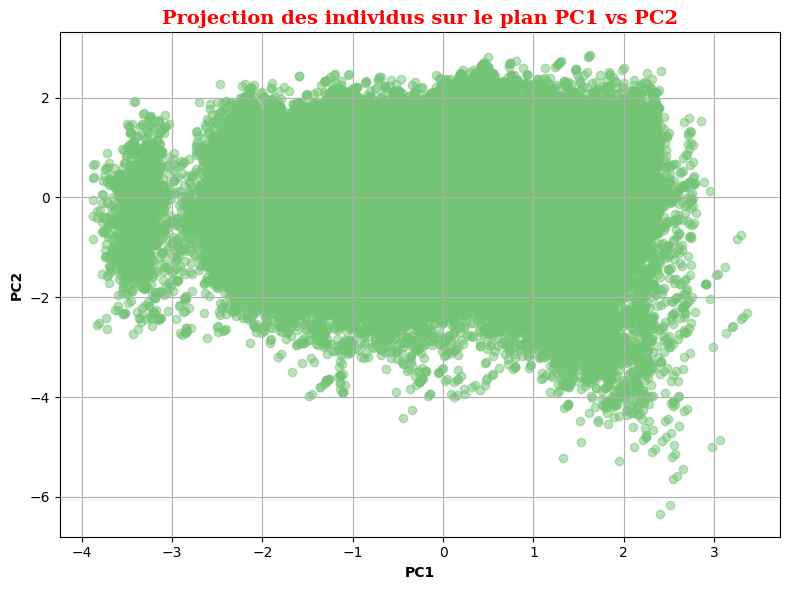

In [427]:
# Conversion de la projection PCA en DataFrame
#Xk_df = pd.DataFrame(Xk_projected, columns=['PC1', 'PC2', 'PC3', 'PC4'])

# dessiner les projections de Xk_projected sur les deux premiers composantes qu'on a trouvé en utlisant ACP (4 composantes)
plt.figure(figsize=(8, 6))
plt.scatter(Xk_projected[:, 0], Xk_projected[:, 1], alpha=0.5, color='#74c476')
plt.xlabel("PC1", fontweight='bold')
plt.ylabel("PC2", fontweight='bold')
plt.title("Projection des individus sur le plan PC1 vs PC2", fontdict=font_title)
plt.grid(True)
plt.tight_layout()
plt.show()

* Chacun de ces points représentent un accident ou gravité de blessure représentés en deux dimensions
* Avec cette visualisation ci dessus , on ne pourra pas apprendre grand chose puisque on ne pourra pas identifier les différents groupes (clusters ou gravité de blessure),
* Après avoir compris mes composants et réduire mes dimensions, je peux déssiner mes données avec les groupes de clusters et pour mieux identifier les groupes , on pourra se baser sur la variable cible **grav**.
* Maintenant il reste à placer les clusters ("Label") dans les nuages de points.

**Visualiser la projection des individus pour voir s’il existe des groupes distincts.**

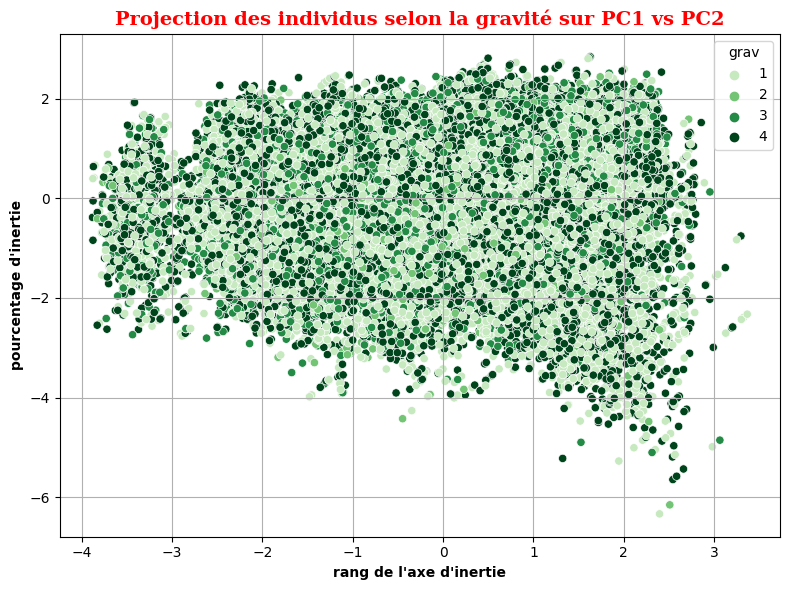

In [428]:
import seaborn as sns

# Fusion avec les labels si besoin
Xk_df = pd.DataFrame(Xk_projected, columns=['PC1', 'PC2', 'PC3', 'PC4'])
Xk_df['grav'] = base_final['grav']

plt.figure(figsize=(8, 6))
sns.scatterplot(data=Xk_df, x='PC1', y='PC2', hue='grav', palette=['#c7e9c0', '#74c476', '#238b45', '#00441b'])
plt.title("Projection des individus selon la gravité sur PC1 vs PC2", fontdict=font_title)
plt.xlabel("rang de l'axe d'inertie", fontweight='bold')
plt.ylabel("pourcentage d'inertie", fontweight='bold')
plt.grid(True)
plt.tight_layout()
plt.show()


* Nous obtenons un nuage des points avec les quatres (4) clusters.
* Maintenant nous allons créer une fonction de cercle des corrélations pour mieux visualiser les variables correlées avec chacune des 4 composantes
* Mais aussi la projection sur la gravité de blessure.

In [429]:
# Fonction pour le cercle de corrélation
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None, illustrative_var=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(8,6))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="red")
                # (voir la doc : https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            an = np.linspace(0, 2 * np.pi, 100)  # Ajoutez un cercle d'unité pour l'échelle
            plt.plot(np.cos(an), np.sin(an))
            plt.axis('equal')

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)), fontweight='bold')
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)), fontweight='bold')
            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1), fontdict=font_title)
            plt.grid(True)
            plt.show(block=False)

* Nous allons représenter nos 4 composantes avec les différentes variables (colonnes).

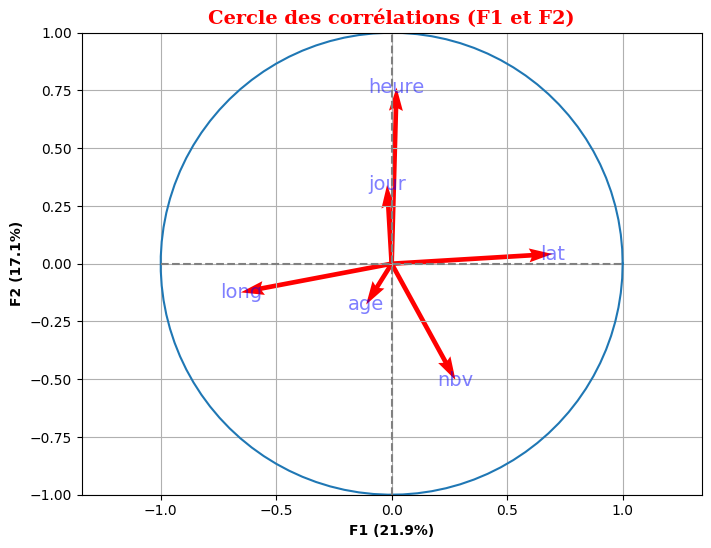

In [430]:
# Appel aux paramètres de la fonction
index = base_final[quant_vars].index 
features = base_final[quant_vars].columns
n_comp = 4
pca = PCA(n_components = 4).fit(df_std)
Xk_projected = pca.transform(df_std)
pcs = pca.components_

# Appel à la fonction sur les composantes 0 et 1
display_circles(pcs, n_comp, pca, [(0,1)], labels = np.array(features))

* La projection de la flèche représente la contribution de chacune des variables (représentant la variable v) sur F1 correspond au coefficient de corrélation entre v et F1 c'est à dire si deux variables évoluent quasiment de la même manière par exemple,
* Nous pouvons retrouver toutes coordonnées de mes composantes principale dans "pca.components_"

In [431]:
# La contribution de chaque variable à chaque composante (pour F1)
# ['jour', 'lat', 'long', 'age', 'nbv', 'heure']
F1 = pca.components_[0]
F1

array([-0.01989592,  0.69575793, -0.65309856, -0.11040246,  0.27631628,
        0.02116464])

In [432]:
# La contribution de chaque variable à chaque composante (pour F2)
F2 = pca.components_[1]
F2

array([ 0.34106895,  0.04205938, -0.1240658 , -0.17659016, -0.50356512,
        0.76272456])

**Interprétation du cercle des corrélations**

Le cercle montre comment les variables initiales sont projetées sur les axes F1 et F2.

* Latitude (lat) et longitude (long) sont fortement opposées sur F1 :
    * Cela signifie que l'axe F1 distingue des zones géographiques opposées.
    * Les accidents situés à l’Est (lat haut, long bas) sont opposés à ceux de l’Ouest.

* Heure et jour sont projetés positivement sur F2 :
    * L’axe F2 semble représenter le moment du sinistre : accidents tôt/tard dans la journée ou en semaine.

* Age (an_nais) : projeté entre F1 et F2 avec une orientation sud-ouest, donc une contribution modérée aux deux dimensions.
    * Il pourrait y avoir des différences d’âge selon le lieu et le moment du sinistre.

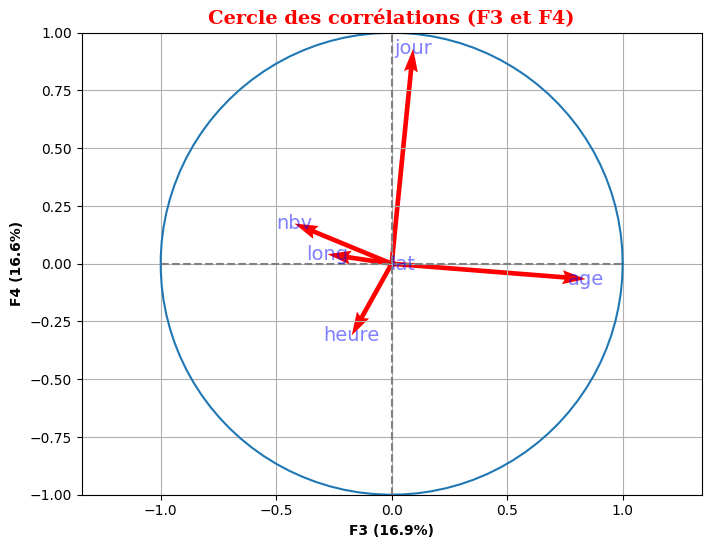

In [433]:
# Appel à la fonction sur les composantes 2 et 3
display_circles(pcs, n_comp, pca, [(2,3)], labels = np.array(features))

In [434]:
# La contribution de chaque variable à chaque composante (pour F3) 
F3 = pca.components_[2]
F3

array([ 0.09321509,  0.04799185, -0.27731025,  0.8397212 , -0.42082672,
       -0.17285814])

In [435]:
# La contribution de chaque variable à chaque composante (pour F4)
F4 = pca.components_[3]
F4

array([ 0.931404  , -0.00480707,  0.041196  , -0.06623422,  0.17382806,
       -0.31010192])

**Interprétation du cercle des corrélations**


* Âge (an_nais) est très bien représenté sur F3. Cela veut dire que cet axe distingue principalement les accidents impliquant des personnes jeunes vs plus âgées.

* Longitude est projetée négativement sur F3. Il pourrait y avoir une variation géographique selon l’âge des personnes impliquées (ex: plus de jeunes dans l’Ouest)

* Jour et heure sont de nouveau présents, mais leur contribution est plus faible ici (comparé à F2 dans le 1er cercle).

* nbv (nombre de voies) est proche du centre avec peu de variance expliquée par ces axes (peu discriminant ici).

**a4) Faisons une classification (K-Means) pour identifier des groupes d'individus.**

* K-Means est un algorithme simple d’apprentissage non supervisé utilisé pour résoudre les problèmes de clustering. Il suit une procédure simple consistant à classer un ensemble de données dans un nombre de clusters, défini par la lettre « k« , qui est fixé au préalable.
  
* On positionne ensuite les clusters comme des points. On associe tous les observations ou points de données au cluster le plus proche, calculés et ajustés. Puis, le processus recommence en utilisant les nouveaux ajustements jusqu’à ce qu’un résultat souhaité soit atteint.

* Nous allons appliquer l'algorithme Kmeans pour déterminer le nombre de cluster

* KMeans est non supervisé, il détecte des regroupements intrinsèques dans les données quantitatives.

**Objectif :**

*  Explorer si les données contiennent des structures cachées similaires ou différentes de grav.

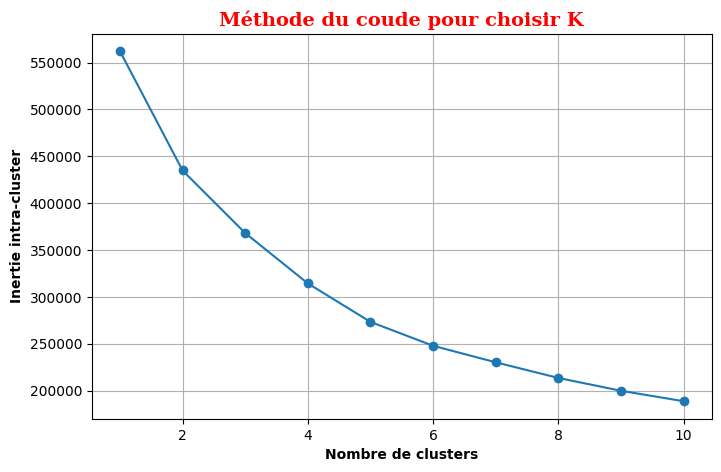

In [436]:
# Sauvegarde une copie avant d’ajouter la colonne Cluster
base_clusters = base_final.copy()

# Méthode du coude pour trouver le bon nombre de clusters
inertia = []
K_range = range(1, 11)  # Tester entre 1 et 10 clusters

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(Xk_projected)
    inertia.append(kmeans.inertia_)

# Tracer la courbe du coude
plt.figure(figsize=(8,5))
plt.plot(K_range, inertia, marker='o', linestyle='-')
plt.xlabel("Nombre de clusters", fontweight='bold')
plt.ylabel("Inertie intra-cluster", fontweight='bold')
plt.title("Méthode du coude pour choisir K", fontdict=font_title)
plt.grid(True)
plt.show()

# Choisir un nombre optimal de clusters
optimal_k = 4  # À ajuster selon la courbe du coude
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
clusters = kmeans.fit_predict(Xk_projected)

* Pour choisir le nombre de cluster, nous allons imaginer que la courbe ci dessus est un bras, là où nous avons une cassure relativement nette, on aura le bon k (nombre de cluster),
* Nous avons une cassure à 2 et à 4 qui sont marqués,
* Nous allons choisir le nombre de cluster égal à 5 ce qui correspond à la cassure.

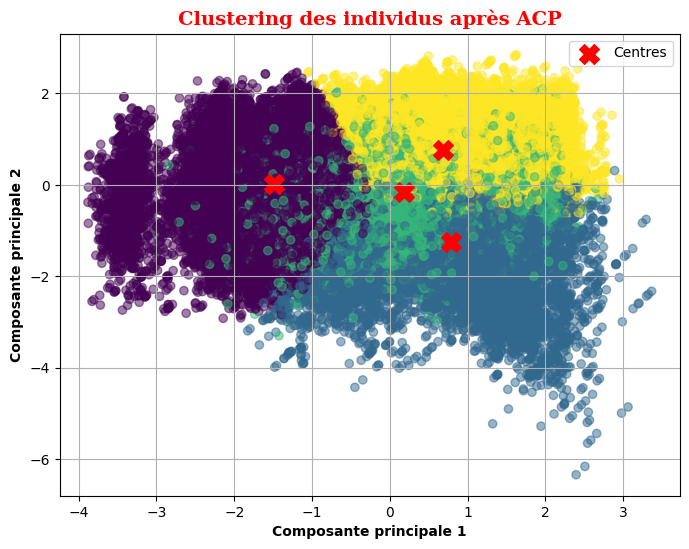

In [437]:
# Visualisation des clusters
plt.figure(figsize=(8,6))
plt.scatter(Xk_projected[:, 0], Xk_projected[:, 1], c=clusters, cmap='viridis', alpha=0.5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', marker='X', s=200, label='Centres')
plt.xlabel("Composante principale 1", fontweight='bold')
plt.ylabel("Composante principale 2", fontweight='bold')
plt.title("Clustering des individus après ACP", fontdict=font_title)
plt.legend()
plt.grid(True)
plt.show()

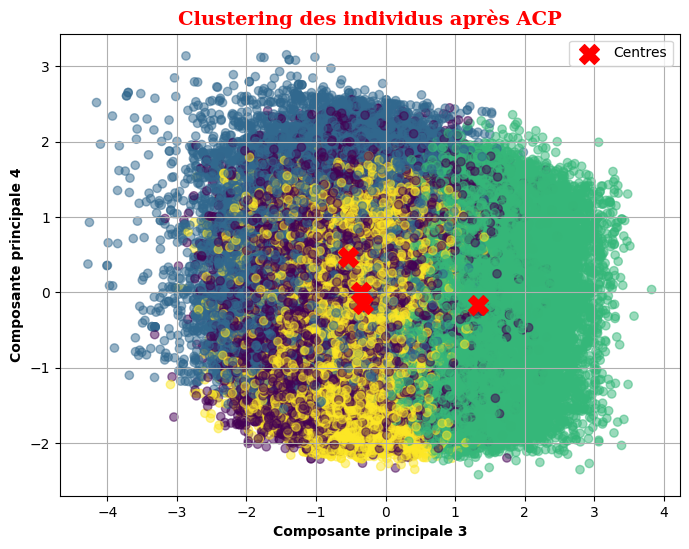

In [438]:
# Visualisation des clusters
plt.figure(figsize=(8,6))
plt.scatter(Xk_projected[:, 2], Xk_projected[:, 3], c=clusters, cmap='viridis', alpha=0.5)
plt.scatter(kmeans.cluster_centers_[:, 2], kmeans.cluster_centers_[:, 3], c='red', marker='X', s=200, label='Centres')
plt.xlabel("Composante principale 3", fontweight='bold')
plt.ylabel("Composante principale 4", fontweight='bold')
plt.title("Clustering des individus après ACP", fontdict=font_title)
plt.legend()
plt.grid(True)
plt.show()

**Analyse du clustering des individus après ACP**

* Plan 1–2 (Composantes principales 1 et 2) :

    * Les clusters sont assez bien séparés (surtout 2 ou 3 d'entre eux).

    * Mais il y a aussi beaucoup de recouvrement, surtout dans les zones centrales.

* Plan 3–4 :

    * Les groupes sont très emmêlés.

    * Cela indique que KMeans ne parvient pas à trouver une vraie séparation claire dans ces dimensions.
 
      
**Conclusion**

 Pas de segmentation naturelle forte : les classes trouvées ne correspondent pas à une séparation nette des 4 premières composantes.

Les centres (croix rouges) sont trop proches, et les clusters s’entremêlent trop pour être significatifs.

Donc ce clustering n’est pas exploitable en l’état pour interpréter ou remplacer grav.

### 6.3.2) Analyse multivariée des variables qualitatives

**a1) ACM**

## **Analyse des composantes multiples**

**Objectif de cette analyse (ACM - Analyse des Correspondances Multiples) :**

* Visualiser les relations entre les modalités des variables qualitatives et voir si certaines modalités se regroupent ou se distinguent dans l’espace factoriel.

Pertinence dans notre contexte :

- On cherches à modéliser la gravité de blessure, mais une bonne compréhension exploratoire des variables qualitatives aide à :

    - repérer les éventuelles redondances ou liens entre modalités,

    - guider l’encodage (groupements de modalités proches),

    - identifier des segments de population distincts (par ex., un groupe de conducteurs à risque),

    - détecter des valeurs atypiques ou peu fréquentes.

In [439]:
import prince
from prince import CA, MCA, FAMD

# Variables qualitatives à inclure dans l'ACM en adaptant si besoin
qual_vars = ['place', 'catu', 'sexe', 'trajet', 'secu1', 'senc', 'obsm', 'choc', 'motor', 'vma',
            'catr', 'circ', 'prof', 'plan', 'surf', 'situ','lum', 'agg', 'int', 'atm', 'col']
# Conversion explicite en variables catégorielles
for col in qual_vars:
    base_final[col] = base_final[col].astype('object')

# Filtrer les lignes sans valeurs manquantes
df_qual = base_final[qual_vars + ['grav']].dropna()

# Appliquer l’ACM (4 composantes principales)
acm = prince.MCA(n_components=4, random_state=42)
acm = acm.fit(df_qual[qual_vars])

# Obtenir les coordonnées des individus
df_acm = acm.transform(df_qual[qual_vars])

# Ajouter la variable cible pour la couleur
df_acm['grav'] = df_qual['grav'].values

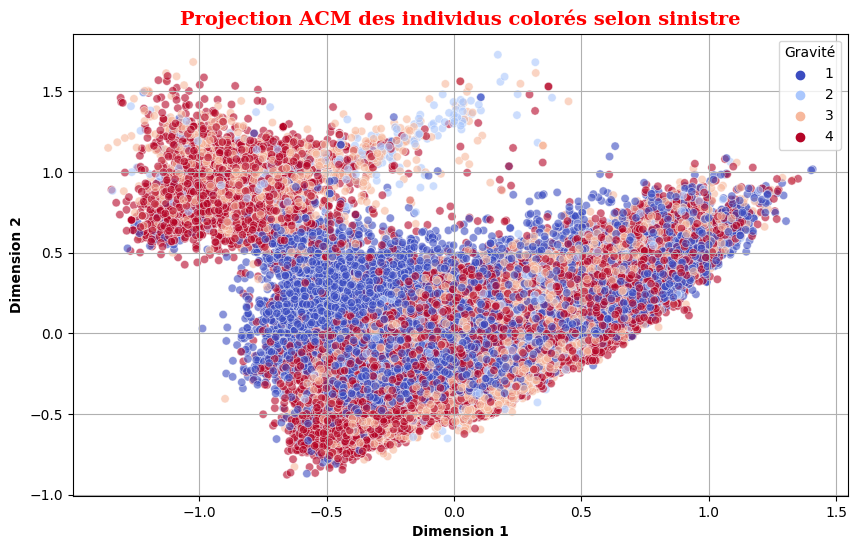

In [440]:
# AFFICHAGE : Projection des individus colorés selon sinistre (gravité de blessure)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_acm, x=0, y=1, hue='grav', palette='coolwarm', alpha=0.6)
plt.xlabel("Dimension 1", fontweight='bold')
plt.ylabel("Dimension 2", fontweight='bold')
plt.title("Projection ACM des individus colorés selon sinistre", fontdict=font_title)
plt.legend(title='Gravité')
plt.grid(True)
plt.show()

**Interprétation du Graphique**

* On observe une certaine séparation, surtout entre 1 (indemne) et 4 (blessé léger), mais beaucoup de chevauchement (cela signifie que l’ACM capte une partie de l’information de gravité, mais pas toute).

* Il y a une tendance des gravités 4 et 3 à se regrouper dans certaines zones du plan.

**Conclusion :**

Le lien entre les variables qualitatives et la gravité existe, mais il est modéré.

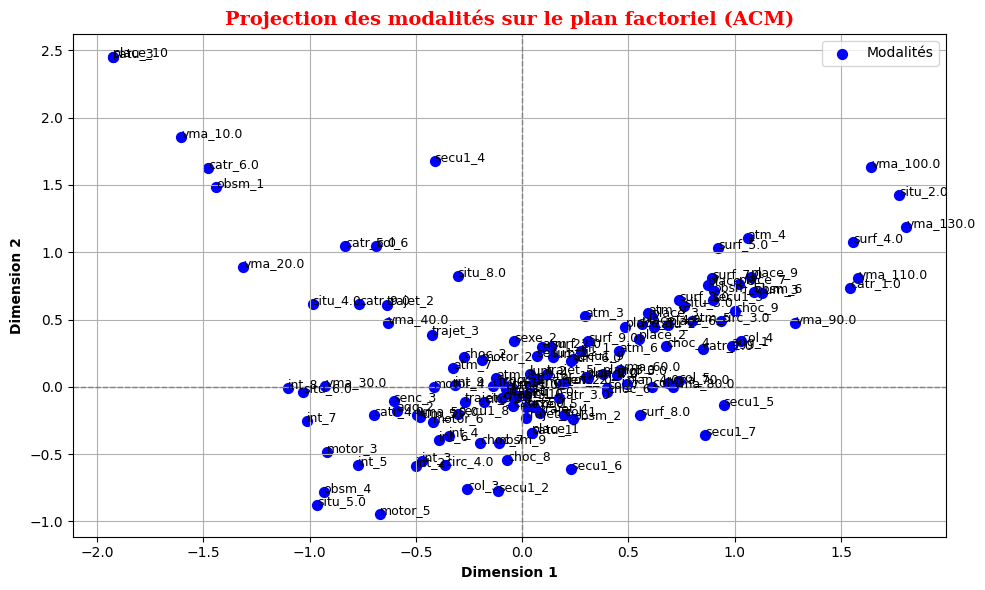

In [441]:
# Récupération des coordonnées des modalités
coords_modalites = acm.column_coordinates(df_qual[qual_vars])

# Affichage des modalités sur le plan factoriel
plt.figure(figsize=(10, 6))
plt.scatter(coords_modalites[0], coords_modalites[1], c='blue', s=50, label='Modalités')

# Ajout des labels des modalités
for i, label in enumerate(coords_modalites.index):
    plt.text(coords_modalites[0][i], coords_modalites[1][i], label, fontsize=9)

plt.axhline(0, color='gray', lw=1, ls='--')
plt.axvline(0, color='gray', lw=1, ls='--')
plt.xlabel("Dimension 1", fontweight='bold')
plt.ylabel("Dimension 2", fontweight='bold')
plt.title("Projection des modalités sur le plan factoriel (ACM)", fontdict=font_title)
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

**Interprétation du Graphique**

* Ce graphe montre les modalités (ex : 'sexe_1', 'motor_3', 'catu_2', etc.) dans l’espace ACM.

* Les modalités proches ont un profil similaire dans les données.

* Les modalités éloignées de l’origine sont plus discriminantes sur les axes.

* Si certaines modalités sont proches d’une zone où une gravité est dense, cela peut donner des indices.


**Conclusion :**

L’analyse des modalités dans le plan factoriel montre plusieurs groupes de modalités proches, notamment entre certaines obstacles mobile heurté, surf, sexe ou choc.

Certaines modalités apparaissent très spécifiques comme la vitesse maximale, catégorie de route ou l'obstacle mobile heurté, ce qui peut orienter des groupements ou créer des variables indicatrices pertinentes.

Cette cartographie est particulièrement utile pour envisager des regroupements de modalités faibles en fréquence, ou des encodages plus intelligents dans les modèles prédictifs.

### 6.4. Méthode avec le calcul et l'affichage sur les scores

* Aprés avoir tester la corrélation de Kendall, nous allons calculer puis afficher les scores F pour les caractéristiques numériques et les dummies puis sélectionner les 10 meilleures pour être utilisées dans notre modèle.
  
* Cette méthode qui évalue l'importance de chaque variable par rapport à la variable cible.

* On l'utilise souvent cette méthode pour sélectionner les variables les plus pertinentes avant d'entraîner un modèle.

### 6.4.a) Encodage des variables qualitatives

In [442]:
# les colonnes
base_final.columns

Index(['Num_Acc', 'id_vehicule', 'num_veh', 'place', 'catu', 'grav', 'sexe',
       'an_nais', 'trajet', 'secu1', 'senc', 'catv', 'obsm', 'choc', 'manv',
       'motor', 'dep', 'catr', 'circ', 'nbv', 'prof', 'plan', 'surf', 'situ',
       'vma', 'jour', 'mois', 'an', 'lum', 'com', 'agg', 'int', 'atm', 'col',
       'lat', 'long', 'age', 'grav_libelle', 'grave_binaire', 'heure'],
      dtype='object')

In [443]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Faire une copie
data = base_final.copy()
data = data.drop(columns = ['Num_Acc', 'id_vehicule', 'num_veh', 'age',
                           'grav_libelle', 'an', 'grave_binaire'], axis  = 1)

# Encodage des variables catégorielles
label_encoders = {}
for col in data.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

In [444]:
# Affichage aprés encodage puis conversion
data.head(2)

,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,lum,com,agg,int,atm,col,lat,long,heure
0,8,1,4,0,1948,4,0,0,7,1,0,1,0,98,1,1,2,0,0,0,0,7,3,9,2,11041,0,0,0,0,48,2,20
1,0,0,1,1,1965,0,0,0,7,1,2,9,0,44,3,0,1,0,1,0,0,4,2,9,0,5019,1,5,0,1,47,-1,18


#### 6.4.b) calcul les scores F

In [445]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif, f_regression, mutual_info_classif

# Variable à expliquer
X = data.drop(columns = ["grav"], axis  = 1)
X = X.select_dtypes(include=[np.number])

# Variable cible
y = data["grav"]

In [446]:
# Vérifier les VM
X.isna().sum().sum()

0

In [447]:
# Sélection des 10 meilleures variables en fonction du score F
selector = SelectKBest(score_func = f_classif, k=10)
X_selected = selector.fit_transform(X, y)

# Afficher sous forme de Dataframe les scores de chaque variable
selected_features = pd.DataFrame(selector.scores_, index = X.columns, columns=['Score'])
print(selected_features.sort_values(by='Score', ascending=False))

         Score
catu      2388
place     2235
catv      1547
agg       1227
motor      968
an_nais    657
col        650
plan       565
situ       526
vma        517
com        500
dep        490
secu1      443
sexe       430
nbv        428
lat        360
manv       196
prof       181
choc        98
int         96
trajet      62
surf        56
circ        51
lum         49
heure       49
obsm        43
catr        33
atm         18
senc         5
long         3
mois         3
jour         1


#### 6.4.c) Mettre sous forme de graphique le Top 10 des variables

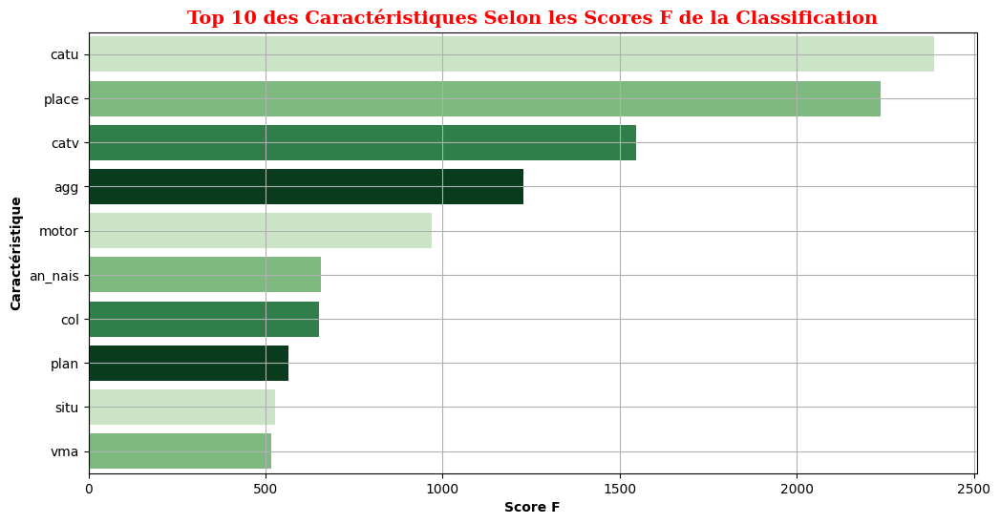

In [448]:
#  Variables à expliquer
X = X.select_dtypes(include=[np.number])
# Variable cible
y = data["grav"]

# Sélection des 10 meilleures variables basées sur le test F
selector = SelectKBest(score_func = f_classif, k=15)
X_new = selector.fit_transform(X, y)

# Obtenir les scores pour chaque variable
scores = selector.scores_
columns = X.columns

# Créer un DataFrame pour stocker les scores et les noms des variables
feature_scores = pd.DataFrame({'Feature': columns, 'Score': scores})

# Trier le DataFrame selon les scores dans l'ordre décroissant
feature_scores_sorted = feature_scores.sort_values(by='Score', ascending=False).head(10)

# Afficher le graphique à barres des scores
plt.figure(figsize=(12, 6))
sns.barplot(x = 'Score', y='Feature', data=feature_scores_sorted, palette = ['#c7e9c0', '#74c476', '#238b45', '#00441b'])

# Ajouter des titres et des étiquettes
plt.title('Top 10 des Caractéristiques Selon les Scores F de la Classification', fontdict=font_title)
plt.xlabel('Score F', fontweight='bold')
plt.ylabel('Caractéristique', fontweight='bold')

# Afficher le graphique
plt.grid(True)
plt.show()

Nous avons terminer avec **l’analyse exploratoire des données** ce qui nous a permet de :

* Décrire les données, comprendre leur structure

* Identifier les corrélations, les déséquilibres

* Détecter les variables potentiellement liées à la cible (**grav**)

**L’analyse exploratoire ne permet pas d’estimer précisément l’effet d’une variable sur la cible, en tenant compte des autres. Pour ça, tu as besoin d’un modèle statistique ou ML.**

**EXEMPLE**

Un GLM me permettant de :

* Estimer la relation entre les variables explicatives et la variable cible

* **Ex. :** "Les blessés hospitalisés sont-ils plus fréquents la nuit ? chez les jeunes ? selon la météo ?"

* Obtenir des coefficients interprétables en termes de log-odds (logarithme du rapport des probabilités)

* Tester la significativité statistique (valeurs-p)

**Cela donne une valeur scientifique et rigoureuse à tes constats exploratoires.**

# 7. Modélisation économétrique

In [449]:
import statsmodels.api as sm
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

### 7.1 Préparation des données pour la modélisation

In [450]:
# Faire une copie
base = base_final.copy()
# format des variables
base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129163 entries, 0 to 129162
Data columns (total 40 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Num_Acc        129163 non-null  int64  
 1   id_vehicule    129163 non-null  int64  
 2   num_veh        129163 non-null  object 
 3   place          129163 non-null  object 
 4   catu           129163 non-null  object 
 5   grav           129163 non-null  int64  
 6   sexe           129163 non-null  object 
 7   an_nais        129163 non-null  int64  
 8   trajet         129163 non-null  object 
 9   secu1          129163 non-null  object 
 10  senc           129163 non-null  object 
 11  catv           129163 non-null  int64  
 12  obsm           129163 non-null  object 
 13  choc           129163 non-null  object 
 14  manv           129163 non-null  int64  
 15  motor          129163 non-null  object 
 16  dep            129163 non-null  object 
 17  catr           129163 non-nul

#### 7.1.a) Visualisation de la variable cible

In [451]:
# Afficher les modalités
print(base["grav"].value_counts(ascending=False))

grav
1    55143
4    51706
3    19093
2     3221
Name: count, dtype: int64


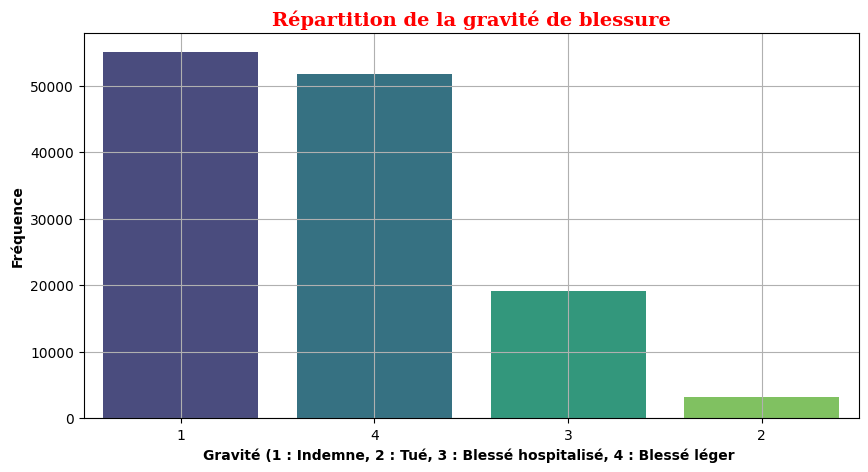

In [452]:
# Visualisation
plt.figure(figsize=(10,5)) 
sns.countplot(x = base["grav"], order = base["grav"].value_counts(ascending=False).index, data = base, palette ="viridis")
plt.xlabel("Gravité (1 : Indemne, 2 : Tué, 3 : Blessé hospitalisé, 4 : Blessé léger ", fontweight = "bold")
plt.ylabel("Fréquence", fontweight = "bold")
plt.title("Répartition de la gravité de blessure", fontdict=font_title)
plt.grid(True)
plt.show()

* Nous observons une déséquilibre de la variable cible (gravité de blessure) avec les différentes modalités avec la modalité **Indemne** majoritaire.

#### 7.1.b) Suppression des variables identifiants et inutils

In [453]:
# Suppression des colonnes
base = base.drop(columns = ["Num_Acc",	"id_vehicule",	"num_veh", "an", "grav_libelle", "grave_binaire","an_nais"], axis  = 1)

In [454]:
# les colonnes
base.columns

Index(['place', 'catu', 'grav', 'sexe', 'trajet', 'secu1', 'senc', 'catv',
       'obsm', 'choc', 'manv', 'motor', 'dep', 'catr', 'circ', 'nbv', 'prof',
       'plan', 'surf', 'situ', 'vma', 'jour', 'mois', 'lum', 'com', 'agg',
       'int', 'atm', 'col', 'lat', 'long', 'age', 'heure'],
      dtype='object')

#### 7.1.c) Encodage des variables catégorielles

* Nous allons faire du LabelEncoder car il ne sont pas sensible à l'échelle des variables.

In [455]:
# Encodage des variables catégorielles
label_encoders = {}
for col in base.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    base[col] = le.fit_transform(base[col])
    label_encoders[col] = le

#### 7.1.d) Séparation des données d'Entrainement, de validation et Test

In [456]:
# Définition des variables explicatives et de la cible
X = base.drop(columns = ["grav"], axis = 1)
X_bin = X.copy()

# Supprimer la cible originale
y = base["grav"]
y_bin = y.copy()

In [457]:
# Vérification de VM
print(X.isna().sum().sum())
print("=============")
print(y.isna().sum())

0
0


In [458]:
# Diviser les données en deux: entrainement et test
from sklearn.model_selection import train_test_split

# Séparation initiale : 80% entraînement + validation, 20% test
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Séparation secondaire : 60% train, 20% validation
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)

# Vérification des dimensions
print("Taille de X_train :", X_train.shape)
print("Taille de X_val   :", X_val.shape)
print("Taille de X_test  :", X_test.shape)
print("Taille de y_train :", y_train.shape)
print("Taille de y_val   :", y_val.shape)
print("Taille de y_test  :", y_test.shape)

Taille de X_train : (77497, 32)
Taille de X_val   : (25833, 32)
Taille de X_test  : (25833, 32)
Taille de y_train : (77497,)
Taille de y_val   : (25833,)
Taille de y_test  : (25833,)


In [459]:
X_train.head()

,place,catu,sexe,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,lum,com,agg,int,atm,col,lat,long,age,heure
39784,0,0,0,0,1,0,80,0,7,1,2,73,3,1,5,0,0,0,4,4,15,7,0,8778,1,0,0,5,49,2,35,19
30905,0,0,1,2,0,2,7,1,2,1,0,99,3,1,1,1,0,1,0,2,6,3,0,11064,1,8,1,0,48,2,22,15
31922,0,0,0,5,0,0,7,1,2,5,0,4,3,1,2,0,0,0,0,4,21,4,4,533,1,0,0,2,43,5,53,19
53624,0,0,0,0,7,1,7,1,4,2,0,66,6,2,10,0,0,1,0,6,4,12,0,7984,0,0,8,1,46,5,28,13
63734,0,0,1,4,0,2,7,1,2,15,2,4,6,0,1,0,1,1,0,4,25,11,4,536,1,5,1,0,43,5,65,20


In [460]:
# ajout des constants pour l'intercept du modèle
X_train_glm = sm.add_constant(X_train)
X_val_glm = sm.add_constant(X_val, has_constant='add')
X_test_glm = sm.add_constant(X_test, has_constant='add')

print(X_train_glm)

        const  place  catu  sexe  trajet  secu1  senc  catv  obsm  choc  manv  \
39784       1      0     0     0       0      1     0    80     0     7     1   
30905       1      0     0     1       2      0     2     7     1     2     1   
31922       1      0     0     0       5      0     0     7     1     2     5   
53624       1      0     0     0       0      7     1     7     1     4     2   
63734       1      0     0     1       4      0     2     7     1     2    15   
...       ...    ...   ...   ...     ...    ...   ...   ...   ...   ...   ...   
19916       1      9     2     1       4      0     1     1     1     1     1   
85418       1      0     0     1       4      0     2     7     0     3    26   
50790       1      1     1     1       0      0     0     7     1     0     1   
118122      1      0     0     0       0      0     1     7     1     0     1   
59463       1      0     0     0       4      0     1     7     1     2     2   

        motor  dep  catr  c

* L’ajout d’une constante (ou intercept) dans un modèle statistique permet de modéliser le niveau de base de la variable cible lorsque toutes les variables explicatives sont nulles.

In [461]:
# Vérification des dimensions
print("X_train_glm shape:", X_train_glm.shape)
print("X_val_glm shape:", X_val_glm.shape)
print("X_test_glm shape:", X_test_glm.shape)

X_train_glm shape: (77497, 33)
X_val_glm shape: (25833, 33)
X_test_glm shape: (25833, 33)


In [462]:
# Format des données
print(X_train_glm.dtypes)

const     float64
place       int32
catu        int32
sexe        int32
trajet      int32
secu1       int32
senc        int32
catv        int64
obsm        int32
choc        int32
manv        int64
motor       int32
dep         int32
catr        int32
circ        int32
nbv       float64
prof        int32
plan        int32
surf        int32
situ        int32
vma         int32
jour        int64
mois        int64
lum         int32
com         int32
agg         int32
int         int32
atm         int32
col         int32
lat       float64
long      float64
age         int64
heure       int32
dtype: object


* Toutes les variables sont au bon format (de type numérique).

### 7.2 Modèle 1: GLM multinomial

* Notre choix se portera sur un **Modèle multinomial** pour prédire les 4 classes comme indépendantes:
    * 1 (Indemne) , 4 (Blessé léger) , 3 (Blessé hospitalisé) , 2 (Tué)
* C'est un modèle qui prédit la probabilité d’appartenir à chaque classe (2, 3, 4), avec la classe de référence (1)
* Le modèle multinomial logit prédit la probabilité d’appartenir à chaque classe en comparant chaque classe à une classe de référence.
* Dans cette partie, nous allons faire de la modélisation (**GLM multinomial**) en entrainant un premier modèle, pour voir s'il y'a des variables significatives ou non et si c'est le cas, nous allons les supprimer puis réentrainer le modèle jusqu'à obtenir un résultat satisfaisant.

#### 7.2.a) Entrainement du Modèle 1

In [463]:
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import MNLogit

# Création et ajustement du modèle multinomial
model_mnlogit = sm.MNLogit(y_train, X_train_glm)

In [464]:
# Entraînement du modèle
result1_glm = model_mnlogit.fit()

# Affichage des résultats du modèle
print(result1_glm.summary())

Optimization terminated successfully.
         Current function value: 0.970966
         Iterations 8
                          MNLogit Regression Results                          
Dep. Variable:                   grav   No. Observations:                77497
Model:                        MNLogit   Df Residuals:                    77398
Method:                           MLE   Df Model:                           96
Date:                Mon, 16 Jun 2025   Pseudo R-squ.:                  0.1210
Time:                        15:33:59   Log-Likelihood:                -75247.
converged:                       True   LL-Null:                       -85604.
Covariance Type:            nonrobust   LLR p-value:                     0.000
    grav=2       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.3610      0.619     -5.429      0.000      -4.574      -2.148
place          0.2473      0.

**Interprétation du GLM multinomial avec toutes les variables**

* Ce modèle inclut l'ensemble des variables explicatives pour prédire la gravité d’un accident (avec les quatres modalités).
* Nous avons des variables significatives les plus influentes avec des p-values inférieures à 0.05
* Certaines variables avec des p-values qui sont supérieures à 0.05, cela signifie que ces variables ne sont pas significativement liée à la variable cible dans le modèle multinomial.

#### 7.2.b) Évaluation du modèle 1

In [465]:
#  Trouver la colonne en trop
col_diff = list(set(X_val_glm.columns) - set(X_train.columns))
col_diff

['const']

In [466]:
df_base = base[base['grav'].isin([1, 2, 3, 4])]
#df_base

In [467]:
print("X_train shape:", X_train.shape)
print("X_train_glm shape:", X_train_glm.shape)
print("X_val_glm shape:", X_val_glm.shape)
print("X_test_glm shape:", X_test_glm.shape)

X_train shape: (77497, 32)
X_train_glm shape: (77497, 33)
X_val_glm shape: (25833, 33)
X_test_glm shape: (25833, 33)


In [468]:
# Prédictions sur les ensembles d'entrainement, de validation et de test pour chaque classe (proba)
y_train_pred = result1_glm.predict(X_train_glm)
y_val_pred = result1_glm.predict(X_val_glm)
y_test_pred = result1_glm.predict(X_test_glm)

# Pour obtenir la classe prédite (la plus probable)
y_train_pred_class = y_train_pred.idxmax(axis=1)
y_val_pred_class = y_val_pred.idxmax(axis=1)
y_test_pred_class = y_test_pred.idxmax(axis=1)

# Exemple d’évaluation
target_names = ['Indemne', 'Tué', 'Blessé hospitalisé', 'Blessé léger']
labels = [1, 2, 3, 4]

print("Accuracy (train) :", accuracy_score(y_train, y_train_pred_class))
print("f1_train : ", f1_score(y_train, y_train_pred_class, average='weighted'))
print(classification_report(y_train, y_train_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (val) :", accuracy_score(y_val, y_val_pred_class))
print("f1_val : ", f1_score(y_val, y_val_pred_class, average='weighted'))
print(classification_report(y_val, y_val_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (test) :", accuracy_score(y_test, y_test_pred_class))
print("f1_test : ", f1_score(y_test, y_test_pred_class, average='weighted'))
print(classification_report(y_test, y_test_pred_class, labels=labels, target_names=target_names))

Accuracy (train) : 0.08309999096739229
f1_train :  0.04557536371207291
                    precision    recall  f1-score   support

           Indemne       0.12      0.00      0.00     33183
               Tué       0.11      0.19      0.14      1939
Blessé hospitalisé       0.19      0.53      0.28     11452
      Blessé léger       0.00      0.00      0.00     30923

         micro avg       0.19      0.08      0.11     77497
         macro avg       0.11      0.18      0.11     77497
      weighted avg       0.08      0.08      0.05     77497

Accuracy (val) : 0.08272364804707158
f1_val :  0.04563375403266938
                    precision    recall  f1-score   support

           Indemne       0.00      0.00      0.00     10950
               Tué       0.11      0.22      0.15       601
Blessé hospitalisé       0.19      0.52      0.28      3838
      Blessé léger       0.00      0.00      0.00     10444

         micro avg       0.19      0.08      0.11     25833
         macro av

**Interprétation**

* Le modèle de régression logistique multinomiale (GLM multinomial) présente des performances globales très faibles, avec une accuracy autour de 8 % sur l’ensemble des jeux (train, validation, test). Cette valeur est équivalente à un modèle aléatoire dans un problème à 4 classes.
 
* Seule la classe "Blessé hospitalisé" est relativement bien captée par le modèle, avec :

    * Rappel : 0.54 (Plus de la moitié des vrais cas sont détectés).

    * F1-score : 0.29 (Compromis entre précision et rappel encore faible, mais meilleur que les autres).

* Les classes "Indemne" et "Blessé léger" :

    * Précision et rappel nuls (Le modèle ne les détecte quasiment jamais).

    * Pourtant, ces classes représentent les plus gros effectifs du jeu test.

    * Cela déséquilibre la prédiction : le modèle ignore massivement les classes majoritaires.

* Classe "Tué" (681 cas) :

    * F1-score faible (0.13) (Détection partielle mais très limitée).
 
**Conclusion :**

Le modèle détecte partiellement les blessés hospitalisés, ce qui peut être une classe intéressante à isoler dans une approche binaire.

### Modèle 2

#### 7.2.c) Retrait des variables non significatives

In [469]:
import statsmodels.api as sm

# Ajouter constante
X_train_glm = sm.add_constant(X_train)

# Ajuster le modèle multinomial
model = sm.MNLogit(y_train, X_train_glm)
result2_mul = model.fit()

# Extraire toutes les colonnes (y compris 'const')
all_columns = X_train_glm.columns.tolist()

# Extraire les coefficients du modèle
# result2_mul.params est un DataFrame : lignes = variables, colonnes = modalités de y (hors référence)
coefs = result2_mul.params

# On garde les variables qui ont AU MOINS un coefficient > 0
vars_with_positive_coef = coefs[(coefs > 0).any(axis=1)].index.tolist()

# Enlever 'const' si présent
if 'const' in vars_with_positive_coef:
    vars_with_positive_coef.remove('const')

# Garder uniquement les colonnes significatives avec au moins un coef > 0
X_train_selected = X_train_glm[vars_with_positive_coef]

Optimization terminated successfully.
         Current function value: 0.970966
         Iterations 8


In [470]:
# supprimer 'const' s'il est encore dans la liste
selected_columns = [col for col in X_train_selected if col != 'const']

# Sélection des colonnes sans erreur
X_train_significant = X_train[selected_columns]

In [471]:
# Afficher les colonnes
print(X_train_significant)

        place  catu  sexe  trajet  secu1  senc  catv  obsm  motor  dep  catr  \
39784       0     0     0       0      1     0    80     0      2   73     3   
30905       0     0     1       2      0     2     7     1      0   99     3   
31922       0     0     0       5      0     0     7     1      0    4     3   
53624       0     0     0       0      7     1     7     1      0   66     6   
63734       0     0     1       4      0     2     7     1      2    4     6   
...       ...   ...   ...     ...    ...   ...   ...   ...    ...  ...   ...   
19916       9     2     1       4      0     1     1     1      4   73     3   
85418       0     0     1       4      0     2     7     0      0   69     5   
50790       1     1     1       0      0     0     7     1      0    1     2   
118122      0     0     0       0      0     1     7     1      1   92     2   
59463       0     0     0       4      0     1     7     1      0   94     0   

        circ  nbv  prof  plan  surf  si

In [472]:
# Sauvegarde des noms de colonnes utilisées
sig_columns_final = X_train_significant.columns.tolist()

In [473]:
# ajoute const manuellement
X_train_sig_glm = sm.add_constant(X_train_significant)

# Réentraîner le modèle GLM binomial avec ces variables
model_sig = sm.MNLogit(y_train, X_train_sig_glm)
result_sig2 = model_sig.fit()

Optimization terminated successfully.
         Current function value: 0.981126
         Iterations 8


In [474]:
# Afficher le résumé du modèle (coefficients, p-values)
print(result_sig2.summary())

                          MNLogit Regression Results                          
Dep. Variable:                   grav   No. Observations:                77497
Model:                        MNLogit   Df Residuals:                    77425
Method:                           MLE   Df Model:                           69
Date:                Mon, 16 Jun 2025   Pseudo R-squ.:                  0.1118
Time:                        15:34:07   Log-Likelihood:                -76034.
converged:                       True   LL-Null:                       -85604.
Covariance Type:            nonrobust   LLR p-value:                     0.000
    grav=2       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.0549      0.183    -38.556      0.000      -7.414      -6.696
place          0.2372      0.021     11.547      0.000       0.197       0.277
catu           0.2532      0.090      2.801      0.0

**Interprétation**

* Nous avons des variables significatives les plus influentes avec des p-values inférieures à 0.05 (place, catu, sexe, an_nais, etc...)
* Certaines variables avec des p-values qui sont supérieures à 0.05, cela signifie que ces variables ne sont pas significativement liée à la variable cible dans le modèle multinomial.

#### 7.2.d) Analyse du modèle avec les variables significatives

In [475]:
# Ajout des constants sur val et test
X_val_sig_glm = sm.add_constant(X_val[selected_columns], has_constant='add')
X_test_sig_glm = sm.add_constant(X_test[selected_columns], has_constant='add')

In [476]:
# Prédictions sur les ensembles d'entrainement, de validation et de test pour chaque classe (proba)
y_train_pred = result_sig2.predict(X_train_sig_glm)
y_val_pred = result_sig2.predict(X_val_sig_glm)
y_test_pred = result_sig2.predict(X_test_sig_glm)

# Pour obtenir la classe prédite (la plus probable)
y_train_pred_class = y_train_pred.idxmax(axis=1)
y_val_pred_class = y_val_pred.idxmax(axis=1)
y_test_pred_class = y_test_pred.idxmax(axis=1)

# Exemple d’évaluation
from sklearn.metrics import accuracy_score, classification_report
target_names = ['Indemne', 'Tué', 'Blessé hospitalisé', 'Blessé léger']
labels = [1, 2, 3, 4]

print("Accuracy (train) :", accuracy_score(y_train, y_train_pred_class))
print("f1_train : ", f1_score(y_train, y_train_pred_class, average='weighted'))
print(classification_report(y_train, y_train_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (val) :", accuracy_score(y_val, y_val_pred_class))
print("f1_val : ", f1_score(y_val, y_val_pred_class, average='weighted'))
print(classification_report(y_val, y_val_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (test) :", accuracy_score(y_test, y_test_pred_class))
print("f1_test : ", f1_score(y_test, y_test_pred_class, average='weighted'))
print(classification_report(y_test, y_test_pred_class, labels=labels, target_names=target_names))

Accuracy (train) : 0.08510006838974411
f1_train :  0.04627578460540992
                    precision    recall  f1-score   support

           Indemne       0.16      0.00      0.00     33183
               Tué       0.11      0.15      0.12      1939
Blessé hospitalisé       0.20      0.55      0.29     11452
      Blessé léger       0.00      0.00      0.00     30923

         micro avg       0.19      0.09      0.12     77497
         macro avg       0.12      0.17      0.10     77497
      weighted avg       0.10      0.09      0.05     77497

Accuracy (val) : 0.08462044671544149
f1_val :  0.04623835536793047
                    precision    recall  f1-score   support

           Indemne       0.00      0.00      0.00     10950
               Tué       0.11      0.17      0.13       601
Blessé hospitalisé       0.20      0.54      0.29      3838
      Blessé léger       0.00      0.00      0.00     10444

         micro avg       0.19      0.08      0.12     25833
         macro av

* On note pas une grande évolution du modèle même avec les variables significatives.
* Ainsi, bien que le modèle multinomial affine la lecture des niveaux de gravité, il ne permet pas encore une bonne discrimination entre les modalités.
* Nous allons tester le modèle binaire.

### 7.3 Modèle 2 : GLM Binomial

* Nous allons créer une cible binaire "Grave" vs "Non grave".

#### 7.3.a) Séparation des données d'Entrainement, de validation et Test

In [477]:
# Définition des variables explicatives et de la cible (Copie)
X_bin = X_bin

# la cible originale copy
y_bin = y_bin

In [478]:
# Remplacement des classes
# 1 (Indemne) et 4 (Blessé léger) → 0 (Non grave)
# 2 (Tué) et 3 (Blessé hospitalisé) → 1 (Grave)
y_bin = np.where((y_bin == 1) | (y_bin == 4), 0, 1)

In [479]:
# Vérification de VM
pd.Series(y_bin).isna().sum()

0

In [480]:
# Vérification de la nouvelle distribution
print(pd.Series(y_bin).value_counts())

0    106849
1     22314
Name: count, dtype: int64


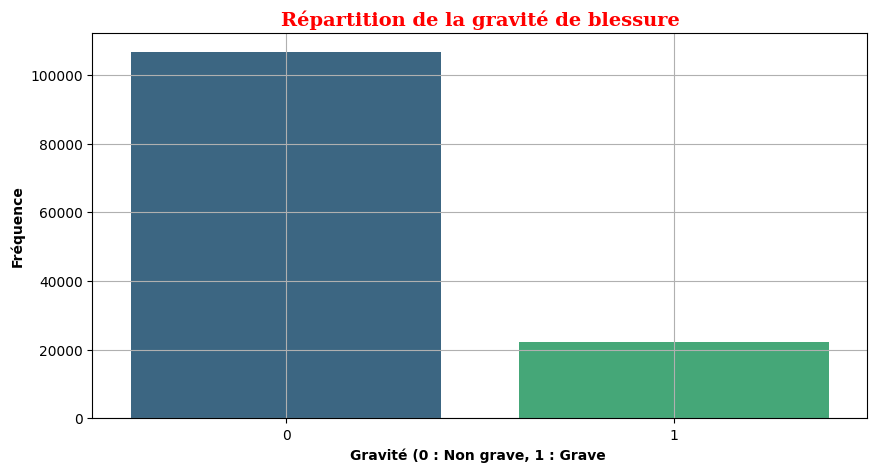

In [482]:
# Visualisation
plt.figure(figsize=(10,5)) 
sns.countplot(x = base_final["grave_binaire"], order = base_final["grave_binaire"].value_counts(ascending=False).index, data = base_final, palette ="viridis")
plt.xlabel("Gravité (0 : Non grave, 1 : Grave ", fontweight = "bold")
plt.ylabel("Fréquence", fontweight = "bold")
plt.title("Répartition de la gravité de blessure", fontdict=font_title)
plt.grid(True)
plt.show()

In [483]:
# Séparation initiale : 80% entraînement + validation, 20% test
X_train_val, X_test, y_train_val, y_test = train_test_split(X_bin, y_bin, test_size = 0.2, random_state=42)

# Séparation secondaire
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size = 0.25, random_state=42)

# Vérification des dimensions
print("Taille de X_train :", X_train.shape)
print("Taille de X_val   :", X_val.shape)
print("Taille de X_test  :", X_test.shape)
print("Taille de y_train :", y_train.shape)
print("Taille de y_val   :", y_val.shape)
print("Taille de y_test  :", y_test.shape)

Taille de X_train : (77497, 32)
Taille de X_val   : (25833, 32)
Taille de X_test  : (25833, 32)
Taille de y_train : (77497,)
Taille de y_val   : (25833,)
Taille de y_test  : (25833,)


In [484]:
# ajout des constants pour l'intercept du modèle
X_train_glm = sm.add_constant(X_train)
X_val_glm = sm.add_constant(X_val, has_constant='add')
X_test_glm = sm.add_constant(X_test, has_constant='add')

print(X_train_glm)

        const  place  catu  sexe  trajet  secu1  senc  catv  obsm  choc  manv  \
39784       1      0     0     0       0      1     0    80     0     7     1   
30905       1      0     0     1       2      0     2     7     1     2     1   
31922       1      0     0     0       5      0     0     7     1     2     5   
53624       1      0     0     0       0      7     1     7     1     4     2   
63734       1      0     0     1       4      0     2     7     1     2    15   
...       ...    ...   ...   ...     ...    ...   ...   ...   ...   ...   ...   
19916       1      9     2     1       4      0     1     1     1     1     1   
85418       1      0     0     1       4      0     2     7     0     3    26   
50790       1      1     1     1       0      0     0     7     1     0     1   
118122      1      0     0     0       0      0     1     7     1     0     1   
59463       1      0     0     0       4      0     1     7     1     2     2   

        motor  dep  catr  c

In [485]:
# Format des données
print(X_train_glm.dtypes)

const     float64
place       int32
catu        int32
sexe        int32
trajet      int32
secu1       int32
senc        int32
catv        int64
obsm        int32
choc        int32
manv        int64
motor       int32
dep         int32
catr        int32
circ        int32
nbv       float64
prof        int32
plan        int32
surf        int32
situ        int32
vma         int32
jour        int64
mois        int64
lum         int32
com         int32
agg         int32
int         int32
atm         int32
col         int32
lat       float64
long      float64
age         int64
heure       int32
dtype: object


#### 7.3.b) Entrainement du modèle binomial

In [486]:
import statsmodels.api as sm

# instanciation du modèle
glm_binom = sm.GLM(y_train, X_train_glm, family=sm.families.Binomial())

# Entrainement du modèle
result2_binom = glm_binom.fit()

In [487]:
# afficher les résultats
print(result2_binom.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                77497
Model:                            GLM   Df Residuals:                    77464
Model Family:                Binomial   Df Model:                           32
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -31403.
Date:                Mon, 16 Jun 2025   Deviance:                       62806.
Time:                        15:34:08   Pearson chi2:                 7.84e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.1043
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6037      0.260      2.322      0.0

**Interprétation du GLM binomial avec toutes les variables**

Ce modèle inclut l'ensemble des variables explicatives pour prédire la gravité d’un accident (grave vs non grave).

Les variables significatives les plus influentes sont :
- **motor** (+0.1596) : Être à moto augmente fortement le risque d'accident grave.
- **sexe** (-0.2739) : Être une femme est associé à un risque plus faible.
- **agg** (-0.8816) : Les accidents en agglomération sont beaucoup moins graves.
- **circ** (+0.3243) : Certaines conditions de circulation augmentent le risque de gravité.
- **plan** (+0.1930) et **nbv** (-0.3712) : La configuration et le nombre de voies de la route influencent fortement la gravité.
- **age** (0.0107) : Le risque augmente légèrement avec l'âge.
- **lum** (+0.0752) : La gravité est plus forte dans certaines conditions de luminosité.
- **vma** (+0.0073) : Plus la vitesse autorisée est élevée, plus le risque est important.

**Conclusion**

Certaines variables sont non significatives (p > 0.05), comme **catu**, **senc**, **obsm**, **surf**, **mois**, **atm**. On les éliminera dans un second modèle plus épuré.

#### 7.3.c) Evaluation du modèle binomial: Performance prédictive du GLM

Dans une classification binaire avec les classes :

* 0 = Non grave

* 1 = Grave

Le modèle prédit la probabilité d’appartenir à la classe 1 (**Grave**).

* Si cette probabilité est supérieure ou égale à 0.5 (seuil), on prévoit 1.

* Sinon, on prévoit 0.

In [488]:
# Prédictions sur les ensembles d'entrainement, de validation et de test pour chaque classe (proba)
y_train_pred = result2_binom.predict(X_train_glm)
y_val_pred = result2_binom.predict(X_val_glm)
y_test_pred = result2_binom.predict(X_test_glm)

# Obtenir les classes prédites à partir du seuil 0.5
y_train_pred_class = (y_train_pred >= 0.5).astype(int)
y_val_pred_class = (y_val_pred >= 0.5).astype(int)
y_test_pred_class = (y_test_pred >= 0.5).astype(int)

# Exemple d’évaluation
target_names = ['Non grave', 'Grave']
labels = [0,1]

print("Accuracy (train) :", accuracy_score(y_train, y_train_pred_class))
print("f1_train : ", f1_score(y_train, y_train_pred_class, average='weighted'))
print(classification_report(y_train, y_train_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (val) :", accuracy_score(y_val, y_val_pred_class))
print("f1_val : ", f1_score(y_val, y_val_pred_class, average='weighted'))
print(classification_report(y_val, y_val_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (test) :", accuracy_score(y_test, y_test_pred_class))
print("f1_test : ", f1_score(y_test, y_test_pred_class, average='weighted'))
print(classification_report(y_test, y_test_pred_class, labels=labels, target_names=target_names))

Accuracy (train) : 0.8293353291095139
f1_train :  0.7745541022463909
              precision    recall  f1-score   support

   Non grave       0.84      0.98      0.91     64106
       Grave       0.54      0.09      0.15     13391

    accuracy                           0.83     77497
   macro avg       0.69      0.54      0.53     77497
weighted avg       0.79      0.83      0.77     77497

Accuracy (val) : 0.8292106994928967
f1_val :  0.7748811279660588
              precision    recall  f1-score   support

   Non grave       0.84      0.98      0.91     21394
       Grave       0.52      0.09      0.15      4439

    accuracy                           0.83     25833
   macro avg       0.68      0.53      0.53     25833
weighted avg       0.78      0.83      0.77     25833

Accuracy (test) : 0.8282042348933535
f1_test :  0.773937010136629
              precision    recall  f1-score   support

   Non grave       0.84      0.98      0.90     21349
       Grave       0.53      0.09    

**Interprétation**

* Le modèle prédit très bien la classe majoritaire (Non grave).

* Mais il rate presque tous les cas graves (seulement 8% de rappel)

* Cela signifie que sur 100 cas réellement graves, il n’en identifie que 9.

* Accuracy (précision globale) autour de 83% semble bonne (mais ne pas oublié que nous avons une classification déséquilibrée)
 
**Conclusion :**

Le modèle est biaisé vers la classe majoritaire (Non grave) et n'arrive pas à détecter les cas graves, ce qui est souvent inacceptable dans des contextes comme la sécurité routière.

Nous allons ajuster le seuil de décision pour voir car nous avons une déséquilibre des classes.

**Ajuster le seuil de décision**

In [489]:
# Obtenir les classes prédites à partir du seuil 0.3
y_train_pred_class = (y_train_pred >= 0.3).astype(int)
y_val_pred_class = (y_val_pred >= 0.3).astype(int)
y_test_pred_class = (y_test_pred >= 0.3).astype(int)

# Exemple d’évaluation
target_names = ['Non grave', 'Grave']
labels = [0,1]

print("Accuracy (train) :", accuracy_score(y_train, y_train_pred_class))
print("f1_train : ", f1_score(y_train, y_train_pred_class, average='weighted'))
print(classification_report(y_train, y_train_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (val) :", accuracy_score(y_val, y_val_pred_class))
print("f1_val : ", f1_score(y_val, y_val_pred_class, average='weighted'))
print(classification_report(y_val, y_val_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (test) :", accuracy_score(y_test, y_test_pred_class))
print("f1_test : ", f1_score(y_test, y_test_pred_class, average='weighted'))
print(classification_report(y_test, y_test_pred_class, labels=labels, target_names=target_names))

Accuracy (train) : 0.8006890589313135
f1_train :  0.7965114132284985
              precision    recall  f1-score   support

   Non grave       0.87      0.89      0.88     64106
       Grave       0.41      0.37      0.39     13391

    accuracy                           0.80     77497
   macro avg       0.64      0.63      0.64     77497
weighted avg       0.79      0.80      0.80     77497

Accuracy (val) : 0.7992877327449387
f1_val :  0.7957937666472541
              precision    recall  f1-score   support

   Non grave       0.87      0.89      0.88     21394
       Grave       0.41      0.37      0.39      4439

    accuracy                           0.80     25833
   macro avg       0.64      0.63      0.64     25833
weighted avg       0.79      0.80      0.80     25833

Accuracy (test) : 0.7995974141601827
f1_test :  0.7948509749337277
              precision    recall  f1-score   support

   Non grave       0.87      0.89      0.88     21349
       Grave       0.41      0.37   

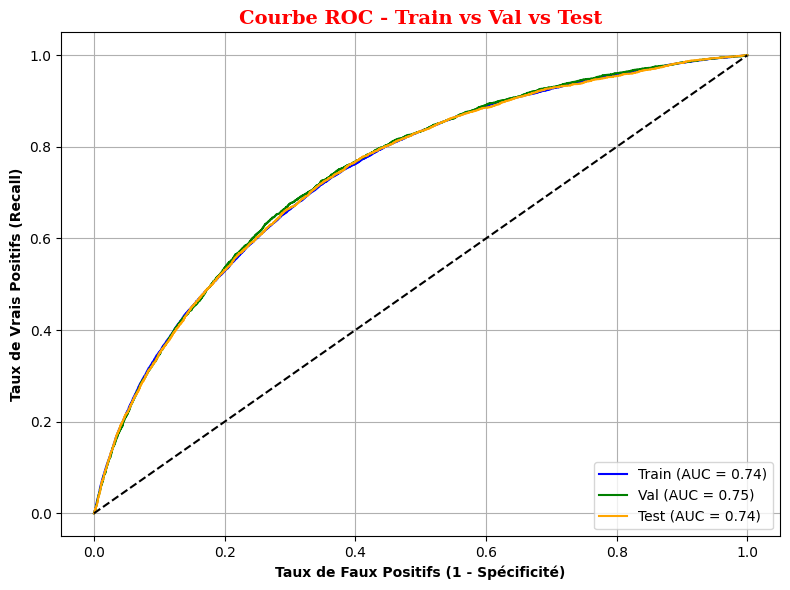

In [490]:
# === Données ===
# y_train, y_val, y_test : vraies étiquettes (0 ou 1)
# y_train_pred, y_val_pred, y_test_pred : probabilités prédites (entre 0 et 1)

fpr_train, tpr_train, _ = roc_curve(y_train, y_train_pred)
fpr_val, tpr_val, _ = roc_curve(y_val, y_val_pred)
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_pred)

auc_train = auc(fpr_train, tpr_train)
auc_val = auc(fpr_val, tpr_val)
auc_test = auc(fpr_test, tpr_test)

# === Plot ROC curves ===
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Train (AUC = {auc_train:.2f})', color='blue')
plt.plot(fpr_val, tpr_val, label=f'Val (AUC = {auc_val:.2f})', color='green')
plt.plot(fpr_test, tpr_test, label=f'Test (AUC = {auc_test:.2f})', color='orange')
plt.plot([0, 1], [0, 1], 'k--')  # diagonale aléatoire

plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', fontweight = "bold")
plt.ylabel('Taux de Vrais Positifs (Recall)', fontweight = "bold")
plt.title('Courbe ROC - Train vs Val vs Test', fontdict=font_title)
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation :**

* Passer le seuil à 0.3 a clairement eu un impact positif sur la détection des cas graves, sans trop sacrifier la performance globale.
  
* Le modèle détecte maintenant environ 37% des cas graves, contre seulement 8% avant.

* La précision sur les cas graves est correcte (~0.41), donc pas trop de faux positifs non plus.

* Légère baisse de l’accuracy (80%), mais ça reste un très bon compromis vu la criticité des faux négatifs.

### 7.4 Réentrainement de GLM Binomial avec des variables significatives

#### 7.4.a) Retrait des variables non significatives

* Nous allons retirer les variables non significatives afin de réentrainer le modèle pour évaluer la performance du modèle à nouveau.

In [491]:
# Ajouter constante
X_train_glm = sm.add_constant(X_train)

# Ajuster le modèle binomial
model = sm.GLM(y_train, X_train_glm, family=sm.families.Binomial())
result2_binom = model.fit()

# Extraire toutes les colonnes (y compris 'const')
selected_columns = X_train_glm.columns.tolist()

# Identifier les variables non significatives (p-value > 0.05)
vars_non_significant = result2_binom.pvalues[result2_binom.pvalues > 0.05].index.tolist()

# Enlever 'const' si présent
if 'const' in vars_non_significant:
    vars_non_significant.remove('const')

# Garder uniquement les colonnes significatives
selected_columns = [col for col in selected_columns if col not in vars_non_significant]

In [492]:
# supprimer 'const' s'il est encore dans la liste
selected_columns = [col for col in selected_columns if col != 'const']

# Sélection des colonnes sans erreur
X_train_significant = X_train[selected_columns]

In [493]:
# Afficher les colonnes
print(X_train_significant)

        place  sexe  trajet  secu1  catv  obsm  choc  manv  motor  dep  catr  \
39784       0     0       0      1    80     0     7     1      2   73     3   
30905       0     1       2      0     7     1     2     1      0   99     3   
31922       0     0       5      0     7     1     2     5      0    4     3   
53624       0     0       0      7     7     1     4     2      0   66     6   
63734       0     1       4      0     7     1     2    15      2    4     6   
...       ...   ...     ...    ...   ...   ...   ...   ...    ...  ...   ...   
19916       9     1       4      0     1     1     1     1      4   73     3   
85418       0     1       4      0     7     0     3    26      0   69     5   
50790       1     1       0      0     7     1     0     1      0    1     2   
118122      0     0       0      0     7     1     0     1      1   92     2   
59463       0     0       4      0     7     1     2     2      0   94     0   

        circ  nbv  prof  plan  situ  vm

In [494]:
# Sauvegarde des noms de colonnes utilisées
sig_columns_final = X_train_significant.columns.tolist()

In [495]:
# ajoute const manuellement
X_train_sig_glm = sm.add_constant(X_train_significant)

# Réentraîner le modèle GLM binomial avec ces variables
model_sig = sm.GLM(y_train, X_train_sig_glm, family=sm.families.Binomial())
result_sig = model_sig.fit()

In [496]:
# Afficher le résumé du modèle (coefficients, p-values)
print(result_sig.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                77497
Model:                            GLM   Df Residuals:                    77469
Model Family:                Binomial   Df Model:                           27
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -31406.
Date:                Mon, 16 Jun 2025   Deviance:                       62813.
Time:                        15:34:11   Pearson chi2:                 7.83e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.1042
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.6227      0.258      2.413      0.0

**Interprétation du GLM binomial avec les variables significatives**

Ce modèle inclut uniquement les variables significatives (p < 0.05). La performance du modèle reste stable (Pseudo R² = 0.1036), ce qui montre que les variables conservées capturent bien le phénomène.

Variables les plus importantes :
- **motor** (+0.1595) : Être à moto reste le facteur le plus aggravant.
- **agg** (-0.8795) : Les accidents en agglomération restent nettement moins graves.
- **sexe** (-0.2736) : Les femmes sont moins exposées aux accidents graves.
- **circ** (+0.3243) : Certaines situations de circulation augmentent la gravité.
- **plan** (+0.1925), **nbv** (-0.3712), **catv**, **prof**, **vma** : La configuration de la route et du véhicule jouent un rôle important.
- **age** (-0.0107) : Le risque augmente légèrement avec l’âge.
- **lum** (+0.0730), **heure** (-0.0066) : L’éclairage et le moment de la journée influencent la gravité.

**Conclusion**

Ce modèle est plus simple et plus interprétable tout en conservant les performances du modèle complet.



#### 7.4.b) Analyse du modèle 2 : Performance prédictive du GLM

In [497]:
# Ajout des constants sur val et test
X_val_sig_glm = sm.add_constant(X_val[selected_columns], has_constant='add')
X_test_sig_glm = sm.add_constant(X_test[selected_columns], has_constant='add')

In [498]:
# Prédictions sur les ensembles d'entrainement, de validation et de test pour chaque classe (proba)
y_train_pred = result_sig.predict(X_train_sig_glm)
y_val_pred = result_sig.predict(X_val_sig_glm)
y_test_pred = result_sig.predict(X_test_sig_glm)

# Obtenir les classes prédites à partir du seuil 0.5
y_train_pred_class = (y_train_pred >= 0.3).astype(int)
y_val_pred_class = (y_val_pred >= 0.3).astype(int)
y_test_pred_class = (y_test_pred >= 0.3).astype(int)

# Exemple d’évaluation
target_names = ['Non grave', 'Grave']
labels = [0,1]

print("Accuracy (train) :", accuracy_score(y_train, y_train_pred_class))
print("f1_train : ", f1_score(y_train, y_train_pred_class, average='weighted'))
print(classification_report(y_train, y_train_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (val) :", accuracy_score(y_val, y_val_pred_class))
print("f1_val : ", f1_score(y_val, y_val_pred_class, average='weighted'))
print(classification_report(y_val, y_val_pred_class, labels=labels, target_names=target_names))
print("======================================================================")
print("Accuracy (test) :", accuracy_score(y_test, y_test_pred_class))
print("f1_test : ", f1_score(y_test, y_test_pred_class, average='weighted'))
print(classification_report(y_test, y_test_pred_class, labels=labels, target_names=target_names))

Accuracy (train) : 0.8010890744157838
f1_train :  0.7968292079554318
              precision    recall  f1-score   support

   Non grave       0.87      0.89      0.88     64106
       Grave       0.42      0.37      0.39     13391

    accuracy                           0.80     77497
   macro avg       0.64      0.63      0.64     77497
weighted avg       0.79      0.80      0.80     77497

Accuracy (val) : 0.7991716022142221
f1_val :  0.795865185606782
              precision    recall  f1-score   support

   Non grave       0.87      0.89      0.88     21394
       Grave       0.41      0.38      0.39      4439

    accuracy                           0.80     25833
   macro avg       0.64      0.63      0.64     25833
weighted avg       0.79      0.80      0.80     25833

Accuracy (test) : 0.7998683853985212
f1_test :  0.7951998429357588
              precision    recall  f1-score   support

   Non grave       0.87      0.89      0.88     21349
       Grave       0.41      0.37    

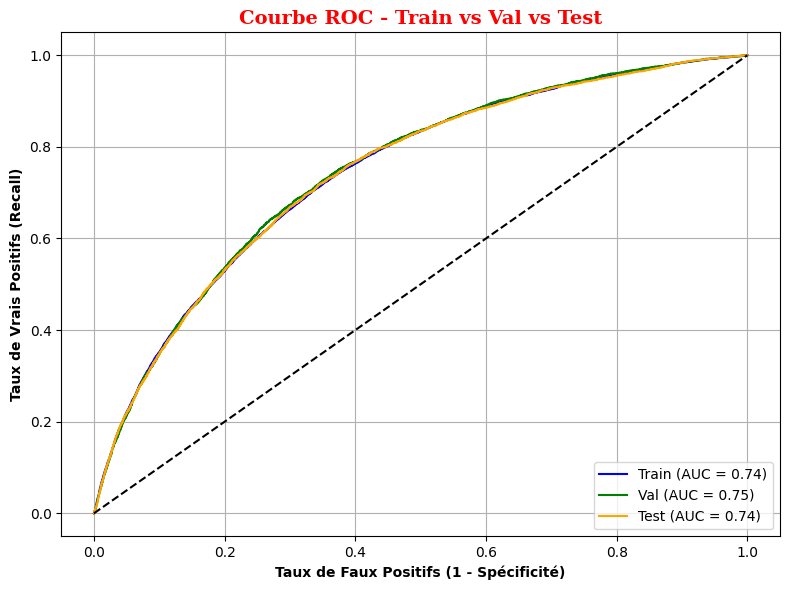

In [499]:
# Données
# y_train, y_val, y_test : vraies étiquettes (0 ou 1)
# y_train_pred, y_val_pred, y_test_pred : probabilités prédites (entre 0 et 1)

fpr_train, tpr_train, _ = roc_curve(y_train, y_train_pred)
fpr_val, tpr_val, _ = roc_curve(y_val, y_val_pred)
fpr_test, tpr_test, _ = roc_curve(y_test, y_test_pred)

auc_train = auc(fpr_train, tpr_train)
auc_val = auc(fpr_val, tpr_val)
auc_test = auc(fpr_test, tpr_test)

# Plot ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, label=f'Train (AUC = {auc_train:.2f})', color='blue')
plt.plot(fpr_val, tpr_val, label=f'Val (AUC = {auc_val:.2f})', color='green')
plt.plot(fpr_test, tpr_test, label=f'Test (AUC = {auc_test:.2f})', color='orange')
plt.plot([0, 1], [0, 1], 'k--')  # diagonale aléatoire

plt.xlabel('Taux de Faux Positifs (1 - Spécificité)', fontweight = "bold")
plt.ylabel('Taux de Vrais Positifs (Recall)', fontweight = "bold")
plt.title('Courbe ROC - Train vs Val vs Test', fontdict=font_title)
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

**Interprétation**

* Amélioration nette du rappel (recall) pour la classe "Grave" par rapport au modèle avec seuil à 0.5.

* Le précision/rappel pour "Grave" sont mieux équilibrés (même si pas parfaits).

* Le modèle est plus simple grâce à la sélection des variables significatives (meilleure interprétabilité).

**b1) Récupérer les résidus du modèle**

**Objectif : vérifier la qualité du modèle et les hypothèses**

* Un résidu, c’est la différence entre ce qu’on observe et ce que le modèle prédit.
*  Ce sont les résidus de déviance, adaptés au GLM Binomial que nous allons utiliser.
* Ils mesurent la contribution de chaque observation à la déviance totale du modèle (c’est un peu comme une erreur pondérée).

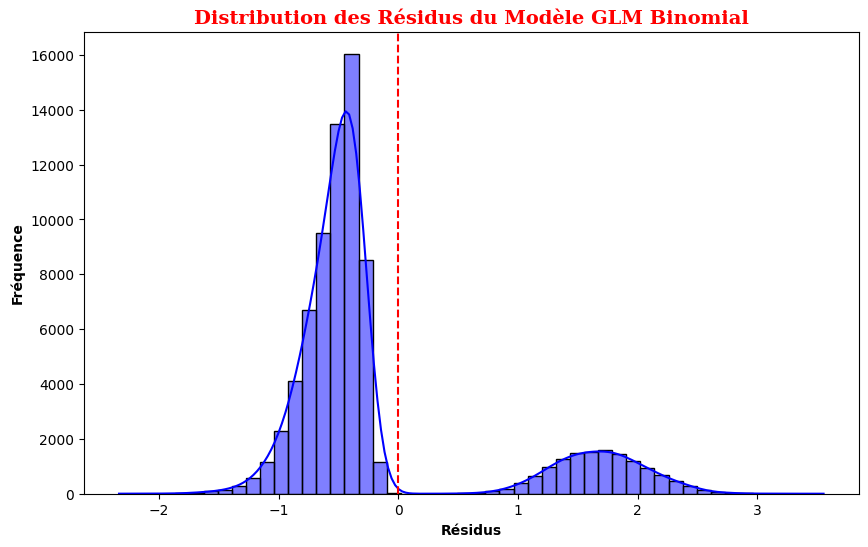

In [500]:
# Récupération des résidus
residus = result_sig.resid_deviance

# Visualisation
plt.figure(figsize=(10, 6))
sns.histplot(residus, kde=True, color='blue', bins=50)
plt.title('Distribution des Résidus du Modèle GLM Binomial', fontdict=font_title)
plt.xlabel('Résidus', fontweight = "bold")
plt.ylabel('Fréquence', fontweight = "bold")
plt.axvline(x=0, color='red', linestyle='--')  # Ligne verticale à l'origine des résidus
plt.show()
plt.show()

In [501]:
# la moyenne des résidus
np.mean(residus)

-0.16200129097025565

* Nous avons une moyenne de résidus proche de zéro
* Car la plupart de blessés sont de type **Non grave** ce qui explique la concentration de valeurs 0.

**b2) Tracer les résidus vs valeurs ajustées (prédictions du modèle)**

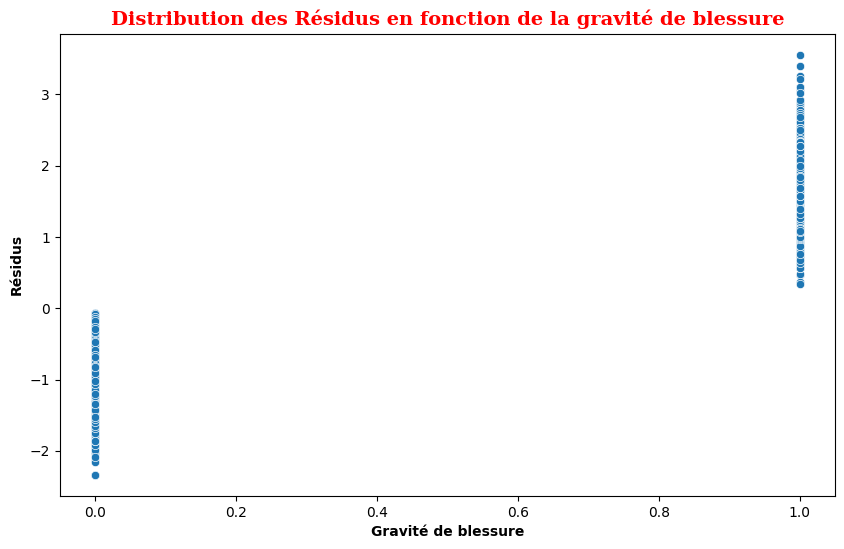

In [502]:
# Visualisation nuage de points
plt.figure(figsize=(10, 6))
sns.scatterplot(x = y_train, y = residus)
plt.title('Distribution des Résidus en fonction de la gravité de blessure', fontdict=font_title)
plt.xlabel('Gravité de blessure', fontweight = "bold")
plt.ylabel('Résidus', fontweight = "bold")
plt.show()

* On voit bien les deux modalités qui sont bien séparées (**0 : Non grave**, **1 : Grave**)
* Nous allons effectuer des tests afin de vérifier la normalités des résidus.

<Figure size 1000x600 with 0 Axes>

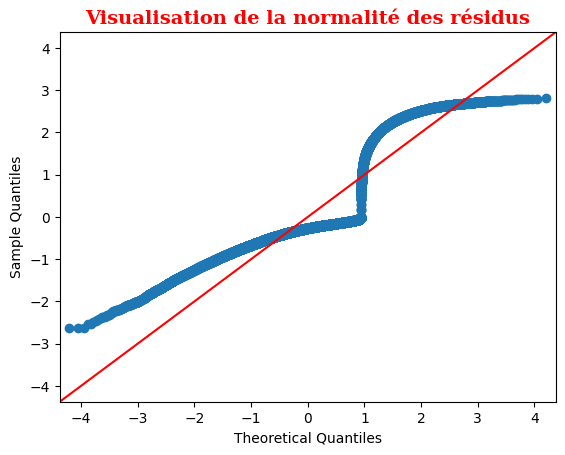

In [503]:
# Visualisation Test de normalité des résidus
plt.figure(figsize=(10, 6))
sm.qqplot(result_sig.resid_response, fit=True, line='45')
plt.title('Visualisation de la normalité des résidus', fontdict=font_title)
plt.show()

**b3) Test statistique**

**Objectif :**

*   Evaluer la significativité des variables

In [504]:
import scipy.stats as st
print("Test de Shapiro wilk des résidus: ", st.shapiro(residus))
print("=========================================================")
print("Test de Jarque_Bera des résidus: ", st.jarque_bera(residus))

Test de Shapiro wilk des résidus:  ShapiroResult(statistic=0.7147926688194275, pvalue=0.0)
Test de Jarque_Bera des résidus:  SignificanceResult(statistic=39339.442021282266, pvalue=0.0)


* On rejette l'hypothèse nulle de la normalité, donc les résidus ne suivent pas une loi normale (ne sont pas gaussian)
* D'aprés ces résultats nous avons un modèle qui ne généralise pas et dans ce cas nous ne pouvons pas valider le modéle car c'est pas satisfaisant
* on verra comment l'améliorer avec d'autres modèles de machine learning différents du GLM.

### L'importance des variables dans notre GLM

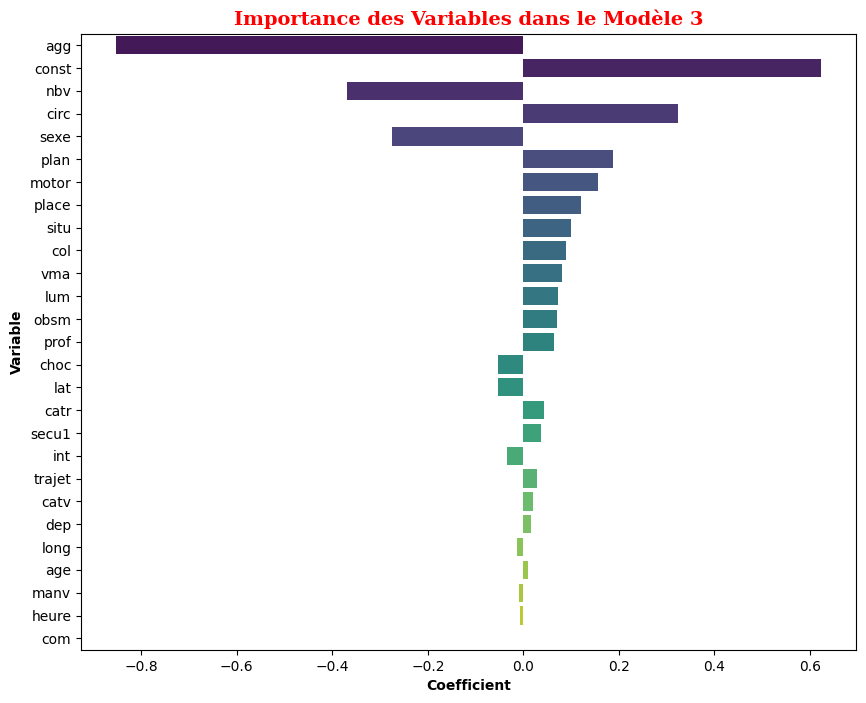

In [505]:
# Créer un DataFrame pour les coefficients et les p-valeurs
coefficients = result_sig.params
p_values = result_sig.pvalues

df_coeffs = pd.DataFrame({'Variable': coefficients.index, 'Coefficient': coefficients.values, 'P_value': p_values.values})
df_coeffs_filtered = df_coeffs[df_coeffs['P_value'] < 0.05]  # Filtrer pour les variables significatives

# Trier par l'importance absolue des coefficients
df_coeffs_filtered = df_coeffs_filtered.reindex(df_coeffs_filtered['Coefficient'].abs().sort_values(ascending=False).index)

# Créer un graphique à barres pour l'importance des variables
plt.figure(figsize=(10, 8))
sns.barplot(x='Coefficient', y='Variable', data=df_coeffs_filtered, palette='viridis')
plt.title('Importance des Variables dans le Modèle 3', fontdict=font_title)
plt.xlabel('Coefficient', fontweight = "bold")
plt.ylabel('Variable', fontweight = "bold")
plt.show()

### Sauvegarde de la base finale

* Nous allons sauvegarder cette base afin de l'utilier pour la prochaine étape des analyses.

In [506]:
# afficher la base 
base_final.head(5)

,Num_Acc,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,senc,catv,obsm,choc,manv,motor,dep,catr,circ,nbv,prof,plan,surf,situ,vma,jour,mois,an,lum,com,agg,int,atm,col,lat,long,age,grav_libelle,grave_binaire,heure
0,202100021165,163830,A01,9,2,4,1,1948,5,1,1,7,2,1,1,1,973,2,2,2,1,1,1,1,80,3,9,2021,3,97303,1,1,1,1,48,2,73,Blessé léger,0,20
1,202100020281,165383,A01,1,1,1,2,1965,1,1,1,7,2,3,9,1,49,4,1,1,1,2,1,1,50,2,9,2021,1,49099,2,6,1,2,47,-1,56,Indemne,0,18
2,202100047336,117153,A01,1,1,4,2,1972,1,2,1,30,2,1,2,1,64,4,1,1,1,1,1,1,30,19,3,2021,1,64445,2,1,1,2,43,-0,49,Blessé léger,0,14
3,202100008918,185779,B01,1,1,4,1,1985,9,8,1,1,2,7,2,5,74,3,2,2,1,1,1,1,50,31,5,2021,2,74010,2,6,1,3,46,6,36,Blessé léger,0,21
4,202100009175,185315,A01,1,1,3,1,1960,5,1,2,7,2,1,13,1,83,3,2,2,1,2,1,1,80,7,11,2021,1,83066,1,1,1,1,44,6,61,Hospitalisé,1,13


In [507]:
# Sauvegarde de la base finale
base_final.to_csv("C:/Users/diarr/Downloads/Projet tutorés/df_final_accidents_corporels_2.csv", index = False)

# Conclusion

**Ce notebook a pour objectif de comprendre les facteurs associés à la gravité des accidents corporels à travers une analyse exploratoire détaillée, suivie d'une modélisation par régression logistique (GLM binomial et multinomial).**

**Le GLM a permis de mettre en évidence plusieurs facteurs associés à la gravité des accidents, comme l’âge, le type d’usager, la situation, la manœuvre ou encore la luminosité.**

**Les variables significatives confirment l’importance du comportement routier et des conditions d’environnement.**  

**Ce premier modèle donne une base interprétable solide, que nous allons maintenant comparer à des **modèles de Machine Learning** plus performants en prédiction pour la **classification** de la gravité contrairement au GLM, ces modèles permettent de mieux capturer les interactions non linéaires entre variables et peuvent offrir de meilleures performances prédictives.**

**Afin de compléter cette analyse, nous appliquons dans le notebook suivant plusieurs algorithmes de Machine Learning pour comparer leurs performances de prédiction et approfondir l’interprétation à l’aide d’outils comme SHAP et LIME.**

<hr style="border-width:2px;border-color:#75DFC1">
<h1 style = "text-align:center">Mame Diarra DABO, Kaouther Malika DECHICHA, Houda OUADAH </h1> 
<hr style="border-width:2px;border-color:#75DFC1">